In [1]:
using JLD2
using Plots
using SpecialFunctions
using Printf

In [2]:
using JLD2

const SWEEP_DIRS = [
    "finer_IsingML_L8,16_sweep",
    "finer_IsingML_L8,16_sweep2",
    "finer_IsingML_L8,16_sweep3",
    "IsingML_L8_sweep",
    "IsingML_L16_sweep",
    "IsingML_L8,24_sweep",
    "IsingML_L12,16_sweep",
    "MV_L20_sweep",
    "MV_L40_sweep",
    "MV_L60_sweep",
    "MV_L80_sweep",
]

const OUTPUT_ROOT = joinpath(@__DIR__, "..", "output")

function merge_entries(a::NamedTuple, b::NamedTuple)::NamedTuple
    n_a = a.total_samples
    n_b = b.total_samples
    n   = n_a + n_b
    return (
        M1s                 = (n_a .* a.M1s  .+ n_b .* b.M1s)  ./ n,
        M2s                 = (n_a .* a.M2s  .+ n_b .* b.M2s)  ./ n,
        E1s                 = (n_a .* a.E1s  .+ n_b .* b.E1s)  ./ n,
        E2s                 = (n_a .* a.E2s  .+ n_b .* b.E2s)  ./ n,
        instant_failures    = (n_a .* a.instant_failures    .+ n_b .* b.instant_failures)    ./ n,
        cumulative_failures = (n_a .* a.cumulative_failures .+ n_b .* b.cumulative_failures) ./ n,
        Ms_hist             = a.Ms_hist .+ b.Ms_hist,
        Es_hist             = a.Es_hist .+ b.Es_hist,
        total_samples       = n,
        total_time          = a.total_time + b.total_time,
    )
end

collate_files = String[]
for dir in SWEEP_DIRS
    path = joinpath(OUTPUT_ROOT, dir)
    isdir(path) || continue
    for (dirpath, _, filenames) in walkdir(path)
        if "collated_results.jld2" in filenames
            push!(collate_files, joinpath(dirpath, "collated_results.jld2"))
        end
    end
end

all_results = Dict{NTuple{6,Any}, NamedTuple}()
collisions  = 0

for fpath in collate_files
    for ((tag, algo, L, T, p, q, c), entry) in load(fpath, "results")
        key = (algo, L, T, p, q, c)
        if haskey(all_results, key)
            all_results[key] = merge_entries(all_results[key], entry)
            collisions += 1
        else
            all_results[key] = entry
        end
    end
end

println("$(length(all_results)) unique parameter sets, $collisions collision(s) merged.")

44992 unique parameter sets, 1194 collision(s) merged.


In [3]:
counts = Dict{Int, Vector}()
counts[8] = [2,0,128,256,4672,17920,145408,712960,4274576,22128384,118551552,610683392,3150447680,16043381504,80748258688,396915938304,1887270677624,8582140066816,36967268348032,149536933509376,564033837424064,1971511029384704,6350698012553216,18752030727310592,50483110303426544,123229776338119424,271209458049836032,535138987032308224,941564975390477248,1469940812209435392,2027486077172296064,2462494093546483712,2627978003957146636,2462494093546483712,2027486077172296064,1469940812209435392,941564975390477248,535138987032308224,271209458049836032,123229776338119424,50483110303426544,18752030727310592,6350698012553216,1971511029384704,564033837424064,149536933509376,36967268348032,8582140066816,1887270677624,396915938304,80748258688,16043381504,3150447680,610683392,118551552,22128384,4274576,712960,145408,17920,4672,256,128,0,2]
counts[12] = [2,0,288,576,22032,86400,1275648,6880320,64317384,395488128,2949331680,18651672000,123964321224,770775228864,4798383147936,28938981560064,172503730568772,1008640019981376,5820309384293696,33120479775904128,186313822096005648,1036962211962357312,5718520949138589024,31277933805334523904,169828130252855961588,915820852329448947072,4905496219757979336480,26089454601915892381888,137656846538126454225888,719688103298421775161984,3722437010959614524642112,19014048172175030120920896,95733589981444536311873550,474204075690495133278831744,2306570497167783562776326016,10997617712708472287402160000,51314715378683275498711861624,233954599922393678682192365760,1040768214984436466335105699488,4511710578982050069047146323264,19035453904672124530137376413864,78076425542551833029609993989824,310980555484646953473060784279776,1201545407822961610119890632426560,4498699309837831195465209878086920,16305128403803874414355551010386048,57148329854502105418463750064291456,193497320131729168803519782854689408,632244926623669527669796089257051178,1991487796960320506830989662349153984,6040744927544732263540259843803453632,17626190391774937826562932653481092992,49421108865789476266304932561978189632,133008899775414978009150962053936861248,343233260274642776423044999381745540704,848328560069292909415191825635331588480,2006001505512588223447274498778681601356,4533354681005269028328329527886869035264,9780535726608758413410435387169052826912,20123333678408940896043915105641953972416,39443962326972347439241897903533921881040,73580955474494357395717324100259652947072,130506053702183159608850961538059421392576,219872450395487244192621084566326496208320,351562568353565614375651737292305690287490,533051030372644982504069367210238695510528,765846725085278077080576514391055871987008,1041905164033556031329257118226583644969984,1341441328791854484363256756859682999248040,1633643617936840771158370859050698094793664,1881110487123478573747022553523701136666272,2047475226835357215238037151483385519268928,2106178495360135846969626203312181960643744,2047475226835357215238037151483385519268928,1881110487123478573747022553523701136666272,1633643617936840771158370859050698094793664,1341441328791854484363256756859682999248040,1041905164033556031329257118226583644969984,765846725085278077080576514391055871987008,533051030372644982504069367210238695510528,351562568353565614375651737292305690287490,219872450395487244192621084566326496208320,130506053702183159608850961538059421392576,73580955474494357395717324100259652947072,39443962326972347439241897903533921881040,20123333678408940896043915105641953972416,9780535726608758413410435387169052826912,4533354681005269028328329527886869035264,2006001505512588223447274498778681601356,848328560069292909415191825635331588480,343233260274642776423044999381745540704,133008899775414978009150962053936861248,49421108865789476266304932561978189632,17626190391774937826562932653481092992,6040744927544732263540259843803453632,1991487796960320506830989662349153984,632244926623669527669796089257051178,193497320131729168803519782854689408,57148329854502105418463750064291456,16305128403803874414355551010386048,4498699309837831195465209878086920,1201545407822961610119890632426560,310980555484646953473060784279776,78076425542551833029609993989824,19035453904672124530137376413864,4511710578982050069047146323264,1040768214984436466335105699488,233954599922393678682192365760,51314715378683275498711861624,10997617712708472287402160000,2306570497167783562776326016,474204075690495133278831744,95733589981444536311873550,19014048172175030120920896,3722437010959614524642112,719688103298421775161984,137656846538126454225888,26089454601915892381888,4905496219757979336480,915820852329448947072,169828130252855961588,31277933805334523904,5718520949138589024,1036962211962357312,186313822096005648,33120479775904128,5820309384293696,1008640019981376,172503730568772,28938981560064,4798383147936,770775228864,123964321224,18651672000,2949331680,395488128,64317384,6880320,1275648,86400,22032,576,288,0,2]
counts[16] = [2,0,512,1024,67840,268288,6463488,36373504,510137472,3446274048,35564942848,259061632000,2244141041664,16555966785536,129353975240704,937335072977920,6856355294895136,48235628829928448,336663139229853696,2294261810504153088,15434383264054751232,102040703104512185344,665639129468252817920,4280875542797188818944,27188723336480479383680,170576550866417544416256,1058099293205404951869440,6492777370200603508381696,39438260600991177128045312,237256593923183825340222464,1414395136265001554243053056,8359756300183901421163098112,49011935788511357573628263792,285168191470284969921686540288,1647371920960168202143395285504,9452945408089672661306152932352,53903158206162150596219622870272,305569850047714588260614649079808,1722749277543846718764428903958528,9662726116974562379028634249516032,53935451751667083062550139364135296,299676390194407037955035236077828096,1657720837114471217696413947307521536,9130492536572718976798063224032865280,50073382063579152660627165950277625856,273411053363349179707306059255389235200,1486100534202177918853661642638313940992,8038798726844520621272166542110506832896,43261051627011809808391738146420526278240,231519011798077888983820131371195880885248,1231557317034556510056654941774955447162880,6508420921057273407292469915111860313929728,34151542148048527600898845729355706680360960,177832479942801796818211975075604063301415936,918390139301760435247729717964668963355560448,4701205188632844368378278202736235170866964480,23840328332120507606315294371776768960997983616,119701237923672828228484869442694850509869652992,594757152627949500438253228055837273112794152960,2922916529049724472685360285423247548186579019776,14201039965134148049217301717187533988924329275136,68179255754858336308448322960037361763146746108928,323313409875478655871130865599358716403520327380480,1513750905724127680864391937454722826927500871041024,6994750993535906920078386786399142679909967346987832,31886895219475135015217137712603264725251843623616512,143355858307825170626447873532299913363195229581822464,635372123863582722250770477987239056724978523528549376,2775242285650355265574495891529113863148730156325588224,11942291415009915372359613295617414588113816411064727552,50611022693649248445003261961946680672474758325847801856,211169875555038247275971159538038689461235123739771753472,867178294827835610801008509151742419545951425794628269184,3503769925023508403120725735528997519413498128047257466880,13924359929735476424780677247223781427608588509635614719488,54411330436773536486854224203486717090841132443398903749632,208996886885118695227557968476508485957256948411763671994368,788838902689248672311809407465625820845950106272120056932352,2924799423906101009005606167292032425543265862308267468761088,10649367068741493941851544135721598840698721457673571451708416,38065493718933807677916217423344746726820412663418362447868960,133529862632477647117542152094872939513936437290015596318866432,459539814201354980256591938941077567972729136481932044199680000,1551041621895425879670946447045440064396942635191402618548566016,5132586714830399462127565722593779715170161998706787870874265600,16646305574607524832360110062379809889799108194482629982474683392,52896091200415481077808263054475640799777931163303631527981269504,164629684337510408780557125126073718532919383918880612636716017664,501678584335017971657146332189008493427659929654268351497108154496,1496336242853672915087394263129460639321516856975709503036461775872,4366885712986614748128466327455781300834724869020643379029455837184,12465385759400084702828526767385203660656731933011532636453879592960,34792266235273238658728210963673811147489748655811596736003018688256,94919249470620132401892424114957652049078157973342614856387449715712,253029811226437653836054840711276564668131357932727139805139804446208,658849169465873592951805265828351587049089693811187001726006424055808,1675129204703547339585258123487257608473601087296279775243280716122640,4157285142172099044117981656853097962618694539195741315669396875972608,10067507849600437632788589646083547835262849305722580010612934547059200,23781360441034343801635024553234044213960132746210566740259382832489472,54778037214768907187599305098175168175473517063296432509183415968235776,122994186690644534531467048297221173861580704459615437789696158795810816,269107217855407881667578747965378516889886699966712983763182851705939968,573567151483064703584689328232418869328571773762911528057772936610669568,1190469688751670945552039955786107921862184899406365066325521685062743424,2405394194518238008445029950776176842805639782519256709695546308622055424,4729864568854242093338185211683870930070137412903984862059114981822348800,9048334363260241781255071330474860334103569267901277109712195685612469248,16834940761057617032938133191184579573348086284310922354703386345225928704,30454114540120460545619341416400614445642284852327165394261115163077961728,53548020858415947488653247823174571302108151848312310531668381854893922304,91491156760027963975439995667294398599873060732691798314102638756226925568,151856068018490751025673483829258371098747122397793477153631997290795895136,244785603925627041653848440262347761511059999670692845544970996544948018176,383114215754071420480885282782910226348446304557245666031668395088818284544,582039302049165902902619146470452040863098996451464220997280314909491951616,858136450349350410435300319386162234350921961887030457622029157406945372160,1227564890980311307816290600201183182891319664305777329480846984447772664832,1703439878291361270841339200732858208517123970015758469844155255790512095744,2292556349733832818718263437125676640945404972529179965232912238167758776320,2991902841160629907579563943504168202587894623972546074718849167667558969728,3785643523746843354336337963103259048280355362977818029032116426040495246336,4643384203499279651601422387414358506395251349314933822036983942781885440000,5520492050522546865795987941179953558918666693909940429597547788539843627008,6360961174362492149581273247826701835496985435929113972114560951070735383296,7102825628389146138640253566004117025301371078535056311902512707005495053312,7685515539516761019384544491492945293795302362942643313366077185086167008768,8057990692226778609548442197817524348676968450723097450786840538370165080064,8186145443716474251462714767435608722044199998728667180196474843673635359372,8057990692226778609548442197817524348676968450723097450786840538370165080064,7685515539516761019384544491492945293795302362942643313366077185086167008768,7102825628389146138640253566004117025301371078535056311902512707005495053312,6360961174362492149581273247826701835496985435929113972114560951070735383296,5520492050522546865795987941179953558918666693909940429597547788539843627008,4643384203499279651601422387414358506395251349314933822036983942781885440000,3785643523746843354336337963103259048280355362977818029032116426040495246336,2991902841160629907579563943504168202587894623972546074718849167667558969728,2292556349733832818718263437125676640945404972529179965232912238167758776320,1703439878291361270841339200732858208517123970015758469844155255790512095744,1227564890980311307816290600201183182891319664305777329480846984447772664832,858136450349350410435300319386162234350921961887030457622029157406945372160,582039302049165902902619146470452040863098996451464220997280314909491951616,383114215754071420480885282782910226348446304557245666031668395088818284544,244785603925627041653848440262347761511059999670692845544970996544948018176,151856068018490751025673483829258371098747122397793477153631997290795895136,91491156760027963975439995667294398599873060732691798314102638756226925568,53548020858415947488653247823174571302108151848312310531668381854893922304,30454114540120460545619341416400614445642284852327165394261115163077961728,16834940761057617032938133191184579573348086284310922354703386345225928704,9048334363260241781255071330474860334103569267901277109712195685612469248,4729864568854242093338185211683870930070137412903984862059114981822348800,2405394194518238008445029950776176842805639782519256709695546308622055424,1190469688751670945552039955786107921862184899406365066325521685062743424,573567151483064703584689328232418869328571773762911528057772936610669568,269107217855407881667578747965378516889886699966712983763182851705939968,122994186690644534531467048297221173861580704459615437789696158795810816,54778037214768907187599305098175168175473517063296432509183415968235776,23781360441034343801635024553234044213960132746210566740259382832489472,10067507849600437632788589646083547835262849305722580010612934547059200,4157285142172099044117981656853097962618694539195741315669396875972608,1675129204703547339585258123487257608473601087296279775243280716122640,658849169465873592951805265828351587049089693811187001726006424055808,253029811226437653836054840711276564668131357932727139805139804446208,94919249470620132401892424114957652049078157973342614856387449715712,34792266235273238658728210963673811147489748655811596736003018688256,12465385759400084702828526767385203660656731933011532636453879592960,4366885712986614748128466327455781300834724869020643379029455837184,1496336242853672915087394263129460639321516856975709503036461775872,501678584335017971657146332189008493427659929654268351497108154496,164629684337510408780557125126073718532919383918880612636716017664,52896091200415481077808263054475640799777931163303631527981269504,16646305574607524832360110062379809889799108194482629982474683392,5132586714830399462127565722593779715170161998706787870874265600,1551041621895425879670946447045440064396942635191402618548566016,459539814201354980256591938941077567972729136481932044199680000,133529862632477647117542152094872939513936437290015596318866432,38065493718933807677916217423344746726820412663418362447868960,10649367068741493941851544135721598840698721457673571451708416,2924799423906101009005606167292032425543265862308267468761088,788838902689248672311809407465625820845950106272120056932352,208996886885118695227557968476508485957256948411763671994368,54411330436773536486854224203486717090841132443398903749632,13924359929735476424780677247223781427608588509635614719488,3503769925023508403120725735528997519413498128047257466880,867178294827835610801008509151742419545951425794628269184,211169875555038247275971159538038689461235123739771753472,50611022693649248445003261961946680672474758325847801856,11942291415009915372359613295617414588113816411064727552,2775242285650355265574495891529113863148730156325588224,635372123863582722250770477987239056724978523528549376,143355858307825170626447873532299913363195229581822464,31886895219475135015217137712603264725251843623616512,6994750993535906920078386786399142679909967346987832,1513750905724127680864391937454722826927500871041024,323313409875478655871130865599358716403520327380480,68179255754858336308448322960037361763146746108928,14201039965134148049217301717187533988924329275136,2922916529049724472685360285423247548186579019776,594757152627949500438253228055837273112794152960,119701237923672828228484869442694850509869652992,23840328332120507606315294371776768960997983616,4701205188632844368378278202736235170866964480,918390139301760435247729717964668963355560448,177832479942801796818211975075604063301415936,34151542148048527600898845729355706680360960,6508420921057273407292469915111860313929728,1231557317034556510056654941774955447162880,231519011798077888983820131371195880885248,43261051627011809808391738146420526278240,8038798726844520621272166542110506832896,1486100534202177918853661642638313940992,273411053363349179707306059255389235200,50073382063579152660627165950277625856,9130492536572718976798063224032865280,1657720837114471217696413947307521536,299676390194407037955035236077828096,53935451751667083062550139364135296,9662726116974562379028634249516032,1722749277543846718764428903958528,305569850047714588260614649079808,53903158206162150596219622870272,9452945408089672661306152932352,1647371920960168202143395285504,285168191470284969921686540288,49011935788511357573628263792,8359756300183901421163098112,1414395136265001554243053056,237256593923183825340222464,39438260600991177128045312,6492777370200603508381696,1058099293205404951869440,170576550866417544416256,27188723336480479383680,4280875542797188818944,665639129468252817920,102040703104512185344,15434383264054751232,2294261810504153088,336663139229853696,48235628829928448,6856355294895136,937335072977920,129353975240704,16555966785536,2244141041664,259061632000,35564942848,3446274048,510137472,36373504,6463488,268288,67840,1024,512,0,2]
counts[20] = [2,0,800,1600,163600,649600,23443200,134824000,2700592200,19241673600,268499419360,2139486001600,23857679736000,198639375209600,1925324990492800,16076873651475520,142336154998119700,1166645903634921600,9704960355469226400,77362298745918996800,614339806438655588680,4750495843186137601600,36341192407642384546400,272757937178132728934400,2021392217888041435281600,14752706195891550501506880,106317730879335407515752000,756154818318825462749968000,5314193497378372173224010000,36910368069870259809614632000,253548312118380202962315660000,1723155304687339891242379878400,11592114752795644619200209839350,77221739894040642876407543153600,509606603384779173108610678530400,3332769305674473331115393281259200,21607544793666827700082229166526400,138924487275106935295654336729697600,886060932378526603698707085305997600,5607770712391126118306507292906638400,35227660389547162044174041883060648620,219716895682484587569045617347887430400,1360954300770517322861026420142021576000,8374015358313099534388502352818002310400,51196429604341125087994465635856207161200,311073593367132806430773423330941361688960,1878895681989324269018294416609898272105600,11283757675356510564279114247506561746793600,67392139708576800049822856110440970609183300,400368254915773774018131261316599875292544000,2366427914713649037153481919291784877117410432,13918633572796904145540009880500063168277660800,81480596388624775920004450468432611002770850600,474841722978407622864148372121657480431689272000,2755253388207225260862587369296676025076084893600,15921026753241558246545426049760362740940996408000,91633423596428016829438900121372157143737212720800,525392260848019365387958558452482123309432918644800,3001445718239169774658596949780659810340752900050400,17086784145438411571569612910332283371516321823080000,96946937650964952875628776895129969054669839579850920,548285404121557367417224961883944504998283382638342400,3091192085490239144372728982245198790221850424342657600,17375282069765852000910388585692845688255160518181929600,97376708796182252564094404489952806592074575430721416650,544147332328663471757640374687225297291912639048425559040,3031978942223307154949617603043557701428850102997419085600,16845459499258281224249647421972776642525850853194120395200,93319754933132331244308445925446905502176298384164989506000,515434642919856052981160632176687388162751467526087421827200,2838223019916480027578709883727330234568924652943071305529920,15579185737534850872421172112895533309343244834022177595966400,85233485515220395965591211766415674131508056123774485648154500,464702871069119966251255747462075467620508755708805797153950400,2524433563711776055357473060040337601441414606241181599317675200,13661318479430590288496681407308054884272624661623491023877686144,73632911805025154785223186505528668982545338241220460985770390800,395191817844814050018390158886255851461435489337606251999243844800,2111558068616139753220283403222252806678140002939478477911969770400,11229424984473980087151454332460405541020916659574249797374088800000,59425190164402167380841385342595341213995540144747893125023375531890,312853656462203030939086036878297269516860390159127616956775405379200,1638208552366256013651884188411424846324201573004127984842050044132800,8530127513316126750944179624946129002729052764771191840807393641036800,44157374871687851987753873922390597725908866502018857356251522341536200,227204909725920579695791884079122138013883078383411374263848117266591040,1161734559645060710271343657110360628339971804325886346340198905516616800,5901761501963258284160361926705624246907484494042547495146020812269646400,29782125271906836976279912163659037463426364567531674690846563016348965600,149260768335677414979847966730505789146636769330904796460956683419794251200,742798765029064328849527698980351510973296825441509592679753385233447300000,3669902549818770493800473967402778600995617922101558052736192865331702353600,17997854976900578836114896053759750243578050191401065765636719296220236724200,87598628488047278541079174519580057734067415469723811534617546866736615472000,423071724496774148147934303965291402491576096603101636341148323652957097939200,2027228664843470663759554366947968959823508996412184249133202848320672002444800,9636012322407952349130663553911333426767611982887549064978515533221173656518700,45429020835629002850111673588661571096486061866268117102699287611209890363760000,212396771765888853681686809133900369159377600948034604695558997980269195266611200,984644338518150535725247428699988440051459096357192438953190977011469866463849600,4525508861435950393798556502314808430054196400591220742699256042012260382652874224,20618289647313395749221046787000207588380198051776254935015814926116472965673190400,93105757040570485263567783032001426759649956636978899940649095117252811811903467200,416659554482161589521993977717339167945787622727346871777604790285146790247113164800,1847608270153620370536037487635194451904393516920580448857598428705502455981398459100,8117186394107288145521867834517134020518469236298231683702657643900941082370909303360,35327420440662057561595134512561976257454335154306987969076006927420106918001865914400,152290616076181152981351732248153987685321891473276140956545368526251865018888348078400,650179711736887134491946190949754786069599908182043117081981043522756180613074227011200,2748761991265865718734565641632861905974948846626265433057415959892537214002432273976000,11506117577570254488331237855500836293648102763439824067659282453999978067752754455125600,47681835110559387449213874244451855936660678436485075591463943499692612173451751251787200,195593370842768489147563248588280029252005029815234431016540714290814290026480469158859750,794102947117272554827636052258597879074104106649421617337242735366312066220676854156787200,3190548912999942780942151385547899639416301968656627231913197768804958030241868514470309600,12684233921545766694170506101728351066232110802571960656453323744182877087179021981931429440,49890459372920857860928326924613679187141531574092498505380865152620340861770408697285625200,194119529672005563628817091760480998804878971913417120782126010518820947075591124429228502400,747073458783474810933320725259865850913339111433825360151661185744781514899658937461035320000,2843435899201376696759265785266444217995652967278059438460077923282553391375967648880470030400,10701709503821836168589804386344974925604371611615239114925861090276220832289861304759979456000,39823166126229510154092781516895614369115297098807760379589448985185945864438882627579509894400,146498931255571660565931032787027871961839283753279505224253198923872260550032129934937727180000,532711532039789277416143901485610883395989484540651030232483731571657926473907541722777813934400,1914482636817727598078246759533172846398743107380639862804611414424663750667424487051626624020200,6799155411035864332533009884756706417065612589161649040645720619121981351543679838736466254133568,23858602855851849019341738896353820556510394120430574514391621336810491911751968784314375697546400,82711070675869439041202912249447728678147514241046312535781426315555661790568837855419749058486400,283238805323506482357527382840782641658820588844030870087776957723320268682321081129769547793168200,957974648912255168386708796080994881412808934634964405709791540762134870359345657387626190105896000,3199697341623754838599964285443555926240758925515984199995369246995179630372382712746005626888977600,10552580539487799662156558696480479017874269950503127454572625859789750275507476684969008005545721600,34359308433890672199206514565458167201484235647228184545849434010762353811993498625361884829017541600,110435066516847563498047680293221787239865050784343340657591080225198968912373058814427940133974724800,350337898054250792845234277957437658870363799885976424218987401878726066425205784254462313331670892000,1096794587647182749791792364946923019716354338495113509644365418093404562293331132700612148483987253760,3388144135673860685499711378619608285207558034532074358173746992219028883324005058985959913835627018600,10326116894932029586853982015641544309251769122934305030513100075460915764459794373108073763748539368000,31044938509430950497423920019003507338602231098933324393509538429151802399996570068100558309148670497600,92058323199496400786894320953957364839326496678532891015859810808816361130285416317822733182167463180800,269211466771188129774993281899295844734120262221485274058178010456561437051589647197267976867165959782480,776286285096052167954915018885869823490055620729489679081970314621680634866980183378630747074182239592000,2206925415841334945725883634607128311485994398563877977891710349738185787871423307457653371297806725764000,6184864745378556581395876068572268548992853297767612572491335008610434791383905814196530367938505443824000,17083974288943566753526153365949022569208989466409296803857915949798082972803759203413688351169783746397250,46505363668270453994070866555896628654920700817676078697873885360514344895156685285363807400785911230897920,124741754736842567752877215733642103572310676788228817564412495799478041492583762489145563736286647839684800,329651099943360670702750796823230703705571739811579449448344646994512354801568705655243910993556078091030400,858163987921277728245648187637156200951579403039876867775551354773002579255113882755323031227295246752251600,2200383261962850396811931422537003579612358182814460106226804556765735252962406818399243300151376593241731200,5556200634931515370217695263041565915763589002605103408665097076139443352684094001128756826516546261263497408,13814919451103352940322031354890101526039812479943217128239817623638376250400340432234351703294048852496902400,33818087220368799401784059141670529174086849516566457599158952520707971014323931995174077581124141768233019200,81492844223206256813450066270073307373709027642978809303570703491322103626141859865171434081778094137817244800,193285516395742237388162650099032784967648845619445890888093948118155039852320148409476221999997785313525401600,451157692601782356416407537584467682344860025391661313487066147982994950027567108669950272458140490447956206080,1036207329146275490991869642765998565759468449617854734157895798913276404868102293182337780088334545023641848000,2341501523305966757770793237818547465745540412579500363433436574422428235507135121539110527448692090918158025600,5204898258149291561605573955373094616255474614881098349582118832089280453633299167303250546353483362974219771200,11379963996520219486627171414701815929915124906203171432799563528536783031879824165442204658115862446826272627200,24469300052095463197905033034474881615768649725547318081144656958549666260813361865273222242491403536516325829940,51736348584040771898593237512258858442859659756042083925768251384513220544783576218823791065743910022078206800000,107548795040283487637767012118194733359035497812847524442679568458095694594072614796115702830651570564139396641600,219782604616498715694661776665916614729880770534030052143772937637071155240130547150020906818236508385971431043200,441470847752947881337809746544682355715329780012403103722251605550254923725488504422749118116639479081504693275200,871515681439520267816050221878639079329732299334607875688502880856696210160018791174244237976475389715281788156800,1690662655719061907820773271091544008286747524965351812787302656190624722234745638493043363093952958531822174155200,3222493603821655863154633841740340403235052667712320647670705270090940916898001403785405588456699795036603389539200,6034287455751902739584326064886072319456905323259037532732533602330281826528280233732626823405875666301356313588600,11099540123292194805275039968503951391062714290853985804038196857289584064573505769856698316014531673325386909920000,20052848796213000175367912430574381548420647928746327094035948706996014270147104087888996177387081744822088136218880,35578463130981030321969210812015318753269895162342954672075653209824394895246196153694174466574170559276815944019200,61985074763503936656404527751506273033041756939284073058012506394637977509028544472916388010933557828035916208327200,106029257866649198963810771700536195345836292976388825002471825141023534796019691298739362921154079572950707302297600,178054848140275458176810425855481370987361703397092398810497792480116410860213766544743463128520455124959305273680000,293510276092041032595989715763801199711483295723065553965534230340071743553748195777405973565745567307808504337251328,474883778524884165357096570054853289388180990455124563066611295106133646820016790792316240387584526264254917830224000,754050059766847759514871065728601167617195702035362972328562201530313889768349265453708332865407828469537797114560000,1174944681693030174525698389703053479723005976555016794623009417677858704289985992431792891353537266828443080933936000,1796370726439270780719100358624622490550105287903593382757737498321223155414852171142978253520283621854506607180352000,2694598923986383751394191236321959137640435825381676617744701554255221410998106860241151941837690017092097583980403120,3965259983220336729638021673195426505522196723405327677901176669340235646313328318527882313406627234110776571211907200,5723871126249591084862143340881159926371944548241556845772994158620672198394822069348049430391082030893508784387185600,8104225476919171474831187751415920519622137728297606395699509949349190090798120647039261337497724211951527468951446400,11253850628302138790175340311321831160248465694218024338789216284718078684348379059767990726892874136034935058468124800,15325861609648263573530190235385479119575429362035885749632232621189120973701996783926317235852311914144487616596922240,20466834399421465638592199293639985574916428387602431593047564561704870951801244213395950961262348206057415641666430400,26800825402648968394170927246135052431407094824811834966756956228698734870038761320574692715466852400831202749449424000,34410336665910881635777600386147792308829791319762286187579532299064269507487217215215968161766190661247016790614944400,43315802759109601016929668519687133420234457367498435935999569714302010761996423983240051363782627212594682923215571200,53455929199900443575771693514982921129065902923259037025239180282474585998468491343944701118551400602104388015870583040,64671782329159864049825259727153965317481284858289772989897397240938940542284247516147459389302125233936170396203001600,76697745121548078647840263443690431171634897786624622632628675748037922015961600406524540205251125175641269788393259300,89162170586299312538819708033078538925638061338113192109806474753268894030162288708648357317670439077443127364924947200,101599714884778521329697085586317620276516620614131528374800705775169178239572806182377283456366265087935897683209646400,113475954679536972638736078969086511500499523411505593128593442572894520534353304721751524934890803677388988050073153920,124223149440334751824950834318470103835522235604655792969379764571929306776585579270326710370350784346407451545262631200,133284171231783049348598180428902135455271651029222979558171645063426190884735574737906598973340465661784833490443097600,140160029156566318841173970558755060619802735065738524442485908006598966242565173732489083180459917017559719048325222400,144455397341229483354207434023904365925944625084470820385588003494727110795669627631594196808443235041015954440426684800,145916367657976914091291029266939624665706509760113262582394239627245146534733535045522041938093696201894688206008705944,144455397341229483354207434023904365925944625084470820385588003494727110795669627631594196808443235041015954440426684800,140160029156566318841173970558755060619802735065738524442485908006598966242565173732489083180459917017559719048325222400,133284171231783049348598180428902135455271651029222979558171645063426190884735574737906598973340465661784833490443097600,124223149440334751824950834318470103835522235604655792969379764571929306776585579270326710370350784346407451545262631200,113475954679536972638736078969086511500499523411505593128593442572894520534353304721751524934890803677388988050073153920,101599714884778521329697085586317620276516620614131528374800705775169178239572806182377283456366265087935897683209646400,89162170586299312538819708033078538925638061338113192109806474753268894030162288708648357317670439077443127364924947200,76697745121548078647840263443690431171634897786624622632628675748037922015961600406524540205251125175641269788393259300,64671782329159864049825259727153965317481284858289772989897397240938940542284247516147459389302125233936170396203001600,53455929199900443575771693514982921129065902923259037025239180282474585998468491343944701118551400602104388015870583040,43315802759109601016929668519687133420234457367498435935999569714302010761996423983240051363782627212594682923215571200,34410336665910881635777600386147792308829791319762286187579532299064269507487217215215968161766190661247016790614944400,26800825402648968394170927246135052431407094824811834966756956228698734870038761320574692715466852400831202749449424000,20466834399421465638592199293639985574916428387602431593047564561704870951801244213395950961262348206057415641666430400,15325861609648263573530190235385479119575429362035885749632232621189120973701996783926317235852311914144487616596922240,11253850628302138790175340311321831160248465694218024338789216284718078684348379059767990726892874136034935058468124800,8104225476919171474831187751415920519622137728297606395699509949349190090798120647039261337497724211951527468951446400,5723871126249591084862143340881159926371944548241556845772994158620672198394822069348049430391082030893508784387185600,3965259983220336729638021673195426505522196723405327677901176669340235646313328318527882313406627234110776571211907200,2694598923986383751394191236321959137640435825381676617744701554255221410998106860241151941837690017092097583980403120,1796370726439270780719100358624622490550105287903593382757737498321223155414852171142978253520283621854506607180352000,1174944681693030174525698389703053479723005976555016794623009417677858704289985992431792891353537266828443080933936000,754050059766847759514871065728601167617195702035362972328562201530313889768349265453708332865407828469537797114560000,474883778524884165357096570054853289388180990455124563066611295106133646820016790792316240387584526264254917830224000,293510276092041032595989715763801199711483295723065553965534230340071743553748195777405973565745567307808504337251328,178054848140275458176810425855481370987361703397092398810497792480116410860213766544743463128520455124959305273680000,106029257866649198963810771700536195345836292976388825002471825141023534796019691298739362921154079572950707302297600,61985074763503936656404527751506273033041756939284073058012506394637977509028544472916388010933557828035916208327200,35578463130981030321969210812015318753269895162342954672075653209824394895246196153694174466574170559276815944019200,20052848796213000175367912430574381548420647928746327094035948706996014270147104087888996177387081744822088136218880,11099540123292194805275039968503951391062714290853985804038196857289584064573505769856698316014531673325386909920000,6034287455751902739584326064886072319456905323259037532732533602330281826528280233732626823405875666301356313588600,3222493603821655863154633841740340403235052667712320647670705270090940916898001403785405588456699795036603389539200,1690662655719061907820773271091544008286747524965351812787302656190624722234745638493043363093952958531822174155200,871515681439520267816050221878639079329732299334607875688502880856696210160018791174244237976475389715281788156800,441470847752947881337809746544682355715329780012403103722251605550254923725488504422749118116639479081504693275200,219782604616498715694661776665916614729880770534030052143772937637071155240130547150020906818236508385971431043200,107548795040283487637767012118194733359035497812847524442679568458095694594072614796115702830651570564139396641600,51736348584040771898593237512258858442859659756042083925768251384513220544783576218823791065743910022078206800000,24469300052095463197905033034474881615768649725547318081144656958549666260813361865273222242491403536516325829940,11379963996520219486627171414701815929915124906203171432799563528536783031879824165442204658115862446826272627200,5204898258149291561605573955373094616255474614881098349582118832089280453633299167303250546353483362974219771200,2341501523305966757770793237818547465745540412579500363433436574422428235507135121539110527448692090918158025600,1036207329146275490991869642765998565759468449617854734157895798913276404868102293182337780088334545023641848000,451157692601782356416407537584467682344860025391661313487066147982994950027567108669950272458140490447956206080,193285516395742237388162650099032784967648845619445890888093948118155039852320148409476221999997785313525401600,81492844223206256813450066270073307373709027642978809303570703491322103626141859865171434081778094137817244800,33818087220368799401784059141670529174086849516566457599158952520707971014323931995174077581124141768233019200,13814919451103352940322031354890101526039812479943217128239817623638376250400340432234351703294048852496902400,5556200634931515370217695263041565915763589002605103408665097076139443352684094001128756826516546261263497408,2200383261962850396811931422537003579612358182814460106226804556765735252962406818399243300151376593241731200,858163987921277728245648187637156200951579403039876867775551354773002579255113882755323031227295246752251600,329651099943360670702750796823230703705571739811579449448344646994512354801568705655243910993556078091030400,124741754736842567752877215733642103572310676788228817564412495799478041492583762489145563736286647839684800,46505363668270453994070866555896628654920700817676078697873885360514344895156685285363807400785911230897920,17083974288943566753526153365949022569208989466409296803857915949798082972803759203413688351169783746397250,6184864745378556581395876068572268548992853297767612572491335008610434791383905814196530367938505443824000,2206925415841334945725883634607128311485994398563877977891710349738185787871423307457653371297806725764000,776286285096052167954915018885869823490055620729489679081970314621680634866980183378630747074182239592000,269211466771188129774993281899295844734120262221485274058178010456561437051589647197267976867165959782480,92058323199496400786894320953957364839326496678532891015859810808816361130285416317822733182167463180800,31044938509430950497423920019003507338602231098933324393509538429151802399996570068100558309148670497600,10326116894932029586853982015641544309251769122934305030513100075460915764459794373108073763748539368000,3388144135673860685499711378619608285207558034532074358173746992219028883324005058985959913835627018600,1096794587647182749791792364946923019716354338495113509644365418093404562293331132700612148483987253760,350337898054250792845234277957437658870363799885976424218987401878726066425205784254462313331670892000,110435066516847563498047680293221787239865050784343340657591080225198968912373058814427940133974724800,34359308433890672199206514565458167201484235647228184545849434010762353811993498625361884829017541600,10552580539487799662156558696480479017874269950503127454572625859789750275507476684969008005545721600,3199697341623754838599964285443555926240758925515984199995369246995179630372382712746005626888977600,957974648912255168386708796080994881412808934634964405709791540762134870359345657387626190105896000,283238805323506482357527382840782641658820588844030870087776957723320268682321081129769547793168200,82711070675869439041202912249447728678147514241046312535781426315555661790568837855419749058486400,23858602855851849019341738896353820556510394120430574514391621336810491911751968784314375697546400,6799155411035864332533009884756706417065612589161649040645720619121981351543679838736466254133568,1914482636817727598078246759533172846398743107380639862804611414424663750667424487051626624020200,532711532039789277416143901485610883395989484540651030232483731571657926473907541722777813934400,146498931255571660565931032787027871961839283753279505224253198923872260550032129934937727180000,39823166126229510154092781516895614369115297098807760379589448985185945864438882627579509894400,10701709503821836168589804386344974925604371611615239114925861090276220832289861304759979456000,2843435899201376696759265785266444217995652967278059438460077923282553391375967648880470030400,747073458783474810933320725259865850913339111433825360151661185744781514899658937461035320000,194119529672005563628817091760480998804878971913417120782126010518820947075591124429228502400,49890459372920857860928326924613679187141531574092498505380865152620340861770408697285625200,12684233921545766694170506101728351066232110802571960656453323744182877087179021981931429440,3190548912999942780942151385547899639416301968656627231913197768804958030241868514470309600,794102947117272554827636052258597879074104106649421617337242735366312066220676854156787200,195593370842768489147563248588280029252005029815234431016540714290814290026480469158859750,47681835110559387449213874244451855936660678436485075591463943499692612173451751251787200,11506117577570254488331237855500836293648102763439824067659282453999978067752754455125600,2748761991265865718734565641632861905974948846626265433057415959892537214002432273976000,650179711736887134491946190949754786069599908182043117081981043522756180613074227011200,152290616076181152981351732248153987685321891473276140956545368526251865018888348078400,35327420440662057561595134512561976257454335154306987969076006927420106918001865914400,8117186394107288145521867834517134020518469236298231683702657643900941082370909303360,1847608270153620370536037487635194451904393516920580448857598428705502455981398459100,416659554482161589521993977717339167945787622727346871777604790285146790247113164800,93105757040570485263567783032001426759649956636978899940649095117252811811903467200,20618289647313395749221046787000207588380198051776254935015814926116472965673190400,4525508861435950393798556502314808430054196400591220742699256042012260382652874224,984644338518150535725247428699988440051459096357192438953190977011469866463849600,212396771765888853681686809133900369159377600948034604695558997980269195266611200,45429020835629002850111673588661571096486061866268117102699287611209890363760000,9636012322407952349130663553911333426767611982887549064978515533221173656518700,2027228664843470663759554366947968959823508996412184249133202848320672002444800,423071724496774148147934303965291402491576096603101636341148323652957097939200,87598628488047278541079174519580057734067415469723811534617546866736615472000,17997854976900578836114896053759750243578050191401065765636719296220236724200,3669902549818770493800473967402778600995617922101558052736192865331702353600,742798765029064328849527698980351510973296825441509592679753385233447300000,149260768335677414979847966730505789146636769330904796460956683419794251200,29782125271906836976279912163659037463426364567531674690846563016348965600,5901761501963258284160361926705624246907484494042547495146020812269646400,1161734559645060710271343657110360628339971804325886346340198905516616800,227204909725920579695791884079122138013883078383411374263848117266591040,44157374871687851987753873922390597725908866502018857356251522341536200,8530127513316126750944179624946129002729052764771191840807393641036800,1638208552366256013651884188411424846324201573004127984842050044132800,312853656462203030939086036878297269516860390159127616956775405379200,59425190164402167380841385342595341213995540144747893125023375531890,11229424984473980087151454332460405541020916659574249797374088800000,2111558068616139753220283403222252806678140002939478477911969770400,395191817844814050018390158886255851461435489337606251999243844800,73632911805025154785223186505528668982545338241220460985770390800,13661318479430590288496681407308054884272624661623491023877686144,2524433563711776055357473060040337601441414606241181599317675200,464702871069119966251255747462075467620508755708805797153950400,85233485515220395965591211766415674131508056123774485648154500,15579185737534850872421172112895533309343244834022177595966400,2838223019916480027578709883727330234568924652943071305529920,515434642919856052981160632176687388162751467526087421827200,93319754933132331244308445925446905502176298384164989506000,16845459499258281224249647421972776642525850853194120395200,3031978942223307154949617603043557701428850102997419085600,544147332328663471757640374687225297291912639048425559040,97376708796182252564094404489952806592074575430721416650,17375282069765852000910388585692845688255160518181929600,3091192085490239144372728982245198790221850424342657600,548285404121557367417224961883944504998283382638342400,96946937650964952875628776895129969054669839579850920,17086784145438411571569612910332283371516321823080000,3001445718239169774658596949780659810340752900050400,525392260848019365387958558452482123309432918644800,91633423596428016829438900121372157143737212720800,15921026753241558246545426049760362740940996408000,2755253388207225260862587369296676025076084893600,474841722978407622864148372121657480431689272000,81480596388624775920004450468432611002770850600,13918633572796904145540009880500063168277660800,2366427914713649037153481919291784877117410432,400368254915773774018131261316599875292544000,67392139708576800049822856110440970609183300,11283757675356510564279114247506561746793600,1878895681989324269018294416609898272105600,311073593367132806430773423330941361688960,51196429604341125087994465635856207161200,8374015358313099534388502352818002310400,1360954300770517322861026420142021576000,219716895682484587569045617347887430400,35227660389547162044174041883060648620,5607770712391126118306507292906638400,886060932378526603698707085305997600,138924487275106935295654336729697600,21607544793666827700082229166526400,3332769305674473331115393281259200,509606603384779173108610678530400,77221739894040642876407543153600,11592114752795644619200209839350,1723155304687339891242379878400,253548312118380202962315660000,36910368069870259809614632000,5314193497378372173224010000,756154818318825462749968000,106317730879335407515752000,14752706195891550501506880,2021392217888041435281600,272757937178132728934400,36341192407642384546400,4750495843186137601600,614339806438655588680,77362298745918996800,9704960355469226400,1166645903634921600,142336154998119700,16076873651475520,1925324990492800,198639375209600,23857679736000,2139486001600,268499419360,19241673600,2700592200,134824000,23443200,649600,163600,1600,800,0,2]
counts[24] = [2,0,1152,2304,336960,1340928,68057088,396290304,10845299232,79800135168,1466270257536,12385352989440,175116444636672,1587013017610752,18877869525763584,175349437746640128,1858694852631775248,17202644740889270784,168427561478381037440,1529369450451411017472,14135190993227065049280,125022507662832011261952,1105179013463019973873920,9498930335675856986330880,80955825450722387602731600,676244825170463177201772288,5585107266521610291598450176,45400034596626742890160603648,364643316003640134954283364160,2889328211249849769712472660736,22627270147463320246373924040576,175076196220810346467288085074944,1339655470875034659048383362830888,10138621219546431223918799935987968,75933953872762466403730194014331648,562959556502558537730730749493552128,4133171814180140415984585059231250688,30059493525831102495314281371355371264,216629765910170460638864255627090107776,1547449201605674401834615733253665135616,10959802638326246522133671052053335568544,76982523120833966236656977558193275583744,536410331680955154651441022623841904654592,3708714335875284714934402298443404459055104,25449119233927394246317275608906572113570240,173357305146320906352973334266412596857391360,1172531745703773847801099621719300802317812352,7876062833209992011644235209216718894061107712,52551043183922603832048792122638826001770955432,348355921980178405310087006145464764668660444672,2294635359777735123193220619543641901325407398784,15022034367418898034617228872564500008709905965824,97755586621562329573661512464926968497578150388288,632444974344391164189434026952017551651118907854848,4068556323623886444269290687484454762313897686456064,26029159005492617033812155188728401676287231272347392,165632583006481228180365299959923683032747416175309728,1048476790676316580495667572306954490899904660729733120,6603268096748082754301013863153775096727010059983233664,41381283056441357473125480711097328118011699571691200768,258077441996987608975038979662486575992352637086257229568,1601960425044747725484537305294948748009337415431756947456,9898337430445308129441098575106613019232231302320823969536,60888204201930779356873657449320337582313071389987916842752,372919360769502682631603055230807067090048932428727792251716,2274347228377727428278383509177530744646819705052644729992192,13813597290890748581814182031185989592126234149551537240220032,83562625865956430258227997336601442135779487773294389746579200,503522375754318194208146068697137497661304377294524325567960128,3022540656678854262837839006144412365930591409317141243891120640,18076597270294358722086283332432018024460914829332518716698954240,107719940450665444454041500824442389343973507515735616119481160448,639666298382741152397998623352007565008638084485117615962772412784,3785569180861094067621790827341681681923973573478849223569083678976,22329091339808436718211492743783836141019596755265630614432206894080,131284740346621101539833428442215918097056106853715957857064152885760,769487140954698724375176076072294759227986291547011192057844358760256,4496476691932469847482611668534411655395750258526103516386019189098752,26197898010097642437822804606232914368118529808389370220474640389325440,152202631929939137038797453847642466391193950267198343124978952998802432,881814262323363647869817164113800015963972067091444821696708894191469072,5095278660842260211176752192712571419583385760225158692954992776614907648,29365005556308116494407601297146657779672378784137850287784553403177090304,168809801996038298059776204576085047452417468217781781541081366079924030464,968062019540711681548883848608119831624176701326656975226840299517460086400,5538311071066279144465725454894795444645376340721064347014524165948501740800,31611765321176609288744397646547208555109503059052726361903157791370910801024,180029472217178391166394960469992079222677409828022860151370722927050011271168,1023023139515589479392571748016318248578859631206084442220139439723140823261824,5800892931420673656708449571173404422903294430357985885509024967350743613592832,32823815725695365654750339862429157816921345636108816456183698051980653012611072,185345408089734820055479878287632330972019141689251625208221818999612456504706560,1044438952967924792843545930538691506079700067191286393339928587372694210138566976,5873522539693115256545627619798338167568106850996338386495009304158589448879490304,32963266476440051624774099717898059412904604376733942113926845066526980686633565824,184618491610295471128687738749535131787309872593390271975426650165966138729693030400,1031873427131192515407416073704633770740644157770043172268473976475352709735736612564,5755359033067122557643111547388044197357686090169954324155634070321249913463322609152,32032975644491210582755191930924732023595503662285625474054387276234519730728955242880,177902008543543873427250341725803030941007941442883889146228161682443254015187752158976,985822796013641003729014848513606217449404615006826392755884008214662172627084390280896,5450334410539498735750309443126990549998268003068007089901618874220272061883235163864064,30062283854148034170605634538461482760532454942998881759305673887517524381421226140370176,165409428719678036153556029783627150596410237612036863178699694719576008730743368359780096,907820538663344512425464910508143861707507724174611189168014633140115535492188330202885088,4969361452326251246560087502031254543113578094948439882670201613335103643634697854151535616,27128087658685756309869245540083785219528190813219547584951655456003174686420406797340497536,147676405991894195747136384643816431569498187419534952477886004743174912352238243507024380160,801549326552161708271727343330568843020832128195251110623524530039971090464513720432613678208,4337398804478721635595411330261472017774066512772453167118602337918691432584179548267284135936,23397012778077236809377528577704327918821126332606059469138296016348413292936706845154886055680,125798356509928315170698227495432271714688538350605459695594183874604193038596911928294194797312,674100117921296980941027351031487392184791617396414399249872377681263779440893519428832164672544,3599649363570754316906081886718866234171551182378110385838461781525654620100476512036748505682432,19152883017143248855125573039947119977136250116700848374509542258796092571852203951609772337085824,101530983217438710182817236159968446481563659858488385722847172603585691496224107334777754621915904,536174926168600243224041684673500937201862969183029918769453855915045510562257060229905412473291200,2820406360289134926734997110229977798948120219783000471347513384006501982634467543776638421159663616,14776407535284538536002914558217020433424952507213587922066310972935123875258488358532699202186799360,77096334202991562527836171627671695764889056634818403653368365636489114177149787375542114716123974400,400555808082069820230109516597577248135046304248228593311471382812476660736681012894912764335865638704,2072118517459591542794058453433330950990131546964758700244685756815777064573107388723891772665128718592,10672036632327436688217775728478637681784173417670313416717630773156107575667802974853784544780722735360,54716860134995243381191119780048305447108077948148378466022386324384691113590125409560465950534523782144,279252603421595667764434021342582037107995117903330603190607685319050736130289102617363361457257214876608,1418526962542692300656280579209865631459889029436280604628397123414124911664185901362933151742820915750144,7171423464758469897974173865535097559846452632030342082603930295476035720054370138416335718336004336872064,36079841512407946712928007604499728737148341965276477216486979449061893480183937233993964562189157432565248,180626033331237468684945387778049124738778033476766053395184022837912177081890550932235460956948881352656270,899742830945954206930502487873885368403896973189124301286062246835726333431346071390177128389925776922024704,4459081828341160727487041838828027557924362396546093002870943843688225654364781285386931974239506187721316224,21985123787342457464269418614519732540132135865999673918197864312047466043956220571445160718531224323966615808,107829340075768673545935826334294803120737797411596705618342321229463859300600084418229915195582737477818569792,526063682567057524726750720787232204438048174686599430064360511446327514706195229609862562694989425617054149376,2552715494379246346286330802899726133783342644333831805439739471426567223153916204738945477967360583097328877696,12319672171619089092600625646503743427057920378084834692110071321701285296107873299662365679077096318863402363136,59128784186935628521506599215928783659323417938732677078674929850148649695262561725058180408094840733106841785760,282210177709701904791106327766166642844856893033372355962746779872691856652263263475097131293981934538885528984320,1339342305930385869993234389387339874446813110593774510897952066575185112491885058467843340504025281771397270825344,6320149035340464557723056932858384733391865969705239054478830339158887612245022391261942863254812253111153450135808,29651851348344112835532049440928057811521884752909753705291803675450389997404993987689260698301754336577251939448000,138304814492965260862147209523788377951477224917117926513895632383914025335497431088195501655892147733001542342155008,641292627124290252916411664559487701812027800877686124325724583793513682636612177202905213103133253984397043311022720,2955842911686333050518441057558737246701305786406194281741500669241630141848144816228513188685340571742380000543828224,13542083378115298616434857272020335212466442508795948960086391909451960240346098079369659699839875090003424899014250712,61665418522135590367420508089235658702489920720447495260120559318314897127554563130338655589837168951887033265162015232,279076404885440419739955979553129950059721391293677118786937641025013745152502958194999941985665560911682013939584944896,1255171513252623191842929459621135195426781780317630722629611302639757527728929259576824215751830850769373860436429809152,5609897422865319204302625755216494572685365798758704645974278281413329269457438355604972025221490754924771040905286008576,24914495895425979644419496665578905969409221761028342492376991312035697696131209833799623668333278818245002804708452867584,109943138194771125163339889102505575944127991456645113458483201941400523505622129007434236398536967750576422507943532850944,482032742292322111303152504856712684004696640075990328312054097755877475178435874127727647107577904157133214111949523143168,2099669333290512282286520530052086988917000434920478880599299841837979954496807568667574795999727790233297751235878217272272,9085834372243918505830342781500363593180036334568701317686477143960551353686893666306626975547588130316529296836322272609024,39056368789288556283835418091128902892734303045267875227382129246019406012123163551478734147477739280980435952727663923971456,166765279119427018822255170050248035103792667976173450748448844408259422116579717312963900640369216726625338181481660138812672,707260991763598698075715017604372775999927759149460527111596484375676186327791226581836846723344836537071962936185062300571968,2979117480291541471432101512773440207658828917680882309729525688927450747909828668465039642659810410575263113427661417028253440,12462435780251079577694460786052571597973276418956827694847638243554221445936865429619939657180008780673988560759199954740549248,51772496747741905228532860503400911010082149398711629354645338112347357993602437493018216299230973551972578272388871015067795712,213574605360329711540572322882449203950258725029435249066640599636696727281635633222722531755610461749971813349824042796582300904,874838432495069637920029412728999071770755230309469516458477379104976685447723552622816776047770032095611713937978759743341545216,3558010268322963259278143729384033771009009054636060292126166283832114661692260572022827952301027060308491547006214492856759019392,14366830098871231500247317641376200826449946111844159999523203404265115467887420340309326440975926932340613434191443198247322883328,57592030347884959256793485410129913580236472635293013101271120483606773925648807704328271279649318327004663817348764374239991808448,229184214070995431531033173948493869846961080694315113238277357661431828569679472262790518097487143258964639796126039851337794505472,905317746314755867206810787968756713078188072123993053024252186922814642735277547379558772110695671861041013011750958583811505321600,3549641322366322097862595256167986468869468519601343247690681922781326968123093743149481260883193853353295418134368550265729376897280,13813636855875547644384891536663872171958665609859515146417439644908736610157428549881429763147669562576508220552526113161397823186736,53351259893248025826996061436613520212142845572856039191019476124426173222251488167900361801419339044219440406880746025310939464277504,204487750569496912153194911294771053469334004156108517443730175682237490067930387625022463763085201107936925497968734133456354034677504,777765567651039856129579240626616158158192023061150697940154350484334606099169101801897067466414729632054446418208200464616198460902912,2935362097041397871945368184070977306538175578575576642193732281805342778740550517178434617185943131053755068240126140262731256640253184,10992055054021305353231234180593661499524810962101275021025353739757585121302381658271680102911400939270794701005614050124594986959712768,40838799904292252992055243113487889868974207505003791131208907869285203598805315524593750457131187245078257558892906587158549414487479552,150527712735564299719653548002162216629407045559324760163172568864315824637027257448380892325335269374420005352862810280536253329037779456,550404340708908471758223766165979923831450156038737168373245610780991284090339768454303737577622323473980805879896553698140062860695580328,1996372350683329839454050637676138724204957391710715084965791118402534181823364276816563389153737186085100792081843089569214551938235381504,7182371968518884575891679044101854414612406931990051637091830208977378261294358306316924015779104972912081227394167227910398162393392918400,25629088630375412077470707886574249269572854901598335751746403554959639900894749889870897976692219888269466954026103050129165254527737215232,90700474452565132599482269603085100872612064386679063630711807435681535187578258004265145925815550457780096355421361738700754219339766255680,318323876017815833770218426599960040921303893553576397598562801450405803974621735728773667037446851539786315756018042091304290036567890831104,1107858243860393583916513843605984601405842803620706693421844444368363094773569485502021684807364464089069463760281022583158188330437287370368,3823195383616918217147940179374610067214387036682354297544568248414471777317914085371944209857934529588694034158613666762116797831394482895104,13081816117395309860743824119171920005832305021341117495557361063055751558424688208120999827022930485045947126059731156400330359061525306797984,44379325319257512216137577229880966615701948015945124644009818926263649784364845095362721639934948744402510734829430916621968538382801377250048,149257530821151153483004827006629422156654431761803868083781715436403938240665820832648114751446756330265485737156974868091869406390369078745984,497629868954337795484926003992038077022623526545560787379033093476785873252397741496212453467070739754564542891643611876400178218266682256807168,1644609974518773495733259112254460195297986565687198971731437757268930637140555244227605805479315229222612593976344876213583320602425262052674240,5387376061423199045786295928853420440735243023695234512143776891887737995085556827114528198414208210693846037640347739912791031189347454275625728,17491259915072433830558435275019977945923409874917368952550940823951398253319100960353115628575746132575249207649176727475069352648130219741420160,56281517503825040973991329460865642224625226338401660932785332966466099749991275022721886111006626948494653482811198847006898764994705256242523392,179466264669367167447267271843822662572257233467542282227745292591760082757070173505054961370256674984909163398352245782579921252196461807106049450,567078948470497609135327300701386679138291359661830293327654953312473034411587923849132058500780869006430775534787426425698459086056652228655498752,1775493979742566457741756681935354260213431331701495760365095085813603841119237711182518185093241169779809498606421040492253660659973653936804560768,5507837328611533665728873724901620234034957199804681597039105551691916484807198298246799215941490407398048372158120539090480415097885433732153132800,16927796163895513393646792624532711305258421262173255984353812364769908003665391450088434720114271928417947419643156524938941782074830812738394236736,51540460275010083747019269857650418461490243916705138523260960803382277180455632126076027425592596526700266189538531925461307048309821160834112380928,155451820741114307162546488580466116992153600873152618716744451368807345394849327675044852233897771862755057350277471869612101431360681842298724764928,464423330315582389311126045602994307857859780888098910713914501872283472346707988805139895599837341679103268593916150210057393219470829117821450844928,1374275932128203096505075952209260201671537565252831896297314120664385095993351362918118008039008482761759913641775544417478256096546450856292489154128,4027601657332860572080855889806554383294884996957577281994327441902023227597828290928155168634095110956358305714079143372176495367961148215739929712896,11689681039730358718058410322785665170081029430480562201963529738407747648910610970892770240307432348788101859078923361897694945845870624245717640132864,33597988631015116640272682654784010613423303524482300228987757216317927183184771903663498790605284823537599540831629936366808325490644305045020678231040,95620105312682330355044037015246706925041556760912971773941826489893533427854953533995413600888969686147955283532307398499629357804585915234541208893248,269451932802421629049850401167792738479370192986223428684102726738566965686135988085096961292066222587225399145753821260809750016226542082667810814472448,751761940446038231517218493806323683180841554387868391200051268649826825425156946351458117864762660898939802444463182958498695423958097102919335111364736,2076429021519660019136260529730653750166051636690436315448771626973850410774451418424466472746759624051718253065995448544504154995251177331043156914682368,5677567793818132079675316785741049002668760081202574038480818665721127978162582913519612184704904992616973830464588577935827369013255027375540726766435712,15366918763355395564481038311776618824812143193969279836300209952674451448856901082257205166232790690343314709734005953587920489250092388404067994387930368,41168138093775657225997419184355188662118696927455709979441671898459263199147279268250791688758900451900069734277132176068025042626549661481730588021808384,109158195882063433851494019806746446696393876721603529908321936869706727455392221318203685824272800994856531037985538905023944530066638969032099852382840832,286446087694604118400819425063610981263613972576051485780903644583569600781027057588947258478867660683050903178250185805423928192081524010167165627138541440,743860667995553044499889573579877002429392859762977180187720050786673357801404541572704932589738387782978433877237803908583968063875473338185062704058255104,1911495119091486915804292366013409708445302710606242342824284893720439832478131448040633173054111294680218912961202356198736969137539291493190898686199074176,4860248153784695479470493566948818969106640770784885312578652500641348611183336145146810110824943642075276122446633603973771141494899622608330538772851387392,12226949635522415636455959456642656645858518741767295034764988789276102009180099281579090228159428185720115894210038700822018610786148435850994469568073160672,30431477084051488571171901505370602457235507461441979276439472798337601160811524363767660036251026851785104050846253470100280105444109283310997662138258990336,74927976597738791184926156464537848753154612500938212431052106535563600451268394573677791220052128161452098140845233814431167719727054567787583357293509782784,182495394909302111730675779893760851976792500576068717727169125734326611710008061794609229078737224895919152523382634199284079957707796176534190072604815728640,439660715536408517735894896620729501554066245177143548425130388692571886380364188767269490802564058410439053836692914053772223731048708457772952435606029619264,1047640374206628750108190331420898891125127304991707575513843996276155766523850245251721896524685476614379006375241482016385094443624086089439972316457657855232,2468917774738658995683142245897376046122102900164673734004422727253384550837456637683846789133216002237286991811245574123593792104879399253027533423083419235456,5754027690963369530278628200874677604599814143622660408875095645877259481745403041184191486679575609627950920346515454234468042188252875895821356938095196038656,13261093892376966606282867941121005063218370547782147150938272791820738713391356419767018984863633055653704463578590666086736731583890767658539876359428828909676,30220390556778505534815253598305675759208427683048613143429849519937152160729693354714698389242384527904990954242387832338619325620349742898033025274138205228032,68093466288501944763823791145365681804530041206735929387997185285569653791614422363863804906987703799494238588254061714967792512520926032068893681397527640720256,151693468570121442343505957631115952108808241954299378825444868150971224785225220242893793101099707832791082739572544831927044645114845936248441994844609929365248,334084185457190355460952368821790224990280550172676091056816468466915528812784276657624302029725482732987215349420906577287784669878507488112571669620142281498560,727351251664139706348930166084544817466856408511045384266868169800528014446829816639599010413573677165490401573720676496123133720458190411130551952973327581773312,1565321179774312903329102659517014708156434585156006195156344681499031455815677327273481648163817781608475197823328262833286822052823158848717344335317611159850496,3329703971103456890590675702625288262282331956431312413921918873369499976986491370366181627951154045827739499260073017612293993080603076277089290484739050443204352,7000397672890687900195592052635458191964778396788011816864565988737649188037513721074273641871806959843999357801990709827176586826063338793862026296996037876157376,14545441525316312743855023961966426580136949151445009767056036506854956945201963694476476453631885503181111661071335743763354016760815051826239056741640134302287872,29866928310752165188046028829271960701220594317032426471882856364111623827271524531589975447448722597434919532211387734356240005755266209645172171819667356311662464,60601891461306485405425857411523139208702987028883558856576614557482361742029211340976825324723743765007497975832885808742116307302554240245622017975925680393456384,121502849810454321474389342912745072944906969884299630987993845615888531308311248226192735343514841167789888548952777248493803675128093207173809989602566141942951296,240693467157603771397912008170503317645914388569051181791007414622430794351980301722652632660737995870436126897874578804717895190700862222292039949078681848980655104,471077960782506003857910311431383174380651854364441327875431312948558055795641376982703428039744931521200879919980767212553003164048180863148590381853081342076792576,910846555241373277276772539902097788696305537471204262152786962885579403792075762258273125372215344951681531216998088853576181414458513610505565765171234026883111168,1739783210759532550401426456557543718696776622554517512556535785188460867214464300779481804649243039352528922997231323746291762596507177353250423120800042421766332752,3282587421199009208121512263027386235394237586594431466453347009775480777356618995354477737202445940554306422219260267293593945122226301383018701988070846121500049408,6117623346776966344999686142900753029185095126835012556279302905363453628606884091883598227417170442003598946010210424787545634483948791461249202819865908732635533184,11260786279209018800906336884233238765991417758287607878705799677351770774842166260012961346954664547531268732846593404621936067709343931792804388984080868174683411200,20471459130053377770941350105130538560431866745419634935159738000829001758590880684712229101201048695449114648079463415390241054037382415804721342881044415671224885184,36753425514436897436437865701145563455898815011850976675330363219316362237902734997156146976353336383516840776218956858337705437516326306666037590520940076019879512576,65161478122197694740745303006753761791195848428472383833395088721228547927181980853458879295666458632626351293688743367213137003508196463691235590373254114286949833216,114078437449520055495094443125556794602162820812001391279625507857201147033540840195348039725130896679434189926070080006603621321475632779031360174361052783580383222528,197202088197092013256677010546514544633168691620230918542088912270459240694626866679277072010959254006276362371478231653294374272711480130483943679300505943631920976656,336581993998548874659676762454825855212271320545926701118891029250179218425450636484015450092105638442330179983132216110886338714638462239174837133357937732557898719488,567176384325980395186257018030507803848626114742851253059117376840424971781683397686244563111130592198332125826173254024371830296775928960456180159209670269664276508672,943561308904417341245038982138919476704405380677877304834562660945203760049261593176071724460837761020136474625283288688756462326010551888944104397904832968919116956160,1549615828336280431783791649392888093493237828320795578441153192790682862608719307151806898769074534810000887887205555093117871779957453620135619027682965235356078176448,2512219039029639816990118902556400727359451119311611046269364346844917891162281881807581932284275526820500448819099952812553744755869666448289903761366342883316177591552,4020207885820389210362430575723526488469462630646995825491357897712116950343452595829945803618710704112207554138171287377863264769293942435884356293410964467984203912320,6350025946669925957835245908719584593683411121702489798130883082468701464976497687081632301718472554512359562696358177998603675058519718443729345079151804210213790566400,9899592849153925865196281797926786026229869115736734358005484582276803064274416086982499769332382583449684587656133101500980429486225577331216243128385802396229571600770,15231873477729746233626348197163161128973211094083074634819567661099850616211762763491024357765704153113649183678553785932636934013649511360526343870269642755030732198144,23129340230028365284075442662700185811195492070781813168038735204296325548341907307869609837876839724540256346271654813445327779830863109771932935289711642157487304409728,34659903175260239631418478760527860172522483348952736127258652553414476444356490532654738503663296974951653745384926720438337582233540912098305966888214666328110181937920,51253834612459784342049151935810799391516125457287482215311378796972117728307002689603821064797647638349100624187638022714451574160339603944497532474527526865709744225728,74789656576522444563391862882139883641957083621471941328867749783456823416056667414874464663420831542769020910312746143933474843899260095331152790481332809146931108366592,107684855344940361474481965239450892526639084165178898417514843655761554689767755295975989253686087218308363780769179227156990011886864489843251036480385876058656123795840,152984671644480423115935367792828772785676106582587123270389904828906993758396195588762454653214815774060280805284761415938972171033081437686773277735572319823654518932224,214439228531961462962983594749226625328954475814837007996696030204330040256237593695963638266272366413945706203263153599458899690100269935573139192146412007682369352170240,296556170331143616465129333817312180849208291827425633955361158311935424148344729817387935222711977023795327451689033859310706268242729712056462003517552079600777899628288,404613208173054954389824830506656483851651715758685334566494002838123478203799881648854748015912575472300935660613502255183388347943224892931261202144446381677848031485824,544613047208115967453710501745052533190379568601396673098365173353002814635838606717365256480922986708448087537741422127181262363581852343108090711926610102193175403101440,723162748309582698449946337574793395477720370877025353885245754372015777376977393809250211182066064612375442980543833233844419485584727432374003029758308596284350447723200,947261312938747758516724246653466156657416955505739403826082437993095918207499353265919902087783132338267263068164589759787738020671228248991616101954059737850963008265984,1223983742715150989370781950575689319383897297246717365182797638522239879155149153863513543165195061526977964284416416082969562581132414691897046134059769878439635309571200,1560057357670829123411968129170397452266337586582887435039156598582950455541437758229104800022494308022837500366700040350193697303011539581457552258239049949998481839906048,1961336732932392614700712966548817149634393898574924089243450028610767774769822774723186176360319865127079741803194616789551410278450178785081270126091864761562727652204744,2432196715333249381205994773900706496825546619420052393489957446047927129111820442778444745664712854558255155405916677815728265919332089477158548729109820624894013745633280,2974877530682407362495322742259714107672155948682316790500312564688965521315508142758773362161430114493379060502048868619248299640747997962487194910774143367582596360222208,3588830362968052502606740486584327088133963100348484292163237451303211722226955778221780481213366620328468618354314791821614990064459405837068424770131386357128180085456896,4270123925215368020256053797349233607164095437927209483404524684203665601549184906040840086714299041503714197371451992318807558538803934303276193717457694428184479306357120,5010980201001633397029351052220833880329104692130648579136986447118783331934846667995177709229496240364329658451151532118159157205048802217940972953197908434522144193127424,5799508606103171229551450854339582973596306448609152329702150933328236230176546720919739048022074782246693633076039242905706774561743076707056050374404484532236147089530880,6619700716168137219838513035331177158202809329845414105545262261154250110502089564788449312499203157212436713872356336387994780567743160741720024950652523090683943997850624,7451731747429100195019124092516625110716796681733693337787780676070001266324832669140064215862799137068370080235714945708367788610991851704655840867661189037058947434166288,8272590681757458932569277952503251563761289794819858588705705761271684484002383282721120370622432669774685616491417039211823790736177903491643240249074132489351025375555840,9057030149986817894531243636219770382183107825198464322046978164204593671724323244707277075254394071946839286600476246247999714769083166173523680375046320747921909291391104,9778793042360228471687234200169735892935334963726608284147843411280397687223662103769476711791111829134079645706166592144031753850690308942379339129013028751364103867483904,10412039360795238230642672347604142114465506375454918200134417775278514223159994935117789321839085702909935703950424307723919254570846218622389781030335873929530852969983168,10932868541358827869587311883817783969502716212418361615037405880811101378398253041203552034168306165095178708429726941478224442894284454540523748458548961663587551649772800,11320813584950030717699812929528595956264821024580007741618974942312427874054399957466397218394938633593952502253096599311488762675589549090184448072690293076587565545262976,11560177119847104730788160168787481819661834756855435574837647139574361215387491353902709481299535596735482123085991372995234407732777706752555618747659362577911975462429440,11641087710905781394776598279540023757595135136753694782513855940785636467817055107337510856178696830260685612917519568885473101775523407070622426596898819906724969956340576,11560177119847104730788160168787481819661834756855435574837647139574361215387491353902709481299535596735482123085991372995234407732777706752555618747659362577911975462429440,11320813584950030717699812929528595956264821024580007741618974942312427874054399957466397218394938633593952502253096599311488762675589549090184448072690293076587565545262976,10932868541358827869587311883817783969502716212418361615037405880811101378398253041203552034168306165095178708429726941478224442894284454540523748458548961663587551649772800,10412039360795238230642672347604142114465506375454918200134417775278514223159994935117789321839085702909935703950424307723919254570846218622389781030335873929530852969983168,9778793042360228471687234200169735892935334963726608284147843411280397687223662103769476711791111829134079645706166592144031753850690308942379339129013028751364103867483904,9057030149986817894531243636219770382183107825198464322046978164204593671724323244707277075254394071946839286600476246247999714769083166173523680375046320747921909291391104,8272590681757458932569277952503251563761289794819858588705705761271684484002383282721120370622432669774685616491417039211823790736177903491643240249074132489351025375555840,7451731747429100195019124092516625110716796681733693337787780676070001266324832669140064215862799137068370080235714945708367788610991851704655840867661189037058947434166288,6619700716168137219838513035331177158202809329845414105545262261154250110502089564788449312499203157212436713872356336387994780567743160741720024950652523090683943997850624,5799508606103171229551450854339582973596306448609152329702150933328236230176546720919739048022074782246693633076039242905706774561743076707056050374404484532236147089530880,5010980201001633397029351052220833880329104692130648579136986447118783331934846667995177709229496240364329658451151532118159157205048802217940972953197908434522144193127424,4270123925215368020256053797349233607164095437927209483404524684203665601549184906040840086714299041503714197371451992318807558538803934303276193717457694428184479306357120,3588830362968052502606740486584327088133963100348484292163237451303211722226955778221780481213366620328468618354314791821614990064459405837068424770131386357128180085456896,2974877530682407362495322742259714107672155948682316790500312564688965521315508142758773362161430114493379060502048868619248299640747997962487194910774143367582596360222208,2432196715333249381205994773900706496825546619420052393489957446047927129111820442778444745664712854558255155405916677815728265919332089477158548729109820624894013745633280,1961336732932392614700712966548817149634393898574924089243450028610767774769822774723186176360319865127079741803194616789551410278450178785081270126091864761562727652204744,1560057357670829123411968129170397452266337586582887435039156598582950455541437758229104800022494308022837500366700040350193697303011539581457552258239049949998481839906048,1223983742715150989370781950575689319383897297246717365182797638522239879155149153863513543165195061526977964284416416082969562581132414691897046134059769878439635309571200,947261312938747758516724246653466156657416955505739403826082437993095918207499353265919902087783132338267263068164589759787738020671228248991616101954059737850963008265984,723162748309582698449946337574793395477720370877025353885245754372015777376977393809250211182066064612375442980543833233844419485584727432374003029758308596284350447723200,544613047208115967453710501745052533190379568601396673098365173353002814635838606717365256480922986708448087537741422127181262363581852343108090711926610102193175403101440,404613208173054954389824830506656483851651715758685334566494002838123478203799881648854748015912575472300935660613502255183388347943224892931261202144446381677848031485824,296556170331143616465129333817312180849208291827425633955361158311935424148344729817387935222711977023795327451689033859310706268242729712056462003517552079600777899628288,214439228531961462962983594749226625328954475814837007996696030204330040256237593695963638266272366413945706203263153599458899690100269935573139192146412007682369352170240,152984671644480423115935367792828772785676106582587123270389904828906993758396195588762454653214815774060280805284761415938972171033081437686773277735572319823654518932224,107684855344940361474481965239450892526639084165178898417514843655761554689767755295975989253686087218308363780769179227156990011886864489843251036480385876058656123795840,74789656576522444563391862882139883641957083621471941328867749783456823416056667414874464663420831542769020910312746143933474843899260095331152790481332809146931108366592,51253834612459784342049151935810799391516125457287482215311378796972117728307002689603821064797647638349100624187638022714451574160339603944497532474527526865709744225728,34659903175260239631418478760527860172522483348952736127258652553414476444356490532654738503663296974951653745384926720438337582233540912098305966888214666328110181937920,23129340230028365284075442662700185811195492070781813168038735204296325548341907307869609837876839724540256346271654813445327779830863109771932935289711642157487304409728,15231873477729746233626348197163161128973211094083074634819567661099850616211762763491024357765704153113649183678553785932636934013649511360526343870269642755030732198144,9899592849153925865196281797926786026229869115736734358005484582276803064274416086982499769332382583449684587656133101500980429486225577331216243128385802396229571600770,6350025946669925957835245908719584593683411121702489798130883082468701464976497687081632301718472554512359562696358177998603675058519718443729345079151804210213790566400,4020207885820389210362430575723526488469462630646995825491357897712116950343452595829945803618710704112207554138171287377863264769293942435884356293410964467984203912320,2512219039029639816990118902556400727359451119311611046269364346844917891162281881807581932284275526820500448819099952812553744755869666448289903761366342883316177591552,1549615828336280431783791649392888093493237828320795578441153192790682862608719307151806898769074534810000887887205555093117871779957453620135619027682965235356078176448,943561308904417341245038982138919476704405380677877304834562660945203760049261593176071724460837761020136474625283288688756462326010551888944104397904832968919116956160,567176384325980395186257018030507803848626114742851253059117376840424971781683397686244563111130592198332125826173254024371830296775928960456180159209670269664276508672,336581993998548874659676762454825855212271320545926701118891029250179218425450636484015450092105638442330179983132216110886338714638462239174837133357937732557898719488,197202088197092013256677010546514544633168691620230918542088912270459240694626866679277072010959254006276362371478231653294374272711480130483943679300505943631920976656,114078437449520055495094443125556794602162820812001391279625507857201147033540840195348039725130896679434189926070080006603621321475632779031360174361052783580383222528,65161478122197694740745303006753761791195848428472383833395088721228547927181980853458879295666458632626351293688743367213137003508196463691235590373254114286949833216,36753425514436897436437865701145563455898815011850976675330363219316362237902734997156146976353336383516840776218956858337705437516326306666037590520940076019879512576,20471459130053377770941350105130538560431866745419634935159738000829001758590880684712229101201048695449114648079463415390241054037382415804721342881044415671224885184,11260786279209018800906336884233238765991417758287607878705799677351770774842166260012961346954664547531268732846593404621936067709343931792804388984080868174683411200,6117623346776966344999686142900753029185095126835012556279302905363453628606884091883598227417170442003598946010210424787545634483948791461249202819865908732635533184,3282587421199009208121512263027386235394237586594431466453347009775480777356618995354477737202445940554306422219260267293593945122226301383018701988070846121500049408,1739783210759532550401426456557543718696776622554517512556535785188460867214464300779481804649243039352528922997231323746291762596507177353250423120800042421766332752,910846555241373277276772539902097788696305537471204262152786962885579403792075762258273125372215344951681531216998088853576181414458513610505565765171234026883111168,471077960782506003857910311431383174380651854364441327875431312948558055795641376982703428039744931521200879919980767212553003164048180863148590381853081342076792576,240693467157603771397912008170503317645914388569051181791007414622430794351980301722652632660737995870436126897874578804717895190700862222292039949078681848980655104,121502849810454321474389342912745072944906969884299630987993845615888531308311248226192735343514841167789888548952777248493803675128093207173809989602566141942951296,60601891461306485405425857411523139208702987028883558856576614557482361742029211340976825324723743765007497975832885808742116307302554240245622017975925680393456384,29866928310752165188046028829271960701220594317032426471882856364111623827271524531589975447448722597434919532211387734356240005755266209645172171819667356311662464,14545441525316312743855023961966426580136949151445009767056036506854956945201963694476476453631885503181111661071335743763354016760815051826239056741640134302287872,7000397672890687900195592052635458191964778396788011816864565988737649188037513721074273641871806959843999357801990709827176586826063338793862026296996037876157376,3329703971103456890590675702625288262282331956431312413921918873369499976986491370366181627951154045827739499260073017612293993080603076277089290484739050443204352,1565321179774312903329102659517014708156434585156006195156344681499031455815677327273481648163817781608475197823328262833286822052823158848717344335317611159850496,727351251664139706348930166084544817466856408511045384266868169800528014446829816639599010413573677165490401573720676496123133720458190411130551952973327581773312,334084185457190355460952368821790224990280550172676091056816468466915528812784276657624302029725482732987215349420906577287784669878507488112571669620142281498560,151693468570121442343505957631115952108808241954299378825444868150971224785225220242893793101099707832791082739572544831927044645114845936248441994844609929365248,68093466288501944763823791145365681804530041206735929387997185285569653791614422363863804906987703799494238588254061714967792512520926032068893681397527640720256,30220390556778505534815253598305675759208427683048613143429849519937152160729693354714698389242384527904990954242387832338619325620349742898033025274138205228032,13261093892376966606282867941121005063218370547782147150938272791820738713391356419767018984863633055653704463578590666086736731583890767658539876359428828909676,5754027690963369530278628200874677604599814143622660408875095645877259481745403041184191486679575609627950920346515454234468042188252875895821356938095196038656,2468917774738658995683142245897376046122102900164673734004422727253384550837456637683846789133216002237286991811245574123593792104879399253027533423083419235456,1047640374206628750108190331420898891125127304991707575513843996276155766523850245251721896524685476614379006375241482016385094443624086089439972316457657855232,439660715536408517735894896620729501554066245177143548425130388692571886380364188767269490802564058410439053836692914053772223731048708457772952435606029619264,182495394909302111730675779893760851976792500576068717727169125734326611710008061794609229078737224895919152523382634199284079957707796176534190072604815728640,74927976597738791184926156464537848753154612500938212431052106535563600451268394573677791220052128161452098140845233814431167719727054567787583357293509782784,30431477084051488571171901505370602457235507461441979276439472798337601160811524363767660036251026851785104050846253470100280105444109283310997662138258990336,12226949635522415636455959456642656645858518741767295034764988789276102009180099281579090228159428185720115894210038700822018610786148435850994469568073160672,4860248153784695479470493566948818969106640770784885312578652500641348611183336145146810110824943642075276122446633603973771141494899622608330538772851387392,1911495119091486915804292366013409708445302710606242342824284893720439832478131448040633173054111294680218912961202356198736969137539291493190898686199074176,743860667995553044499889573579877002429392859762977180187720050786673357801404541572704932589738387782978433877237803908583968063875473338185062704058255104,286446087694604118400819425063610981263613972576051485780903644583569600781027057588947258478867660683050903178250185805423928192081524010167165627138541440,109158195882063433851494019806746446696393876721603529908321936869706727455392221318203685824272800994856531037985538905023944530066638969032099852382840832,41168138093775657225997419184355188662118696927455709979441671898459263199147279268250791688758900451900069734277132176068025042626549661481730588021808384,15366918763355395564481038311776618824812143193969279836300209952674451448856901082257205166232790690343314709734005953587920489250092388404067994387930368,5677567793818132079675316785741049002668760081202574038480818665721127978162582913519612184704904992616973830464588577935827369013255027375540726766435712,2076429021519660019136260529730653750166051636690436315448771626973850410774451418424466472746759624051718253065995448544504154995251177331043156914682368,751761940446038231517218493806323683180841554387868391200051268649826825425156946351458117864762660898939802444463182958498695423958097102919335111364736,269451932802421629049850401167792738479370192986223428684102726738566965686135988085096961292066222587225399145753821260809750016226542082667810814472448,95620105312682330355044037015246706925041556760912971773941826489893533427854953533995413600888969686147955283532307398499629357804585915234541208893248,33597988631015116640272682654784010613423303524482300228987757216317927183184771903663498790605284823537599540831629936366808325490644305045020678231040,11689681039730358718058410322785665170081029430480562201963529738407747648910610970892770240307432348788101859078923361897694945845870624245717640132864,4027601657332860572080855889806554383294884996957577281994327441902023227597828290928155168634095110956358305714079143372176495367961148215739929712896,1374275932128203096505075952209260201671537565252831896297314120664385095993351362918118008039008482761759913641775544417478256096546450856292489154128,464423330315582389311126045602994307857859780888098910713914501872283472346707988805139895599837341679103268593916150210057393219470829117821450844928,155451820741114307162546488580466116992153600873152618716744451368807345394849327675044852233897771862755057350277471869612101431360681842298724764928,51540460275010083747019269857650418461490243916705138523260960803382277180455632126076027425592596526700266189538531925461307048309821160834112380928,16927796163895513393646792624532711305258421262173255984353812364769908003665391450088434720114271928417947419643156524938941782074830812738394236736,5507837328611533665728873724901620234034957199804681597039105551691916484807198298246799215941490407398048372158120539090480415097885433732153132800,1775493979742566457741756681935354260213431331701495760365095085813603841119237711182518185093241169779809498606421040492253660659973653936804560768,567078948470497609135327300701386679138291359661830293327654953312473034411587923849132058500780869006430775534787426425698459086056652228655498752,179466264669367167447267271843822662572257233467542282227745292591760082757070173505054961370256674984909163398352245782579921252196461807106049450,56281517503825040973991329460865642224625226338401660932785332966466099749991275022721886111006626948494653482811198847006898764994705256242523392,17491259915072433830558435275019977945923409874917368952550940823951398253319100960353115628575746132575249207649176727475069352648130219741420160,5387376061423199045786295928853420440735243023695234512143776891887737995085556827114528198414208210693846037640347739912791031189347454275625728,1644609974518773495733259112254460195297986565687198971731437757268930637140555244227605805479315229222612593976344876213583320602425262052674240,497629868954337795484926003992038077022623526545560787379033093476785873252397741496212453467070739754564542891643611876400178218266682256807168,149257530821151153483004827006629422156654431761803868083781715436403938240665820832648114751446756330265485737156974868091869406390369078745984,44379325319257512216137577229880966615701948015945124644009818926263649784364845095362721639934948744402510734829430916621968538382801377250048,13081816117395309860743824119171920005832305021341117495557361063055751558424688208120999827022930485045947126059731156400330359061525306797984,3823195383616918217147940179374610067214387036682354297544568248414471777317914085371944209857934529588694034158613666762116797831394482895104,1107858243860393583916513843605984601405842803620706693421844444368363094773569485502021684807364464089069463760281022583158188330437287370368,318323876017815833770218426599960040921303893553576397598562801450405803974621735728773667037446851539786315756018042091304290036567890831104,90700474452565132599482269603085100872612064386679063630711807435681535187578258004265145925815550457780096355421361738700754219339766255680,25629088630375412077470707886574249269572854901598335751746403554959639900894749889870897976692219888269466954026103050129165254527737215232,7182371968518884575891679044101854414612406931990051637091830208977378261294358306316924015779104972912081227394167227910398162393392918400,1996372350683329839454050637676138724204957391710715084965791118402534181823364276816563389153737186085100792081843089569214551938235381504,550404340708908471758223766165979923831450156038737168373245610780991284090339768454303737577622323473980805879896553698140062860695580328,150527712735564299719653548002162216629407045559324760163172568864315824637027257448380892325335269374420005352862810280536253329037779456,40838799904292252992055243113487889868974207505003791131208907869285203598805315524593750457131187245078257558892906587158549414487479552,10992055054021305353231234180593661499524810962101275021025353739757585121302381658271680102911400939270794701005614050124594986959712768,2935362097041397871945368184070977306538175578575576642193732281805342778740550517178434617185943131053755068240126140262731256640253184,777765567651039856129579240626616158158192023061150697940154350484334606099169101801897067466414729632054446418208200464616198460902912,204487750569496912153194911294771053469334004156108517443730175682237490067930387625022463763085201107936925497968734133456354034677504,53351259893248025826996061436613520212142845572856039191019476124426173222251488167900361801419339044219440406880746025310939464277504,13813636855875547644384891536663872171958665609859515146417439644908736610157428549881429763147669562576508220552526113161397823186736,3549641322366322097862595256167986468869468519601343247690681922781326968123093743149481260883193853353295418134368550265729376897280,905317746314755867206810787968756713078188072123993053024252186922814642735277547379558772110695671861041013011750958583811505321600,229184214070995431531033173948493869846961080694315113238277357661431828569679472262790518097487143258964639796126039851337794505472,57592030347884959256793485410129913580236472635293013101271120483606773925648807704328271279649318327004663817348764374239991808448,14366830098871231500247317641376200826449946111844159999523203404265115467887420340309326440975926932340613434191443198247322883328,3558010268322963259278143729384033771009009054636060292126166283832114661692260572022827952301027060308491547006214492856759019392,874838432495069637920029412728999071770755230309469516458477379104976685447723552622816776047770032095611713937978759743341545216,213574605360329711540572322882449203950258725029435249066640599636696727281635633222722531755610461749971813349824042796582300904,51772496747741905228532860503400911010082149398711629354645338112347357993602437493018216299230973551972578272388871015067795712,12462435780251079577694460786052571597973276418956827694847638243554221445936865429619939657180008780673988560759199954740549248,2979117480291541471432101512773440207658828917680882309729525688927450747909828668465039642659810410575263113427661417028253440,707260991763598698075715017604372775999927759149460527111596484375676186327791226581836846723344836537071962936185062300571968,166765279119427018822255170050248035103792667976173450748448844408259422116579717312963900640369216726625338181481660138812672,39056368789288556283835418091128902892734303045267875227382129246019406012123163551478734147477739280980435952727663923971456,9085834372243918505830342781500363593180036334568701317686477143960551353686893666306626975547588130316529296836322272609024,2099669333290512282286520530052086988917000434920478880599299841837979954496807568667574795999727790233297751235878217272272,482032742292322111303152504856712684004696640075990328312054097755877475178435874127727647107577904157133214111949523143168,109943138194771125163339889102505575944127991456645113458483201941400523505622129007434236398536967750576422507943532850944,24914495895425979644419496665578905969409221761028342492376991312035697696131209833799623668333278818245002804708452867584,5609897422865319204302625755216494572685365798758704645974278281413329269457438355604972025221490754924771040905286008576,1255171513252623191842929459621135195426781780317630722629611302639757527728929259576824215751830850769373860436429809152,279076404885440419739955979553129950059721391293677118786937641025013745152502958194999941985665560911682013939584944896,61665418522135590367420508089235658702489920720447495260120559318314897127554563130338655589837168951887033265162015232,13542083378115298616434857272020335212466442508795948960086391909451960240346098079369659699839875090003424899014250712,2955842911686333050518441057558737246701305786406194281741500669241630141848144816228513188685340571742380000543828224,641292627124290252916411664559487701812027800877686124325724583793513682636612177202905213103133253984397043311022720,138304814492965260862147209523788377951477224917117926513895632383914025335497431088195501655892147733001542342155008,29651851348344112835532049440928057811521884752909753705291803675450389997404993987689260698301754336577251939448000,6320149035340464557723056932858384733391865969705239054478830339158887612245022391261942863254812253111153450135808,1339342305930385869993234389387339874446813110593774510897952066575185112491885058467843340504025281771397270825344,282210177709701904791106327766166642844856893033372355962746779872691856652263263475097131293981934538885528984320,59128784186935628521506599215928783659323417938732677078674929850148649695262561725058180408094840733106841785760,12319672171619089092600625646503743427057920378084834692110071321701285296107873299662365679077096318863402363136,2552715494379246346286330802899726133783342644333831805439739471426567223153916204738945477967360583097328877696,526063682567057524726750720787232204438048174686599430064360511446327514706195229609862562694989425617054149376,107829340075768673545935826334294803120737797411596705618342321229463859300600084418229915195582737477818569792,21985123787342457464269418614519732540132135865999673918197864312047466043956220571445160718531224323966615808,4459081828341160727487041838828027557924362396546093002870943843688225654364781285386931974239506187721316224,899742830945954206930502487873885368403896973189124301286062246835726333431346071390177128389925776922024704,180626033331237468684945387778049124738778033476766053395184022837912177081890550932235460956948881352656270,36079841512407946712928007604499728737148341965276477216486979449061893480183937233993964562189157432565248,7171423464758469897974173865535097559846452632030342082603930295476035720054370138416335718336004336872064,1418526962542692300656280579209865631459889029436280604628397123414124911664185901362933151742820915750144,279252603421595667764434021342582037107995117903330603190607685319050736130289102617363361457257214876608,54716860134995243381191119780048305447108077948148378466022386324384691113590125409560465950534523782144,10672036632327436688217775728478637681784173417670313416717630773156107575667802974853784544780722735360,2072118517459591542794058453433330950990131546964758700244685756815777064573107388723891772665128718592,400555808082069820230109516597577248135046304248228593311471382812476660736681012894912764335865638704,77096334202991562527836171627671695764889056634818403653368365636489114177149787375542114716123974400,14776407535284538536002914558217020433424952507213587922066310972935123875258488358532699202186799360,2820406360289134926734997110229977798948120219783000471347513384006501982634467543776638421159663616,536174926168600243224041684673500937201862969183029918769453855915045510562257060229905412473291200,101530983217438710182817236159968446481563659858488385722847172603585691496224107334777754621915904,19152883017143248855125573039947119977136250116700848374509542258796092571852203951609772337085824,3599649363570754316906081886718866234171551182378110385838461781525654620100476512036748505682432,674100117921296980941027351031487392184791617396414399249872377681263779440893519428832164672544,125798356509928315170698227495432271714688538350605459695594183874604193038596911928294194797312,23397012778077236809377528577704327918821126332606059469138296016348413292936706845154886055680,4337398804478721635595411330261472017774066512772453167118602337918691432584179548267284135936,801549326552161708271727343330568843020832128195251110623524530039971090464513720432613678208,147676405991894195747136384643816431569498187419534952477886004743174912352238243507024380160,27128087658685756309869245540083785219528190813219547584951655456003174686420406797340497536,4969361452326251246560087502031254543113578094948439882670201613335103643634697854151535616,907820538663344512425464910508143861707507724174611189168014633140115535492188330202885088,165409428719678036153556029783627150596410237612036863178699694719576008730743368359780096,30062283854148034170605634538461482760532454942998881759305673887517524381421226140370176,5450334410539498735750309443126990549998268003068007089901618874220272061883235163864064,985822796013641003729014848513606217449404615006826392755884008214662172627084390280896,177902008543543873427250341725803030941007941442883889146228161682443254015187752158976,32032975644491210582755191930924732023595503662285625474054387276234519730728955242880,5755359033067122557643111547388044197357686090169954324155634070321249913463322609152,1031873427131192515407416073704633770740644157770043172268473976475352709735736612564,184618491610295471128687738749535131787309872593390271975426650165966138729693030400,32963266476440051624774099717898059412904604376733942113926845066526980686633565824,5873522539693115256545627619798338167568106850996338386495009304158589448879490304,1044438952967924792843545930538691506079700067191286393339928587372694210138566976,185345408089734820055479878287632330972019141689251625208221818999612456504706560,32823815725695365654750339862429157816921345636108816456183698051980653012611072,5800892931420673656708449571173404422903294430357985885509024967350743613592832,1023023139515589479392571748016318248578859631206084442220139439723140823261824,180029472217178391166394960469992079222677409828022860151370722927050011271168,31611765321176609288744397646547208555109503059052726361903157791370910801024,5538311071066279144465725454894795444645376340721064347014524165948501740800,968062019540711681548883848608119831624176701326656975226840299517460086400,168809801996038298059776204576085047452417468217781781541081366079924030464,29365005556308116494407601297146657779672378784137850287784553403177090304,5095278660842260211176752192712571419583385760225158692954992776614907648,881814262323363647869817164113800015963972067091444821696708894191469072,152202631929939137038797453847642466391193950267198343124978952998802432,26197898010097642437822804606232914368118529808389370220474640389325440,4496476691932469847482611668534411655395750258526103516386019189098752,769487140954698724375176076072294759227986291547011192057844358760256,131284740346621101539833428442215918097056106853715957857064152885760,22329091339808436718211492743783836141019596755265630614432206894080,3785569180861094067621790827341681681923973573478849223569083678976,639666298382741152397998623352007565008638084485117615962772412784,107719940450665444454041500824442389343973507515735616119481160448,18076597270294358722086283332432018024460914829332518716698954240,3022540656678854262837839006144412365930591409317141243891120640,503522375754318194208146068697137497661304377294524325567960128,83562625865956430258227997336601442135779487773294389746579200,13813597290890748581814182031185989592126234149551537240220032,2274347228377727428278383509177530744646819705052644729992192,372919360769502682631603055230807067090048932428727792251716,60888204201930779356873657449320337582313071389987916842752,9898337430445308129441098575106613019232231302320823969536,1601960425044747725484537305294948748009337415431756947456,258077441996987608975038979662486575992352637086257229568,41381283056441357473125480711097328118011699571691200768,6603268096748082754301013863153775096727010059983233664,1048476790676316580495667572306954490899904660729733120,165632583006481228180365299959923683032747416175309728,26029159005492617033812155188728401676287231272347392,4068556323623886444269290687484454762313897686456064,632444974344391164189434026952017551651118907854848,97755586621562329573661512464926968497578150388288,15022034367418898034617228872564500008709905965824,2294635359777735123193220619543641901325407398784,348355921980178405310087006145464764668660444672,52551043183922603832048792122638826001770955432,7876062833209992011644235209216718894061107712,1172531745703773847801099621719300802317812352,173357305146320906352973334266412596857391360,25449119233927394246317275608906572113570240,3708714335875284714934402298443404459055104,536410331680955154651441022623841904654592,76982523120833966236656977558193275583744,10959802638326246522133671052053335568544,1547449201605674401834615733253665135616,216629765910170460638864255627090107776,30059493525831102495314281371355371264,4133171814180140415984585059231250688,562959556502558537730730749493552128,75933953872762466403730194014331648,10138621219546431223918799935987968,1339655470875034659048383362830888,175076196220810346467288085074944,22627270147463320246373924040576,2889328211249849769712472660736,364643316003640134954283364160,45400034596626742890160603648,5585107266521610291598450176,676244825170463177201772288,80955825450722387602731600,9498930335675856986330880,1105179013463019973873920,125022507662832011261952,14135190993227065049280,1529369450451411017472,168427561478381037440,17202644740889270784,1858694852631775248,175349437746640128,18877869525763584,1587013017610752,175116444636672,12385352989440,1466270257536,79800135168,10845299232,396290304,68057088,1340928,336960,2304,1152,0,2]
counts[40] = [2,0,3200,6400,2574400,10278400,1398732800,8299936000,581316768800,4504199974400,198211560237440,1852269197126400,57965755035072000,616982384191654400,14974495918206707200,173716252588680398080,3485645370917192470800,42587065268361422502400,740953635383471712329600,9289743175497182970515200,145183134434575145210252480,1832924791323603575014144000,26400835808432589661128761600,331294353664476351443191187200,4479530865642441901604321779200,55404982474375069957411248801280,712433198024829782173635362249600,8641898196694520218735354323116800,106640378038922909143591148011347200,1265302730054007300911128324932006400,15079385467570375304009359318106357760,174824947144315363204868327399883091200,2021265960381976395729617207379056201800,22895672631797302763797143344184898316800,257643422113432065878659370260201109347200,2852788485454289092877004860260477896518400,31321160317932876802065677679295486317470400,339274148582792240872384255649424712821401600,3641176132125534710713092919075789887113593600,38620531742095545128361827664710921634406214400,405782430277619420376983285135099421210653259280,4218435941986258262895080549439137942046250348800,43447362582886746445005967041005542974888068268800,443113016316514318921872901816861846391940505318400,4478571975162285499516784694131962492310447559864000,44851393965179281341336562766110657777508237715406080,445280423188193352826523198511072390968587408694659200,4382518736859396321589273467265924995791459240762816000,42774993145708392883214874517695982862165226186674935200,414073200321951728718952570668419221066782710485977529600,3976424114776671284157892903901098688929625164560687970048,37887451038798328041109411068504698250419693521580570828800,358238438907142898714975346927424439404141432178267040256000,3361907490596440602559577433121586391906500147188605772204800,31319207401594620077527271631154788635257145305312936775894400,289673869919846857458128628807122367638677160455916184274882560,2660406029984640650638143128934497245251090535939007923160885600,24265330507200513856661058671387798132188302643424378480262560000,219828878845277193325605045873247086640588493797114157097137593600,1978335654431453619693501116011667250952369970681409379077927244800,17688369384167183777624088485638391021026556375899788055922803957440,157145277279756211678486985155948855128065015593208338396379096761600,1387370837516958803189957151116564243234895429312135830816740617232000,12173385905686513322236220009060314165114699402415530777652919968089600,106171120252021828748612897157991142536268043534387591790481810434949300,920501462689226507153373375761959963010711464805504912631640879688421120,7934347141155402882364610125612010238107385216456176205040240580291065600,68000271677030926745371068017409507322127034488237011772445788234047795200,579516314161941514754099068103615732242187841735823633166486547345201376000,4911541239002536871579382761494192783409384927676293016294285434901323987200,41400671838174573401603362921338635450908995537916154039221422565587100380800,347115204187440991171026198949852556826322098509652698825450166364387596595200,2895040415405069703536220964548722826729329877239391239960283472700497468608000,24020796202060506401468891106180526057408182307729359070362090374351772789971200,198293261159727751347290978139088748447962680734734942229293769767196361459097600,1628738417847452502134237324609434171517275874591900563775658013972246547063707136,13312255967673553867991651698511737531925240468302438383941894437848787369787652800,108278472353162068246808571673807362986873908976649633500644654314355666399979091200,876506348336522617871973950252454894328846904482662271649460399663665939355459011200,7061907305469784313409638874189459466013168298244782333390529537497963444967368524800,56633535919177348373061461049524064303105463296906772988486209233986647311505009621800,452105729129216601150317932693907986792234698700980659480745691092150458673571041510400,3592942126711997620456722264515511850631769020206090852213887651212206209485565598409600,28427116587349614149389874430774290885806220059980829559796926526849489784562614223353600,223931706606128048285592646395290122778868206178120800339738051983841271968570789617262400,1756409232969199261510430692091997328583500683244226374962936204233073430359826864042099200,13717964963593551589029463167974595794551713511711995830763312282209377901077458717813145600,106692384785020478572424002280140799006290277361320315395523595731249433009597994105837894400,826384601918565845866701484240986049439561571715258423215415070144302609591867893387751042400,6374715429838647383969353266615546370937262062458209435301401840563855636537453735115670617600,48977132980479768119459887744286585553251159391651226457411508534059075753918272368964511708800,374803405597013584778302739956954189774478432683686253946015009725950192733478491589999873363200,2857027605120766200892523578371585595324195591243596992882593737499086347808397925965102327932800,21694453225831349435970586897715338784816829737692947540016436379411841598156289596473078332556800,164107521579310743386885434658782694784339849646740299069432368822100160616540101644237160828787200,1236731558314252808942260926077702370801174065981042233301563538805891869531378456570185794873296640,9285617675503316850648065225937028382047977076571978079285534937401698330686208167640735369956932000,69463287440517109448358238388559769964765968755382627081502104552242808723720637039974416887361766400,517761082692384053040471256708337403846972237611884919414046635421949959372462402212414817303109948800,3845501229508136244886204743128084100269523449278073365675938655010387746223841379074215835252171308800,28460696916039446571569559704340809970499806472282536846125964129575638337555208978984969884144375053632,209906694411891191313567864048698405596551394053916596928768673680886575743699200433322243981239390630400,1542815574722005427693728188606646394101088386150682068240840499004277409217662997022120993028331162816000,11301266700870735642147468560636183264415687318174624450297741918972064613805145617034006097582714359366400,82505648813219668623318243186588721762077740207740940733792531543110035823210657213611703703119181085451200,600345716981379807430300188960166806647141233724425672819933359348814589939109048887546360421028780658478080,4354093111838395822197152103119844950122458982801139071230267845555795838868647418424001899845183501065059200,31476732056734177781997169682973770739678194344407471745641584670882623486071404655903755705313980362220537600,226826579873093438353261433838730347843980111749383934120107210148089889926818652815533483080646974419634502400,1629397635749251295805862896726323202956778398373090529261636128661917644740714274357869602636495270363306060800,11668235894751411920894049660780402869243872147127849786460200564101301314251820069162802932013314220147743550720,83299839400358946269328662196734243982834014633336746086686572713813000634576947920965916452252420091189299411200,592870109858815880443073126606244800956166871129192291288036677799906191266765184795715055652484618755000394091600,4206943559913469625443310655893507891005679042259501085340274453595467019265162083174117665579396325670681452902400,29763266988849743757425056570278733673565053295604109850921850883775908592622017474452266047614283013434976347324800,209950100707641247878705860019498200214569737198241695164308396599949446966788208974640654030846017459468564570868480,1476684390539890766357937402815138257977727106500107600158300321042376828706389742624009089090038256580774543220411200,10356420692100729235147978407192044530889452165675520547283774885037933153891793846484587666920066742002912562135129600,72426273696762714170349997212350656757203771765527185111182700653105767784129548546113613178117001220422792903719078400,505080825097481400763276488243045094403126446526710341536992363959868188424896298448563174998850348627458140780892460800,3512509451876511189467353782671174351099841360528960632219019515825149788386532611930736725446166826917586632468691345360,24360117646844290525100172388486668596845285940543014061469535403029673983365884425222863424579964669617935777590860243200,168484396163565713883815407496810990839763594328479329425107881271420381079727277581067458045573817899533083522929946841600,1162174578390544285551870775206115559432233340346459438999790090534139266439194421215902799278105808243813321756749968294400,7995160595380320524393841087923738590317162282383244093874947352288283723878012916278550940159293878728137161049662302420800,54857966140916331620358213508442981035907364290385243103014321093942413731155434387468044776278349862668915534894384438933760,375423336520657251679233995065947527682833759939109620431984667933290608060927782934449932015900469926646739428685545429353600,2562619076917809369112414684837747506914120478560203410059622198913120116421324236512764887673798023756933581595528917245209600,17447775392229946434432191211777763218859448481490079346847915088762729001638283362673892458637749697765884147861672959475510550,118495292592504598631534880852786479798484013112859353314837913399585331694382248341040642722989957310627065874399407554486496000,802747199299027268024295107419386830865672961446389092953253505508504407060754541634361642175831139691202339319332859771084191360,5424811253203064735160221910369292777818385416123683921984881571393199447636191175606583001820260760263481162026155960484611142400,36570415726419856663310718447825775826059146342992057051173772033172735037494373766704620419386122068681119958085811774282759604800,245938053763456077362020916645761036361267431113360567790953201998699544546227386335483333066866683374746709808627632555023601120000,1649996849983605505123030671492707223996095831278550518642670640733066318741457537356347990133697010681926089609277416912232936092800,11043656027025695394629612617844018979741598054078244241967807208846636505137541083166588946931302414567993436531644492535363458297600,73743827360286367820255106412047924345774241241983244757729935571067210389692921781509206086788887200059791288454963464717419362067200,491283353765823103306512161943744086118169174647520632241022727064798330649439958470162258740073396973108616926030473424490260389945600,3265445037603928374574390636237498080698181139186866874074993117698862914071278430655539616492017020587581039132623516926191282178838400,21655434543552377031194128497970501374810667804342889968243435509835357179205733585506273554506852779247990102092286150266828442867948800,143289948398483949420935411339010593255578130071674391428011890373800869751078044514637887543036720894268450114533581570827993414601972160,946016732786460673629507824767121987172130677017492146953906272938268244737289832106427251533799694606193234797830934804287017921322886400,6231979506450724124018363339851786124494624176814193561598713042875599632439831835759065736421226928572075369424324277892963354881774064000,40964440872523632153564456032971676237387437850430320830603831035379125171405640398297126169616638216704548385065457031884569715708070534400,268689965670651154719610528390145877858768023048923789198874787498345041525317967915822736157066412264208335476976805993230500389362648351200,1758606717823983771675497878304397885508713428088929618193408475756649877434398813774077201492744784268861666064660750176378327203598692565760,11485984187781601373253038477852513748535823912205896651390651032469997070869295583721120813780987970844977320810641892580112939017835664246400,74861604709924453170200374934696243030063021384178863104852266227269178331399564992946633313528705060458405482696725151870329224558877075884800,486912129881404816592905964674583132080056200301457300138096846427375282012556463939166812094867125207098618507309178111641113590251528065832000,3160469460065152487638928069657609123676799500582382880987271925463710377256620280929259676223599288042385155717787049791476176423878736075948800,20472507336054671009649098608833067624165573649769467776683863028730895938696810453290952911474605356933482408104021823571925599305178247808389248,132348093389937346876892071341889790064626105567140391030376382912445597703976594882708817804113758410292974679646207544452806580373870885753286400,853886678976520587588916022912397652117981588449880847669419693763523007361917385552682392263402492496442706496116536076138954230091011241051080800,5498285155481270389759812196984049889050437674521344489570222847595116877562169644026778314820851606102770192408004693485373838411788992286469984000,35335173660165023362272930928191428131735770517681652688855481004916315559242348954745857315839157575912073568495448535719530420995793510114575580800,226646245184260156727144294530328940194363652960798285761430039021814154173409793835801959241997163380000581307883664652635699309760949943979379080960,1450973360217212151222604584463146711263133731184157949611490030574792221759085871746511884819905913338921119931764085154968092797571767516492119688000,9271460476872967258526670362147510023635912044343275187104576197588821726682370027825478118138521939350424572591054222873225510875434875972651342355200,59132026753078076275988346977914672847823955767736529588230861028369181468617199670885674410819856937187942959509425208415240258025669013185686159862400,376436120272840561165523556756448851361273086675563295689994626097067044491752939440274740905345377467648855345496277145975249249655140101820616398534400,2392002590183611420461721756545055567481003831122543864220048910191585820282693619149900950181263742648825707448699876594967963631305041578153854618678700,15171959411548276026056247437378518397701827773132769171609664379794095298019103675619495776261651334130925926026056845108579957109759846599466155185472000,96059234614413505151376697693059270009833356092889814285624616937694848793731403499308706877926442400322827118106948749276175889742722526303880150902572800,607102004139977028899835535566281654806767162955890012395885987838236810253819108637028039503081300541689920505364783108534522833363433334647514475987673600,3830159837971171747469064954591928841386580477928762523180551542437047812178214252053622741908229990314216841163933071728393601408334930702995750811431561600,24121945421482599194031241115262806470596233106642718918718040323900857746977106259301198848443173008978527425028058350637456533390442607660280610826900656640,151654534950173093498380909382202428096113098039991845622488146141152903872350960340188743027269548110403315287622915547539569781617885616917734877148932883200,951817038397744157871693329959636818220382304866282730176672949506005647216240359768148467551202329874184498274718753680646423832001960417369647525597802252800,5963673253043719103165586357792115736024781793062912224638965289957247259028767930918917862181605235466192959877718487536987907598055917813952167856574616794800,37302996427674438427831146672281288828016969957951253540200882958051385339595941209917927459156877952565449549972344993026706153723631469052435940772327642771200,232943319003242199160992912505686853784902465432926928309646931915929237697799416337932179288548299864904088788894734308545093758371285646257784040284268018346880,1452247188080673568281694888707180840962980372324386985150532663405968558391142037837927482100238945357965728336431609720214987523038784763958975158584248917689600,9039025062427432743884325891680450473665577008527024340990660194433127247861691048070981181962683734745452852138793357001563868296374643609676532001218402220715200,56169473082598219926466201039511754183307237267264742214260288096449496848331535429173265268231784338305735289610236469668406068589735270965802608133957959826016000,348484696486445611848908743456260700991527942682753854725456948948026360797810331252984791261797455388593760139417015708383031998717408022168746392914140556381571200,2158631458111228450685513427811526461947041678145753654609695849369617567736208933992016991767131773476040669542817824008735252975208094527408389785279542892763485440,13350314295447040685581024334054223410211648660546472417169642694687587758182465849394668901545222006440798380399932638545185214040839101937311296200301476592146672400,82438367972547865520194108147842221998946883999043938460052266922340491263720101853510777727496644407751077387577803445750155223822484436156295367355501338126663852800,508275107883626939096723272494747971122962973518872286140715518468193385673881925751037867428960138937732597390503915653667422342261398390574205831504868253947256368000,3129006427300951923340073284006816510686683296640945986552898908718458310267287527366512792135359168261045363244849929276071740681858329652112479078047905561208129132800,19233519937901788304617956719996501328765218564554601816971942079346761468892898569607695967097212371354571509834967365401955181606285930294552431389086632040791451716160,118048992240533163198080108094789734521870790961726952389962296307912410239687340735383910131816329779526326708851872844628001145395681846726894906249774700061759010220800,723474840936761129298745940191689661094502134451839929455313766161731922739682914729494410183031937830463936501145950227776960263375073970049163258864039523986451538102400,4427398484387217826751694190637384353179367906199766786733410555015943293486020525527661505200345522665126500689537057821039601520103846654071997749884044205274508335417600,27054789957968805970610852483354092148067594700749587054152912209275722470336737657880831816910739937531711689666148028605840073161650850168725665877104317888114603739655200,165088338280328625338084116717902828990877377143309682447772979094001388034750759523867461394375112263036407393566299118379269319360664644226258918789741897337414248284747520,1005938790621525661902902863606623895134556246032063348484578693436120690239409600948642627728447549446875072016185185257940612149400577007986048886737718410337689428323862400,6120908072255254203075694655491684363186087887927896939290273132895662212476450546378077951674675166031794652353396971993659851174766827609656489421460211556106415556508448000,37192508509776186822019764786421798395916427094223781482750640653811826752162340876861139696925623134540999711136750230314845297306767081210207474049632811962202808716691198400,225681795396880477961142540913082877486399156517405719319665115470482653259947398154377052741100341607745962392328920771300835864813899595790883694596624749354359019150155411200,1367556003459244796337868952847139407869122729151498768957669011641068061805832619634360559058223617536344655630734872782533560555162517204164925895482292453164335179107326359680,8275748855160477997547554280056896938363136649646117749533795369638822420305565772963362260069659904356419818869226934767765670825259299759157154781230310286217076899550686393600,50013712606426759182888334380777441669182332265635966646794151819789281753829044713436507430086962741409538967302872750554133098113767306233950666826445894995945996660235391072100,301853683689725697701168412905218289866536207703568317713506090220925737927128239237270715401160604374090327895973937214469204494766788322320455224593581622203949262250489143724800,1819430257257279485146057549736554701494520935809346005041174389191126116829594569171881777796896196533660747488139628591354910003821493315293395554190465806464105730892288993744000,10952463458000045418156692891529191078780170161106865125871476293064830672416259924477476758603471114903048115167890027666440274128296433755708090806261021296229769900710684668855040,65846329527042075952579823096511690311980093381680564929629366511685144689570432288217760841023294592270942805438400470318330224940310474197455090734131800875958748401031502842174400,395367120142730252040130048545302191762186587668204221772323830096060259203505769820095037951328763323894176357538301845602242211634002083153955973235781431860194935409322383252012800,2370961936206044847558953783244791581631542179508532073187107305965454433332295263515551636720092165564449744069359339396013015401392060190567682826482018734019515375043090849916240000,14200690965030237254950885404104835251620004721241045012807494081261443097225128268403159537760743690952355714057307048364678371685818734340435938697651637477245177791341372922217132800,84949536917034047368249608509107268580774741560719527278225430830759588810544429049645219837543640792653501735201962649589239847446067529778003417755687597864641286652923436258162714736,507557159368555605297551944478716379956093289401289314647045280539335837978410709605603598923321436949879277548942672696214933843402564147008360969931043290706857701443992791932898188800,3028914669134954147044950885514419839041633026106757285835480970832878028122788684271946177125948741623601113344842189355815479999857832752675340597714389609274253019476498538765068147200,18053980520482661739073068366331150652174824133220674301616570970145688775590072193071600191759390293406957201816126649045272977836330320759651650534349589580148860589313828895248040243200,107485143844258784324884632625695192985483102687279489867697255040045459612501652882709725513545985103666754979680538753957180699810759203937094414874960620659890226444509416121637314044800,639174036726166184631488335373672106655215476505566928976991430741796710104059061977626471546556369201323226678079858303954541423450542430276257388808983978010126588331914372016807281712640,3796563511035094209318681887710730590862192641437283661767263168743924790930726304626166223646375185595124956874530406669425029738996990838977713089388962547560736627508144102325028608812800,22525202400049820704704786868864850548006403857114177757614653569092337037508781967552356247978771032099870590016307755842277419031990343241184626296990271861670466534202744974735295351628800,133493104125169718501345469163041092292339207106302026877301709519153718134361756645330430073420440653243089276862435171386495819540790746703086814665671337399715987229983983113001632670795400,790253898427720481721653886769708652509681929449614862244386113719385438556214906324647489723936583188539649689811375691168973920614558323501136070163128962754232382462483876757701492208032000,4673020805939687963586281950677192898129902307642313486887882967073955924824890312893890176782892326154506618904579808489889080051689583298006026812207227383906715552475080923664477525114979200,27603082355715838844990891131034935072242279781891545447609684227326645866844816678664992646727186720913118820281569686399159146099903150589706965074791479522460262303566324779273067960716192000,162874003141944714882302457011792073644840963902522926163723833632990951227157096387615555094257707932709860246446906193822768617839078537196521447994057769853748946916644819685401385009043134400,960032165706145755387572484987775692279757521748465290512103232570705683692010112110807183698908963295099364193500033436035421300723543679869913516263177895409602870469441983154757975818488172800,5652819244034620430341654704784173555535602565101677805842329757418867585401458675099819791233356990673903973416719872286351297584751036969228272035001314729693203017657090183350599971271344060800,33250269076800178245199165146992927134088043503240072271814796385655424332737738964920431685441951013947712142762951846895330238615767601399496600540925055496199808438316037921110405927787044957440,195380583984398070931937385362769891621773821363050314049112185795783211668605602207640800571819817979733218367303105104296631262282784762468460748535127125880827784555311443255302024522060636791200,1146909652663435890334111768589034680263310874895018832778327688127055388277272289919112069233198089954343993762945983319429180279448425261927659759889200686226877796584289868909992822875922328403200,6725799802010747333763858654645777135402075881612516721622539540422724138849453089703825893611237482305262573256003941681415631960027456891233944968275052508507158120278167922905813768266217336521600,39403147085674841846646082350665361867311291882603982614585371613239100990067506252168133911601773942609019840340070215079604163296738249743631128557878365927737074507381822474354489022185226762528000,230619173147743847992105788005556656671139596568235183253505271780562173553598369660977876869453238103500407187542951147433825188629426872186905915149984965657505628598570936485753202589480976139133120,1348474307218812952117142041938316956844568182803034035260839186504069161720754295126350782610713602678816466391516405239484846456272247482118292978535713201349119107955884002920898528413306901141203200,7877309239989112951543244183638819064705623779758978876873042564205041258491555475826527431315846934470083067060678335320677300451688155025950574827309657925512226140890368422514022398288499600756553600,45973355387689140034345062868934065365165948288313128082840412962734688923849665888105878584875835399651991709528236327337077488267875648025827372200860887635222487955495866731595494299788957963074950400,268060407646479929675472669378935683760773606784327005388871269701744871489371925496352828132115574891399130369516756067032131961625932761114232649894473127617317431679450177311570934988121412615988716800,1561573105898888077993801785332597657522622920653681567902610477033494763680776537449783896432947349158806271022989110375637135381987031755019139961935850190309939151715328330224712128034111196089462051584,9088664728837026838005174717160434112571055807702881258843423188297321359951787471845698524587413350437269379118052685042794868488054707059895725897773192844827934593571041714747936536747861650993240528000,52850709520592197875553367172778371129098303694253207347267870731694531300472551729178156554977417228602855251636185430941130716592286877308362299372881575548978108054212026252573372036737613164390882348800,307057220187792919696534974370902009800239778699015273418148508784760423613846719921550859197622738030643370355244079137412094685663511600118217151096056105201047404275398234120745988630120029298477927329600,1782420798979370908525624422754289771743090555661933545686268637888256145907780390749780141379399683598235449007106366265723494191157467247961605166460437228990267308170708448748851307154988311862294596473600,10337801420575996354621129606712108650479787178262933910981741860621289163647205302797875903010196749274714708674663448859207933068925426479052830070616676134027836729901950983960897994889608641800442983565440,59907006358454802755915745142430700117458386321278698510669092311710637211663148174399217464262774674645840897605553293497454170605317284869663188829844523431123911885812587903773345143010111987031659698809600,346866924874055857231304834958611975715485144667748327214924039283578847128323269672313106897033373915769963626828423137327229806408971065958831081115644848699845374462710790569136816300940297277317295089343200,2006726685714956196922329665319221511000163923615395036986462681403520277791271841657230586776616734481396316226628892256386312455318880189512212638406228079773721203063448243901780677398577744983852934714848000,11599992560664972457508816197710976741737597818266155113500842815141684860648719648656101198140150212941235595100031528051361072943910128570089050028874067230097638230120509837596697296347030638989858652836675200,67000073820346047661017272165500727051024270571239765152684228128794379745529413680603148046694959922142651979478302746035112262488552117167612469496556792314207336810535416174672006948226425960951567124275818240,386673772979928801922557386956784906040273091557205507322018306449863041738734052411950464451538591714917292939285109446313260812159361200042639918401165149655164873974844898857938544965478661419245528889584334400,2229819068267249551526824990092446235802409160476650032044517252681839875673653703766708549380971256982884271894601386017599689186295985892231045278795738633496892688690388856174223420535753587176252737428281952000,12848529865626824739055937497161182581682266849474912227263041759494580382268572441203237183637703551460960803747795615684629237994788131315403543511595006574116580139350058116732073437919244417736224622323468086400,73977456712647130465301091466910548005385978993094276788103426599246010804601060113760035979178903113590464202354845480467490125456928750627303101677834561147709451431103330365009786851334829884762096520748803987200,425608741753796150953325137155915725503927044362681584687622837882576685237295856175707335568987424939042854309127481060161001721273882937400347760275961428659381306627305225118187891221017095898772735064573359957800,2446750560306829971801073821962827083858798323780906014221227261196714518504746221540733097543142545573248202666674740557539513748575516700882172502023200111291793469373038507736571553844576269651654163801653088934400,14055279140522065452293626793111434448634588259825774810150236064983219849696144826430953576612628042690713318443712522388236539754798998056364743298098029630482244065154495791014616746129210047040839387243441964083200,80679324351730860583762909379926650757197202416053318418683474593871913557689323394062901223046558401071479643686176698776923636490712868268263146480481069274416290222536076722212685085339738347898262341443302547020800,462764637301926927366208714992355760858836125849981773619427203822807346754022200076971392073451686149807345572960418748275085046918738585561300453829349747582478757168487828181200413147494164724537299742814081053017600,2652376042960436489430845934839672020686718496788531984967573749366398916480622297497812392687673258873034262536665799713140894090833320571801448948983676312783804774541224063513804519465462120879825027747182681835066880,15191080876029882923573168205155695163483978192558335378232621384685190115659728048485553996329239428638769380924889989421896805866044679040458800131456079870790062175357914824911192612898795545723009276350552438878585600,86940525744757465002756605887825334274702990926278085794665596323986385448344603745055579642907383796441790420871289863047852618994856144776925075904831327339879648051511962979091855102339192145866019821899675557741593600,497206663511662076677646180338193118963021724439478877227415663723650143290575526863660024329098137697638795306141327174904462591604239365514732626516418726915365821572533924239355488632787844241217302579465106421566174800,2841407446597253650160233888936791045834854211093776794634594486834610105444427887026209750999596038850893027985888974014654246211828478298459504677486529744977122594863306244096406527816417532085628241983209806998428128000,16226038421799030609609822175750819346344133203303494981147299292712980737830896854077434232233843850175172074476915914340601754574099890256366169242090163881488041109763123669438887878836709731604867071145516726735145066112,92592139849041435108625663534155355554640915003074037499374854492301811949345124473244862948299247841220168429997201114921166123581738070329338158833527356003578972955637274113971322998799261040425887396017804374574603334400,527981011502591358984309246372612876116546145063511108447728905163278764122324564317114487025359750949165232969917878559004416732109282879996498852931199109222713525322572748444358307598425903652947366382913099259785743057600,3008462999137190384361745324390465934424892289182463815514599832262820769455259075283592168263453379277802007101544293483741718413776640712185085554422891869408968999181890284764562995464163543131050285793191344307028288121600,17129810447341686960489740636029972986915065736557686331623465217598895769242243004376688081164900537264544991678850232917447836421917921596240657921456932111090033648387051087217639104100647272881931443523790979185960390070400,97463268576290372338215808843824245871565283660412489131925369446144122282630252946288046801791209510626767821152374179193184191941476645769682939275751998157074752549634339137212645507922415697830998518853262467056902749597440,554126136495865101305579487450544141346526121269340163882892423728084838041927984269154277060404499373605475773653630726730901613871064594682588564597034832391487433408210633226881828438419139666306112732026653434080392312059850,3148139435178857880848263719868542849589826750939325479271011556031763799507964826113645117989798558124661971107385358394704387128882453985921213068300536653081424025860110604499235965850935487846025617920998728542769576801824000,17872078276803821887147323992081964819646174623760574565478295063224630364371405067912661448906917188250134403962291165079179611003743602247922174901436810837043360858500945035551435516122496365569697029360653601942203865826969600,101384075297007345751673251663813264729151815207369654464611460605252451846673785866003976807227384140775281200048810772354020506685553236089253010875716918145012737097050778190979626017176797855482391745032648662205989693529228800,574692513523975322594394160356772709679794640803471101948899307544101725439669661550810372215620968994502806569794358128609321816399390655781635540663356900910742854229675542567736216041949599350902085626545037867349224816020662400,3255140028395095167800301338721143523997058392809808511976463923860191817756322544343774876766517192154536361008250086507268217133943421897385031303326564891686242960636685437000615995859725564068155187650691724723885510690579603200,18423371173763516437724189321154616402781565546927738508141938784358355890896892112532680898445429626476052384972975232971264597854295015772658551031903302444943777211708786956965154009826949966959594286613759426027451427822578531200,104191068693317577330612328321081034571356658895672579664061014468893049300792653004963137507033526165202531407697203334040182349319770151149767836217548387258528896283160345660446394291048338021048101815174610063163717112713487193600,588776211606831445375223501869048809547653206417115436906468908994251512930245761013812136576871583316124202188788807593899097795277686781770002187999760013812912017324141448726962770827854411168055522344225616758668391877362126012000,3324486218793564656835213110875497172454630246615342707846947271716488355931541662237781739355844732418110496307531835218603699163121768900403956427546033969930270997527408271428036026290927104793947299544821768226318753770250247845120,18756389326179262481222212508126000814134658730423086697228771077736934209970141720871483516018852604531331962406150589355346485938389570843197122803491406496580371856377192428911844858011531415392802031963416441182219737675592940595200,105735304810748890719225201264922208017173752309456446028145575480327430544006272150824892091254035886455166728751975020146105357383547455188379877736528390554564121907228298928863495002710253802050991705004176269716247642552175848844800,595569322275037069637029017942116537766837433699456447696966257398352482761875044897808844378156803439065065664313751327578237913809806378152259907051021986016457910530883250780699947612173589313786731408190563359977415700291353147300800,3351825104818158469966351710487205156547983689178798548538287331885033977897787899969909951524908503101625331619863802133481111139906205512675613486661010142103460142200105368191606431497030381786087453562158918429650047727343299303891200,18847863434285123200607466113542353741555535239185990997857515326233170858373967445158952059948420414991398174672939015966385391012856817673475975932341005649864066986139940298808212219898816575896466498034288017731570823882047673090496640,105893541292562074426548493158235691249599669578373728835885959647736319896918843488131948551114177204229945866589348333903871393570359973413048667262816574420902921684874315021215829359792990881458325621939058229935210300497274101829043200,594426319494592936354901410009710974959009424394634987687563596002577523554029073750028463688019232329358555414559878737750457700208690002736916925947104021229359192436679229806245639360718208488542271890720228659440327756339890764600929200,3333821004712349212988101086243019743026141006810580547991186763395027473214153074356439586632905499084629868180281131802844551563834985783530336297740611494132821304335771204553858827900108483638425620191569047500912168757681868700761977600,18680846017834130359885220111610126625026020166661793538203638186276080071730968410836628557554723737732403210082628785545524549873955998597345015502747180299951732963831774441531597450162803109164761474917377293439293780345286946783901728000,104581532424264727040141527540674778072994304728534884984073739263843105942684617779433045933397018863151493762854592416498615364457693191731381388292400419104521754987580961845960809586045554187401125087246014444473877880057507573520601546752,584940534445729736933363464399903913367857128741872519881500956442186417222862352827672609916311209723612091980785883113745935725130065087138999499098133822677337826191665196391958180089397872701564318664206237485863392460579167964405734374400,3268591395261317123613733273763423659292049006244446064364270208691233933346281512437353710258101216960580707811575064741239266195990180577065586336148015652946049759216111766511049714914642472294173812778846822231073910702584548817146873836800,18247173007198535262280491438298011995826027189361568523454185041531569272114623436247695119454014492934422687739872598734891324759402387806882753763126014243149858486904571475646281725304736266403464841283390745130899774924703672228437553680000,101767789416877373413925016562009095727627398982837356957646658105514718896336227531136050604927736363973386244508582142223163487438174106736647752136223116071058071779718831123127147328523733186314386370356289605150258021271589525307061553356800,567020242602731385852741443732778427863266818931189598412375585853406063138323794211826528498843632269445801607619421627149712808833366438187698490083753124787589809742797978095858758877428668049138480392587029079986905883089193813710555759252400,3156122632258156519559321254245485839168060437556508933173748402914149128029281558425064032214122328201687981820062661761066236240527465540925155535983225821353046262558580181044505302966755115245861035881210243065861274283907088116581977257548800,17549704904278240291242202790499125357405141258197725518854509441544160932345231889328110503058223379295719146568841443293647578352874249082237079511269904262260619309451094385070017922705004903628892956189039152628474173340244638614207910955056000,97485478290841628170420209446883635961826442119973657958006026368901968947440667610207710875773817029159718807772186362611770832368242745524809628978140877265522425854793684272419978267756979541875952142185428384300298660508749862800509715610924800,540950692225019010044034994600481437369346003881044982681941370820350629428004682704834252378503153130556186382808774720141730827680174821524483007305407910603876482034004239433960610462734139640791583793842023825177310298812335216564852848609206400,2998586248462018056123687776516285018550749702729026355772970071171437923647699738028004909318461234053869360807649870257535541800097325481238683901175150130518252924321317085709922699796633173058607875071290979061045984558309762124369385123254589440,16603894757907402581986797199856571937222384779605020440796397066012010659399006804276840800231621114146584538546596535453637412843736576908128260967291994512866740141148311156054924775882275568054911025163574645722366633236362829597368829145305312000,91839902113365576305647813316913691065675487510035185505750465845924383293938978325900247972314865458115851416306727197967649049016171104193561858371322283765451492054689497239661944132270529344634450811464498424675220136419008724120552022401638534400,507427875883794944440368041443003696868553997127364030793885921571450730638222431256427606805968322547530034912995093513419715868573337274176656366438331193927693202566737430365513933699660487421015564859918758303574583992353399664761263887228439483300,2800478037371715408004882333124851202171753436358391382884791070067875944691485907678862404901637896328114040043033736630808444452428581059198243741609032070563653368550251931789779247982615774175305914655432876818992422043492105502158781078948487532800,15438263586295752449046077397221103721979766184488259281192854493305635946532193358304239984590696558051291576212753452813463805789067847875486440797894523395558732672588442469081214985880427041646793701589805232320080617835289900723811348103142253789440,85009347597898012947154971487844207306935570527332653307368677877687070796793943760258139938389387458758541955021910002882550432990052693089629393644772798954478401048783843012055985593823114113942479111217044168130389762963736010900747802770158710041600,467552539523312650376219590383218696951917323642081648409875346833347294409365978535464427770237309031686019976246568467219789407901885012657500275326308976900494882799830984559808429111058927865305360632133416389501941470591363414251854853453946459900800,2568521807239752108095661251411136036194090984351281289920185735374621035919623813180137016057984641427445447897812102293430947131340266400462225811512431457933969203666277548966553292817113113939579597585022588556536126068935210437664353848219180759571200,14093499185319079748868149880211713114333164985355778929768848449577316547930452684178972606962391425490359766158655387951286605433609529491251633417730923262495860101390071140214659879132936729661808989935534506839359858706496701518037908734474251406422400,77237968562573585951755311836994626827062905767012572569371200175770669584667323469289645522635697968570769677342521416609070215590556488431044237039532384831169027587798708105656325268160085586499560991276808097334050925408355572306262738194074673704427520,422778629623902912532430068432281854257911312082385065142906122357403046775294805935307621490622452895501242292988619559497882186466776520129782762448247566961140738556486130437450218790597473704424119197786409274124630302987060254787852083633348957125839600,2311315274545729928066183287839574116328993564964118592820724116525983061363537311105022374598447846875492718639288737066083119176504886312760589593023973512415955750957665325620301239994312344668165205594106989241530779148779856757668716327386842646145075200,12620111600927182734061785667764839780878755557431815528498164317654310481467495658611602942914854518361140796563681954670329967637530749036735006870397350140761737070760104433801071722461629489418468949469760493398934526241088815017574599908957080096424720000,68820682260211784316734954859256655402254953923729982360321579210357885834167683553008920994621767186569410406076392683361951583385333972705518201994318313098126418682489934297784600000577389226489166828789560230261515057010921760130077883692983236364219475200,374818069718739906610559050204696083484161596873160802177799858971994468159327482574818697052370668392109743746097214252532674223579916238551779268644796554267186909027757663765973280359575044404943356330295579122832774099891625995161108037537061167316550036480,2038740252777198087510373747215715610152820498263598783495314426607420647925927411629561798940243736076385632362992367158805469090195856345379334366114425684302341780666013574858104762530352842157832399735708948089149242619273640522322557728376583401897793484800,11074834424167084619650329215081185280771182430654191923140300663609664278046783269415939731048251027813969796342835606124232478005101448504022087192376800129637616914419693010921618691466698770147658362753572740012666770908914828722378860773733494862553439494400,60081498863713335147245131742053698382815602111868954444756688994733804451497831478546709596561423808028760777936065104777690108028008150611339650668593718468166209707720781226731059406256382712397418253094031769927137675347074649224355536684996792479119560057600,325511791958580010937882088562680137870484131064794953176003989933748814865511350417239014790551673727319216533955100681006933779733109195889036693027397728579312402976207008214689403103278758747948931997597837337490478180363904463704045015168243430514661769145200,1761203320340588933309458712826834787306381401475694085477441331409878714275028965299912851112800063639521044090353760013851379965031926254655293909105294525628465476701956706076202450300385885153808443618967722405167288007675692125306897243390963734966226519331840,9516198500213048773079172988288837116405124397878686421277756855143534431847778991183352169901050586229831462793531637225912363429020690735123490740664470125399384576634194681640527444283197313437848160964746311893029175522822957809291199577790970693052173021238400,51347962485075924755757069519272573778938296907339867927783356978226743939761548575528929674929704234468027323597185449947866535908375810271696901993547973026469545282799635258626768618988771728670581042584490334383233364392491657558468693943407917646260631275424000,276683483984647709608627038498079486341705716714690354578654074456017833834546552670023195783236743329164960987065301037290369819317186921425467840482859423403454118709207938892007709133925024561351769239605914149375616063748402639172720928575102330596523009343678400,1488806302526792212903333768961942316902531999448252659982354456765269733929700968072725711729858797139289519111918138432948354992432239862776355491448309273925700782926523298957985314422256690037453861881834335642970661550357128172612853653473431631972670525653491200,7999868005722255215280828996099121600995740371237310889847222288373291734314939745261148267986242451003374507485875515179288906819309991853747187055668056104998321002506852352024368644449524956174724372657214075749337336973864363250448231396545588105441390889591234560,42925157060319605485491843450769923249725220485072294581710789340607520737762274742236173335686382408549497307400832522299242202955996371564905015003742337091956595219588692554114710486923214855008208627922135684788777415358448419271444581891060573853824695237373676800,229995994593383344367641080280529183341133375376978061643084704262694366176659474485836282585877607170410155149966878981613669569452707312939976992621090994657851483206858122666879644141948555051246870203002190695129671891111642534180181630619872319820942062413299125600,1230560273216608325064132754595247038313535830117397329952228118379037905105566375699617964592989007176267586723529458500883372945776116895362532251961432270511391107299436165106154803958210607376090820335804862382238637511404999965290245738292988344585013209303683008000,6574379105194218693717842654368048744192291215836272235771351405291132879439288389620096039276774877704368605049072084088791857977198359818083065391988602092763036739101554829145188050280548928224504702889820120607072655105833419826640292135597941028692998075278612809600,35072837044521366132282717867157761240004092393210202570928888408993599202125053824792730912925904725914531261715892770216014859357372415260208721001144174177527563996278010197059844560559377773554324280535584279003474025782145971490196632479934814158182855136325384185600,186829943550917059894301628584244575964109356327725958611821541347157001728025753448493871598097598629580492879014884101052183144978274090019836578932977837268001048729446089249989127902615489543501511368992861258732856726997850195579218350179003838300431942353179227971200,993748976263214244415619791106112561061219366464518057646977540265710029084277422776067686742153590524238083356436585892893832049413123924597775981091450859560354409856321968344754113344766645170603509730873942400303775553272208428747253765306485625065141082837047843366400,5277846928249207125600913298860986549379070913936189982897031906741136056955502753777709340432530793181255189827262571599373423763201110753637323935848317747943721543765861756332964081731395386437434516028752608521212988168754192130823565331197200723657423690615995399936000,27988658935328226640382839369382847707650740145079138874835501132004254253538588177949371030339079986186254667983539592906155670140990516615740857513736724058109121035696213318784951384183978327065289493103819282528535614155707233368858422479515084818822379080318166285702400,148199920800996921009431346844160518216904451104723202460904516019727957265200355355836512032280228193301266763033546772422973374766905176266382357838106115334374258261175523082390611795106767124810174987023002314381721108867905424265790298679551662111841423351536515321588210,783519612042297429310329520454935559009559565356850471154161906141792364522117244475916633003315058010080970885616630455899103945012229355246898742415092035990129712636600455852704133328397757021934231296958460242859586100650735830637434083940061417427387868810771111689644800,4136026214449733814783558303533337043362669344533956866051530947178247194095702891590594519501550870907238304825969215058638046023872308252737911440492368193577124492291282799365940469480192505202062500202797785187865204294284566710423966665470933936313014110252899717858051200,21799360407201918167222336357949254048667077849638848362130079160522412174394824271358128412739016249078838701767114744182255382777532004280219736114870217336050744178053689518832435629116516052690466216109988208893405045912285748586411521292697002577269596770685412814690835200,114716761423452356052913537847433130409978702973579248784164150320147831577253799942626485861715898768520286941152595662793033511303766382684906685506373626690417558891253181356591261645703370510201748634745787093408026080605117171988207351672382509582942607619670501948065796800,602737638176394973407618908590537200351115500552681049254100920271316650823701452978631921869870449088668727579794749176444393891924485190488987153809104356057852295226462083797385290931301165382250671383356917700366341634595389626478127229072562818844084146590865461899298682624,3161868132188096025525593364823763533761151162101403742528746248434484157080929529990352112108029752516965716006487060398622187770238129202729865980431348716264094152275341968108151511075188924988617546466637469879971102403254611063232997409493883214723013456877770592658913155200,16560328565683582727598822977352062017073334285590165119755153272135178368598711059169059137563303247327293664725105623757752003891388725600778094169792623600405115852183254628092588283119830386661849548619181898199632467553912521014304829884648613537253203864338355260151359865600,86596370887283707505286957696730172919029010109593893691120635556912019079158699621389905131850987322826607646094686583533283000637925476892808251806800134499335258816886654175873306896741110049726947872814262548166288934181090156468184613444834227442271556507960844447796237336400,452097200743286681256204929008753044876918341290730894238811753363854873803575059577233764289900181849378257947365039036396001542756605994369351293048787361460498837489667928184395472370325277484486733871954640626244039629955968015857839783953143118433596063281263804849394768844800,2356466155530912354582903318356522942358183113395632273910451979215849976788126452071586724758202689689640249526633619606135429892299117237540261137618194220916009675757298259842328075253960982534162397881967146625986487206170769164266016987635897845723938620192469105015272075866880,12262634312201543062819238557823108060627258337558129019123163973691409574005159480800229842584624051266670267645726429085475930750559754481913788552303520555412182043269987164639992991827524189018980101925270344624724895465591262981499303012564968984687218202111705345334852973555200,63708222525133270860574153969643008494065054385846572325014168089986860629711693025044383531777835728356258329425527342323409704538104846905708980238220635200222682705188350217695011619497895472033696789661361346835104260009855495147461244117647717133637176160812563497725937338707200,330439788796929555572041799937638480346758474774444259880478237646719257940355106199844593296660165107010780726290759619775985931313983737339821932978666623935151783855777791451353363077685867760072530627349760066104707921764908000581689048752417632788528058743285498260260116546969600,1711080144645133202344470459063060642110535120198678714590515978604385638266053570301091967986457729793960703027873697364470613781014406562267709172700316636934353759796248121960439893120672207107478428366960116905041721986305749833841696390613154480886516807517673489034924958462528000,8845565486680161745956059922878894625836461916966177604023804444998739435700828564890206201837783798638040323769426122518069904895152474342591341999644095381365535538384291240272596532912258598566718574779001791857445589724929954636123970000842674020613618900139021530677875460810754560,45651408947440890166558786841343086859917670136206145971906120812606726533363843478527339574840004503663764326361559534200865229958350769779160741646270120564032267528143769870399239711614306932754568139023142615947943642640789149898966315883408559080276117454839576108825843312309779400,235208078101564476362778798782245498922679739941834351980474004642041624045796521547781771933659408860762375819507528630346680854328724363119271890458326917547271680305617183873216218797009836832000874765104370940371899764211391190728370014788612346681489724818391712806446105209599072000,1209806476013645328067360220514296835466756950003388974574035705323579522785230294196437640652879605561573720197852556713945057937626064116855656856428566232085904276192558971070266129663155973023443049275181310600193682908947888096351454398105687293922299283867189700487529294806788598400,6212142217649022022603708402659035239967394694539846171813301829178784819241855356776871939193557269680918520998193248123821855775835212152854856626930675849854499321237847111791285537256757506033686712601223930339867591224531660478813583696587025957337312834826154787908328656980119315200,31843801189963003249019134138777245480129277624355957449157837734475986910618786869092936053345745403883702165261988857368597985270304854119152333674649967021443450014148924924153678079255839172963986646524598263200651777306047941159694087505026734385563237350040595292290559188834828680000,162953123551491324697630146363014789644683709738649291227567953007429502943637233907530595758515150173332278461102550530353689133677056883071850515197303189741108757706573444845953167291784774945102629893194440941360839158876535021787686106238538106586134369100554793491772135479914857056000,832436307394804363944823700697959722441971957386219595084148792785372781399844529413271055793138428866763038362657065106872862394656669747604017128434420478554274926575967227743071361332128251708549346562224128173515965754130651439664272336324046400580025298904099401486331313061049943721600,4245082821713398417334053766592914412130000980325141949129380689734067084088244245503455598928982345421979399707246375996880242463012263780095208268080329979541037267825126909429669140241094192915395073754984835652320670494114144629281970080883995266589006131625651896302090222581495262355200,21610482507474722605504525091493565375523678613375608031263452911216254406471174563270047723238315269710005059129671706151569400985720458611041490226034622819204667844429526335232981303207491880710012355150104377070363828826600010130520022235101916167887695411001609970987821167664662939471200,109820201469062004222305118430195120873282481004353820240875188854623318811654153220842558454912497805493224095507227673053367625603364685368929938818425525277015142266895793306773028706773183906717317008834528696406707409454900691013433664587505872978447346193246214729357587161515074456830720,557103439117195302698092095633199669930621380732306728529890367277669606163221816229919483058258984225105218189388465805673396066028779407764487548757343112062004014465469989272587749085373846289698504033033814877945705446235044183208549229846347055710199372005452819304506982431692801512745600,2821120568726470260221961480096387083297502750392435933434310735436680194548057326621784122801440860718633007686192833351779440360694681783712862918344806333209525404128093454812999939889714066564509815852825023850598170732065112506005670504185280009833632155015475234389404372138294908621920000,14260542643592281580433070581920072992613185686462798803603095998319757257876973014916964712675716152514694295047342022809432564948937874493119301567216402955401784274624006337087282686689320012260527381311790701504653095360805906416469579192126198088250084746062115946372237655123600108394337600,71957399740396759016891677361768721295524420965846213372131473493700141763659343051481876549972353122667634639943118199016727694663063337085342693881763538769896959300019962185728813009595463866666929679496419392660968390216844060130152675342093500718986285261177902908818966177583464030967596800,362440149987334228982545392937602867145938660091590610965267907268383492203647483606612431746277507422332485119160872547928797038199326414425693034274911349759905324360954763521241403382551503748561630892383111890984740904846147246634398323659736259169028513311853699182138984534998378373724789888,1822279598152265020650693679585677219434382202733915873050235057172712147508855007216806657012740247993326246798904442370904075199875723385769444285227074862442775869482241534790711701780599113388207240269958318068995736202408547794660255602718332625544102134450025043754734378989083325820689555200,9145512568032552012456098557789892295220541589923311580459419788549414613377770928591075986184772672028925354098116657261837250305757356125737413732494044346640460044340456100819640103660697577688068429510052016246844375475567413015147205339868950891917997096166927479115285703533238646347494014400,45815442376850803563174087365683782310472903715184481266951986279512745608175830089474454701635386436630079421277404963342023320532963088575530268591414082915174541986409624450150387648203155118357851027505917828539353351907799071990044180205197936470371327286210508299945659541567588543560747808000,229098895309830097208501117705326243798085396239276334866636422881110589555812035458710312118660178117590371410363998773668488671988585116717612281373092076796917475433610932364034366306987265044614201144901701883688695976232986295938281000820065743261284305846981632137772952262626428409621139414400,1143504498192964354916829649233043709891803023340114929209042872607199310594122731228302691338662319208358016077606846523070349684549145393632194607526096303107758427393445802623385555071622883603028656741722445246201900053642024648710086826337221806338774621832567321590127213698973118040602282927360,5697089428104049391880935146975613375162190665406336626456208502739865767111349162453900210667446048794917557273048296230352831318504439707674825186488927963839307333699502385647532497086180291444989814722167811846367628787279962999910977875448426390219507665902936664772285034770163383079084055934400,28331201285258765999111226111697294656173818304747139471253709043182079512666305108109814954414915935240892468310976906226518288405770825157758136618701292425503139290283639898920214504839755354815000987891384206584287219380236516086468601341438117285163072769795282395394291894184967771639030702726400,140627502143018866128324717871870264490303635138942074808579363637745446224474960122041140711413601211588721721309351252697408855087358675400699057627397338823097065488840886464245830839127810945430644274773612621356403580464087852232646687552023687299396642413806984280876177125564800106439525421667200,696731414040153149652777396036848048234133381720237878830341070118772567646788927835847916146672458261423127904505844850514324624671280724309095311376160823422783934344639051854006165815100846184477195712762892246099226155225581189230691802957227886065048516298575344961517018398368265512466607036320000,3445457707564438882493675747006502951446288220716175170990780614793652195362470335749033334856837530423952043099586461514656198379307745718739672624161891440430216999126546723601631584543258117937225274222600699156543104673031863998927751151519105881281438551360595915733846753477041908657366522227503520,17006361616778082359082548734867155708319402918175765479510476106877820608003420131159570307728902003641586297912824430634191741118338768564174415122872259618903132010060423012559471581948978287797860435569830451153912965434061608724033799722890707884026496198764980764383569646624700402902657085810720000,83782904524561812674109822326732657797896991495159507456427204512298950297350982479229713362661513215393974667095368726878699101236919259692081641879073791048484765391555651855945171840255649493340232586760263041109305426162564603750672098779730343516388712317213000739218036100931902125696483765554044800,411979399147786645311490259633130606665132024118797406986907342085604083348591400880570829873962653606723467871509315101829352078856260940645887235031695112967348108519729205500721945939301661153949287407957517433955231269464091475719475389473981342212377155021068659651359991330745518798983515150853561600,2021939927620705370026480512268267981410036932635502093127929233259772137562990774156053469241619810914338222723898382456852248054108388925811833963489952012960264214874206970267009884209727137262177566562522949011296445323211185044669323295953729143119839977789290493631238849973978392742130040908496753600,9904447169458021094261648891757458386449291265361578639456354031321638974575829129684208423219809509586741671385089297359746168667526885359181178657410626998174547520714262053112926692738587671739817150650082273004478788118877711849617290265280704541805691075341437993463632444149329877631313374543075866880,48423710208644321735005653600591113376024262868729230505189062412109305387410770317910120704357328113442522273868160308425463466844438120679416822516175178641383173181963347870704563440263292798824132485778707165623135867991150267965349234396032272767797240648130071397898215766659994513923732323380490876800,236291613661833243697767706098606114016320149128026362046657023530835183107635772060482362060779192960600124580369894958649416559241241906737508747882134589662042026972966285471027892043060235533661738663876551660312432238553075064886948973174912295991263232458038785458777033917291687511152348529482592800000,1150793969032933639807541888080758694549856599221018587522640439203244967853033443606411669019774390381990068225000455564680009527182762492085641151113457633154913349509347608161094261493260194564983720239948417935410713041028735367579002958881815578928321406427123192880160437435452532890680621504537593833800,5593742526404234195912824076384469840017151481092760316712245141338703937923341508736850270957935993147326728383218420466975089529196853032096943898623009255222713430682115317365003832496274204510566115155293123485470726168882332625423935625723468864951116163996084178722196914360594599955984636397597239014400,27136860460479165998676274928928363241112270654854912747426037023714562446034903979277944788574285275300037065559740384381091795598501208067585781793637498781834306622491288267268902796776887186298455030604313428113611058541599442079065907786071257103907342187919484990891251277982892239487845241572094517955840,131390987350712437707777075782728771905087062674525029417156613386351007968433115118060190111085412456650587982175578084789771845144827309011700466838489579750285605025705303019692078230373716410887180677213244021273177472815759970868029374709665527867454187694912129462645951777949999811405748036136719020812800,634917082633088850626368519825747770904494566927426321506021135673985563059643581775407525384885674273845406928538249495050674420564980215043864844265709689479316913061706440575718108146438884466073949021772760282829238133676019705406113669392524254465998680537493905808106198444130732404798559461217472124956800,3062037661230022136924447620766997722005442495121197740209379697737058739583975088430227922626904740924273153223294706542048784978895324633702538287174962596895149878596809200401160579918753385528587921098462969535866866068994170946097088521292883105861314526721956871234820139993143283057371061480286867233126400,14738142317325999017293847653839381750289072341413727366257984070138436037195627395536053326087972883730053370771344846059190865681468373655745929869255807482015882462249095676871939759828939561977622492986330578108981948957576373830833565272237254334141574028941684539300780850331561420816429770772162210323008000,70796255969641890234782620689239298568807181970472059798466579769117309653029835461630010780427307933601402118841994544410730110743113499695184942974489735693063221940372439653276402496809628765755046487277209205237319966230970361464837578305487664944772873204032168439828769274306579915439820266703746677069781504,339398399550409695321367691582336013068991785508981414439948371775374595196809230244530010470473233172517674965742944314441974155807686725879789219574238121777884900812134630301500603539263738596422483294516594502081546289774162372875419383200490113719793593725352517900635385768478957624433315199291347272053671600,1623819952237284716461306374645949092728461952220048525220784877192464601157200310507470994527250786503242608444888369593288029846120747587452495927789903312226679314096300977286734110988679793749458290851400031301515664715899578677974390861475676457710948144548249178742910047487331889185424401107653482255780755200,7753381838315674383962849020188891344864760916650330911125626215834774355688917732287276980824046095406020548354854278358694046388836269063389777942453505149933541808604174724765995137070331269187602893627417631504493520727262423724383002676732559092248470196485008913728344151995060651594717472473150836796207952000,36945906044056625855644116918074589355421737503156785519489636864926950656731417046838368899725567264405843743510754864954551688636338411479986843988526277877245507356787526190678953688885658489967750963165671792123506050790364596701552064995554003399359943375043649919195426370246204889356295456769082640973246355200,175695223669599990094480988459379460575948446027561095213201182473063637574565878413177288206736319533498801057957967207590008485638986236588999619227754407040456141278296929814917797595715231659240454459681483668607364621987744784336075594147024034800702338849895704603431130173971378777378837183750417253237872355520,833813093552645594002009521630970040912481407339050781090780407848366739054517158352805520897172118543412638752052924166239260506793985701782498554995891258881523117928371731147645347742355738375182053040832799746343053630343719162783198065141797058133367299842973341200872779497279882524182740718991324145096705222400,3949019022951407039030439036101348922334173182556108137151802136531028510200603081154791244896971455366788563804939842677976020070164184403016681174099508545131008631772991844918481999978147749919193930192609120187324264315074835918642421683352800715829310079794632884559682577826379124371745112280364300520734162089600,18664576476810903810868485053743026218091346385575287776441127977197795939677915108581335723729143385165074216959916020012695590986947409731815407873550879016426926394973764518698905888851679387464829635051245298187154214369200968841752131876638723342822229745616696115308992359459191606983690563945951029162020360825600,88034335867314055266026436268760586998779039834411334492952566403612388835184118476600557604342763846130458941338305999132928319315568187066316715653998165983350638668929394364242743079776483244741990819681458388129473095954177886396515374408923182094320292459975886948056048471592964416183719329628563540763843165917900,414369445513319895508177937646321875667022699299308440410206649595121472478123809665096707375809663426515851475859926698871016764185251645889229263104148883005875697648363438474161517965956105291446628236650026317956124525957599116925340790646009329043558713708976384721090024043056083590696271821304989879164146022990080,1946353304573460493318682866284318047747859843997195192608096718647717760020371249319232050337347603907648154908460456787491753991071738366353998537220094896061502615655819128029903250616929560162419283464171511995751379822809527030011804238554547665678815349730096264596589328839541505418174659926037235375589615852252800,9123271339891404167791525615098026227989236443831714211541413557713583440780936328883899742275395555974860031495279853496845080274817101712694398776990184174050731182163210574314414154504104000673155483211026529434628354524837346935789069954026420751360689757985452726525898455122617825309374411397537429429757492940665600,42674762292655057856186485399741591602781385876833813576716145100739404987285888929029270824068174666690446711101934535685698269482888687285749656876088759876558998938372382386783468884603601809948651312210992410116481709267467661274014429512646210620076522009243162026163035364282142524382532521008127960911349247533048000,199195661866498021577426903306471227832031703604835455690495367472264587538421178944737014258291849890484834891448812654610241146150097466189852727907508218092365311213378362965124666161031878629139855068173446417808111665194667368402157811824585147001597062174460716542092781429242818978980208591668446250486259072313913600,927840936432510564355162936602824083245591353332290864438885844317195382240522056095165247390514233385666167652126138912251519179507007189384197993542218032201178286078657886564877676059997781709904906243393088972138559062008792922134686212700489561577050034507005477246752887715890202642583148124731139032328754512343198080,4312694686992661943713116353369023993469137563266627938963300871641048854291441263087928004184935405932443849224088902080802425606518089232560894067082782221544441632799593435431781495091463898012030090201644418610010290663960655176435173511552025780203900601259962134466465898141011917421510789213989397072636690960492768000,20003319419403094451303881339396870766187477375781040134645819261314482120277706024247945424055726593984998052872228797951100354082428869193219584958559637199388151602790142757242362317002484533923637157587836566700120203019406259288026402907417986651205784375024892100740351652903939398464470811199372876236765400498944199200,92582784776831157470565709107638321612089580153616594629462003017981786324180520836992224557236585009232816942285057576263532036617235136701717974176776575079694224351055760318649714599690689162698035690474929477029784930761187174174248354635854945872492516043945792929725095906411693102536592774357328022199501060910999686400,427592288237928101775992811311327977840351192284226784635007017758756878335975860136441071288586787273812622358855491739723618238628952008710516161479923076121028799249787254409206948628989563150954508560544148779175552346759141264453548495555361332920332633861282993416425826460098848341535554530227801755160966032496988406400,1970595938098196766855218385580343902086616305027036005357819506486184146384506707522654642578096586777797951896067592241528075874530130140420038288071898869117235738125693892132767243116875932766600167635017147528819924709736096153284228847944112215442809610561060889257743836042535358303350742854548787859310825614747692660480,9062124770603399598610842477790800963050465035071187249545758522169861467156777697483937636192938728392995653332506875877502049336983611745439987035168815376870947917492047196163219111068131900318251773748757874901302405789548770373616507543300872172252773784972130282795067168846209327137644689235176897095048441360434558612800,41583770521232260801665872270310232844651470928874469965265291019014281516373261412384960434778541549300491539571031577597511926710923239680771393369880556021190330070956897149680127435427652057772335804786590542688387198460750306215618926885061991785792763169614903485917174130798592155260711950510626477357289686998632324844800,190403841352194846752698229654695949653194878324243433797882453119889081052304158376746998686210481768138210128463824909100616878384927187453165572645063511468550478600573536861686102959037485261928253204549353579510901053772945489932829088544600105809872265647812527064339577540791598489445276320926073730947603404824270895958400,869925769620767175887324150322585336378934883554304474869971573341635462276036470948790768906099779608592064861381952648960266855568367631945065666387584395441010981609967033509107215265325446965727759567293527923834707001380107770715635497217147970488509543299924224733634364152681656703891140139196441608956114837312317954400000,3965883682014857746351423247175915939109208091758205257136472321426482040070968257037249648244955015777505867255696384407400267515674864468773025832690107169676375372742299453486162231760391781328171018625628070965371043582242010297901518936309125680224708701378111499135566360087060312761494247858125143191967328211304696548918544,18040379545287156417463437670784699298674397465519164046167732584047225620356416158235343852263728957447022202409374851451360078397990780451974079936417942672570344366677986577033732907469370195033651931342202369503695881316222001643636157993411160152861194347005271433612666911939534691370102624081420240083279912417897643512480000,81883410708353726178201704422753799317961437684903568253498920591074393046710579866364461005478454084900925141679415539105689147478849171464420491235987794588091964423601210450958269703473459694364447667787255781357065792259326775131174630289531848576806252924475315142187784269900727542367193512222278515368394856156155829606313600,370840678565843195222199561663251004870791826422537746124769277516645680239861262510881553026441012640522624503364530048738860987979785474110041065137170159174074718716738382939405400569134702598387970561198802364111902498767552382384768857287892252396686726742208495108425110126889701165261780402993668298980801364653498587687955200,1675778564926516963609706796122773186510397971006973066996513204570981785334748656371437945025567266806591088375698730839116200564739778786507072971795640524263507577652025066628212440146377515955105556073466480372338207613985540018364260343268854500329388108318586763493471499316818571214197411315408443846929471715201961674639371200,7555798134648911897980386709422451193213851695060500753573821608589971034992920390129387269114108695668360365052156853135326928114343613418656065763069828740768189101668203248177645543194434334606244285622380808865744598432624577891501569646000947756126920966373754012212485605564784811546233668343543688427672781318830616491850318080,33991876708522234961448696410942644180503018669356209926656823658387146264676975986640076113254384016218498003643375214140676496410874227364466532825705248839412656545529211816593115043355976935619175608452087092702411409537039288137428954800160825769648824634927246318028064166259172880814057173624172618427340782171861268113380003200,152580013092538337651733769927002252516805223567916587596949470416199624774840467219022159472185439890980191017019464171093920354059736713439755864640089434973553584254206884794428319961059375500586276102641318702325186970178538788161560556006885585406150466489257315660213236776069452225183600647404188128113727947659294183847014982400,683352028206131103704811015492242171188026892612266597112306200040652880495630355023463998095827759549826609951879044391175022912973445282995787830659451505615525887170240966909883628317325229765297092583640374416300725766437671324856009969294336240755634655832662200162516748288463305784849672137312413063312684813756184342890141822000,3053600987956300648529729605683900972230995984114690726819462189507744577380615632888965808492430737117468116878898512283687763298188065594014508684473699947054195083286574728317143572206751333458155645338182947967749262998035562319818129913268362332942067452573615455014822951157629032706446881718989202609696353073039161747381961254400,13614373787452073074383220464494438848049266150235034925198170089373301001274699072051578240245785353095388404496710415061978134169224403484730236171245962990567423033365729792155709905509694192408952108027054330464294367469143366066952289851026677390787883914056649884368174597874883315454352497664602800113298914368639742963218475669760,60561588422845066441698777061456910935743850772671985130213447085368817623249627170821741296117792886150864669684920847800836172106517950372051240187716069928576307145319246398468642656068080569470377636344260794720344692195411593727685960633253965215608689550908038454357850391649025857346007835075334336999406390610007358287994114803200,268786634311959001823465266652591027447450701012455223296252387222931594972365061385800606258170215161425383792240856002846706483679446804834654686936303286243332948833553592691109647910395971238475171491285063881659279528985926871499720112935347651012528310355956120034654191348246089448781597699615751778439520814484762101883942426512000,1190215286035952748141179368537951357328073306377505475714408711780561016734157052738767365287552805801935364055828949957817213028211931801152926441657629259101334476769965919951154759538342397776895055523207534200137819309349726315296077306643996680248626253066404081912716375143475395839819847947413746543823132987554175138174055583731200,5258325148762966559413447701169046498888843791616741748644818882465669791105257448887653467292240623945920314548929073958429358731865609031567063434131877495992056596934699809022902952723131478813871128755481928343150082936154820066774185806305640452256618026316661027942514136843815476582322826317695055496140092231169694682778442250553600,23177683308087178153252883682514884107873383143003736488228509538497117796336635098714545537279413759523726515471388506809642783116525197929462998570283371565144190165270960352487061297615651275060577452149500462798742537524797694239802326067584299647431030360042444671098468764334804673849643460755265477520606724582477638286546866567923200,101927154059333364709493980658562149850605083457607828732066095054604889469531284555684966809444475984906344289159555893666378698322497346241481701931608161420339401856320515119934161273582265866512015308472326791980321269960645736682299818611122515151754784949221426957341627169110753504036138862759065685532580446671110980676894041901716700,447201930284633572378643915625682440479845226678512985600310930345242201471191173714316834101600947543678220850911240210211103326507085010949757326303631271835928988215336851189918583630757446645690090094306971255559333542197627613569445680885716437568940224450827912658329916417328248769997463061549881349556816807112477539021909631427833600,1957527838126308097788290699555075005165076763991866548483453382198960774282909585409560585150384182399247024367338399670431207217511828396464287816780050974289794922637163703508407023628397274013626343550705197626033040090757284256805611497669558533721823163929455998451202147176800079624789992698932403827875322429469426324132932232700406400,8548685453455815976960959517801477142206591389001640429535604156439207598395303687416105130306685832993253676195716285584744664278719202921076090689233638750302417824792073098317788156999627943415092391439040986164088561324208994978394642975099303358364858571417063652338899775219192522276870771107938817197759497499644444874562515074539948800,37245554697709168988284713957957868951255190199619925312429868124136947720844924965475611387604985071754193995220102127952663408040485797002676180710036783235824086032707797446705320112699527463094289171325376169385376755700751593342394355381790855237986696113950905584078021314958263264955941686665838715912828838209796400922148510666412639040,161893673158417486024043295930390090671264060554753032928301116327068272664876141413630352312783608984795109471813918871254999186068118486943244698204002826292644740767462033344730653310595728134934517424312065137254963267804261234958461039570284700226831697907670904105866028758151337910345971618223855777286386580197309944907346001931421484800,702040600383434284813902132220791535789894580926586323807924931968175326162794919857605344320199232799357968383880031667639580830141015530499091373034332760818664385913177676083940663972987143850388553987972340885830827797232318869534907935628510805962278867016111860459936470202133184060537349416343138105358462805974943887111421861469108572800,3037163010321093117353094539053171494635755470955412967458322702835873279025361822614147734723338154345932863862705692294416289538140411907519560925521506564829836392399133802424744888987015845399473519661421918559672214625113802653520122625287808470432654036802662338599400025475089450492572316960259930691321839797145991689995420058047944646400,13108231188139531523569982953852275512131952895655115349394380419944759852445022676960217624648580555289799890990386661930403317449908879630927241240616481991555950101684592517584279248426550620382239579437533342748928979187730904501001011301384479729736646121157476969106197480146789123035309388125083607171835456425987503294925217096042211492000,56439972653540348783038841036060143859736434244541763431210926564124307692975723789935520959264021305846296111205539920344643050392883441100571727106819309444249635082066917482146702055903802555857433253248163549043080984274319765633488850928773412675972491833617954688715101976191193945338241749522889069810731183336663518341991746559441143923456,242433594697909311875637511311464838059044187217596868229714598420632370400104145611654487025963682500123869655567053188946880224715152801618622764981239566092436286337097859935249832724302478017920031776592840172213512709601641927202519536743277087697938177267954780668693303824806282868215012560989268043593139358806834742180066742283331398825600,1038864011436459799911987916896899293619740930967818701926332906031184447745507890530478628133417863819395383571181141891323796501174025593738678149914061413118698177397617569019707225379896621670078525987208933293136984627037490992851540644009643751333081326698730609156110627466681914597346692528244092185944949284916567323734605521967231858988800,4441003178914599467839490206065658459601805466492121489128871903743251552828653049647504790784103381130981716152752530635059589299918205076545953004243160594885847830548129102062559873573494618063520796517431011209646031363883042990696236388992100409291105262558024949774640214780326556747204818619860420488192211497835113566955317015824734701435200,18938977751904867378574179558330677670173371223149620272094392197233037168265329928144955107154897990988194575206642605980800555615844098967609582816393897624750846932081643769039626665494482692421178490550508337694418437347145895786840067142942105837414645197583553848863917056707683759740300118537776951838795256436292323626263620005206640777158400,80571534369318548227714105675513422618635905460034238105715711803371435096762639184337667998919409089313354899859915834334645075563206791589057863902787622323673612954521279990866942495841070004017049176998148325858735912997764505202072865689039639159410846268956233751666791356766575228245351570617185198351160529471200891244396353348806816969454720,341942408196443814617163979868486519027507962625517506086515120004689545632862464200265351196897384112205046797612717263709253605728878676799736682671631672496241835094513149306482478215710608504366915242227856671719193222779597510528786939191375444304600039086473053585666486942202431598189939672296784601866030400942395941040695363307470094030227200,1447661776233196211452325153121201004025781769729401503314668395095634861112225552688631065126630767003403396289640003841427671924467633841259367347225924660229050247863550333104539223795400761309803756379650195391762767234054070591176567285154853577149657660963834132908258596439008729723202171308552016296962805999729722322204344511814697641860295200,6113932434136407962118406566086778676724967243755529224185942235545525453682536433291159398175769795861180538435029540595206195668412648046966674497084016669926122078650301250107138788868830427405074632757310935933684864118184468377786308378856346959429395258682909605320219734946263456802036711467727007207551363623623574997363517583814025038300217600,25757880377088255061333771454618949234818389853330616745482836189983455464696552457284387778019991073233840801509662628125886506066947031537392687259294363714412718016660719903519924075366642606285289363669222202780548272706602941551885801132925976000489728534803303833571399103928818940037070090652858443871080013701030713725686815614010869899251632000,108251055509271809547271254635812577173736112761178656709829499154229503039139341338357269709010548654127153288834697188777399036280793593288017971569282766682967686876232244049080007955711646461210389986385213527035378768668484395638273358827420520595343990902442300293940514154422975326824328990984118061475994989144750792269090246629070359109828839680,453819608541916697581334112435103267624809135971517308892756309839337023837683045538060528633353978912998878373922427138832117458729029233626982799254255664219234769510717908995374734633419141491253757626189577428792328741767141334856218718734009080336144439689343747322961575771271538141834743762407413133670409978656015697135920469469597896679034372800,1897841939994276292460683758872104516550744149414687884571197280298936391182173125977169317196964383698040496649616922694463725222798972299191034151239504938864130887044265616926248324973705894412240764665597591915969270939049791570957979483895825952558184016321405791052763229661493900030317230225394909876128518730003116366525852336524255020817023955200,7916970964752083791941233279786848767466434511590181018964317145852871585708230685065245258419455877374685756384286772574019521234613824345874150509275074403672734800506253593768782616772556550506922449914256670800132064247967467238375037091201676514503491685238129233989771623556344062486168562118480758081725380127992758254967816157605167399759479203200,32944039899083613154930517792277884848684007374733276444983901159351453237054210832180460503118464487879979855146018183434659936170305695553248175984813005206961361242162966158815318733979528422883126924321342367978890517119293755343708779710460269194762817514448031390991386845671804396877157181311438488231179863729721390923752941846949749365413831148800,136744544100125273950644241239132801027622133342567421988729490311981465250709918880760991879204473362143582368632574802730163214262452363348160351557063819065351895391087154599837759272962392921717711444255895446385085778607739714584868995172382475027747970495221444886466538957190049149874154297125146055615185516442243117378492539589949129383331517153920,566180705792698861721998395593098910267821508326693476451730121562029118011423941578681228915069750257784243469537861119688580218896219947943890831083069574101664133538374861195173573286731107986435211283669056867702014114238482327718624645268619906712025367439709340437193683951384190826086445807532149820635117339024987063708347408616042191797777270956800,2338344971432123402641029590956590648615250834642221089457019322921971542950919935187935478056096880609797868724958788801378565732804391161758889261222454361692558132765805683414432361053193469280769988695418742567009310982293391244393891419012240422584078553666487973871862761525752268117738923790438251148804160954317229490522687609561282856576481576745600,9633123066841021963746731324967900018438831897707433560733456235175537719848311028894475842613837727460732225325088235396308542875845795920662345669513099088858418225099048692226045147991091274433350259373986428976735536917305242849459655740599091753342986831598927989779443871816508842904205199877181857359022664148214652759613741153069078123781835145824000,39584684969765383621787789459692761189516677018082830389920932626062077649886563489862999533455183107255635723632028960456707954549286591231620016502596453990584536572111959339014159486692622741124857599784839565037622117232458737272433430006376099962422252492911774358407891081023764346675886162402794804358119807102371127321172890620726992402796494337569600,162250252354053850249968709013237166421916229302126975663732235759143421658097007869108095914430052454592360658508445930928136303962677126615461831517909475051167400927977717274173117338592232754943022646787924366842776622101184430102581863632865668682827541415811925659994395678895809432303629703353094043586447371819172846912137078783267843247166146344789760,663343098913794480676464485245913237066117855592203998655527933293972904717361041342330284776035443428623055246217212206891040621481836366174442165839030662186349440920546785529286783504575988966997681687340126708003939203567078680006826129135297513901818797317805517935582490463247286478290421676266862465104828220403760678014262796992100735230451993212777600,2705093222660828529459782056396561709097756607449505322229911365313834431846177330267663240106437143571869598079885850938185915356889285194652598215285878083424680424182015758724108026132246429027181398688405103953489825035975615624020936095225249648004143446338424933551805242409441864344627040842161377775454930368158255229546707851764723490093892537631993600,11003072673822110611809460372587070407506338710219733482672456709606887724905376230794265737045733776247823606605854517861055067500143000633038161832245230988621592433358339657045719585619909854581124947354921566703010474610982254950210528873820926911906828189901871438907083749078398655575191630439631246668914800783132183446225839488893627141019354802348572550,44640596117303198195879110018465356931819770777202349883857827110287233457298375469390242297449551724128868854279260008038152356527284605850154153818785123310969328943756666979705646243149505676916068838963778521424319954957280891649310664594053143903890028546209273608323904806656228361550105837150762485323898618645861087257427634499153384663728421768203776000,180645347262782908840057754848507236963514402823746536693394199287772157140670510356883644181170669683632090161648629137242277882491051142594805445217887234451148866859837824419715561254555959278018195824488817232815808170614642698637445312448191021101194614383938210647554013498251065036976040766539404545973034862841313765985493130134734500186961986546533820032,729123163035037051557416839234358934132038937119306195150812733177085963098216485761594600817742429902962895770316365230411161899510761341494126145552463024242254048050499184481838544284303647726533852724522139258248064689862998413580820652965424875127463837189280395779040091338669871099159183627943508578068960396593730387525386949415428165068549556411031532800,2935275413659636540080292418492757333720559255991769165880007140740516632563374706854860763683291529926109446154002523290565465817913612677938652694933262675600474871135016781136006666996097846724864188261605489857949783874743173954349706317046192006346008948232606250373689414461930500058712085479547696918097650193647246937292525147296036537004662355721549646400,11786020407500021000815747481215895033911997845073345209276997494314170190991839071438274389982553251652579628766209271281757195858381884567524603527527731292825585198884112919676873360159515168826833477477875422817077108035322322606526997305971282821363576319124123044824789536083137496129998862481659422953663263483270182639914870356000976726751808874626660697600,47201131732163336474188061563974584914385388346486858258024423831070081050619735779554473500125307566908058778378846252674969612781509218097042110758404639212283135542415738213240658353204462762510400300601189543671238691758406793491302396959678124207302549252759373247205882184013532952222405436559327414196310110368613725127991649055422302725925555040661791283200,188538932562523066774958065699758901482531842346862701217070221092711878236625190582018864998955938582074462371548783604693984133544385787962785322934875076025855409626455421266769938777847317089779769703742249078615633553815613823435894754574634122885068385827415521150382755558631737594822522442050022185154822424546226424319023277053787481619823277200642512067840,751120474661209139643469296018746386860513598655820271198891577486974695178777600460794516553991123818337247258686255671513486819918439760222870744602375077501580481603715704433695128096033236512240060275790011041218475375929069770118534470608059784305065528017417215904160021788238435863410764173498651402892972332987233620691406099685386412315493119550259673050000,2984520688757846622913209165507519857140519668515978110927725149774371764004078092929559834289732909077199429510072671116579648672525630449543773001109579698061288960395426700405948654690491930648041027981990723764175101938693419722959221372863014284975131705456727513614690349180755344027820900404775797530830311198428644789407737938306759492209754197045994613446400,11827488467180593189650805827589736374451285955594523852317070207180064667794641001708314120194304015848529588308357241626093537459532224510224483854602494817696737162218558518995987895118352652086616470548175384590550447938961947444403666151219130183838913234814361737260168141454010919418663088753376289493717346337856751076565742244455157301104555110512189171980800,46747665251388339856903682768501124727124270592754451465254393907014266232555019886182892114925134970126902710971665523770878490089783619538356792144151934416301227560306301034122656967628447608733441298177572355688811709340548583827999921549560040620814693381631019909096370360383961327215213329990562061130237078640745156299264758629178648239776796175963736230796800,184277908393882294531430840308370957002458620014055953639845412577134146187500282333716023000178997716945453843656396844568286769543178513799959773871886143023970924300289616698291356675672634709213092387223385382059911670735313878833023653764895492886102430602569921361490617623600609503687136185520356751395189984774556400150248405835218275254663955756810691069284160,724484469772150722276085161169244296709998680411621169292009431031479927503501413273388382101643673302515118823034452598906181651937204324044884451303713596078965038491175990573452239057437427757781726139005133512601447102051074947118489645086239534552976468434408744182629503135041332906450709464992134331005512230970114335630217462892941974756436341377558951442246400,2840689993417090715524277548093849580277925552083963750340912315354480281880446400167505235580149032570131022693060510262552049690486904197261849207422543985658408372826897590009954885220071703859823238313056331453703480319422336950873338104433760809233257636659041186216867135651967356919240466541041247777077530823399385592108123190015396601990493567141603735673840000,11108465043088713575301045537590802874735718449550185638215665367772505374232003109678628929690348582915352486855204061993737604922694222330802069036226215076762573473573911664360916771314240862084628045383423743452968904077078427373852973345027259468605894716340391501541016467237700771579285056411284930271902550109914452077214836428461733469583585907975182392200550400,43322768903103550518562337603441759167624268191739454524688617065591518405676979256536457199641889286777787148213812543564522169685088831180351698208464793540017908699191557332564517242750753955571412783434792952485437849752110767636845506428653132449331317287500202555849529571034742515664419973269002535144930115428076916799938943808049110577963203988046462069031153200,168502671435352141670754259258781995967271811195391084937390398848602280195523230288799477350341288234714483810760075232598564730045936065483130181231675247792208202474022825286218119067981158907097447933941613293320434490436046820911267415127839387580767702496812392628459746362750801389477631506353501119603207236877337041608735957035014192414706552360091220851828624640,653615424237417810401519904647914219393908426368734055679311975515937310149873313006809811189667877099033144982396520876599894145822711386584000117215933694683909685208656657717410946036745317010476659823658785550472567237120746246448965934205201252596499730175409976885869082310467494281527272026488613111343104021695754885318544537919832911465935287685425739746184800000,2528478087863266337876184764117742316146865877508704506536859946355018931760047866400074543067842380251906942971853555146896428971089516161525236935747606177752337664973890407111673511202363664681151157724440220123717388592111449653782558434602526957302510731865620316309865195777990680874054765146208141917930927113849364996609738483792567395852142977226731372482194278400,9754701333742197269624132458833243868430900159402025073839694854319654972356017316782877539051649247982348813798994923002349013893707831129924339679181517111070940670302175093020616170350864876785894153747026484159197457209780859680019414725509650336107628563743952883441248065249812655320200435429941373395071679311659408737064635800678534161314423513623233464197803852800,37530393415199022521598577219187322267851388945213364673220947598571884952017015325607482838386964625734161849810256899009740189064637344889247752476592857629628241922109445291107824130949259331091170329764059021962045993089658497449585749797651311916532746877954347035662997093251284252177319677648419371597261605869220242621048382154749342129989809277154051879395211692800,144000197852791728046584218939156621859780102961298365641781393823230131063547411993184516550407176579577589346645336115635002977966264005033845042459020884672794237786395727330597791998658267789128183224590348721091052101824193365487388634052664984869456040415677645234995082107839893785499086452517303924289682317252833771383538166702896524408498183786315067813192516049280,550998432685548231426264996813591076703622187545520738255760279079934294241473728905387327526652255232394647692112285490125536442144168541631679764200232339988010862849461567335524480143230312252719473116779332006960557214249381215065608881067483592577278985184406056251661269786074932777637006325629787434336284465697460095162320158502576556711597347610970240557748605491200,2102526165272931768331609770600473210323890096558117244432641498305889396769131837172453622873792130482549076476814022317224546309149227278052624846198202565455245137157649195753609443881466122328697026081290098487850435650608669495090466538194713032835739226340659818490835423113291730446756377584107363772185252171968411985990740578262113347901660650974416421775582404635200,8000786672999941612900432659755718569826508274255846484796027256947485852586523958827231899248150468846978945802855423069379162047255089779904087603265377319977797239947030889437396893946238511330464019384852986495271473111827406482336933806670691034188447599597997480952498512697587968363520549272904136453558121686495961890192368347601298481273446955227312605930345355257600,30361321500865625979471804112425738290110167506078193757697911763046561586296269947764578723053595752279298969396909216351971895718001415711821830383135482267526086734456936584140784382067092940557874118417099443199240923153135888630816062423592223617072845218758113865023317849095314127974608942199440279207132881589343963573784574436594897316403121689896170160824522347264000,114895179386722756904160434801026465695874491549636114517564330023489902070635298049781600700284079150982868198983133019251903649966589912914212395303999179256217453774511922222190201786663397373199861523164143404256101358500783010299269715313345134674431759662742510329537717936299457283634512926093720810235506182712918607346095613013861758549821435794854497645583819299012096,433583311023423929953204783485731320814502057496022967257741438939206403447077306289959789213933366082127183758508980665897737264640996202962334705080017054058969098318243684709949197873025198588956735652121319729037513213335129750007415311724122378652044893741035570936436641666670471875241004261622469430120600204083182888043971501444062915770001270019194571663376038774260800,1631658897195877378331663889661425312715000325181412346742677039974033268288247372480068183738806454033984034245992526446958300398360708478861250881521727465354675664779412913297548479611347361134591885812311442669843817299240609374727419262722178980025727085474519676191080549559359990715113367672562084524606042508520943001817703644760540821873151792556860771907141096013075200,6123062680346574739641583552352211934365363453364917669414405633887600120689835621732150853614862458094269281307544666518712879000555596605897387125051071077799955497946236373790617041145049994852697788438844531399326799019960388885277753699636097399782956349716843592419566127714024116738779649348143244503694305237140658396375843995998322418995742424350383291596744766522979200,22913266147482093165738377803878218383525490829876641250612579993412026149103238503405402079953468608236145373173205765368999821245072533732269554978023411730704915114953719891475764887400814678825670261241298376236461854033001561873970390719293244620463976431529429182160580930137839790019508825906299209999223417165193061520570104864746564359740846744058584806818709840899276800,85502871554522805945296322167306315320152412531295366813724169225962783887872732584458613968835949615666994631963380239226287715210623990240444366549828837853181729640692750792683977420416386547759730725720913821966040903931516810375572997077401707287088459090913199010330039576917412381900427049014518053436475409601264253289214399543955949548659404325778404804634081126278381920,318160491062525043129723755980048667674723412868014639491537825825919897257177926314762169340410500052957009894148102758002696790365958107763913922704546006149835569328811856645037203745334430562880148095410646422047714973674235466590619258154770883131451189601586908848170392465190070658716858132463598733274916370447321699381722388657472046897786103992084548905435454097408377600,1180538298280195588649551103823579074937494918584217905539849454860002201615208457870569126240683622673214842620123225885866540659444936499426161035863100537513667409937947686315746098383916637106017722813189480408128062806085663117114637063357624469835316742347955290028135108068638632037991845357309111518410898723596700017811470900825038879928538739336639215021638485339964979200,4367959796202690387000724786142070872010016090998191308840506830155460875021702234317642668448311083233922064121562532493545368574133923704861813481355055399431055725766207091785007379860127006406222279741234375601690474150122146078456846431067581830447432227458777125637685927152322755291604721362206486613612488491650313183182602358396863286121063102009569043231676743772857408000,16115297768573965801082763108557223437560020271268800376946276612495771409772911108867469366485411173187936173123942457968284105464529698637665303595126948253989466115790343333723568314987976708879653068110738496343069199632551020672111436444190635759196878586048903006454687364789978892227391362658384245429353208911230002766311120853830633939813354135616852052237543509460544835200,59286473148954216534231693084960238202178265771853251325807557778768555565849817845818685914565547504880219788803446576485250751502460600304006768552406352952776667375578856782150614732289223302667864835171990263493769482251316769851287778663560371464855894000685166763345372299851248926741949098152604258066566192575706676511634915506296081198198435572738938791851652587355189909760,217483794181354856271018463082432841725733573464610764475386817157507664703353710045687622112940190093480372351000829192221117837480288078894894358272717913276418560434220216818964023245592041277143857936820180246877238131452775314213449669876763642034258566462261593061866127632369893933616593179963692865732047061872581084947323103554952994735439961211765517680103656764757067497600,795515439192550748316780946235597881551615764452748728804899435443780080387980296060501715457757767014801134383779173728596721077319402930160889699337192669191094859016313246684214633554332560096854380734099063424203439645633575587104727361193158665110759766814261367450398371803090120932547616527187171924663929106074419662562266116734094984955940646683335413090751790748065458086400,2901463890429026221349463590550502857275017316488476089364432157015994865867221525697398199658224705121502901314493988077436312468318525341611173940859143511519711396989998164501489813132767869016738066340067390962803133905210126878362068879805198021567142858176343646428235757311053166867708395381766146033973608696551279516326465313912840962702404460945491161673120223028427660306400,10551859231161075588971594269063601112444596067067435248847900041940266107900837395261231380096135754371064393481451848149707571811120753776254752416140115222275315509218295474479586137054211867232472361191813921007442187881103306375146343064034688376435970407608572086564297876458167714479903798274473463362220993371552942874802113607519469242133059903377842521913381537434090095609600,38263129010068942390089551439040487261048323903577404605126526439994359128861868390367522420764969054118389004409642526806589016674152785484013082449100794562826858298937140963256067353545023779033382254578302161453165425940580662391250474679187955955830963396825395767752931528882922803652833031624948344684095952597010337630051685674090560323623692641739617795939720136718399333711360,138346462780419276668318372989841002935403527410286470383753650333424192608559661748946071266378024460622055199274650658221832150646472742260044859591776102692648426563785780587160545457168669757535624041241187088217991214733766598915636888701220995826839415598357836141078163554060238467142419193812281422297076180460651512516841317278206027941644530278504716472900136460344417252492800,498755994354455035223576454201002666113560393119499101391377512628685359863046088896660867593107215941486266599694267672023265339154879245711442677021264826430878472105394743783162240776634058648944269855212552685266079365389489846979486729261791024085432481129280417502723920991876448041887665975217476405142621812579063126098333539273442123574996055386337369379046061372719576357390400,1792821665536649348606229324321081199438402895481041020979783447415787781527985110548374182320512912907064879390433849710105861705949882355619372842216069485443770448738963644571419929885524009127742737193542538968011573279062878998991240264146171650422733448929800892309848737083383612540236371656848011986962574022715139970921501255385209352572129669185616862747573430373207586102137600,6425565437073073273096515281845723907024103862545514214262621166284048129922823174615106386850543567334720503553114237939438541210591005903310296619044677708034402504984634581939249126043175462398488052062273716275141684781410211734774835718565894130233082891390583659334820014185918450146270717100604116636335774989094767051293873220456354830572965718251371136841867924493541799875747200,22961872578835215094116153645858587981706583984062334549830853909671513774146991629691997497170463110403454145166440997099565584616770938013387591863078592316301374156848971342209989974426237442851302876545815001482797272483407852439951085654455215139550776390191625045047236621664710075011048122893700304602509998459237725663494746085032845048119925262179089826176723403388847988555438080,81812816103293134873233924480237042587712074037988984099074376343730949818994955297936162721576600187750945996468475113718986627758521362031629624193177513624631357679348351658136904152962272473164779137726679067846096932444202396947307513872333430130979887381925593017555701971116519983901500172812325659795328501916671237334370187819575962717271866479629111622080511119125749538584045000,290636302675530349031701621444116803531191237769971086279809963119440651103549206383253097888314880541988819578876445046031887445124897382188819613472492973877723807482053480805730740746237939341541639224154516426573774087254812994732884113889885465537584000960805205259151872622340607821769347683528288841739257651269936669022807780146057282162535157797224069270293134403422385490952985600,1029412044412516611212051554289709368081945311131553302016856394435669410239552917154011309226507940676939472581349540461506916382005760820435310644738095671226662778327526787880419809303623748316078836453351869744085777217651061987731511421405084002591273432471560476165295070962005418409666353485341319145239298046575360301997745607491932707420934195839706040120332557946922324430873411200,3635263392283365942930598928888264637788555428055821136560128335445675778215319462046690266988434054799908101118919234696498436327107714304944676705195180773080377973026892569840927206138489968710889622025527183739706835090961507836627900646372701793788316009488524372417284753850593303928796306692964763555715556135027207655825917859983558103424247652619410320110809058370375347844318035200,12799298142051326013811324553583065031859508892382009250323567714212331562099071385323279052540140830982576830074555809106245913554521083494814055603858983329145521007917483625407027887683598048378513056183532683169117716239456098997052264341927191278991727318792269275725525957243925873304940110232941156284928815670100507834289998752011289329398326374713671398817105003860491232269673209024,44930002396572131422233295386764268307587828610344401854092939598605233743617105259523087025375340029389172456546701986481546504526071774980095370874420516165618112867844809322923557670473722982062092383647354684801454808742277304840115015021820441665186422869274184107874471662551553776760106520596748487810443558469624968000124316270521285615842866763390425663036208253244273612168682073600,157247271349771529032260380614445641810098228713637186894310876646207136167222703609182617096934563833675535999520142063572519865405539816667887905907440807636149580422033494110827890021115257205309640878105608511847039828292498422359618874512864449018872562987449328202922793245749167736624986472894517624193411391781502081790487134853335608669463684195387860178323429221767735299606259123200,548684330218528023245400023507162693621815313076148181491990425082924393562229374186527518060718627392622058241759690983270582550649438327403712248100599933700962022148728009015470178535120442860564879617744046671522216808739485377316218685174466908956991437379330755781216214092686265000031139622715977931168141437051018377931847452195811196475632225698295745211020609135327987123640927904000,1908759141517894945817594843340488901979962048636250999949098148510418727271625034952427342287672291271489691952308715636327710643946439817169942765953496156685684157910897416420722447644926525313005455442926620416779333610943679654476576635995652242340437606333224015168143033159576206839012273346254699452332961717526753569578672172528670941020928849476743279172533868890744879996661435467200,6620109955719309970856703724190259260322693734858568279415882197651138247916118006605441467010613328100977615801908050499334949442457094990050374781212963870506656546370318399364262123024256144806484366512187146629079389047348241372361943928343260175666248726882467834891697788868334482133104709268748086194878828049075504839166986757417251746480988623102224284477163862847064112319305198064640,22890808912789507317085842287968564400128412563865124867045568986424384622669261257690083285480578118748028226162393051354522369321134277584731816181475874645715399137941863296342333816283986501035549894799636498318221727800992388689403075632541241561444599367651558152494989897304730364013328041941943905043569825452234786480125292329204766606488147043393532100775551722973556010217885797456000,78910592175519585808612254077391172449711755929945258839941026215092807964465035355552856983789470015049120874559178505133217885952121926291023305156360757404612655394031320959326439900520169890387252636340738268196962884202720436095908734708940651462776538086445982539121923511696570493443125854400828732356235938307398283465182553983539194542242628341615806459464190777679624419854016653292800,271196480098172750280601096508819556036908969486585554067161498390242877426154246612936894466227720391872775079140292018501628547697997809666989216027866978128802996703347826791606488538095020349468733501341436483490808405422853014085094284868279440827995892433067095280030603805127331065033056280322533845775944927206918914201340886766066588538239260909492377600458662976249790308533978103577600,929188300514779261491031132443472411264441138110720561884032500496344711119855459224058755208174931571784443071275849872041479648650063511484901052979703682697065276113300485059748510688974078044025288493938032768704473258755490289931075295081527183276495975369329644939161229909982865426494514849484509651734849259960240389630428378948817493671987919509165843468698916678749788383156999674393600,3173881500963716357379788946551080064766819887982489860795351697442744506895641098624302219167169450480775702805948040681023748224687200738428697810426089797049794247172767271251878848741963095088700595180824544880016060687045330578602371687735078907122793615844370015177261861389838109641738432820677962466782912986512553948282325650933331718645567753797070225603831758415602608570876154979575040,10807900130328083279380998538088949854798368568031221998200238745231718801487335519116666478390067516360349395546976046223855972420012305547480871267657544202442014868793884198220569056417749321934264482588979806219510700464899634803333156424689916319469574880979581504885850355195239856851897587871607759218563516282206669242361617870172863590050518630867464008186941968671012883317629299807251200,36690355852968342296176908794090972488939583651646759172821643715089398499621770907404594426496209647989537861733058681501458146160331012175274058041553885107188929719006431969769606132843943600628553739831210584899302008241852103722930541803681671660790199255863823381350147536573516170970551277635124914118160796168086526620456183285929817526129771710154933059503234141007691411290873878746932200,124170621309549451797571854242332288200862046094635738115849147541658734733838535124102284990728107985401181523795251664109283475889347724160558246717743228609163905004817094031008206086376867082511582904109759816186614744812974110735250048682891658475670070037995338146187283819844312497177923357125163231990334342730435562297742141765582304922180643876162797917176407975592049406499018895410393600,418927098838788027950982631766699694688442031894718910177123350728249580344034023835364791126191820812213313493678460891571370136827985155726528390064486516686163833602571282270556676544480635040857184821541715116365488291422969386451393719656773344076599793005113070140041099527406122113129352173672137862038095583220971473256154910852457149594740947199891511567417102740486264867790607024793328000,1408987243949439106689301878837491431609961926936714605514992535055502541434569614821929962195286109234371154248921585671015834580256384489158818883350335030149451412504120837496384893087715079532370733881760057845788164791767905285707849539229410889472012925002198033996528256935582374912341156337866026905334723014734305009837568559837991381668731770432347959000040785369470919135013083688478688000,4724120972070495043358720112631819030737729677371566709771481769314130951053473147290992607539036125798861538818052474328880389800126762332464584811539777309930968881717546860419105968847539098608006078936897554993363994282462420834367398112869394669544352351531598374250952634742688130518647413238934532786775855597536411272262506421882803034867351327542097388328792606727241819055367596987508148800,15789800125913708232692755276394207078078870172983845793416590591557949412777629556282723468936689585838279225273373405454898986642963372179461115264996436944845494559045622590286539241763564370817098050076119560879134386912226021280013011179062579778156094392480617299448281583563820933791912173926828993739006365201545832405450138564657076777473410842592279741876581923289610830676581068630165068800,52610236879771796814530357825341794983094182534887010126735594941541072100592264656056936207811777810133690276100334635613529336328475286855825019381136646827429489750205936801982681843742601948026873417101203240678399256604931858673541336143360029533272820027340070509140072769266671844484644572038666591705418631883273707835789017517818738451718692343177292729055738006430923086728893930635598278400,174742365398244073619089218693281179031867460336120758048425628570656748307442902867751609360744972180157048675487928121899658423927600669298556996312176214152745136957531896927418940082427654444999579813717683114495090018326781925756567488054621788691348953531623054913608145046728649247871084568473474938475049528414904134896754531098988721527454837162620629783773524077552686111347119209621654624000,578571204192244438950592634747368109270183999093257405341032830402455881377332627815308408592424920082870638593655724364246115253070148176044467752483060343031072487096981048629680082142197920490053231982169412888170042111420660950857660226076825510293509692494525056978680033536951637779429886453079340905936188497116152534306458439690725872230899570533008157737282363116378688846007805883130568427680,1909599935051535914896097224960405009953210608735581884814687393686624142410579517865856074380450653250256957957407418544642924569090444678177539975599614373871027533734018177031611803097316818516127377707765965376000346528375765822738452734993363223647378778748152032262342100515644036497521704709352777101197708052810716463611178669750085084494871105850251468174287600954393740437052877756991124787200,6282771386973927627065660462170939122302553146068338808971731166308637374396024919520762584136820428060586922990561320739766965728365817075183358659668017260588910179313545734109724265166464553183022406205329364961110845852992780802126686151092816606204641965339203902102257403338457888947275589724166348190348099036906854092691964186628496854502700634949560640438891857406492317017963654942136077328000,20605337272519653053601621402150676376435472553125047568580534025273428625089750475038896849211525249655983946029991834842178250699006911351118396658112182375315718516737197856566199252611660077260948519029980002259866413081295567385656599824141642859947570028344062038505199455702430643501343845994263452448626145844983155780743269326303642154959674220812558644094302852719855530167262092332119811667200,67363417893428034767616265318296201375899395799825729149494787562437972785844841663036879122645456822733154359482056450954984914841729850324691505531491845924653353606834389198785213665039400904731782364602300464828150887034312067370424567975815547821592708530207850656693603577309453740596378131536519625661553040761759334967755109041088624163106869814349868576758738227318591689789942161387779219257600,219523352730524042053554727908660397361474558803624955349126453039586168374466022076507977018544436913156009136228923485961808555799421641755931037427614639448475089394922085765718375646997814248488722664984173105769752217158090632951464631901955147929958552190884354725660790824327854291479410865593563750500037498692228115403520952599981690735181019924828324306333194482670418945007318772987938893789184,713092505456057795768689747337568427899778110896422691924595337273734590802015903570654382414488245684976834793548893690788964907804311837492483929920366108783943904308499407443771275616254828690895827819049266735716576682128786970835063767716702945494763742897011225915483764025017458205679461965468468956263375499641394266739753148248911704134682649105375549300316231066344320606264825531894159030278400,2308957045688242134438538017224649477546281021889423661098833146092670304592193326583865249937404666242504995589745880544907090678361384974655443920244741277701808492958448219255871110605432377176246548148291685274397692658971609043789747308133583082950598905302927242495415730606773205480150374214248224954570388551044355247365794460948263586375196151110858513713934641799032170604317494784773317539449600,7452242404469808888426525483760492511774897975492131127909086497617258753225398072760410198747572110839388858361068227334462812670384436762038268536573767406737206399398777437342189430513187624984368231227861576912092415905152211205956028300550281360484560032232298705652743045876783221472125419912797667921200288974705452352864032527498546338144195348197257358785803243350132103630094577408593833127265600,23974829591163288413830577997867655130927246660583479523169230597725811244210135779083376755329631751313422606672254088080865917812775471683618758530265018376770032117181986306327817116795780226818877753962719766800186391586469336992662104144415529274694649397367205070998745479777079045410628780428161346555601698724381255987302287540372691158291524191770145153100882697092811548522081273693742793896486400,76880786479498094906885979653539001600619296914859186745637538400070679786423607832892041505292801679936370061174530957352341221654376941563609842068446111080252758852182767707631923256639976940847751921049387669915703770320350057291600715211084805404309860945606904389993765647349748055022257247682191493621419364048366227211830789761269598588701570136751243829490802932037857249401909523238299546854834560,245736762352938849955876609297233400610166626625524937292347461606245737882371049880464827198982013097531971733654089813998668670968937071000003722338291832796692154209650026027357664473784308480285020224958076250932252354988321984755141570697393376635071999616313893175903953617040344442680638156937657576840634700366659638440715766706918629158988463071745445403517637255935300142080460155736975070539257600,782904453699949691134408348333304313835189475868451875333282893930771450497166856849921528651281779595312943435376314503615303216515060414920203797764756813234947151339985318973781480359369264500262595888686925229131096676758794272744017540663303454581464424522328509413846282273776010511160073900354957550581976874064540886621635136593753274823686185300596167895212847252838565743261424552388144257748436800,2486165300449312162551095678603763393449627295366748454928471800966821748460503409835712271703262014916143615770437334208501902484155562897292872952919196686799539902229806684115003055628672162087376149229012902431152039165587545321387826813655610355186385559292465195893081415072708398911478053344647315870489978031592396013204134625170397861018903044227347757630399023866871757170813316999585737501452595200,7869191770250205094435365387627204394073243635165293231823904507936428925333360448527111550507184460757000597449616979710256942687892978909263760524884214623059317450326697490332127966078836024255032147462559644287052015542342320162891532442303923484219482910190951749316429886255797093119482764806719651244233313083949780656326259127208294456016288105610731734803586971977140753327412028153444190881818566400,24825924613121646793215424172110515812572390703167458444203429640468151024806295455361860246810914905348530245198798099889184395504942269908802003503801834569253237195778169188759333425231715247246090273692534148983473550773782284067641217849399934953677458607408860501654130812813084074816816569872096996775893785310771475197748133392229240659837954581175226879345746313882768520588321038177874934718351194880,78064249932214936252612152157961990716457586983789673973520735845208534941272207231849102181473234219168225588375618470116614067009504209207051319365766936131686959257779086224929104017871882362146611534585343083356031974595151465777589590879493816366591370165875357658553771175692645783316344093275227579984857898848877902011358869456747901091810161735883975741209070451975986564994449915596265326067160699600,244662091786785685840958363591323630773516312782243304047824067865462605063384606541420922217073813769522269314093472122228603941285549975729861686548187921626539634604754362797166777213608048647089638044583742097318921709572089564865054619112470946248550200967393437641716308982675140842084545621051299949161661154012097266844690052234935926278225940779572918315509822334745894300830711698680639436375760582400,764267141751575591241166563884066822319847604961539273721931153160588334920642190374885126420978374224033113577091586802283836339345225028793360084029980408217256611711758584840159061084231464490788621964101486661752982231819061791418404759311215659004927240003763077293341854501747213606327882603119731776994451022297123911370749715874671157979171953707734825513086263200667955764900709645141319969907255334400,2379490506611710799728126530710310240537104879181480212494652260607217640487779736535867373535365927008244476260443637655811586814360036909809805081286100453636551144229341746867745434795043179776695425300431976219907097825773497250699584054144777926582826067963601973901181861698055551853245633839888075177173183736995291857320594760591847021306751256712602637306464369589456532777182263745095509863691261273600,7383789725869942142876391379601915439198656251443311315045022386178949329194480815047512179313560639081951715894159011421292566238913334909655850347699801906142492320729602643282624554457050971776856830172598591862918682191388712488454901048198652637924713633053678502420623747831606822266307874093936948144617306265243685147478427240938647016223640907125292570360752052194736608238172350616372785881227729656000,22836392009632789330668762491078681699610339072259414931852828332477205697689183658620243587133685633435434944169243104425138180760487307879779968097221917074951072761921840321075904974465033004836688437943453217911423033536641523657629093863561078052700540108341318340790279688583045736742503592606537616742048917681527940708626842185871327991617658449689675775842008412821883136512108037301514663358710894636800,70392234356040179691332730939796377492339671673222305325553144701670035437740148206427476038293542281278264833034780664464611884295505455208346566034079023626920729418000961839397331477119636841309194889356901273451050458113472656675232038705293080944075629635851205565905164533401054636366744144891707599153969138165743983102674112427539686913967842067208793774107008607161869965314456700918003977948644963427200,216255602976032846998265813320212986736273340660149949130194474086744722060129041516246725308486816982043028687561344735762909418528317937187824314947472770399411784859793665982081094068960696626169702216641203138022407406895329658820556369864523628700502068523985770801654830457178457046771273288065397038226315241956098026633311728453752742464660032795975219980231210377329164816027756153812439136334134714035200,662142715569942065563088885730517691477397593723991638363495371011314000377275656382059453789978916566586348193304139317326800320532134898666208264446462071232598876290958729895528747490056832909082802105883231892677590805191743640359665975484591958705585312020702193473843449004548210772566036746970564154395664420494085081260390602622205910649504544896396509300190212697753696987495756482813107671605081600493800,2020569171410842074874987374207298753562364861471782258903063192860230082265550512659361502905557575589604334243854849444713417287786429895742278529544536760078384587337725882911401204882415212546238946664105535772241315279204563661416071064652356270706832089247620142998812120053711897751956272530567058761991700514366744771883533475596888771340905570671987316010219616208600294889080358152697492999531291775397120,6145114472515598143273243397973515102214558258383573494561083446177119911481520941553345909238563767372223099348992505755863029883556252439764309203601411294725949045294290478244875203444868135605174332753618284401717755002385620948004165408332288225199461750835740348391371988935722476532282617515805646819077364697921934741516110322762646464004737676018857942111253766308627952921314371256684919256640261251974400,18625872536369214942604138733395214560211436208034440344644224461595145449420136213225429037419705534842189872452911060620145581442292952445763915277195830276627578330399619823007679036618706376591180369569337840420398796410512587215112786868510971936615645361592248336278638574422063054531637776061955836608931587997799720738363098155503780056134688938949069863903440400231071112340074720783443964695869973691980800,56263911876524348457746978822920906811779856409574019766782207758236688264747968134644315644507886225284703670023648174877918059586130809250036151962060830239777016863209118802693096075215231735234866587294838164761254626947082591339140453673139594292521174294188182427363018386685545972105300239809517101210225117948271037987382995877239314102207937558515625253987701831280339948965208239147555207948275698077680000,169381557669906058459214541584216894756352788399759141435744983056678345884530187828027613579271884925836061756778692404659125804056146616879654086186774166268091297060939095266729152769995724602083184457283701044974031539021529117360057414597846075777930352370827818158120134972188511561695921486770801891003535664273669570340375933877274210028088488163188305680681749183749396125842116545856439936364990328511532800,508184566574189033850570660887540949837338407436360226540369222457641156629411555354824104872716319782242361786963793409686782308290901243675078602427706196423744029968528571481667845804260160609709396958897750106700601755221116811069432836051843752621661552759600304769178944914735676497849359379776109887118825917348311363582068671303470195302681066512321314029642238641835562899602588744002635558283805988281815936,1519470314519458084210385671192533401010083077857623330085016492999496739567199873070445039053009573413649885474962941331098915583904984013620791334226580314617527345027804873166947693674560223144177646110893817938316898963517548213168980463729074779188882378729270374043962476415313660067046543426136859989823957398346707971786162178098737196288471978020962273442744969334584121010490424628625683420034942682021888000,4527668415935026023175121590392070824111278311163132907656532892448932199633921117051213810274760434462254537540084800293170802616409028964350870859525454941303706109669069859832641753423327543651679555806775815088334532953816513576709372794521955216590530125004315406347263227971689139948433831222463337879364461540702462365702684115327274120582858194970669982079237365647856043314478606803401171615358252209530400800,13445126665132747144738128933138031591415223798685821929498229061568936550621574666490154365581755718312745119694063464890106366771917483725447142855283678946262657098798840423155973120887171561512214245141517871026805054595006337939284480417175334251965972246932974489729946880106606739285181440886714292251575243429235016055888674644802923702107725764373381069651013748344933554640653073432966373213685530949728185600,39788660200597509873159882351965035887602889969623017855943103703816473325291625185588745752521905866015528539185487656598790847905402995056828733316510811160966493087749376507670192060293017785748153205495032639525501492625549013480659835245583491593692214652619792880776059213536903775865583253331300815746822497556264332148733021932368543912173313378146896045221793667267858197216686621011269592478256719795713337600,117342167787563867941529016891938846908198407221071290759927871665509989153605538432948272484455608766299376582185154859341086475051949306888177952934775083308537886823379698519621458101139927786625785260684127780812367866775178434992706369705871894208537800872840340583794804900664202347524002360173110437709157450821129565153719983056391097846720291179425586295277336581178422434052614820617494945427949073522019507200,344862135020697064699521161832274841416308029130058503181339391296007740360141696831612728062315783972732912596264911448578940950158154359572803915930512817779067445058893107206676896858998243108912262015467589777721646595308034009665096709919059774817806201489825118701717005962888686999971450763111030439608051057069155119809966391717878664513264094317789521978875992932678894927899298550791381242967687165496077230400,1010019525361096998877918100281643928504692202489006845449838205478326994369041699956263952791380862428492096302236363698775934711594470073843697531772476563989843675296705798483782992274682231448031419201766368023440250386062095856549026366701045857355186278309038827048442996729555934422232233993556981287984066917786343166542995892849578702454833148949732868703459578762566893697668095303998657410735565227610790124800,2947834614307198772954552670119879366686146166436367630449988110756647917510494920430535503650501465571647790879500645173159316768240249117548407323488248408796883087570114827909672134703673489339075899491614629166971550609130768607681469553318765251038801111206318521747897408422801534176047739935989285454808785091506463633402816471128357328077740721360474162160746221147838197456303698419899876472701820754268434448000,8573571641288624147880442642902414039200949097111009131303843599464631627512565147194367448538081756863587664122137885762365642402141502748564353024834286316683080128011996953870302002900267633630512529770423147539470159337532316677065074343085461396322253829950577096326353832518158682738812662653566190922973867543661307307296002399837872087698192593207870034886006657319892693826788264803376763851850862787809473548800,24848604502951714381506737626341641569262348315238561893000108363099763008978748898100859531521751793004165319715872532016774575215567590063410827305989739317471415802957759964395584732522310805770702389339312107038952228223289452796622647446985056454317277918575826209762663561613619426017922638218417772464912932606376704132870433682277952289967043828761400619849610185289156904403002869286406352244011371198764011920400,71766210342471956339680729204882872321656141991965661544749757261620033001390594246904859672591741189663392181223300125790405202719050061783827889213766934938807960450518410461699736263730118148866718015580037702905942793763189254800497647960228362436348954093013914441446968251155560893210982760295046987990058005800161538138716069350306344339510039344269428286800274285056894541106692955871162718477378326360153440224000,206543742088949805803516141519250404159116597636353401540646152158445341503715990400388799186912738768809278386531465089748799198201274414831850068216976841482084639566688430563858806827955455992270090187166810766592484208892161889734350294041512639051199703838365201396150461764798384686368529179251898504768311339774518941374571882697060529909160837368270824631593925565682816350249049954568364641506415528565328362892800,592344438564166228250104491308780823596996976371188449708133770917897540292790985422898242566377802393992072026812298553117631197670104616980563993473904632824483247041561008868032856040177707215403098813493017232066991850167852136126746146685990866160041625231433460412594695685384584873892932688476479230636415793743454154759768256724407020815896097592066539421971842953534677488361460246986877609797869786261721326937600,1692789918005487240098932530615001637533820713820043764453489514752961861843601021098737988444598356200211445722353419254316463136662639467207801203360488128849968833912552047212330528064897620227897388040061918841856125934249287229837731583848781285425861452709145215277401842601742333779745986758379306265223478941496751487048184269700730353698102792701452961339479156314174411712783894267134174606221119251194704086905600,4820526926932387888200571666018538916445228271256484732586790097961543339510288440652026825641599025364442829013414197014209174084519170992238430590226314791196130667664741759003512955717373494244362772006877740528679705557638323681679790833483747845930932634381707636044168312573243207606711020691383205032490786393311843635348392200322390270410978032222359142087375223052217182382953559165648065750269706364276903718155520,13678702013582097411422489515028515130422340722996143193654221125890415842283555390337353558069500682131832216162589941621055720631956841398882425356336593988196257087275154241473024187455421742454040905950082209331852945068954902100707950664594725637749736154085450562903917128099216287805017680952284933228520692099659270290612515558668004523730065529543729050204140412073616051501129968942464947029594878838438158462966400,38676789309645578530502740086955711162537707474664935105117567914912127281591632022339208366756453848380393578284690437155462442995851611648045093682287380186568994677135505246437429937717138445523558628310117981760279288803522292951255301548179719728002532352238581319673390502473158887622331334250145914934561930391781235972368541197219638523742750803536282092748266633900228491280065540152513370570863629856579515938675200,108970091169728218118329039560134966382421079810298598950820640444710384570229363212556601445309403692471213343624557141351086622250427744654824360271815882985033262673048451930935701657492654168841714734022699336836874824176021922404518329091551809345002338989460014116465732078751250030048637321580390398676752733628168060623415974631709854016634414978950892161483927164354687713145636366799370792038272738283521310477144800,305922774693221625315922141225697062171446632294135635346659601134768426550070201569481417338127455231345785758322222318511725051813115569310481429715932296466241710725161486674540774847282002893895738282272403877716221041351196706347094734657153211601648209102772649943129944230813792965774472771377811544963940445937297672454185103468595045814635967643433606020576573866598099256974938234859543246926262212741430681399801600,855776038229736143167858168411555018559144527138012304949050381174603143713460862329363129791389681865878951503973054226260295651230140609431504304720976839902848915974256843996933927288132762307074612925943188510884966387837488572564213201312832868363070663386860731082022217621040290443500886391773308906722033213990582702795335533712151808180510493224211035632126414263221562729447790578118779931669924935146846091600701440,2385330008956012168812354258330409591889269975789577240719118032927321126427757157381806171434399706008539985106073704553512421328145993108592480577990591191467002280571838445870097436794615278360461115334821406219513266940127688569434011424366536175903466488627191537011868032729698938054210805667173057851402687039100917429760199748816628953910237504277737075407435811812870779781052600063385329572735664518874347244473766400,6624804685352673598203527189162917923839784352591593372613629859875141823621262298528055030806372430057603306334704969713714874645051987965566375015028708238980794145977741716306451416432790391369398125600786920326737970685009839751310530556560553013366064120801596035185765367067695085110956556132807532015384054207329127445599673515782160607836938803087269796375177559764643031910767006403325534929836471485186311198671518400,18332857449799283059581454322239003931575648668311598769106966922992281403317724423512681330060131219715606208641048008697015305454971551871227543758012309831296416866176182639016764431725802690306134219902542067780339850948817535990789533869150093533173348066124732585094409034698814932983789716226178816413459227560127741196378945569200106022217966437969273694973010936627861979860864163326177845885463675037446169115146387200,50549392227595584681450438380792249721550312211661864178353565713958958671081437168677727485173808660745207662124916160362949205337580660680113415977947092494490673406810050518540936069542193374715028567462003767090436619105374569363022330907671207506959747592659355823219218095778006055970965292586260107368209250455227010775196522929492255527321962256378748895030868302153341151321881094232861529454536190510868840999118128000,138875816921388885142727914359532539708644746591803464103618690547749690727832682807648231609623925202759953640892014800156241076340852630102680315026843495303149498551012086257552123524699735952242848086875192730994510374989208257252409903968707465769956923761501387625910668668105331490463797667370334335802416510661482560232433651504821405497863379963445532925790203550996321871511310588532455328861678255331577302019866611712,380153018831271621742459977364459919931689381932101517866333664390620684647893197762534708420040175195129447120068585517780719638126852039122976074602291434062869866869418864151054285500090516306439945495943704483565276992504748639587212176013162546610486260435716058940469436903098347419803868096820637555393570497190748379891765677032621364127968712953965827735708428870864295116097008046826203109833453001562342844493013435650,1036830121751908460627169647524165201752764624946388265420147782191444113842776088757646301242417629086112038520303811915934129788380860914763578507924223832248638216459855177404895786594366515086313564580651035513994847971229157182688840132856988174661781533324688809446059093754418197206689322373327233717566673449858319374521098990808959158726528669859803586225383664653898619369385995911440491549145376982698574332802159347200,2817541549359088191610700234121979698439197628618958285858850871272403947744885167524504369762950638612722494776010450444874618705328810690579273785576578345407936810846436974855595440993347481460718034087272492814132779159517518105824047392561652912087526440453120428118521561928278306086864278767875936172704707220599731684216239525244237696303678666096473025585355633955105611879917579579536458300033517721920619796400397260800,7628564625512100079296398835690043585281048725855953990105680378641500573068249443389660064934508335557140156517320198022053252627096427982469075031127632155742198097105844701060883606425005407366959448994582237478089295872941733161153612197560582209130838607801685650171968167990245742282463561088865163513948036958404299075874707785823212278902136706195449836261486387000935368292967413630132191255618373338322229172021756953600,20578860489041617182624480325188694242860196962880326229102391477753644102390937079280581405178807854850777473541942012383856636321712391631719122979099094974641424795257814068726356058128131933885068428158967319559182490442586806947238095345250655676374421821612871277998680615440039622504681775145417576011167259772466128421576904735067546359571746944805934876637853087624873702810439475629382924705563311560437932470588638247680,55309791872502077953267454398839015665470256846880112626416041841216880116753401463302990319253756307266571490460592663759675151388895788721289989393211566668223554001561841294757594197367397938414632301582516013378456201959682384018144729597347865954606577223055787860709253733624399167985128353325992277019508915637831449308448739469699518414394621713590039842111555366319417418935772913750444382591704790186808819985165700825600,148108897411576884979028484004661897058163031998270940264659693087282422641742722955764627711764474498468304365155580080973787626539512457641911733011664408488936144846350767481618983659550295579328030959450786009210736523907073563131757555539599878247431876087824423678904492521056053879715109429377714642219311417243803415174054649814023633426525018521970946882153130974084914434597230659957986707091705376534847643469029473696000,395143563455931490747277495003780732247066360358341586123621707612558221774484876090903964657586668958304762019748038870002446956081414058335640976293907889392518016328401341712603974412882909683467086796207867130772863912346078614820946129252435040666957454084551458483734315718786943666583612373406422687317014203080624462547665147827540405425331674129900191281172221360180493371093741408370633890406920377362478469845732710425600,1050314906175806715609458365003641550186443668605320674529477736317106692018405504388729443221374668627641990333866406077266579500582545924254681354286485754582517895229182599627074215740238442498773296892520594667863131131858706222348231326158213548127647708585120311296515248254568875966017793959345370677981005330984569348031226779637900385151171015606195199814503127785221244973831776465333219498340261111733673656020698780516800,2781449730892651062905464008830362511086658181632883133057989166883283457313272192822426155729654387681499738875901444286722064850619130790778190703045728553559559366201079265564516686744847418704169829094566666421352646886609429896304044666799676849790376719921913907859902668988491420252344340420376648444691247145128292586657321384714330996894804757377045078230095723469131798824065631946480554671009862737718448177132511353843200,7338481208282306230045174017352628860878368785490132592948882431600551901946587234864175135664745522628458056990734576099230814698075653831248941137081395631991347074021968054041633285564137127702323802963106209484232204334635225569488997229116846268642167073434878273964073662688815490235501410239308330744908120107462720639325914300210258241592795549790119597456247011241878786812102011679707032281059940880913926386178250090726400,19289486133956684262690862111808571521178520786756976899398903117216652679962474514356809753626861396404873506539120304474288418366952311544897044229929682332615656554032088775175989653025327926589709156625863431497158528627804371274734160200492935103707902897594569105197032516715651137155943340009803395874169598523455377718994510963811741603325152611250197420805091807038576279234956444181480763277345616344555100897310691849600000,50513893838610694871466374945410319142955864566037206975584343657716538096665525163300353894373635210953736861554166766302686333261587163921326570548855515891819665404801154636290202437340173155210918965116379872467569564599996357786476117599894665405318199706771067945898387621672895085070751400335681130961947764559563897284998747970353637932524246248783110652989500913071660490058092491548364356827919749882792730594726178915446400,131787120749123537193399167331268704346961534883721143727884320153133900986662666713605825283115916826581319174263749193339956250030635713444445603380888181150600694585110430795490163121885781286457939096733670622062058084516782471010703154571015598969319600635329773245507806294913720427930358527609216902705049104270076825434374628420825398667608084517902668281983253131214916103252209322687850987191944520816216108650192113429747200,342533650681255551501939663451766111676239635503397534808696913128501888521409402987067880555955874355546290314574241298695889098090836141712178961472729420437451395644497581503569203646344583300952446976243569487789520573220398463506718052784059011287465161017869920085840206307098801732649605949546278257496626409785246883415236481873832354546850965391910728823181697147425624937803416345173820086420570026890409971745082040882533120,886947442033472250955387247994498890162675470086601622595270902318400627323417345285106093226153053525627237879079701066870796675579297337567572073215035694370085621182928235473816846247379856338443530344721652205627680375123362634851448056634262400196542464100914261312323825149873052702460509472270228184603876081935946184472596720380798637661361831819541563885586531434545408016849074883208443824760661325029616185362924768466022400,2287984696208825169214665485999009145072153990845550428747895409320053170911842216764250583561349780363820259408516472526404065240713115139535888494414589797647434658935371517107284800948027520552661298634558381017669423015158880566180193160325834426809873858948651943400492233072764074325226657469940600058991280516318357936533037579640214264953193910611870064417712359321786585728318310184595517383258788196521462294407433651136995600,5879835170714140128630169674558690439841877405493444328225454221429241079289009648248399021828397763038522460449535923707245768781226634296261450665474932337859088961628412516500606942616840019712239656495797719932011403251675541516567805167164521289190710152193226620035831858738225269860535083607631856866792409273736031033799485769328280503755383002167054494019994617917097981618733366685754314631091901013819485554546120391340313600,15053247948190664724466550658712822330372396704618064706951385816465284442439855420212747427642849281397038093479792780825172652267140906451564891910770043389383558996586722434731768369153128573727212662798358343365452324292610274707310872898606032481872205962129239992041634926654188630591563326726279355552588197100962458848383283838297342247268142064433920698664914487632883519479248648365430608934769819883993958666749218091373254400,38392335032588231197010688290016960744073766113529276755433559337227725104060004225009112634755249238762492553039517454490080509190448340251200856333632356720436706918734940475988329169049159679546715274476272998949773852228923172984390246875075221671947825490222112632485621066881873767727688365567238337551687388922825188916611604619339099512631236110600311113266410012474332488196445676966634226449215544258326768369310479219350484480,97544841884403203630312549644183909870510020105324776311918952807237404403839377233957875514832436092177389404849552300964118535451668960244196039394831519294833943539564223931333465491441081172806698824385905553662224190821239814024296988388062889408884763516361989999465771538720072602440676383309795395352446096674429251730587911793332393793555380421664016304722332634611964023326898341531498124908712864178970751525765055121326313600,246891299395067686966317745067432539969644170380675885647221109877596778993823912199008920780013909816781103909610096825082232940566242763406543061019403792294284177105868035083984256955387977531878215544589724393126080478408105993725634020889616424260656263358546820049852955743627898840529851185746874569354289648672227092693276172912898520839432339836422496426830095107553638131037361446244720237493731451041313232677315355011867955200,622508348938732582701683037086162364077500838293952520094624357372824771016047379795731563012483711336193328143488690410225465812376255036251860526152922199492511385813173655153738964517464800958590530541909886583175916870972870091494844726586571719734126469718601910238629360326477809081980795565774724672783574641620387324173142989377978457554229403501934381965192583707881897384967019093943811664596819934920181239616031370208966848000,1563575009119954470428622910594006833112247244511639986567209298617801755097155387860090481109711035785472644630848187679371183107774611014277844714290945841380230255872574598488008230382124156320073142690961646504525775238749966816978864695481466459297705342735638648666072849055821185327381930252697531496833500680504583245843670667197989928470798844665595916110718264251197708518286712443314561892547930147017857825867384101150426611200,3912214269469612939846587045553812158393121814460536787127781324365112845178057261170449451201284765165760681996288476808837603171347142872006704708234056754719431738589633163403528058378057963767203130602253270211094219469285056404281271031882244101280473118680610404214829286894194791258407600889341081741088068434787360954343332722939079707330785487816598345841167285600925134085607297383843382931912625754448200168513688622210260255424,9751089592413377590852760288450742931759708146080654792084201259408071281674893502443348549862498026208691698893743065521222448402512453003566102894203640585878986085225398457256825345453572679311431790946314040797322781020304105263077865727125267538825091307870283295362705588045874484313110122604987500868702814722875502953462993626878902135051502988982507704859495299725133170893858185957310192265208255880222489547785022176323529062400,24210652429237588201661248088091815552244553332569953839632445242839663048120616529820354804475832580924456673749993177223816989385141348572562236384422093186292249234113715873440623246606420969825625245398938050106596631213571414405964563919158214809670687026126623686935612812296637190869433317958344673594159961628176177899114530293476847075218230113444579825119384233901158469049924412567377895000673536126447276201060550778803125254400,59879601863845513792193596386638723265324302811785737712298134958605470213609877535211371558238583878626541670855853149539414046850282333039991747538069975830231576145446259214022030061382630771543927483945141522813271214114014524926075863354597792435622036884440909060894375061621062377000451438030580565770601801463137202234685262825232224421309255473891290320561576952037960686264776823872645461259869950630141583184078779423127740787200,147525336674428537248916157298372458443381140881663815793328425024324526480641358172705438700280975175360266829549032343859057417263097829378052833700574968266402714556227320025134756419075618909040510780080641294325093906089228006936127817386216503787958541544649482750886566780655073932768935522516360421047959658175792687706070895178646046613092320539193269915177965263578286293585054745544218234950657572477497396966792025968384293760000,362047756314654758392866514366937172895774807850415504118998798035887879599016892971471631347127557529151822736456785591009086888519810380637455458025330724417562921941201355454906668972317878124460510577968954844750725097921879744314388185892118447488618596730826562942175126639590107721368246791228925288039877528239805059976575141378817040648691390325541910697784528865747347130184737364612362324009665041600459320823769048677769266042880,885060340456574293010643408645813886397496624229064000295272607234629231786354950692163375750842923530213334861138499397985618675639673209100523870890377350235353638615747866204474430235725423706463800450041354150782969606806081970553066018079359613544880317356772710875892429994552533646420962157721233625068982120678805232385834801643629051943364312106003654426310541803262205768508471950096226887317840450681875774412540987135123928947200,2155181821403003965797631937695132551019383320925520417330958611054138594443785119114001510329760988471476347684817360704727776370180498755499058654470494107985794451927607250119613306531122723210036189195130459647413682507955142163695686448464735583793451688398917376836499502334128339699132967061527622538703831527273497751818097312950949276077221011402691538198560078443653321805938625344883135740376146815601675506597199078505175348467200,5227514035681891164802014463388645692421264792833059065115388759293838448522348574661845297522481746313684718521856618709134108542686141379554056781389321812896772712565557243609016450476748798612582266172197188555837872542013837460904205950807346926598879051674105778114552728264561842831435550173087401142916396118501843982158746960480367888856641007625519786959711921828164872694677786458803487017925701241752612412102544654837538702841600,12629989888835844987022194125994790391009731119268872890898710315443910082503053912736755348948464866060584245628514121866773490086410750080605123640243886747894303077456578098678507237638490693936890621950281334329363012337279011551601962885924228523815145929968324335316390366191822345599068277555171895224393217389060007649336236375503402503016686559926042740721702468461147294616794541820166410326962765306555281458445964004917346654336000,30395098071294501410415273043165688285876497696029233711746035750261611937778707855677399676141540180272848509942846318197339669551014614395573396146972565958378528085477833208985472800270201878285019715544746703470478082962147453818963912329946664525983275477331597898569774737319098563109750503838342417091464148473745830763755105680337324735832707617197594428008394909269004376680636815302547219610069636331771840641291071684434378560259840,72860659240700633337260142814572521302546199028845888852238469651615778429560455808237071538134222970872266174806382610463988925615537488718304846243181437722711123835019854206690183830428764937189965144278636402758929140768847778938143177895835190559533582065908455159468483935810145214258598469414370520634533975208736832126765518225698716284354135749624727179546288799112812629966724746919964856572097894821976901360198229134228233478233600,173967410210535570669388131771638059305294586737209392925243579732861208893451502813753939631538462041140487480495451235847120711520276761078817775790185297333277740565582491789013737477062525393316921222514756868447470726397171351882608264910409817961332104621863250589844533392212862288788388286208600258343144456263687284366589700619981031791256508973302890260261677385102450161301627086602120175299893495484354709046597517291609882644419200,413736856918788355521461873844787818468109264095745796498262284019692455875894683078587863969771737692102565849042164359260592156316200645450035139694004603472841975180982210113293479342974030855597496784847885795421454323454479575591756788183093081275014658899798202364697510964531741642964795627779101045276325139473073867017834955304853806281438140181398966872892147446438340955956652654508533861573443020436332859676817110403533772933888000,980072702361569884530503244269775322664682177245491676519403550015513638211201784516266494148496797961478498490458003306061912406893871291522750226739613700032624985849322848140174935753578912243031238067705350148946171516701754649470487395694496439580788085931154291272706567024372375585277035526270517078489036854680220338271008531483522310027830933086966492874933081393294226913778823202102141286682308827028157835365877120625033127488499200,2312418350983619469304573530525974624466912240787049982011143028142642522696287046314211906689550754407400698488835521353730464825901238426678790510740249221465117544350997771141048910519767104302650224401302104154438589546124790422310818647396608189358891247869812872040334977216784927001349907317135294912703088828284565032737802314311381739441162159121554713468507713166005388912464373592039520603165933246116055072566216186155162698684597760,5434315123959022913997235949807727369841966996795707291443306955635440527504198368146421797973785058848516401221337512451401719683173383617855719366558577560703965551503597947910004382550406802711225935641858014972050807254873124344293508525602470997009426100458171978376231002494516339935269339326766711574012170592398652450549245500320400296298372662879776226726850961499123388265785483382434430400222263474456992938480190073571041974903238400,12720078631976853245627526104716417385185481087869418290107691953161590495250926851224064607336125963426809364810240201976601047705698380730340321765207247980291273604065209840353194992423804674544706805084883513728096348166593443963980579559602404189994982878826131145779224008596200989362087320687371662983648198772133998394260583912611773165394907017733672133461266568258592104575224257729555758435444914023645806573651961047441420834497664000,29654978375563786686027177299829237955066836875642585794508825976880382501457151838973110524681296643516451882043144202090704098494863712033696841239172824493604176321823966712280379408384844371901845251211322967437392961674222945864568072717405075362075115912893493585651172813608484320900634719412640964762322119241443592990241432058416808948135292545890904639916179939822286996231134767856312257205283407344628750940622259611183365475017030400,68859607268496515760013320026690094918809598204660400488469255824152686362477695261095839600578059465204285114104560545554637353655235697369014435739339479701154371676037193698889825850578906459870139817694303357390380157901743685485446664535572948793007135165084147635955367205390591818775160949902902020366703883342043437679425518433499825645091018582601753333765781938355111609775493293963460867515710861375704472000022142587558551511214579200,159252722235703897906736215917571890222822775193059667696229122572755996146998182210148731044131715779696015946895276145952017155004918721992685732804672134285912641876956845868116570108108054920048148304323124187884075491363792198810439146887579510789437896312474957707671278137320056249557836309289140240509937780310290810150330028754280689444404381506828084437407646381677383819595160210290870158989765877301834903598803398304915772628700158720,366826637786752647063106224447262583241831343296550200991377927798452252233494094573732405090240489940074848243892152019846931730301852230832484699674858806525036919144847260630174949940424747099476166443957743371504124786150235293432989262412342048335138259871460550104533618688075219853005015907062127089144357252574475207301262403955189689441910572865766400886737903774650387281625573846168284783337547469726428045493148477575992356858759193600,841555630574425889147636993700670944781515520450437458566340088623907483667485118874484351453751848128695092229071294948514886294981639138808684599240101973390087496350955249248903730337538259806720434372937740668377309564341678016302613930583521535335704617888894225292093373421863063434946842244545941233959981900921038376326951310375360111747804549618026447273693093265747014996530891895962634501972724886478523562656300495825845322285078067200,1922866134926014202149793559741679699051738168259425002287414280709464546231440018714156449657303885989918406619545334118472166648441642173316151269359076582821636910151296496287879474258715693116472466533812212736826573680178084204573688098467712296385784784877035524497624052649602862115212444648371903757207921823939209716005815732285090237911054884109102355913909247655576371989554364797259991905046841947946611695149457890554442235936792640000,4375783468721019076735022582461948658589592363054550671789482421428152340690641705132542392064850484439475936844378631100826228323457982195152788071147864696602904498745580846037611719948657630181478545774388367842682920023761655088951818638831709798960568422245868362650045020764555115961859465335104234102226135572200202147743320913218802005148019712659509152988101181058196524629554164506973722888793323463192746851148641388475080323748027403200,9917436934567991090502316426141182729090918998545946159871633853628717099569404315201292115810980986606195515146955031096026246418470413274682174930142085184799650939419696247367330422192331889908579051704375407259405168692904621239705012945585789430078054390192359591900958085979109282842976298640795018898542135964358553544839164005310860122596080794588127900671096476287654747635575783921643654644161816304412534187331688832903711808678013292544,22385986017123779762999790292652194627506534769248807068189665607923089723276835443948740869615052271342181231511892845088727040822987146160021488182732284879083090544182761588981615398935743875291217299455735261639640349120112274731960475408226938210032534419695874749707810517704536631847992385588899202329637585367658750220095902450172375140134803786086188035325514459575802727670296618518628014433712833792983883924946895372700540269956184224000,50324848325018581308365873324096928297625943759983338502130137251804516937218898773174054124304418622774582753201400263410647400169288190492732312428233278126964957731927042080112006414682705595023429778816172849999804208334868458178648780440405244604133092532185923583048507464552943991298882198885331181095787395798410782285069850059154459236889856300862631006398861761193178232052453379711257300650259192813539220661280312521280439885603390681600,112671610230277802347140930958863924155252890670039168863718944421688829877432493235499580887432581150707905218884932098351905343426654061186715018983401041379925543684340242931716102765930999076252879389769961765161040216166002461024298916582452068778783089288006779453305496031985541571650481194687560352590833371165639439986737022490826487241906432007697379130978979550086013120011008618092901298142433667131357354351200910781711831882946530403200,251228338625001620872258925028433175568587916471672940286404705835028735536258665654300599751305102707196460075037793165446758591875100954351370732478625743886315829049153237884724303129374909816275946445013338510095845405388440025904324665636449104998371639630281987628790880318058101033704291964264772530802501181417389303214753660678866911908531075829431977496616415720412212671688476500549836406523317772952531112681781185393926545715349902259200,557880491448335933417551347867162192906709721897071587705264606245923068368687809288288743758315616926465465080518925397374657019239758668430629257114742702140949291613727335472859272506192879464945783195714047966298645475468642376655615750109420590974696726371788201564077836724356574723607937426495401800424219220234777023414657469681330117793667775403056727772098269690467796147538900801132804929661559151714870882405859873770449577046946908789760,1233753721603154596378245403066266641886387321030000295086387351371368306112785002730958241976880233615865434889440482012991576840316037263002895331424010067179455726328688298080153857331635451366891578684898409120039553029489919425075021640892177922080728369829645696004079024430790190525295275522141907988580117270067067518998209584750415508489317453367843743855695468940935495437923405799491109076937063803074680234002346114479973242702699603008000,2717232896867448105302307678267474874029496993480585530596350199098739951831401795629421555662759614232135575114364796570022595010056368238085051029668910574193440054045946155475001492579559973471848220617135635007713149189971285535288743360815121265243986629466219222823784148494394752201220890713970021422215524295996102908152854785310256539160974852215837298345625368250223583374323027391765851006092424999703413515204881337894725192946065252688800,5959813634912055418872274098509684066625634969462134768849991694885794650076046149362019178961749358150037980883349841442849435105864000649809284066486530854156258689913867257247992949525770228472072434682425255250213646338034478152511005665207879896094986471092155764815691491666175087575814128525947643011745867124828351685104451938641847738349678349245814919032917526808771828326680787014879693348847308153536808096962558148453184034136802499801600,13017940086771185271311602470840061695866736059857115215258742155179700249148291240463264279352690375703886040698691740517490212510422480966512296464632098296578998565435608464478430628860974940460541958386854082754712542176974282044472787433770444079239976109778556539771523644885239775758749471341137819020367399852520914675012313894290675120276064868425618605369250971080869853300801670902451952065913031198738580383416316747974698200839274501849600,28317309175617867293895472685944516914137755412550416328599059695091150385993124874328344867619516740252058153671511363620822306207139279307032055321323621864574578565962812052230641525033761630011036974679173901260551370733854586942535930437868061790777528465550070461395890215703225817602929559578936350551213057278236282642200447844531082470461277160701684863257238759549076167475305328371704530627617246569076576074351200253187291689333649369927680,61342035019368446090092496342921417013788777549455221006079185002475137191409510873208666881427063411065807235171346987458787385007100984732009950755082068097177427135822467924483491266507349396673522465261553031553402077894868225058510971659717390240513669972785228289606818833047075385765801392226637275317072676174963143931867811437653279780412710325544856559102336260347585673435272780634749199811937072180660922735814535928279770015461176487977600,132329668125486392663019142387035200350563617212175645873274493469976442949233901788335751757233460261595203362945022937114165170243692339456609259441932653714014004648237934007602661047498851426604210447434380400906218742846855881670278815553177227028656866894526846237889080035407715146572204606403790620868310558480897346567686450457406623185773464716557892265260172911820761150720497898255503486278780020359210827494197148714566498828418002988352000,284279461360190354860241337998572453188945192441537406927594421374539448275542791534854712392158417137449796404705602584270318716820035498492208642585188870230605674179667533899449391970933486628578875686095524638096984372438332005801895979024608853573650144957396142670300702000046082521490394265539884653114236957264438110653306826749235353079234135632188436105720289864148179934470864682165660297779295103758667482101042696886801931420508331637945600,608162080364693508023433749690423627287877447598532978258977443128530929040492376814119687053031410494152544476591350975920987881802269262617955457309149093246909911725463627604068869076362083705269538724025187453273823348925930168110574803009815286375263559586079621941041152859830262331008679396694005586092500253713729827660574113535570503178797107547042756064139019015660014445833079130882355653414444175494550409405016657876779714528698481829964800,1295612616370413438847344186920113217269929843594750378020861788556993631360352024537552485461800942134578474700695311260497354144197707399354694112446401046293517480069138130880013857731439252457363115739220666343534281698892494424377457860262450669097897601077168755521200000865934577523497851954086568085444177987302231621352691340502252999805867116034288520404532335911650427931097710775635365350786627155228189514174765859127841363780428552404139380,2748586223823067213114912757303673962114864592401667764642638434734519876843497382559862244498597348611718503067475937206938521314579975554690260252895388096615644094769760773469444417930322887176058571863405998404269770662386577484251420841451964380854208760352526835748529833104399622836167549640009099638173444696922933768776459684212475130109110721151270942401012673749107952310057665520534637008603852479872256001640225713223861658582059869146764800,5806552081511642101794011579416876133505267296058468359288356284876970476178092436855270305417498469423278098995028351041540734070413305522117935319438336026289418473326495918603276917443532696457223139172852345355955244408956856629460329477473706407012322153308348907540009837274495919370934316256998801084004677897175922864576772599478257633206444751256891191007181069213597428513249974388101065209213955520190569078843818844305878680703136582730835200,12215140125022657643684751279955705376763847898891644611479197773448415431713207519477600666427367321048809954390747240856170474427326025649828415104693322792819821240272738068252146586212853280347301788016376604422213194316875315629947396289276610919496164392043997098294286741316454056228002803598216595016183213109418574154518842412512970798290116791831826230396508087773937312318694252427398974203798808062997603061628366897995275822425148206785267200,25588578420178795346496495267278036872121282064957705196658961391402455698472012475071832079695342188511064625339368042149757919698715204527676664020803186446464024402975055434256491452228127276972101302626011659780126925479130099985409042893244801251662899287936552786252064760796614251556487368282284112511807427539846052792283740753226765563274448802668842221652549679040286840434525245477225037271472851725496676319552568941962885243788050292471772800,53377454872423537160123886689731123179700159258906460828341600254248177565912083354791686310609449991193313251606137955468808347277718767934703262131752433590606973173743950441667583811614928888973633293795973470384263047456555660177832350538280558795185511198253583396979767442812465188051516634834761227929742322656114441420443419924133549493487256274059782510699339102492420052035239566185376339595363403977261138912326853270280352118141875202892101120,110874069461980673499859284617590799602698147574926700398991059681662108977098346780476102932315151092874602050617282017290061535185699805933005162676440299903256639389018704336746150614936328129889753343130883156424871356264989653341593592958668627960081280278159481038696309812071417199840943243027995570945285685671094028639593097434807827102816824802675618724385563434294765248279454406535056615656525876651998686561447755572791271738906327941637945600,229328996544898168880586311666624818856688809903827921275577503587357413490533623275155733444309780064879358530751710602224822097060083724891429063339289041747381105422802885935154471179247245952306867074425610425293295867521789245950689178812308050394621425744795283258726276732645015892945799764748891539612579844802737065033509811549731390890910421595454544578596749536899651263754694047930114218251648581955002907652003800714835612432513637570273881600,472325346992127390117326223794695387521034835265472474183626003804654416017650434075978504361805587817469300154070235622366854289466325799607369800058601779705866833740143198755021963598269352178482587380469220852899471477577677726366603256667660327671143688172373911346433127857953798159605026712090628555349131056061775056072616073411476811810246009619514312762936329401211534798203589618666268358243164537035277773879635867303481834765772279642943804800,968664273875829253263877099441416184168394734539095652073347681039825107454902492938726176777079684169658151092155636030972791806770581366857221086546729130557891379610117867613495274684621335690472501322901773061448701413532286040293646636778236769629767181519588573150297199313946243887924649192785100643679683503058746632749107061557340989053634078174917351712764159535429745109009754282125342844435229469552198871243049272623543706475457084187014208000,1978114923250051019597792668456047836662642593265510376278185978206704836999431548055587977498532071261883556802076791333280908890501752169780323067020438032873889232747619255701234660605893576652641388189570677742818084171800768834224371098736571008086469546543845529582766261617768890738032715305451451748856178891124116399127836766562701537408308946251378429971507426505687446132483737339372758437204775668443412228864348720113049338485893217318788399872,4022281204502175798576490474937074112243291559013178551925466267707558963158589128777726553073576771856175588717541487156001364914506719146045169494787876613234370940129222225901058688005688013056097487650890664754311266077910074560052253004059148035574317090366872992242935120536045276435668176990821588282300032227874140002120046905838552021043278245436792699109737176012495732122652502024426679030111821676584254555163984021546416440393503639785013363200,8143901051254190607816198224038129348007842388089078035888529995933045145029830044780154637569313576197550330528741085577009967638000860288197481653383922892083989578404303743338301535985654691090605830009971191262996997837849599909467736251075371427468663872170599556654587109453305660083878907533690102745445460464552208668119178083510715668240808403351668737881540435906181099054360379033076734649678933704915621639190961382883035357509160491966947299200,16418299720224716492706282143105196545740684448892826870070276495590469964821704383101780414045950121201034231966089175830328759662549941705269444167933826389219789762789823012067647312434959036019501503008077951888014621474109100343654211976788361253384077076238761072796405364278895793280802113635933353341720358953264928986535734282117140974219353974678299152239915283347843834876610763699241348679966373253422579284306952856844858242074528447959356633600,32957631700631137607080290277986073910670097927728257950363586531337792833323891583823695007705951350425194484288232528413055447100203173511242485623593859485955050673802544584706378748088484179612916945976253030537878868485146224612939311397064950251686867790736346824025917628326469780008845731306035737959640946168672662002119825472895498379271615343702637240111019489529384054153983342276819070992760333078580039555931377435950515321064206113817647200000,65873758061081619168461516676673116570089442661835587249904154101168609853458507050456577695745620164213692920211481870062242093313718565912249672508801040956113037320942075861442648077634031756316347888785777334808773415689523662335788633088833723759265891261166908824031768324097387171330046184511894028450605010541158586883121375088565039818644244952828420790749685197881076156594729162231013962525545756893698412504740320981174651576813729868231186854400,131097383380981037186853005036013298087372847093432218260604103183800907601870614352071791959886517128020685218804958789063118753473988613437416611828945083664841232412135712696396238033191895156622076781280302501104283925656364358371970951414965934373991639730314888094903053661810200641817933239846459409607642019432090552314106570259317387221307897670031322482794415228191660305534286783581682104786428294063443881627064051110587138314930168568428449564800,259774947999326103634902209709624625871721792872883643902194878570023564386662072232477526407616423159564924975470049825020806033438358831386970830335060356088186648529687290184505682668435239846522454623788980361752762562741286142453574018503843685898953167426360517309917192108343487255907932714435372078140923547298452705891542094225089899987389207646641058821888650096958011151409047337304362518896689861355322011954944174537155195107286224809594415244800,512529302537363962754460812918983729743714980852234915059783676593914609824378320795184862476585696863199366440716975207532929249415177862718464082036276299872266481731125210739869265070101312494207773544765802292854888690623978586178364370846478403687410525356365296548555051559778469617475098016063506211168319228567085144744378530992227948224326617528638965220953141815635765304711611015387717829082860723470613731326215418591624148058480616400313816454400,1006827026003366194713969588843378842239000634733714739136743520693348419519045832064519994705521201091244397848082896276252685101023699342592931698133568235920953548261271596613593589124577003665579110939562392003356766144607385824032959648860103851949391435611931341529282084116999486952488782094445997024467747134934335416532335561386541499280421332149718237776010543695781777959953394039289560537495084651445006398761313166629406991526861326347911810496000,1969256605580086785718315371893747548564588213637033150936930081275901215958894008570874527355295329566450156733564181829768929887716555137231049577995183166862398161684305312137394215154043916825972181654375119093094616992918316775138971137554629064951233401180976799468039368391522001440085300518109297981342128763855658218247639510673300548775894351833987690425070882896016929178988555277851790006631119099585057292849846061271292174264722971806611268992640,3834931400371129724141196013146279153124262334903355026035456642661986574057177626033604290607966377832407454363712888949210862286741666591882678132477437595197701772614890507004872863255474417067243915901439191362039030294689689382107965627810492713363099975051736924829821599401589527821145342272463506487279786083220120122208146088466425205831870817600846964936724265323083838944664540304951180203963850994121242860753749860744051733885104086209615799129600,7435621974134167011136019321381664745866403560054929632565582528009830196186559095562253339691960289589861197331374589175174751786054407949189651366128782210501123234774996529181161887812087017344234728769701266104588761590381586871445734774851564741679912274768179873507552390600898538683390030995583410320875226981140159298545878995137740655184385245238992513038237941979720601062694203037196895093834099101983560578180097909712721173851861591199093571232000,14354167194830369039330128873807075136232306504127312407336370329841235878194141050956421649581336494487576848752757465734345512779688298234551981640913973728540992574489578126593064022167111317982583487399643518880609882652052938056129326523817463580791476859976733540891637021349595270169004190703519649893325355347671926505932333497779177627818616934155635182464208894088018585373852682196207487383898526006438089224233686733294843389254703889251488187993600,27589020849775853103978605439235517793655795066280369441582919377199895854214953364913453352349449212302962295333910779706888785896733354174805279990297588932393707406124736182960999603906933281215955324148090432745009514214460245146155410318338283591439872267478834166090347959720309196724725486932256835223742604006420472865905178812516807282018044122868197581979882839772111656258257435404808225439446294746442012139055105088020542070216625102491776806044800,52794510393062853696867033618437875021778459826210446760106093753699880346563665086864239356097560491249219837752075738286260280160101783534252593355408605730420858536141814040054851192618025201751921759466097601794662490818852425268705069707760550750365055790144064148077202240341317125895856728384523961548998709484032130781608229357449154930698345202852629701599056308603765220846713561074275820388259990759374736945113252330220204461165574209424010505239040,100584729746925428672536406665488634265424095590570978361263913871293866590106909132088432153187465807502545680495680146705412088559932570226849198707122642027008174532124280315193386661815323569756086944005108143973965607141539952581115642467529779025722143589692525452566531517128497254022907873502585245783936777277844364088140156321990647676588681577088693937632691965742440320757201044922896425660080993335368719935164550415256173746968975936759348735404800,190793148134761260923266593698208945657256319005331483031795858398124046293234245669168850648235521074746514899076045507492554693171668381495878067321038931847399042748193005451343331963156223250772041239953377444081586474948099858226430212867680909810627017283051419786356090939996035215457636644859286607895190610509359830099670942237220732426227355557779197963138890293309114338938250401071129319585997829841012045674826268099110831553817779583234411509670400,360311037945675830836828153121967429503602374095790993335206439148285640903004965574047610600096988715104310589735672476503095620669605064757743983662712943446227208494479744441582427430318776165718920908070733816894846517904450544997584620825273895866230776335749169594843029306810569631817994776559937253558582864661122914274042918905661846998048253883879930919502288755747625742861364893136191087799859484545378554946209735100889420937316592213826175700297600,677443501941401432452619208489125358617651911516999083471028930765791108552519901511646386927052134048678219068190862068678794012465052598110093702918829993645925627974449147747468490349881363411196175494425618119182956503788307598659404278804735114997819568356288411265305932139921339801935228403392857028140071088807296176743297901194358044618502168747830988918269080913876555748976756262512949408000277926943268677793189906340242845324867006072287693161587200,1268078034828732532857608726372795328640191867996448072559174220181202337808643905475068309877062187501973477191445485111340952423784547867937388818248744922521102193378156731247279548150167498605120720872409045487680342634504488324912768788786596963009847072485362484426618748383990800289219081643463136731831871510926427591270857213067377019343150967448657976061302812560820292627959770031728429815104347194634538424922571564318110095876318637708747863174383360,2363158964165091698066562568777227454909752750182712483334275706010732150401971991670679874701414723023808336328347387814353061603460397896868629243303769021976207349512562494023593321435230185504845125819711122463912468446331551816984542521881752881659394254969959037719386483603528079524561795471061339923677584187095401466191234054415581317349058048731772981383804489326026572047089257993155477147249473533615828230332966587079133803251394528866466647373120000,4384404733486746041738282218732658836482509628168577072680541831742756085882473975237743836776487028455101345985855321007847294039983655603304375081905894096297331253818463890768451758084540171236332561731080888331892560197651709926713703722405732953429843517592385523912696409722699591053980082300397742714997120258094920434630446831630505350238309658318137349614655145268385299515058027927915129439843857853908384261470099933871075978878694447488378027403681400,8098335842903882865789777426405721646094305422263377665418156764316209884088563205975125064255096064126150870624438253198297988222377967829763064083736388438969672141614956877247027334298866690614738397522599756264573894999616675629862929746264216588888129337818268166407036762788191447024560290015258287463784208509463390619582139700748300099573981910600600151768719122891394945077112887741164097765305107031209830881294268109835105613205460370203561491238604800,14891727638207112547042303138583565789872931659773882714637008549495171062690706675028510682405041785871220777902138562918021942476861670657225574723850563192412064642300394109230501497183002241849434416035495526300588687262601576223988874284026151803145450587019326448636863953572898585573483372759626687670399105226043200012935834401620185444966734883796007825479516976248873708562457787928246693009630600014439019423753373347840973304711417989805246061068620800,27261846435133366505946339713596808272404982465192742852698650162287662215690692912045280638293742170942375231161249390697316251983741659881017017472368213621094497785171394536929231465377417840067242018915183995441511711779705202529553530287851278821525808371767537992793066804138121197087991106908522621456609870090791773441251927030833366003065781731219704312184632736143338595259339747806235017543633815064463348629088806312495223403762493084822571920670705664,49684745451216632426603881106869930168924753670226576012008869065375900237146336145414967132694273899292196784056213283117025856503446686174707442779265923137959344476630270808851458467556711038664006040260624312059933912300161138275552561638380045087713696813166440538750876380839031228780842270775013155917768225830052669128129254743821140805255421963326524082400426586511893843756795642747975389495391016495036118148428168638749325353596188631108875372284403200,90145747143173224436384774720787471067145739041086905634663261162294209518895371147535669873219598768035831485057951983732220895951174838765169888204149622938977584290005505468114363801486002729951888933927206766829389343335169167591431996868836362975669658998983891503928750975207904823828645307567645471401509249230655856313604900021255531546790339311882411581946352543482466503137595057337237069899611205798818601375146382256644733349432698209202461773932134400,162824049991400509919535037158047225741970226777878555788612565589150616593687402220582091801047950302654228962994726306430880921431453172081491650262647252863684084442895589215541925689950085337810330020194811897511038522722941573784685603774844400623506576786049475047294443093846276160110569933821878515926163561222093334450453807912939284890642478957381522727271995733896124069655310707205635659700871255473117425478528060918037248358450575567696122592442624000,292778903253997578257337426284395923769121332829014414107563939294445158139910275090041556852540240339525546505291358608058385159148480356083369331358711530716633066691269403947831703585546156578444338670654277784492494205407624496269544341266716856366021737966389931653601252402473546838544437709386382527531059347312265568136165635740586751242611401559247071980300641618816012664732156231596818176458823716862243378521200434238863263551516219653628500374126438400,524089810445729272911627763416626356596004438494918805132781966159780162225797141538718625812774590079023473483775529358613037558543956835737997709974821922126838187386894356318505377780057525178191616575784486959251478143370444764596469107398258206472812970190069696072367633647307212959024956411500673981214044299157458517973461535736445395107666432526749008635356680259221112323493214844919461704607158649786578758314879814687374316246638425139082554649640892320,933927514059217976109747949898994560736300698497651783881152644036238088240378394930880960754331508281578637338364497560898308524726199658699912283640393003171979255462775297694172285709765006899120158857614949146313151526778166312751560913794137955729965019555755806052160491813420383484488725431461857871760121428405659370682651166421471119904075529728383074432787277087006088169658259259473770229779447615662769895174088681444111437123167536681157816261545766400,1656757572243595822459463660574594642111121854466074571331524904612933555130896866513840414372288128247906089270530361467518802848402984882464996588568382964780320606438754052429266578937767577212777346105234584074814552671333917795621257883802408169703216349028987732808287434338464032137396876418604765045208090454843222102779467800886578195118863802333370407836182488305439719219028165233636841423868493328362982618260385368906587863027929953428552522811442732800,2925768334890217825612334136677798519495452559012479386050644383027980110094508461225579755191923003721925616273404667661249836402410940503632446266658101536128200561981085484581876776919238667442777323225099236461927631473513168021952854569541976136214070790567121141299562624512210343047603555580027292828269350776484267552592367959382234626067562716828313616493261848183531294332985803794406607364174359504495010804278550576880816406505382876466465985200124480000,5143431205609405932561716283297098320903710583573903005580850836823993853929774644514067040853915605649152609588217813868422199978081581604972402879226524166380605935303865944128158525289470539168327247551854987727298320929983843060971668793270039595379752473207192384783870441475621396415479869434339644622125637703085194757167036386830488980562115251818273987156559640553693964244333500423515976422866659181155945759633975423824183731138094951965325199470954748800,9001084355876795624628107367149690817812538798014152267259660416816151432534306948373975160047205535010717621025986058261413526216779117448381408604818700350636171862036690869655360551154751409720240637814092683088265340243888144684881438988884930841395733973629915294164536604407101327782119347133673154722994345880685024198956828119383065836421408446085551765884331961712388189506203163769966762832918523625530834451375537977417157726789428564916267728493661744640,15680593883186988758096063332665484761617548029394900959884127964325673825961358207693310761319225855456801747496454462921031864661844390756477855834030393094232562829268219236589736749080719513674070191886613762332867743637648889916971050657374011243372131222247255136226322580862972816364258788215662295593960018582171934691137308513921855586947767976060196877012579425999047285025699887810161417059264196997411706271127984975098476656398024964531874280136701753600,27192733050099722513853388624353839265254917865729238674304094094977289860384381162056881668555411815638856138398334676570093065525716954291148517652573309714626142456114533253853735644719267954981349306078831913179907505204181326683439791877727896157447992822000832613340502691815129722786722435211328529397852825512737287627111430377555432207140770021548254992223940958547269926150878469453888431149357110519516861675448173984172751189899195880582239799742647974400,46942131155573600119921068079014434998064458770663497543158209759541458511449517686020894618632580711029220690940237269171623152548333737103381873151250040526835481122360118232207923177628019379960513428549301926708221804630429250077493204682913720993320826089963057940384156726812615972293371208385957214787301026967708438267917432701296758927115788014630691760345523125876452804784737872199840212632111607670791016171489937118622713631912973327069144994381525058400,80665766866524676693401191266835292874470434400361241721392317081974341710658678180010237280248127314276989950898335372978290140674554228118103599891784530741986589097892808883658946175177180761541232323649605433385466977776847509138747948399881007431996471472014228229843280178401210676615943754917128563786643728851228289375757570856361678298621946963640078754894379348510994797243321801034633884877046448239424769787291962011911175557940247415341555493306018393600,137984148740300766865569750991261831964352045858258213958972205847972170837377421060607662946779294901687488433276985276705689742940492072920965676721155888422813546614409878438047943757395014114999793561389077938606798887070364067508225629217565881467305473379693005619026296196941610798728109458211970447199704841157489260721472410360816481097221300863822167270842324281738470972451241697812400607618646976038956084333560503996715644893729590538752117876769063402240,234952224186798274907442868809458843300440972756750051431653945263417140478514897633424855183566797696274415545797816011818158515827293821308814687722143902023582390637895099097603573730143174148863297803839915261792442640089432618448378959249779107254738935287362891409465368583334319064174343745564776169676080512421839773490573560270336011331433364364302686726519234332526958776553411173137482431738085358579456694972189120484770863529496069224136238084556519078400,398233079724083933053721503004801541577089927129500385343993468658237700168133325842131260482280691196050458641716295680458444685108368144998819911423321432067855757319383726343551978391336465851052411169996712515432074781164817582243178592877523206465554698140905045335745785658270931336272153774701776937930904009440701335141536079834836102031596315108437603508516758227529062849125081788424658807316043354746624604643050261241638045378306607205835395408037170230400,671892062243966844246056812267954824140301345089930613353418036754872431539610757121597186806808122805050978806894096544479199015202500386289991503476182955890047041472062426067961648876422031783952971390020695101989087945480802282492625628780853412694082059351048294213332898192348671254158064190834435968226768427282420306051782676658828506561098443307177012782796310617596028494491631969686082669748403771518108464996087702539011842303509894921557991525568602099200,1128400079568287689562158040921144010880518087505420805710656797316332855571191735447918700255624318818960332625529926429690334377102332871966093764324444734478873234606454949785589184118744775716579147257481620568414404978646084787272794443717824729984912715868341662221379479003653310339012443559411701698323613904152776884347811429550393308542532943710631330698003111571416863290435001500569427018496647166043328782684901953681852816386049925657022281298579245088000,1886362510368070479241359628919222468252763976868274159258336138872615323320503026993938749048850591937693550550062206208530697141250404244937532057372270006347723665385916335550133204289350576929311406868553143766409992703405143173256672109545253703065809009527105334852818178685299710151122912288493592608585570533869503449163413313518251750066098311886956964996585979470350493380840070794800138285613540729229022502919607917529155539963013715588208327446892346616320,3138937760992502702047455493116807275623694660884318286380081247659648682578046157876518614995227571206890580655033547842306101290411905245465302350124671610092269288623518598379556695815210554354578438842284340469526962451005625490399322318321593320053209868360498523259670032594230493510614002365982972724860792829428860461630540849866918357049993004463845624697105559163728330680330911726440836410679813456603860340281251283047000026482795438778232213902525721784000,5199155637259213702815368847569730954002354422657455851896273071388801417482399576160078700335607633376650535308868589569978998483208245102903389344078335371276446452310629888441975586687043876995182713076223893585419480789020469261351289363332970807531117287853014418636088262379786280392845023553590508137823101607500444321597767709580412269626716450344725452204918111933279326142899396280607405039761393958725649800711441140222074842000896266925644595939937103142400,8571810911565593035175674353012315726658304057542691863831295585207342595153461481291191462860126817851473535835258222122335785214454001118413712644344341041448291190163076300987966074827676080137260679403838827090750551503042729767792748410499758307758247388337214939390456215001052524384100803433375275427100024343424892156586685965438946554191906995505940338970170927857915869270402241507863344881689605528933156439808721417498000479490458943104850050637532566316800,14066922642217926148289671958683833723607271082911823047634330254183426164114477506782136255634768251919433136453879466284915923823971919170350910471356165656320306861120644863808500493571121359202031810455309321572285131860110314935573632907859782886737161713625713288306991172363590234426297811439657044115688119174098809416039514682907327549438582428730017256422064762537978168566336527153347262989204115325336907309040767627297993377497103777769459125051056302860800,22977855306482045677364996240020376676265613618698591678455559920950898936243254183427019822562246371845110932988654639138719821350845148021061000753687743370280974887144315501777409353713385207659418384457094228835728565043392299193647288887941436070883034346133543658586991634366146433191303278178947916134900360460215757549296164457029547331072877347424753959700034720828518172273795531327467069760854443450149247095608268397225131119798316195949150935679740664469888,37359486274478578022897100773874724298032923035706642915608919906753704913272376862234702132874494048163733824479716069260600372894106109870058817268756556907206270241106307987097990358424907208898555076129771340844542754921006643014414738854376163472742078737885869623402643217594576702508703381691246947357884286731304252570871231699867847474431361525328040288589825494982912614834718511271600170624088585155483407417587206078721034957439297086617158587235242140352000,60460324550060195079165848653858171978746656342506275569078664629368477606795596012748558452560686866435643887624711559776717275412974140503151630066874941272842070945857609844148335374842801538028788791649748781049879353946490238455150403450942102659961654261313605736718151700639491525785514138148958082581103915761101121194865051313044271739421792736565599897594261750137500757493720962664141896552368067790128242184007455074648168811687220985515188505405483696851200,97390232765547948802106465595194006924953839002223133734631506082966428654641796943659526734309067537385222892713029982557747998272843681919535942038826153566631833521464099635051587725900116165560868982468740700460348054730132631174468442588478866184618012222963837217130062581582066377515361387763264772215715544339252039285679595620116122057914071631818965199490587231165456217601597600205121700824503124305241787260136936593087401538349875393853352361473590403750400,156146725857246390347758685346004600516947842720046070433508510847099861534429504563482681415265137530095288286446907403152104352270790234174198212557863342577322338959589086867013377344319382451172084393827405360851335932912242774591627356660183411652747962280379047658635319604168332495881161440385515012907338650679726996997112374548011821500813744032744663492526786886980629271479688287669948456329493807230910643880262698593510138381949872627115672524335166268126400,249183984774945804783210040194323932142089306036015076827363171050897829566054349818080275726896668201070365569207569154575707439694622746197485235898038320672181078641862337434700306783198755399952976052802503518286177206548311933930825541817736736091759404436630332735230656937643200931318393196449593142806750644121199136829372286094366878247808749472661875619919180008377630827084110187773655288344777033695833686691480196421401349948194986218285516894385735155253760,395798709281369666886310023776037003857196864270688117219631545474867293675542303369598912838517599637285685993823543589459748755057280717322812246864595539461733171299448439585775586253564548461835556411824237970653362465245033087483310301051406290820127397237932759260425919010140218832429000565630129157796442274476726854709419053224693425896603077274623579956633904713283390899024301058702581917917191782486555041273883165731713921441857976014460612915510505964934400,625738505686638458119055291180150233467091117736474169865278566184586529982241036587169193572944163658761760563432982382649534141034782464471673605174542506561235120546346356135626424580071040702404193368329217364248383464735360491754003126535246634310474830508457440162754811485790453216794149781108228588300364960545634078733021004935666000137278042775707349814906154526974287775714762978796799768703977396280954014253163888248631445675129194459024326009288052062348800,984629685583730588225853527902016691598506864083301416527797411026456925903104621560221172509324425075415522661683822624557640720778387427934879565204836006221546609645132115569114777350652049514086235916946097353758786853360915955197921906765695025193126133132400764504651110221443614702408931834062264356091832694183691126495089277333134609369911341687469880809746008370091402082151598013715271746963634351272973808462517387431816213177591918276262550474118150723760000,1542097399992040630558286973298753627220733851374710458199155195282414815002265523710761901205273409358911920463132168548960508485328446358038844003947608140160871313896477095280792909591642474588621615694374510746837460206188669088341307840061775418337066610783305277724519637935613192466672951338778848720477184019788026331057783219833522928438552325313756705674916096076437874229977048950460179462370846416926507085356201269421532791743354806674994295715028495571980800,2403847091190418150702571268688696294050466834496435487703904478811539169218653028042061177848764320924860754024603036497550066130966788103823918588791529295676745720511982653762685932019611149668111135742803128292097901646823772544934254046988720044272479928485259339804449493043079626792529360965923596888863141531237773160869287595083859046971950752038933824044829261181349184079167948426859894865719186454333057769962683246278808439192556827300799448806452798416413440,3729540831508416411279493273342749648954323737111085283410914459034175621294383499410479461828703636275281314315876920666153066143158682628692984178743919371887463928708555282581655964496338400195186707663766031585469868224061398145643126759758275745665162898485909857108969847609496861758648302207308656868138527079381474175132873106248084142308634179641980648895048373811174104857517280292841920765917425552962980136180385578835490995351349829817757316230549888447424000,5759101707678995409171590261093756971689608099491849594640561236262536161913951299777690430577438183895746664819413665732905179326257891244366096786056119673982397635399362521305869260782980289873087217601847413692449337317923560939276679936081301706217066139825641758340679618571567867246223096816127810013450438069170870060344001984390383766035541429399324167388303063700555642823449369943582406632290737408548108010807154065488723895131600128570957245683762359521516000,8851204350640508995012840192122737891115833883504904230508086994522819499347148932565086930367451739145554927025400584350809167280670430301336672102067136010536887725700483734160612859637688062562289511199885706201439199864686796761916271619115755159946045132824627151338741504807977895708035225846175878687154245430470380352540571614406411216842025585799226508579980733000141905057566999832170877900595077886226604330804718549337520366206961895885548789534504123580416000,13539281808627461845654262084897796951757998453331859251896335799583906182895394929519915157103577543831934193966658525872479940995370044632788698598848332270028720500392002964631106883194302367129691092612472712070451519290477837294058439600763210518902185138556002379937530048518192419362596636640878910283437408715388083224775959055689799917989205188070861689227391828562042430401088328646955171170178596800163735816663238070972919712764165213258381191746914934354304000,20612561055099075445826867156500021166293033104664178572778458614562444648854375409223443859285869835495341666866558735156281804482479998330851927172502111833902036551296756419641284239932574723931068175037979219085422297880761858344774189482530304623090146786364362028097098506193582271449560119523461721097751061571735321106877275431346968123354078081053168658732213104127557571700782816462143086358836973156378012435088199733206194908922441188089610636466233265289799680,31232647334590203491625894144537885598448060237120249908620930513491715369683944266559009077817091710858010976485873589795710312991600569953889576590622403350373241853141153784257084911337320799810846122999317713214389852116410371133825232470384364790489549930384578421277672128373474913336920801322132770946117863811485909998079221867619314544088478180603640767336273198107677007569239968876835766285749702948272204157602619719249248278670997761792406680273580346139225600,47100294774867963335755564471087530922966443707788020246144081589968016406362656537517565096771609193457469797537237473762506877587294097694992569508520634365854343504101839628169279368097844319965155442558064318106369269925686989086441260241048553152015087234240601706956923809005357861507482620112518120667833310064435571931527404911556807225419019559158580445259913525656220443791670596827431819608986645551741904350208516223240238566558826197827032190375661930488320000,70692596180814212068812248493690208345737138426970465512526255187782352774364837417357222538261627184212265606658693135684956051412229835772373896747037319845770990985899045420755465462057379885820581415239158829300252159297672007983297375270969424292510653854330932626929976811332325272476513101225459341628917202121407692900526734583330635118983718309403895043458906690288725292231914100806036153472124267209158738119058503171441780184714390305936813441088603357908121600,105598374209487900564773689500225757517111562769307341598260515050755377436831448656692026331860663170201362961088688869759734471369247634426853120362197546376327106204971111109822127467995028137147178885602829725883966638616599594698299765901407106241354813350168582352699141741068447013663350327186753762593755032111917654349182832913043346946227826882443809225862868736482990855527068206701094856203261513321001380005822901824736919954565898054484328945845853897001420800,156989665950483148178446368300940892619578221956328899628844803079859110129694471313049391926009559438929268570907795060197856608185542889906549673869502710263900084259798700844489091537452480830599111639838466457768014449901442264897673241583578467319352886869153624117271603227704644267746970595602097249980912147325657377684121805283680747888425973424194769363329865176141595373224321314347661048379273423310040106277897469850813060923926410297563093647473549330931478000,232280629259790234962804149887788376814315730058419982343389129910290448096872172334507594382890987917377470705670853925255649684240070718439438554040217714990494030369687090148041035099635564208763960871636170011907196151469994391225625964984432325272609976472072208210255105443293237099852715444804719245842846133017438206930715045692164333308642536202107866038708484929772630704737235289436550619314840574010055375593388525296010554622602070780062076943669650113218009600,342042918143776143604162392234078800096495128794193453716696833634811392824639661894908943905562251063919267580870186286453377347063969458203225810688710969490362981774048204863686701699619594085636022391977623830120277840143605329144390367867892544105866727833606027347574611278764109081035760810008297069948270080247284855262910876262367062073317916435965768682901162298905107498010180212203291440220573820067708309157403738140000058601407727055626618684623253815261804800,501269755326738490841375554887497427944629125561676051719140547857113113877246601523220781099070215037368163549670193457383939819710226703140084172980257708074208799870813599971358835895181237804470010781053889698805613714175394604713815646082479142468292919989132802981572968851062464820884021836589315046917580516102646980991741226035788672534562451456391155999269630607549218327946015934485882336625144522921190413398358769316373448971525792131490098661714432040866547200,731111008692702813978217490976896023663921522145638210217739676447445234218297333039350057860856986346065028082216476769483770881939068608696248196180544850121176759861822016308857821713148813535847465857839210525099228883687815848759217624565080288757729047552062192046216808664717335499564643075777670201013127353488527012400378865443582375710238671106125296781500399113020760800068703144222759383187349063718147343029840847581207451503735386805298883030600046575732726400,1061240278455489161693136376625986872608471448550802361588201592414511906587359391969622226710706727635362878824002904045194472428536997105340985677942025250538046170841795493940412148231406896224836376219995840043786645501228733439287707628582460613411776726532604301707314695075235502114401940604102121607700497057319719999622657026387586660018725377759716885078373158871418329839060725691334862846662636926754149525218950165185160533835574712596963935013716642488703099392,1533064361733240751267958488981966548159658013984720328506250050732794533259955871330815974994446455152542013582664285896037423227012927755579320839885378378353840219961510439828955587376794965865910973425299316725860459691796179383903086017191923385024080773668025021004767420572114072165168105381141929383621401020347107218348959409084747428439077003215079908987165904047371694410421951822575004342412934040807009557301136086575713694556616022578733112269736064152795436800,2204047848980836491691753531791321490681085617906328425329735679955053012149184082397898636220003427542454095894794968270812158759331018716100110111979218219493349850624804079711064313200986273414635738015077832162484780910797682311837248829861852556442934455084131273543710318437163908831731091068990646196226474185818962682099934564521630646084045951542975728044812774897996413711577423846139328942402840420529157539865924369952470075111026038750413133920783738704248921600,3153503720967528795387125674397531137494817662302355863760973023055880490856367553313154455593768126635589408540222234949150339787895786184872205110125163795910285443795213054024330250614197293207772564912168631765415432779519086447586588460792138898280894583637563701886891267524698152910018601331054621568442653960097814132898758224778471375419664282366099060220560878880478221405430595925829360020850703748189983313884354080863075742392851327625552954032516643059347800000,4490297660604764550769337767003843995007645525006727894631874413034645605260670708641825450066124051080809841095163218242851724357688362238837584539839787442776421579537062133353468997859131972471644052116726610954727204621730777637166566779609814638519002185997803662982726418193000520724892470039869436102564752117456917024910541535351236499737124342403997665526148606725517733766376578024777460903565900911494871626219136213787894844786010033977252179927076594618196953600,6363032625536730249526280256240352992049734400507090344950939755618109419147646677397005915307439367752810829858916001909048813272090779357091749620300338730759445646004007917578074034230433859138954641115584599976550088291734080742527740327374960151808346456835919303491863483237063128090388183421719605540300556489541402669141161641404185002339065099624328666532621460325331453537096365826938411644976563249891991203187842998538775243492933777630776575757142839682311845120,8973424448836240421685029358838787823670105620347614852545657363775736240037943648927484102531227368221785387037124937341631518757973310787081822096143923465527652442945279190401083721768740821721812180249565327098845588935577542879533470785346040721062892582004523559378564686933966506703684022058585147550864890009633622517690041705094211935483988371050312430467947585108991440820314140003625880142926098498818631185636856335308372767128895564643363533604615253041273689600,12593752243306142555758903380157167738403191574228609280317062450293854893356967787518066263555680727869090820678837690018986795133279718388999209066905611316294963034288235992291664308840576599033880137445700554179872359140185095170824332484037362880256774473825332695980733612296258927968883796445167627113709817387119281751942374064723991308373888349677174522130583111847150674725967749889224697173084262292103071143924097115477747996021108907338863193360271137991437628800,17589472345150249594594530821673218622148002985048325490046737118060410774282874476434724630187706087295083101602560039860113406908615844359256118537661571812481082493773717071436390314563353459639128713405378867305601124549784743308465671245569874268870778754591105256496515907787825823345562759151140877369390457441448448715394102076281443056410428853832502719086222880946269615533426188817408771393839219227735456678579579824415133903612102189705071656057360783127679091200,24448324073263587477451660856171708223784004321889475264526001243022058612223362078757595652812430000758251679689738708552885767237603497389241563386753663501163309128328158761317077504798802151727414055345926255381864151919732850878965585384993669130211938612942756833207787431500617118316383753832284835293186100269179530800530064194941115837971703000501388108631913758945660668235475656406592375589866769934732001676773382944959240135203921596013970770051157319292650822400,33817531393583823326599534871975755513465537468749140221836203542120810891221391805529196443616545774750133755271576354607804265087428173048847973678784193421233353189968348440858285474541845890970046532718217663292495739891482221540095884717113025312262204941021694143545739162263514677643486523729004021958476939586582068531900911882523100919753902710631962037250510265209391171170321954185456146058173818251441038098184836436300897214640781256207183249315467969315268984320,46551016920943632737098295156897467025933956557093121078624559468121338079899062246331195703419244854600982766472197864724833471539989841473466725929137468317943182004079967619902317381276542000258600049200955197636575955281077236382047571101683846085373923521155100336449077819745763842343090816917458744493118994698909327157442727859057680832172572416065796720097314407503640698947887136941269498065111322665832094442330701504971524662227271768690334401507675783209699003200,63768891780165947140146309639621549867417985394905248135452291361229631663940472760983522015529255536903199801873642008343595905740743251390305624145960355048207711330388334499443950476717687692360788518650589056372932388676908030585787144548237015607299825899313463089484273210141952748576337317550517963633685144945965066476526353790396850713098435755335200928204042446920552343608540485342364434336061143699284946805845005833220628197921840937070414711520209097188896960000,86931862151884446553651906863446170897960343310635939728655952147290682016814661164600899649054476693887605687786728755741768238287239235642911522588546213453463537180768847735619759369762908653748350724731981642535702026930636890018914948338272299717670657545445461341078678148388651051121421576458756003286742050366037462974936928531180533973223307952906489307603003595266719995015979307783898587869066228647302481570903608506980555690371652585883446735150161151367937811200,117933592768735558059769350209197865729753831500258864737427523690643944871683896367611648615788244399970990386993856209660766004002871014544924345680375810930382190438823613113162889055365319612123005464765456572715678239484102310612106941125494565002117053519947711803277574558214025952536498639632026532108157561334022029171093393458761724254545261658749180906632375245818463152288707402034136232021155703646006115055563889479564740214354253289401775248759483381301152985600,159214476717110493897544720134924188086357498419204419217189171217513484997145315221812486380141121642282365034443653355337689718385972876931363221186923579915967071098187530305314289919148999464926755954822178847779197990716761820501774831011155677019777743219652244799635323499354278819254955706676644674583991588623552877160246082400757814328288872958845465028107778243105941858146131142454989169575008415635093627974108570363693999012019172856850578095618844010942874597760,213900661854584625923391036146289232414347504629790868451922812189306444605697451130246577332184488478002105184070879528522108836975921387567483161424232277537267617811176031459745888914233276861925460168473006107736441161085140722556650828148772106068274698529104975928172232932563346856941741322378923233216188214645531583319167685229708655730715229434125313660516091714697759896477733519835794286961647272310410215325224889913683520143822861042457674633007795573412663641600,285972553037178284490259349782580214051991084267565528893058371164714842560066580449925905662103899161737999724715884767604637342254549202109385239842956586268267737473885279315191885040628063815372582751324561706463890475526987815273549425383993745950805506332584612384485604304502146876844397877645706230465440366283966270631132950182990680833783109969323587345589130536101191760437151169706526913118518756929320385898923077260110980297549502436435888085075498044451854982400,380467315329288679612606148974527270976425770451709700687268142141560487485028111445954036271786229813832214165621546175643599460269795898987912425277775424429043996039052779175964818719393009662885883522821520687496409618584953349977845210073328754983553434708690820666439225297785840964026351102931768088822500212808140725638008977385788875573404002656093642105961455747166606542086953178450180068317639811147618597966544965221616486708416811583586617953610821962104323750400,503720108170072695451123511378659866670275604001561415502743714204394762363538404936253597027182893390878007164164179268235301714566995803244618447832765822257640926722061177819911122470355147807982223520230684562509455807524248412957873151305557167636396067769061651187530070600093040612505598328738574076677105836389734091079108590595522254051454863933780668720298521235226012459555204435742156125326652920079308706365623727657787067075398568206226462543617005326739114225600,663648838164770937468277405718060081725439141140037563362298808479188807078275130499295537889247807002226026672003802046846835192713377223842990383951420578646905510936551383074979667839154045900662469536108661710442766241886648023056354315355821730005218853269156239705913515182666964943320259229718806924893607217000060269319442494039754006721118451649185258577935541496146599783007968363523966899415329088560626314284504481158574555508391258364403493593460721999810591157760,870087075407858015442728940654168555835611485855355257952313199113745612794290443487435103909963149489343473385172826577020979818577769617560917701737212986108719710817994920763148560831270731898597356489025683934491583739919809541272350578893981493362668690396745484245171260518532381108074004554553901958412592780766000508532646011661091060819005368533016960888159850326994727868672714363972572213478426692842308344595416305361179637172804731340815165802506303450852206022400,1135169375083269287263364198574915260529600932195556794365761873896317952231495009742208725674437968215083735685008782543406689091419254708650331734217169707850188157436204019805447493745186808945901301237629627640752573213165831075350148989621321041987873304233974558699922429365360122150806802105049474947659575558264172562643685023003985046554372691686569607501654445878521086041339810848511244303551923404110524595123077311331763486159104242956520370584791944094543289971200,1473772517551349443993526983192243622458133268103250143141582949720911514984146773974760389469694997497123946498830491897771304088773575879216975862456755534553737458575405279234202954208766983572124029604813022246094989416239781822916028140936563629015087612251251969275933999167700076063861916356029270463119266582327546286360585885841827061169141920294073283293140683257871899690253573431926392090683040548883713895457494954686385576799776724471655203065619855361774661596800,1904015058648417723083186846005761641881780068750884285223042366371086646479655129142961124220564922479841154491555417164300654224407872020016996132582652616423110738082884647732436703131363832749629384188017636064535493883976445835050037479766000046760114537784392185156163557839822530148153484325241927824398171452878246421106821116867524288253184421964294332578515566220117233865007946596358792851559571071616517690519803569313188535850859154169715216788620103192232926041600,2447816000720627687044502479739823477484192507699275278551547147991859671282858691545036678424319293128555313391534435100805938483194781124743921372339583993584690219181824107789078280478911992131662990903942070332489236282129891338562911382462679592713689184955535279661325754042365209458258068931007508741357945351213621701345608078855538172566015881141211501258532316982020267156519309011519821099226881405565162685079187427107816540539552454818176045960202245078946126041344,3131511292455147285508289173847759418024474753933773846052434742708867879137514242986719524648095398169984114484865603759613694513861626346760215297025791142073239383303477496199513098671667930088027342060690123289836586555777604519237450900814058704196499713588841997656202337183356072440180411718181061016499407823400159248488989839070049078679290854100945658210615405018200060353865850679253548907576445357541779646333757343592095878790964436646947615818719611405144619788800,3986524191033665175406481205356878153180089556444899799304844811309320305807543566395364796792035340345102406465565709806485345228140480348544293112633575299249240502013920741004362749953022703958662176586923960432631480443132320615636156486324205060089519648622579613184564078790652294105668146744594049863355013560097321799375711306175395061708172229843132736719887594943186371926976518008757475234401340560708859778574697869177601941546394538312093707378660076969785231882000,5050082239822241179835893561192799449520698809046883543355381019042214807399306266469169741851628084464180941336446369352840058326829462102106183379926334244191652527595156620756610576412795449558768506726471187345504678140591810896894368627936809477130240249109121429370378147633400945540931139390620933634918812622249594516918795104877684458592658617364589423502764727917115650141341695435583797951922587710294914484655000223443929910321162099165722776157981913624326036556800,6365969719355660005231047907876176087043150021608615101969594554151550231958689798584230272610320852581034465451205300767300579179718952634242393879772908857338551411619663057507676644505036831307366661793530884387171645199867831596464185505118427731060785227038837861896194533625980512053555538585557040598858715777904094504207482301272909158366767281493427671977738437537089471979184437480844168522264879901511376356522478838746898516003569182388381344704086740613137252006400,7985299941382299118019097125197603367088113700839531602832540976067420105876528233953683764781326191488205690980488022879988568161366950807216172753605643647335259096171940221605566068714528151777706564266666881036484983418805671066312578907086190345329928915075162666869022959633176585742128242813093495776633211710996269925692208929107710505155874619480266462049518350954205911146486248973147574245862668719603498008123498036936482502801869203134575040355894828983845232409600,9967286737498347066202230004918592909964211730224186760870621158593586237603765834312682619772898463990034509170189866187369394325092498776967447078925731940257341121698461191902439414946031735069105879518292583985885824024105887139622505445679737258719110247530764275061779352305761772178196010061023860213030662337835419672930942142886062685212548882260643706166435760283595084255863231767768436135306355141101537057394054206167431917440642902664580496162716864964167173523200,12379989054586570308366624063776457549348975802412732702051991542848811850944391817407295400271856829037146146042546425588708477748570541149071822941546846741970888960875814120333579106405995837908412976088733595150027810999276111536002071215171031093006221933806170504118549895553846143653965282929389458174668947811341211994627664623081445019140586313473616751145843973033776058930988175128803702205914987142580163325543376335742316187374380785584030495568512272464403647872000,15300996870951164159135384158070261860927009115059705592620030263245157685174473441204188558591761081398682273499574409411582524328508455548873993710210265247562305168416239362850387385682891710894921425891797733249159223957148134816860008456222978155683531044910799704909846796013075450994780165693920595194017200696372056155335797967575083538185501503539040977533033241467363684942906414530362137106949387486259098366343094829244356441830927442103932935304778678447564377203200,18818020908759330287165243776723038783650173704795399110319359098261334259486450686993695623460270008883953857392349668836210641627720485445904573132995522868963113879845803990928129138880095129423254495278350145786466699982331483312665442194383164518656912835815612178107890400628932309536753620047034656708138141832260608059924950728980907742712015716503150058370448747423356966668272584868399589721602431001786163578558858212710428508010991375190904245621597349454787360537600,23029343117546638779816162617489968997248003767394073722129731120417386123320678282773545340540091758054846705943960249578194050368240880705339025603306818959117299895182105247907700549382752118754823047768752596354722019927240891531748424096949810489340487794595350096141408338270024626041604894092865631287557672621378486781277763507055110283044574451880101995773757405093220812476818435131726487795314495523259906927396878083680633526707157726616316143757649039229756840918240,28044079973625467992644492595803288851631168916639831307207256541143759037681153133208578585778535505797980492225447026365398429414446582513937016401343687333707309881587111526491944163773270523499139673995098729137419698904653017513951107258447429516468940105796640682283820232788131419974153222474249949166444372454521681464571802443802785548529248645793214728375653566445516632119969167270797297646222960754172928603539198535103246187914934414766027381012302830197573609587200,33982206664384171958896029573914656804713036342856260375391914220211754957900458330076601586363932354919539292314770770170657671637228705104637784968037812996993896902937635275775942195456080685510274565877932496269431779316041732192330224674007446049683069111304407529671547156556209162965419955269237914160386898526484388239955481496274476029676713963300684505988188756836463805592587746431202388901653654617749393111664059635560300288319694412058135030660615753356221025388800,40974287626041489098084488205611760696243729912968655360728311507743982319489022237776296901829776655948189292288606223676350881655755383110015417959736269815840107751816020110335028788720699698701170979900367207486258269624948689274400625199906241287105022657592319231730339671954137604996655628757065488273288707116447777609368330744019872832911036159027609281970613597268700806528152899720729173907307001638386801308339728391324313859481337298750379904716028905475557355660800,49160858121384333087395768501937873742771556511404366182703838966066464145022007304308291279898890885608071737058710941462847643394015246180653609621988253589388884611565774714693310690266146184807299763345628675556957599794274223512774000854315660059385167891702838870550811295635373095972127891665999951582729278037242547334386816410948732095249888808507392606384712108563593901144541461551046365161864909060237887423949739869479981074595197407807864970223712116136389124483200,58691403023000379752793836885875671528175842215588130467877681010415297622133425903161228913016360837478323295259898959190703433628941408004046544692881163392844911177850566718637558559534062752210369740408558519427589222570749294663808141813300922905328125508385300738463641570219343187284596802595307474306955593294014346580850558052051968344147666280477284206926783900217663066394767071291138603362797527422294502277230373254421911030696006400036160475612468913378431706944000,69722883122981553371052873010023712369952988975475846496005008711488988531611524861943822831614266220997572678921207708953813244090988415468551621409023321356218306011246317274372957696905722750856147634014705222514535613357461499229633157793242275450914154828254973370025990800166712669634745043136622380877978967670344554073092524248354420534349898706897015426461234436856602285756763840239958500885651373734640514030177343895929046284952533815767496487447175318580503713478400,82417766479362291979985343946306191389690579122407267193362664570272819577738579502518501822518941375961526708184552046252640293794151375414343945751272199851173810118234004322440680273983490731247878896020984541086890615145300252626142053125160371160631179602774734399016324215439871213120148699565829638148175552870366195788600655562509781488932840666006078147619620832617720598081899387228492654986494809314255111271169494655088332044320313475990098059837235503941769979225600,96941532798153710537237787115252588827920193321420080832581675714226687661774398032090355567857777252132800502085410840697885402895742967913257463990041457642715491175139438443807357311795989353573197913535098319753209087914845582588030878468877651955632326974618990316240300736984523667305347976191605908683238078149973831704745920497509733147065569641100157719857907970834678523310620995895203798329082220842643960040210196600138014516238804833488751020281399864781833827208100,113459632776663303654964242854258862281918861072936088600999973459663618359102405791723468924137803965048471917664722969704506516824490527021449045707611186978167188983704707488322589939117554450867136993807582594093700218818516984266655171503655944878400636458404454642258235103272464585563302067933004758512691802305248395863643699240273195124114541357907701187163728606664485592149688735369061810794506959835160487300741640777571693344599332015672584711807355307413389693990400,132133901677786591487662253400391537563444801921498034850832546811957128548773995411629622138029008811197476561439754600834898499828603584601203157115430709978586049004979052740011609215681030877979712420100367253264755145041134841207487936866075683620054533926492831679078186499636136774959845023938670538172510653842784150655447851705068244249383631219934872837103172447426237539685026306507425256447775287970985906742663611519978387561360176507343449440155355545999236653619200,153118446955563969290526064908943732573336851960587040591687864743498986866845531871068244892743486801275745496349662851597624242846059648374092833103301245041972398008244204328771322310267072431082048877638019135108772610544045731824187587238254136988351073724791584223024030880551054708173624288755825007468743397672976366075805085615304595256213546679565638725843976827702074127386777456741204681605391024855433663353099507600138154372649796560980015167186809165362854378419200,176555053086696070707354997987691901355588138530794236930670855751567572745688882254747563822201613683090696810928583262694640175233852151616686002948707323237262502389024868275312968860662903476613607281897992873104350416149478614364663421355104251555405240195915953724750290085211364415769642950300600676612581736833442320272377966979504247276943347504701589828387321103063140686498129624723900032634362825308144605961459176660238700856741058399406060611598731046977882232556800,202568172232673908271324649275988573179138010560716780594535064733192535581285227671735781824062472428071524381962199565456687114942439264572978514602463147303155973791172634066582769768652941510704945692421817252554257424233397064363230240830051455091668583148623105670477855472003103134211603395188861794606348520823307108575564637369687750181454090384843171195925097284400013464053807301355843299163389060575362732101191773315908059719044677877401833963153980342174303077900800,231259596088177402439696366458045699894994130687063532585761228196810726980223214954958846295600242930006323470863869694427974408659996098404034213679369101380547377289316470973159983113697362457216213465570274610722785923062468330617127274756003650868700318264967231810085233555848428585696412303592885421732372435052564290678219350662315040270828451795926777253286718871350182812657955053638752423819658084262162548893908164231482919328028864878517683711453432643173348667347200,262702931176192844965295246878311310629190660902628332035718222677405160901348523387666943966933684025063740992968398452714210310991201253533215145623323851187874997502840742844837278861581141515093090480930693677020146022214417663845701300144593548685956410268029513838611010589830143005432904373622621005687900606206346483318025350981215332481759632891503603358461290784789736923991268913454418350040027503911918241219826260392741780054436507869361343685187890724372529990607872,296938025658519264891897481056736821302615229509943981332896398762581734263406983678538940818654175938312058165998578571928843115489280596222333186335303142880239632964821443309031005270789289275818224781486793245489381640541785149315022131071188766316205399248068885609325154358012813774966109751833271754383663720289668483271959343233264008343895973095885635367992158266261323088643406127807351971429448909546979025864183999760175758694131486757017455092277944281957303412923200,333965519034534998838025097373730169831116870642825942132167540690597560458649919484717285810184984047266750158316717644839648541022500502564450867353029142524554494590608528423553813274377456907761791789967793959192596560434685202055965682803837538337705478848070695443251664653995157039186148361257314733271452143595416625474158654456185834506328751540372977676245689433986213265467621887155273890318763209718978305519309090667445379358467478951007004689089284261333073546278400,373741705418759447860104860969964423347490421419536794189827411287778486950845231754527729157740495386184828417504701816212414201443605140226774982999643505917007112483863231605411690385806724338201881833693736309363431492511874716223122023415801877457751378130367444620401162496422418674915760467419612070048741359655148547583956447619624092896884937685068719137913923615259643978196342171342461434484066839794560396978712034884169070735771659486151497014045425766246206407168000,416173914937269158950004178304284565463262342729600930376612875001193174921273683043724455953055225084723074617610421862292282847573135762570957539558462266742279885048594419571211321672937859013182747632086395856440180311621154907295870476603774803688846029198512866417425151822242782870295148207647171481175065765534113740627751567632323316499491598000456605319097006009441219034442914544488231341588904746535854109233343586580631950858597395896186770715514133638143982568166400,461116624770515582403847426133393367498314727856657805190500629691311782315806199616612772172212051386228269699078721978243157768349423682872313569316947890108297146345945847847455064637295525929376966958400976209209378879178618795710198232767690956751965208584244154807982305816104584863117263547699280392647289318502387289672925759892836327878909564280221204905744734523810363643469771193679861528035743972611049012660795606207302648503226554637855398618139901916723791761746560,508368510282446826940566857817746721945283718423165922487098543696337401365098475469752306637280623431631738785072876987024197068490890424169701398345650552776195100439300613432507852928950924435795418341460464540619757249601793098291317671347669610619998505994995697576047045353650994637600462513619795671741847674693706076830287209155816836735268281526624212546652275574796454168536593804821895374274274962319364839475688725125666746823698982548784297672206048440233215676403200,557670636574589720083634522820606128675915833457131262039458114530451663005179184496765989953144065925225167292194040766105106194006136216734950990053563795939390161434060805815696561622410313771949774528696610082455673274110304433494765188914766786565958632659293973049939375242877880321990073280500447868190503110497071310322572246608484670776285628138305122812101107236762959712149442032329956938249770481573913021370834512822417570605150670603614624744882493046568669019385600,608705971113274322004215149355009093271486871154527655185504089348815648893564233307184242128299475749276153423412118109807560318196802494621761907847972567017762888476654945549070283702186081731399089831508847201176380494086305099001869416573334663857111906227247402933484104196606586011232109064971197478728116822465249460374862093573879376035074237631777687042864527185316019834528947488119634027113118170954403812136438766077990939056800026366087199010218709895010883923302400,661100368661545104769736141661277569443592839596980093835764338847165574842212512135564444654334841766085171765808564296960634741319085496648832342797359263932994943026050991619499399322804561547737259158615140615222707816553439144797160725109804422463665353464291458100829927068472157071250519582519145421760854892466203457404098253367556482487180191996953638900119658764465707938338612365900739801813313886430174388084488222356471712606561665144277149931141435443030276368152800,714425140963108708477770216870885539671875400249178120280204316917063901222711860756988168624365902968904386369152104070363877662220087215903889322021229689607673608807713298159106505951495735188259870427503727127196776199106646924404386954213423025114426146436361353135462665615440309655646070842097885750216016331523195128110980710166152452716768626928799800820559224175578606306909854296911484734869538935310435496385532200954887686579474604939650519232179209826501152267993600,768201276359917755323807843292193882898714294858523823397870027866914232913333887700232894435081546939231569036432169535168797705676615746443863713396075944207720723633513117082543344437989097663592443090761262668383895182447910315593096437342606204833329127087590546884064305351258674380628142555386466153567790719067153003452238776435008737948775508956343121679300754391987998471218078540011750497066134003247069006810785106662029594632416364231331963560995801553662251363187200,821905320193103113439542226927720050665693055488277766368114182125050123501291146370843544975232623257130435719700327557403384552701469863710166184271589148106644862914601938200051853070876232722720185063432037177955893444213113890624770370139754686173042055208461959155082206199046084325816642336168053915429799885815918059618534689812923573381529868197268895696995390442485507874914758050210447328433187144567170659136984033812346184366115200971035924961702687857019234800896000,874976867352848091196410881611455367696337016246004038532799813080382050383208633329731506315780901327143185352923224074411029767423108841945355218783065589871640375353163313837781630237506787967734267495925969436472611402660161851241789063605979600410052822069777933398770394724802130894035001490899784080240816610061607273053646433284112915764142448151028891287097320593730497012508878380338539370853743094706670205792785341761906037959213603282508362722817527290246320391091200,926827556053906447152115481462786868461764350287399008006260645747562125787916844600684048492349476574066720976118159755318227695331017773751521696309658322057813079360899059816580934803585012223138903149727577583506639593668335568294171830727345726450092300604651509508216706153193310788549460558508614037893936755831674194408996254277818311295132145846741564366722554772350071718893558654121818933673475073102311302770167904226371988770891075012808381742103643629217044374105600,976851389503230966182858063297527661649394533267066724789404242794094257696226427260228758812309124256909126419379751959056715498578827312105372907679594633480936726934107975462992240766360374607132828831623100297229927478358458175385364678768275494012047558965813840958996816079147563539049891700587057908956653771279976640955165858690979055748701765051755570150844495008082025338328268675953724896222737928597344380449575993680417761612735365072909988288045586631289300450021120,1024436152487595869290393515544281467880231222208176940909114605295797525615674639196021891385138902527842673782629667488553496769928072566535075825727559046815569826286709043912662370798085113714740825669333646812322117570881992719954829483720477711515312828543458727569001422048437882931805610401715409071072106500928220142193404852448442848749440025556938971842673505492466023053803259072768558582902453800515012129095286662214720130114517667284022246800811267730682145800960000,1068975635995736787068640012046359491590565137778259056564229644229377578851202993893541175607227365619982808935643785294961176599754074525355336339807730831019658432890414982327702257956641644859932449648684301916242801567385216961313190612441997632232462271365687862809150120581554188977005777282878270041616614919258747349236901610248191283059727180314749694089606426167073037017879469441987365210002466019300487181271590487609155817847974940130580733234099000097555941121647200,1109882337652313254810413946161348279164555013075967956017606719603849108097016221103909522620256670293368857633993363984647115261767663008079025926872452045080857599684758806285949919569673735054583873341315725017837418461397487652256757545052778868367562471181969696962874159229706792232869517310138724055259705343735997930969085555309414708596542262424930857547108622744377730999341567929112174078193266672008038190870817567186297969882499175628785446152410873256211873026022400,1146600271560662954687783500094873981384671358158557209887807006637834583732550198952336045265258866406953970252323866317042123187417049259846620349270824902507007443526308723959175455323865241118906140014208828137351689043416142743647598520244583000997695245822760250751825672407357560406768323258371425574538772170412937959284080150883043832422704507333095924966233364304374519329511851721095946229957873495988063981109059402430137930171817408107699777939697428020466423763782400,1178617500277540687142511056238503479586714090638943250568993552007178099650831189940144317304407544600891612637719744167329992872328426890100384617481109957272977013417288771566603833707584175090326532568106001960833297897042639793008808806950155931187919322484780492317170959944535639070729725794766900700394623607557552294168977375013521586218785461803779042096866148227570730945578001590787589726613212987757996764839021796968209738947474413927893734541681970443433375309442560,1205477995651256603468198970159581049483709203579091075815406956360825641878309894643991865134848079947655671226138242774362159201168978921017167167532367395453408819278346227657793682950149877541911767259549568553473427822251913539895289684334255267750852978402438906876795976666818924069787900636622232268086353165722421960095274125009702463915072770848023411789867326534439043146084494779984933715808115713712170811796828853496713898684739838536840954813916492588377063576844800,1226792445031020918144020184527846142866759898381886302498163196977570144551841551290875729600574420033440253200651857559394961438297124110850735580516318858588471998867771021874124512196243397188355069986313005833903676210834400648803247053858024906629841241838282171315709163053325863188519767817320188216887304436403100988224479035881128584993875636215784762140413708897123026680298007392115905732386357826654687227170380021491124102996305657344406043544787434249038794870297600,1242247645018822138126810883071331169128062332738001657744584149471818589262077425599891486121424182040624934982732352742461553019197613739768787637938383875804235663465615832353764980501355333714825971166709441462987484500365829255511473695350729160407906788978096195284019349784247392335037996362716264755794917755577823974077307905656402003352776734780768322041505753500192803475694184571437779867296075996756653403341981319189801472269382869888588484090672872921419165567488000,1251614165803352918896808832870189202238683356727348831201050764618934501839003358067421423945520236983933846475606910801081171791780556228527657738559175967603924912682219829545165842136710848653898554913188772133698286137242871514847698781669176019601727650572452400941248393924145342421272089257955453298133031329320580441378304890264925869763351439755818356723262873633105951753609178534761662263126128390433332876695374400553216303613773016229567920196701900235155560281305600,1254752023717859682515718881607994682236465645039927310455672721635473902488073617218443077311223223399196236811426870739597923702585992429021534491549416942785720666656630852651694275658861533064017010032279248372767232668266594020468431359059748054535380233084477917371859340224825520436039745688519584135310072698551206885837856552587587726543972883440205232489406670818006233856852204140053602623156270552495381228483478532997076800812216774494939200462590054603946222635373656,1251614165803352918896808832870189202238683356727348831201050764618934501839003358067421423945520236983933846475606910801081171791780556228527657738559175967603924912682219829545165842136710848653898554913188772133698286137242871514847698781669176019601727650572452400941248393924145342421272089257955453298133031329320580441378304890264925869763351439755818356723262873633105951753609178534761662263126128390433332876695374400553216303613773016229567920196701900235155560281305600,1242247645018822138126810883071331169128062332738001657744584149471818589262077425599891486121424182040624934982732352742461553019197613739768787637938383875804235663465615832353764980501355333714825971166709441462987484500365829255511473695350729160407906788978096195284019349784247392335037996362716264755794917755577823974077307905656402003352776734780768322041505753500192803475694184571437779867296075996756653403341981319189801472269382869888588484090672872921419165567488000,1226792445031020918144020184527846142866759898381886302498163196977570144551841551290875729600574420033440253200651857559394961438297124110850735580516318858588471998867771021874124512196243397188355069986313005833903676210834400648803247053858024906629841241838282171315709163053325863188519767817320188216887304436403100988224479035881128584993875636215784762140413708897123026680298007392115905732386357826654687227170380021491124102996305657344406043544787434249038794870297600,1205477995651256603468198970159581049483709203579091075815406956360825641878309894643991865134848079947655671226138242774362159201168978921017167167532367395453408819278346227657793682950149877541911767259549568553473427822251913539895289684334255267750852978402438906876795976666818924069787900636622232268086353165722421960095274125009702463915072770848023411789867326534439043146084494779984933715808115713712170811796828853496713898684739838536840954813916492588377063576844800,1178617500277540687142511056238503479586714090638943250568993552007178099650831189940144317304407544600891612637719744167329992872328426890100384617481109957272977013417288771566603833707584175090326532568106001960833297897042639793008808806950155931187919322484780492317170959944535639070729725794766900700394623607557552294168977375013521586218785461803779042096866148227570730945578001590787589726613212987757996764839021796968209738947474413927893734541681970443433375309442560,1146600271560662954687783500094873981384671358158557209887807006637834583732550198952336045265258866406953970252323866317042123187417049259846620349270824902507007443526308723959175455323865241118906140014208828137351689043416142743647598520244583000997695245822760250751825672407357560406768323258371425574538772170412937959284080150883043832422704507333095924966233364304374519329511851721095946229957873495988063981109059402430137930171817408107699777939697428020466423763782400,1109882337652313254810413946161348279164555013075967956017606719603849108097016221103909522620256670293368857633993363984647115261767663008079025926872452045080857599684758806285949919569673735054583873341315725017837418461397487652256757545052778868367562471181969696962874159229706792232869517310138724055259705343735997930969085555309414708596542262424930857547108622744377730999341567929112174078193266672008038190870817567186297969882499175628785446152410873256211873026022400,1068975635995736787068640012046359491590565137778259056564229644229377578851202993893541175607227365619982808935643785294961176599754074525355336339807730831019658432890414982327702257956641644859932449648684301916242801567385216961313190612441997632232462271365687862809150120581554188977005777282878270041616614919258747349236901610248191283059727180314749694089606426167073037017879469441987365210002466019300487181271590487609155817847974940130580733234099000097555941121647200,1024436152487595869290393515544281467880231222208176940909114605295797525615674639196021891385138902527842673782629667488553496769928072566535075825727559046815569826286709043912662370798085113714740825669333646812322117570881992719954829483720477711515312828543458727569001422048437882931805610401715409071072106500928220142193404852448442848749440025556938971842673505492466023053803259072768558582902453800515012129095286662214720130114517667284022246800811267730682145800960000,976851389503230966182858063297527661649394533267066724789404242794094257696226427260228758812309124256909126419379751959056715498578827312105372907679594633480936726934107975462992240766360374607132828831623100297229927478358458175385364678768275494012047558965813840958996816079147563539049891700587057908956653771279976640955165858690979055748701765051755570150844495008082025338328268675953724896222737928597344380449575993680417761612735365072909988288045586631289300450021120,926827556053906447152115481462786868461764350287399008006260645747562125787916844600684048492349476574066720976118159755318227695331017773751521696309658322057813079360899059816580934803585012223138903149727577583506639593668335568294171830727345726450092300604651509508216706153193310788549460558508614037893936755831674194408996254277818311295132145846741564366722554772350071718893558654121818933673475073102311302770167904226371988770891075012808381742103643629217044374105600,874976867352848091196410881611455367696337016246004038532799813080382050383208633329731506315780901327143185352923224074411029767423108841945355218783065589871640375353163313837781630237506787967734267495925969436472611402660161851241789063605979600410052822069777933398770394724802130894035001490899784080240816610061607273053646433284112915764142448151028891287097320593730497012508878380338539370853743094706670205792785341761906037959213603282508362722817527290246320391091200,821905320193103113439542226927720050665693055488277766368114182125050123501291146370843544975232623257130435719700327557403384552701469863710166184271589148106644862914601938200051853070876232722720185063432037177955893444213113890624770370139754686173042055208461959155082206199046084325816642336168053915429799885815918059618534689812923573381529868197268895696995390442485507874914758050210447328433187144567170659136984033812346184366115200971035924961702687857019234800896000,768201276359917755323807843292193882898714294858523823397870027866914232913333887700232894435081546939231569036432169535168797705676615746443863713396075944207720723633513117082543344437989097663592443090761262668383895182447910315593096437342606204833329127087590546884064305351258674380628142555386466153567790719067153003452238776435008737948775508956343121679300754391987998471218078540011750497066134003247069006810785106662029594632416364231331963560995801553662251363187200,714425140963108708477770216870885539671875400249178120280204316917063901222711860756988168624365902968904386369152104070363877662220087215903889322021229689607673608807713298159106505951495735188259870427503727127196776199106646924404386954213423025114426146436361353135462665615440309655646070842097885750216016331523195128110980710166152452716768626928799800820559224175578606306909854296911484734869538935310435496385532200954887686579474604939650519232179209826501152267993600,661100368661545104769736141661277569443592839596980093835764338847165574842212512135564444654334841766085171765808564296960634741319085496648832342797359263932994943026050991619499399322804561547737259158615140615222707816553439144797160725109804422463665353464291458100829927068472157071250519582519145421760854892466203457404098253367556482487180191996953638900119658764465707938338612365900739801813313886430174388084488222356471712606561665144277149931141435443030276368152800,608705971113274322004215149355009093271486871154527655185504089348815648893564233307184242128299475749276153423412118109807560318196802494621761907847972567017762888476654945549070283702186081731399089831508847201176380494086305099001869416573334663857111906227247402933484104196606586011232109064971197478728116822465249460374862093573879376035074237631777687042864527185316019834528947488119634027113118170954403812136438766077990939056800026366087199010218709895010883923302400,557670636574589720083634522820606128675915833457131262039458114530451663005179184496765989953144065925225167292194040766105106194006136216734950990053563795939390161434060805815696561622410313771949774528696610082455673274110304433494765188914766786565958632659293973049939375242877880321990073280500447868190503110497071310322572246608484670776285628138305122812101107236762959712149442032329956938249770481573913021370834512822417570605150670603614624744882493046568669019385600,508368510282446826940566857817746721945283718423165922487098543696337401365098475469752306637280623431631738785072876987024197068490890424169701398345650552776195100439300613432507852928950924435795418341460464540619757249601793098291317671347669610619998505994995697576047045353650994637600462513619795671741847674693706076830287209155816836735268281526624212546652275574796454168536593804821895374274274962319364839475688725125666746823698982548784297672206048440233215676403200,461116624770515582403847426133393367498314727856657805190500629691311782315806199616612772172212051386228269699078721978243157768349423682872313569316947890108297146345945847847455064637295525929376966958400976209209378879178618795710198232767690956751965208584244154807982305816104584863117263547699280392647289318502387289672925759892836327878909564280221204905744734523810363643469771193679861528035743972611049012660795606207302648503226554637855398618139901916723791761746560,416173914937269158950004178304284565463262342729600930376612875001193174921273683043724455953055225084723074617610421862292282847573135762570957539558462266742279885048594419571211321672937859013182747632086395856440180311621154907295870476603774803688846029198512866417425151822242782870295148207647171481175065765534113740627751567632323316499491598000456605319097006009441219034442914544488231341588904746535854109233343586580631950858597395896186770715514133638143982568166400,373741705418759447860104860969964423347490421419536794189827411287778486950845231754527729157740495386184828417504701816212414201443605140226774982999643505917007112483863231605411690385806724338201881833693736309363431492511874716223122023415801877457751378130367444620401162496422418674915760467419612070048741359655148547583956447619624092896884937685068719137913923615259643978196342171342461434484066839794560396978712034884169070735771659486151497014045425766246206407168000,333965519034534998838025097373730169831116870642825942132167540690597560458649919484717285810184984047266750158316717644839648541022500502564450867353029142524554494590608528423553813274377456907761791789967793959192596560434685202055965682803837538337705478848070695443251664653995157039186148361257314733271452143595416625474158654456185834506328751540372977676245689433986213265467621887155273890318763209718978305519309090667445379358467478951007004689089284261333073546278400,296938025658519264891897481056736821302615229509943981332896398762581734263406983678538940818654175938312058165998578571928843115489280596222333186335303142880239632964821443309031005270789289275818224781486793245489381640541785149315022131071188766316205399248068885609325154358012813774966109751833271754383663720289668483271959343233264008343895973095885635367992158266261323088643406127807351971429448909546979025864183999760175758694131486757017455092277944281957303412923200,262702931176192844965295246878311310629190660902628332035718222677405160901348523387666943966933684025063740992968398452714210310991201253533215145623323851187874997502840742844837278861581141515093090480930693677020146022214417663845701300144593548685956410268029513838611010589830143005432904373622621005687900606206346483318025350981215332481759632891503603358461290784789736923991268913454418350040027503911918241219826260392741780054436507869361343685187890724372529990607872,231259596088177402439696366458045699894994130687063532585761228196810726980223214954958846295600242930006323470863869694427974408659996098404034213679369101380547377289316470973159983113697362457216213465570274610722785923062468330617127274756003650868700318264967231810085233555848428585696412303592885421732372435052564290678219350662315040270828451795926777253286718871350182812657955053638752423819658084262162548893908164231482919328028864878517683711453432643173348667347200,202568172232673908271324649275988573179138010560716780594535064733192535581285227671735781824062472428071524381962199565456687114942439264572978514602463147303155973791172634066582769768652941510704945692421817252554257424233397064363230240830051455091668583148623105670477855472003103134211603395188861794606348520823307108575564637369687750181454090384843171195925097284400013464053807301355843299163389060575362732101191773315908059719044677877401833963153980342174303077900800,176555053086696070707354997987691901355588138530794236930670855751567572745688882254747563822201613683090696810928583262694640175233852151616686002948707323237262502389024868275312968860662903476613607281897992873104350416149478614364663421355104251555405240195915953724750290085211364415769642950300600676612581736833442320272377966979504247276943347504701589828387321103063140686498129624723900032634362825308144605961459176660238700856741058399406060611598731046977882232556800,153118446955563969290526064908943732573336851960587040591687864743498986866845531871068244892743486801275745496349662851597624242846059648374092833103301245041972398008244204328771322310267072431082048877638019135108772610544045731824187587238254136988351073724791584223024030880551054708173624288755825007468743397672976366075805085615304595256213546679565638725843976827702074127386777456741204681605391024855433663353099507600138154372649796560980015167186809165362854378419200,132133901677786591487662253400391537563444801921498034850832546811957128548773995411629622138029008811197476561439754600834898499828603584601203157115430709978586049004979052740011609215681030877979712420100367253264755145041134841207487936866075683620054533926492831679078186499636136774959845023938670538172510653842784150655447851705068244249383631219934872837103172447426237539685026306507425256447775287970985906742663611519978387561360176507343449440155355545999236653619200,113459632776663303654964242854258862281918861072936088600999973459663618359102405791723468924137803965048471917664722969704506516824490527021449045707611186978167188983704707488322589939117554450867136993807582594093700218818516984266655171503655944878400636458404454642258235103272464585563302067933004758512691802305248395863643699240273195124114541357907701187163728606664485592149688735369061810794506959835160487300741640777571693344599332015672584711807355307413389693990400,96941532798153710537237787115252588827920193321420080832581675714226687661774398032090355567857777252132800502085410840697885402895742967913257463990041457642715491175139438443807357311795989353573197913535098319753209087914845582588030878468877651955632326974618990316240300736984523667305347976191605908683238078149973831704745920497509733147065569641100157719857907970834678523310620995895203798329082220842643960040210196600138014516238804833488751020281399864781833827208100,82417766479362291979985343946306191389690579122407267193362664570272819577738579502518501822518941375961526708184552046252640293794151375414343945751272199851173810118234004322440680273983490731247878896020984541086890615145300252626142053125160371160631179602774734399016324215439871213120148699565829638148175552870366195788600655562509781488932840666006078147619620832617720598081899387228492654986494809314255111271169494655088332044320313475990098059837235503941769979225600,69722883122981553371052873010023712369952988975475846496005008711488988531611524861943822831614266220997572678921207708953813244090988415468551621409023321356218306011246317274372957696905722750856147634014705222514535613357461499229633157793242275450914154828254973370025990800166712669634745043136622380877978967670344554073092524248354420534349898706897015426461234436856602285756763840239958500885651373734640514030177343895929046284952533815767496487447175318580503713478400,58691403023000379752793836885875671528175842215588130467877681010415297622133425903161228913016360837478323295259898959190703433628941408004046544692881163392844911177850566718637558559534062752210369740408558519427589222570749294663808141813300922905328125508385300738463641570219343187284596802595307474306955593294014346580850558052051968344147666280477284206926783900217663066394767071291138603362797527422294502277230373254421911030696006400036160475612468913378431706944000,49160858121384333087395768501937873742771556511404366182703838966066464145022007304308291279898890885608071737058710941462847643394015246180653609621988253589388884611565774714693310690266146184807299763345628675556957599794274223512774000854315660059385167891702838870550811295635373095972127891665999951582729278037242547334386816410948732095249888808507392606384712108563593901144541461551046365161864909060237887423949739869479981074595197407807864970223712116136389124483200,40974287626041489098084488205611760696243729912968655360728311507743982319489022237776296901829776655948189292288606223676350881655755383110015417959736269815840107751816020110335028788720699698701170979900367207486258269624948689274400625199906241287105022657592319231730339671954137604996655628757065488273288707116447777609368330744019872832911036159027609281970613597268700806528152899720729173907307001638386801308339728391324313859481337298750379904716028905475557355660800,33982206664384171958896029573914656804713036342856260375391914220211754957900458330076601586363932354919539292314770770170657671637228705104637784968037812996993896902937635275775942195456080685510274565877932496269431779316041732192330224674007446049683069111304407529671547156556209162965419955269237914160386898526484388239955481496274476029676713963300684505988188756836463805592587746431202388901653654617749393111664059635560300288319694412058135030660615753356221025388800,28044079973625467992644492595803288851631168916639831307207256541143759037681153133208578585778535505797980492225447026365398429414446582513937016401343687333707309881587111526491944163773270523499139673995098729137419698904653017513951107258447429516468940105796640682283820232788131419974153222474249949166444372454521681464571802443802785548529248645793214728375653566445516632119969167270797297646222960754172928603539198535103246187914934414766027381012302830197573609587200,23029343117546638779816162617489968997248003767394073722129731120417386123320678282773545340540091758054846705943960249578194050368240880705339025603306818959117299895182105247907700549382752118754823047768752596354722019927240891531748424096949810489340487794595350096141408338270024626041604894092865631287557672621378486781277763507055110283044574451880101995773757405093220812476818435131726487795314495523259906927396878083680633526707157726616316143757649039229756840918240,18818020908759330287165243776723038783650173704795399110319359098261334259486450686993695623460270008883953857392349668836210641627720485445904573132995522868963113879845803990928129138880095129423254495278350145786466699982331483312665442194383164518656912835815612178107890400628932309536753620047034656708138141832260608059924950728980907742712015716503150058370448747423356966668272584868399589721602431001786163578558858212710428508010991375190904245621597349454787360537600,15300996870951164159135384158070261860927009115059705592620030263245157685174473441204188558591761081398682273499574409411582524328508455548873993710210265247562305168416239362850387385682891710894921425891797733249159223957148134816860008456222978155683531044910799704909846796013075450994780165693920595194017200696372056155335797967575083538185501503539040977533033241467363684942906414530362137106949387486259098366343094829244356441830927442103932935304778678447564377203200,12379989054586570308366624063776457549348975802412732702051991542848811850944391817407295400271856829037146146042546425588708477748570541149071822941546846741970888960875814120333579106405995837908412976088733595150027810999276111536002071215171031093006221933806170504118549895553846143653965282929389458174668947811341211994627664623081445019140586313473616751145843973033776058930988175128803702205914987142580163325543376335742316187374380785584030495568512272464403647872000,9967286737498347066202230004918592909964211730224186760870621158593586237603765834312682619772898463990034509170189866187369394325092498776967447078925731940257341121698461191902439414946031735069105879518292583985885824024105887139622505445679737258719110247530764275061779352305761772178196010061023860213030662337835419672930942142886062685212548882260643706166435760283595084255863231767768436135306355141101537057394054206167431917440642902664580496162716864964167173523200,7985299941382299118019097125197603367088113700839531602832540976067420105876528233953683764781326191488205690980488022879988568161366950807216172753605643647335259096171940221605566068714528151777706564266666881036484983418805671066312578907086190345329928915075162666869022959633176585742128242813093495776633211710996269925692208929107710505155874619480266462049518350954205911146486248973147574245862668719603498008123498036936482502801869203134575040355894828983845232409600,6365969719355660005231047907876176087043150021608615101969594554151550231958689798584230272610320852581034465451205300767300579179718952634242393879772908857338551411619663057507676644505036831307366661793530884387171645199867831596464185505118427731060785227038837861896194533625980512053555538585557040598858715777904094504207482301272909158366767281493427671977738437537089471979184437480844168522264879901511376356522478838746898516003569182388381344704086740613137252006400,5050082239822241179835893561192799449520698809046883543355381019042214807399306266469169741851628084464180941336446369352840058326829462102106183379926334244191652527595156620756610576412795449558768506726471187345504678140591810896894368627936809477130240249109121429370378147633400945540931139390620933634918812622249594516918795104877684458592658617364589423502764727917115650141341695435583797951922587710294914484655000223443929910321162099165722776157981913624326036556800,3986524191033665175406481205356878153180089556444899799304844811309320305807543566395364796792035340345102406465565709806485345228140480348544293112633575299249240502013920741004362749953022703958662176586923960432631480443132320615636156486324205060089519648622579613184564078790652294105668146744594049863355013560097321799375711306175395061708172229843132736719887594943186371926976518008757475234401340560708859778574697869177601941546394538312093707378660076969785231882000,3131511292455147285508289173847759418024474753933773846052434742708867879137514242986719524648095398169984114484865603759613694513861626346760215297025791142073239383303477496199513098671667930088027342060690123289836586555777604519237450900814058704196499713588841997656202337183356072440180411718181061016499407823400159248488989839070049078679290854100945658210615405018200060353865850679253548907576445357541779646333757343592095878790964436646947615818719611405144619788800,2447816000720627687044502479739823477484192507699275278551547147991859671282858691545036678424319293128555313391534435100805938483194781124743921372339583993584690219181824107789078280478911992131662990903942070332489236282129891338562911382462679592713689184955535279661325754042365209458258068931007508741357945351213621701345608078855538172566015881141211501258532316982020267156519309011519821099226881405565162685079187427107816540539552454818176045960202245078946126041344,1904015058648417723083186846005761641881780068750884285223042366371086646479655129142961124220564922479841154491555417164300654224407872020016996132582652616423110738082884647732436703131363832749629384188017636064535493883976445835050037479766000046760114537784392185156163557839822530148153484325241927824398171452878246421106821116867524288253184421964294332578515566220117233865007946596358792851559571071616517690519803569313188535850859154169715216788620103192232926041600,1473772517551349443993526983192243622458133268103250143141582949720911514984146773974760389469694997497123946498830491897771304088773575879216975862456755534553737458575405279234202954208766983572124029604813022246094989416239781822916028140936563629015087612251251969275933999167700076063861916356029270463119266582327546286360585885841827061169141920294073283293140683257871899690253573431926392090683040548883713895457494954686385576799776724471655203065619855361774661596800,1135169375083269287263364198574915260529600932195556794365761873896317952231495009742208725674437968215083735685008782543406689091419254708650331734217169707850188157436204019805447493745186808945901301237629627640752573213165831075350148989621321041987873304233974558699922429365360122150806802105049474947659575558264172562643685023003985046554372691686569607501654445878521086041339810848511244303551923404110524595123077311331763486159104242956520370584791944094543289971200,870087075407858015442728940654168555835611485855355257952313199113745612794290443487435103909963149489343473385172826577020979818577769617560917701737212986108719710817994920763148560831270731898597356489025683934491583739919809541272350578893981493362668690396745484245171260518532381108074004554553901958412592780766000508532646011661091060819005368533016960888159850326994727868672714363972572213478426692842308344595416305361179637172804731340815165802506303450852206022400,663648838164770937468277405718060081725439141140037563362298808479188807078275130499295537889247807002226026672003802046846835192713377223842990383951420578646905510936551383074979667839154045900662469536108661710442766241886648023056354315355821730005218853269156239705913515182666964943320259229718806924893607217000060269319442494039754006721118451649185258577935541496146599783007968363523966899415329088560626314284504481158574555508391258364403493593460721999810591157760,503720108170072695451123511378659866670275604001561415502743714204394762363538404936253597027182893390878007164164179268235301714566995803244618447832765822257640926722061177819911122470355147807982223520230684562509455807524248412957873151305557167636396067769061651187530070600093040612505598328738574076677105836389734091079108590595522254051454863933780668720298521235226012459555204435742156125326652920079308706365623727657787067075398568206226462543617005326739114225600,380467315329288679612606148974527270976425770451709700687268142141560487485028111445954036271786229813832214165621546175643599460269795898987912425277775424429043996039052779175964818719393009662885883522821520687496409618584953349977845210073328754983553434708690820666439225297785840964026351102931768088822500212808140725638008977385788875573404002656093642105961455747166606542086953178450180068317639811147618597966544965221616486708416811583586617953610821962104323750400,285972553037178284490259349782580214051991084267565528893058371164714842560066580449925905662103899161737999724715884767604637342254549202109385239842956586268267737473885279315191885040628063815372582751324561706463890475526987815273549425383993745950805506332584612384485604304502146876844397877645706230465440366283966270631132950182990680833783109969323587345589130536101191760437151169706526913118518756929320385898923077260110980297549502436435888085075498044451854982400,213900661854584625923391036146289232414347504629790868451922812189306444605697451130246577332184488478002105184070879528522108836975921387567483161424232277537267617811176031459745888914233276861925460168473006107736441161085140722556650828148772106068274698529104975928172232932563346856941741322378923233216188214645531583319167685229708655730715229434125313660516091714697759896477733519835794286961647272310410215325224889913683520143822861042457674633007795573412663641600,159214476717110493897544720134924188086357498419204419217189171217513484997145315221812486380141121642282365034443653355337689718385972876931363221186923579915967071098187530305314289919148999464926755954822178847779197990716761820501774831011155677019777743219652244799635323499354278819254955706676644674583991588623552877160246082400757814328288872958845465028107778243105941858146131142454989169575008415635093627974108570363693999012019172856850578095618844010942874597760,117933592768735558059769350209197865729753831500258864737427523690643944871683896367611648615788244399970990386993856209660766004002871014544924345680375810930382190438823613113162889055365319612123005464765456572715678239484102310612106941125494565002117053519947711803277574558214025952536498639632026532108157561334022029171093393458761724254545261658749180906632375245818463152288707402034136232021155703646006115055563889479564740214354253289401775248759483381301152985600,86931862151884446553651906863446170897960343310635939728655952147290682016814661164600899649054476693887605687786728755741768238287239235642911522588546213453463537180768847735619759369762908653748350724731981642535702026930636890018914948338272299717670657545445461341078678148388651051121421576458756003286742050366037462974936928531180533973223307952906489307603003595266719995015979307783898587869066228647302481570903608506980555690371652585883446735150161151367937811200,63768891780165947140146309639621549867417985394905248135452291361229631663940472760983522015529255536903199801873642008343595905740743251390305624145960355048207711330388334499443950476717687692360788518650589056372932388676908030585787144548237015607299825899313463089484273210141952748576337317550517963633685144945965066476526353790396850713098435755335200928204042446920552343608540485342364434336061143699284946805845005833220628197921840937070414711520209097188896960000,46551016920943632737098295156897467025933956557093121078624559468121338079899062246331195703419244854600982766472197864724833471539989841473466725929137468317943182004079967619902317381276542000258600049200955197636575955281077236382047571101683846085373923521155100336449077819745763842343090816917458744493118994698909327157442727859057680832172572416065796720097314407503640698947887136941269498065111322665832094442330701504971524662227271768690334401507675783209699003200,33817531393583823326599534871975755513465537468749140221836203542120810891221391805529196443616545774750133755271576354607804265087428173048847973678784193421233353189968348440858285474541845890970046532718217663292495739891482221540095884717113025312262204941021694143545739162263514677643486523729004021958476939586582068531900911882523100919753902710631962037250510265209391171170321954185456146058173818251441038098184836436300897214640781256207183249315467969315268984320,24448324073263587477451660856171708223784004321889475264526001243022058612223362078757595652812430000758251679689738708552885767237603497389241563386753663501163309128328158761317077504798802151727414055345926255381864151919732850878965585384993669130211938612942756833207787431500617118316383753832284835293186100269179530800530064194941115837971703000501388108631913758945660668235475656406592375589866769934732001676773382944959240135203921596013970770051157319292650822400,17589472345150249594594530821673218622148002985048325490046737118060410774282874476434724630187706087295083101602560039860113406908615844359256118537661571812481082493773717071436390314563353459639128713405378867305601124549784743308465671245569874268870778754591105256496515907787825823345562759151140877369390457441448448715394102076281443056410428853832502719086222880946269615533426188817408771393839219227735456678579579824415133903612102189705071656057360783127679091200,12593752243306142555758903380157167738403191574228609280317062450293854893356967787518066263555680727869090820678837690018986795133279718388999209066905611316294963034288235992291664308840576599033880137445700554179872359140185095170824332484037362880256774473825332695980733612296258927968883796445167627113709817387119281751942374064723991308373888349677174522130583111847150674725967749889224697173084262292103071143924097115477747996021108907338863193360271137991437628800,8973424448836240421685029358838787823670105620347614852545657363775736240037943648927484102531227368221785387037124937341631518757973310787081822096143923465527652442945279190401083721768740821721812180249565327098845588935577542879533470785346040721062892582004523559378564686933966506703684022058585147550864890009633622517690041705094211935483988371050312430467947585108991440820314140003625880142926098498818631185636856335308372767128895564643363533604615253041273689600,6363032625536730249526280256240352992049734400507090344950939755618109419147646677397005915307439367752810829858916001909048813272090779357091749620300338730759445646004007917578074034230433859138954641115584599976550088291734080742527740327374960151808346456835919303491863483237063128090388183421719605540300556489541402669141161641404185002339065099624328666532621460325331453537096365826938411644976563249891991203187842998538775243492933777630776575757142839682311845120,4490297660604764550769337767003843995007645525006727894631874413034645605260670708641825450066124051080809841095163218242851724357688362238837584539839787442776421579537062133353468997859131972471644052116726610954727204621730777637166566779609814638519002185997803662982726418193000520724892470039869436102564752117456917024910541535351236499737124342403997665526148606725517733766376578024777460903565900911494871626219136213787894844786010033977252179927076594618196953600,3153503720967528795387125674397531137494817662302355863760973023055880490856367553313154455593768126635589408540222234949150339787895786184872205110125163795910285443795213054024330250614197293207772564912168631765415432779519086447586588460792138898280894583637563701886891267524698152910018601331054621568442653960097814132898758224778471375419664282366099060220560878880478221405430595925829360020850703748189983313884354080863075742392851327625552954032516643059347800000,2204047848980836491691753531791321490681085617906328425329735679955053012149184082397898636220003427542454095894794968270812158759331018716100110111979218219493349850624804079711064313200986273414635738015077832162484780910797682311837248829861852556442934455084131273543710318437163908831731091068990646196226474185818962682099934564521630646084045951542975728044812774897996413711577423846139328942402840420529157539865924369952470075111026038750413133920783738704248921600,1533064361733240751267958488981966548159658013984720328506250050732794533259955871330815974994446455152542013582664285896037423227012927755579320839885378378353840219961510439828955587376794965865910973425299316725860459691796179383903086017191923385024080773668025021004767420572114072165168105381141929383621401020347107218348959409084747428439077003215079908987165904047371694410421951822575004342412934040807009557301136086575713694556616022578733112269736064152795436800,1061240278455489161693136376625986872608471448550802361588201592414511906587359391969622226710706727635362878824002904045194472428536997105340985677942025250538046170841795493940412148231406896224836376219995840043786645501228733439287707628582460613411776726532604301707314695075235502114401940604102121607700497057319719999622657026387586660018725377759716885078373158871418329839060725691334862846662636926754149525218950165185160533835574712596963935013716642488703099392,731111008692702813978217490976896023663921522145638210217739676447445234218297333039350057860856986346065028082216476769483770881939068608696248196180544850121176759861822016308857821713148813535847465857839210525099228883687815848759217624565080288757729047552062192046216808664717335499564643075777670201013127353488527012400378865443582375710238671106125296781500399113020760800068703144222759383187349063718147343029840847581207451503735386805298883030600046575732726400,501269755326738490841375554887497427944629125561676051719140547857113113877246601523220781099070215037368163549670193457383939819710226703140084172980257708074208799870813599971358835895181237804470010781053889698805613714175394604713815646082479142468292919989132802981572968851062464820884021836589315046917580516102646980991741226035788672534562451456391155999269630607549218327946015934485882336625144522921190413398358769316373448971525792131490098661714432040866547200,342042918143776143604162392234078800096495128794193453716696833634811392824639661894908943905562251063919267580870186286453377347063969458203225810688710969490362981774048204863686701699619594085636022391977623830120277840143605329144390367867892544105866727833606027347574611278764109081035760810008297069948270080247284855262910876262367062073317916435965768682901162298905107498010180212203291440220573820067708309157403738140000058601407727055626618684623253815261804800,232280629259790234962804149887788376814315730058419982343389129910290448096872172334507594382890987917377470705670853925255649684240070718439438554040217714990494030369687090148041035099635564208763960871636170011907196151469994391225625964984432325272609976472072208210255105443293237099852715444804719245842846133017438206930715045692164333308642536202107866038708484929772630704737235289436550619314840574010055375593388525296010554622602070780062076943669650113218009600,156989665950483148178446368300940892619578221956328899628844803079859110129694471313049391926009559438929268570907795060197856608185542889906549673869502710263900084259798700844489091537452480830599111639838466457768014449901442264897673241583578467319352886869153624117271603227704644267746970595602097249980912147325657377684121805283680747888425973424194769363329865176141595373224321314347661048379273423310040106277897469850813060923926410297563093647473549330931478000,105598374209487900564773689500225757517111562769307341598260515050755377436831448656692026331860663170201362961088688869759734471369247634426853120362197546376327106204971111109822127467995028137147178885602829725883966638616599594698299765901407106241354813350168582352699141741068447013663350327186753762593755032111917654349182832913043346946227826882443809225862868736482990855527068206701094856203261513321001380005822901824736919954565898054484328945845853897001420800,70692596180814212068812248493690208345737138426970465512526255187782352774364837417357222538261627184212265606658693135684956051412229835772373896747037319845770990985899045420755465462057379885820581415239158829300252159297672007983297375270969424292510653854330932626929976811332325272476513101225459341628917202121407692900526734583330635118983718309403895043458906690288725292231914100806036153472124267209158738119058503171441780184714390305936813441088603357908121600,47100294774867963335755564471087530922966443707788020246144081589968016406362656537517565096771609193457469797537237473762506877587294097694992569508520634365854343504101839628169279368097844319965155442558064318106369269925686989086441260241048553152015087234240601706956923809005357861507482620112518120667833310064435571931527404911556807225419019559158580445259913525656220443791670596827431819608986645551741904350208516223240238566558826197827032190375661930488320000,31232647334590203491625894144537885598448060237120249908620930513491715369683944266559009077817091710858010976485873589795710312991600569953889576590622403350373241853141153784257084911337320799810846122999317713214389852116410371133825232470384364790489549930384578421277672128373474913336920801322132770946117863811485909998079221867619314544088478180603640767336273198107677007569239968876835766285749702948272204157602619719249248278670997761792406680273580346139225600,20612561055099075445826867156500021166293033104664178572778458614562444648854375409223443859285869835495341666866558735156281804482479998330851927172502111833902036551296756419641284239932574723931068175037979219085422297880761858344774189482530304623090146786364362028097098506193582271449560119523461721097751061571735321106877275431346968123354078081053168658732213104127557571700782816462143086358836973156378012435088199733206194908922441188089610636466233265289799680,13539281808627461845654262084897796951757998453331859251896335799583906182895394929519915157103577543831934193966658525872479940995370044632788698598848332270028720500392002964631106883194302367129691092612472712070451519290477837294058439600763210518902185138556002379937530048518192419362596636640878910283437408715388083224775959055689799917989205188070861689227391828562042430401088328646955171170178596800163735816663238070972919712764165213258381191746914934354304000,8851204350640508995012840192122737891115833883504904230508086994522819499347148932565086930367451739145554927025400584350809167280670430301336672102067136010536887725700483734160612859637688062562289511199885706201439199864686796761916271619115755159946045132824627151338741504807977895708035225846175878687154245430470380352540571614406411216842025585799226508579980733000141905057566999832170877900595077886226604330804718549337520366206961895885548789534504123580416000,5759101707678995409171590261093756971689608099491849594640561236262536161913951299777690430577438183895746664819413665732905179326257891244366096786056119673982397635399362521305869260782980289873087217601847413692449337317923560939276679936081301706217066139825641758340679618571567867246223096816127810013450438069170870060344001984390383766035541429399324167388303063700555642823449369943582406632290737408548108010807154065488723895131600128570957245683762359521516000,3729540831508416411279493273342749648954323737111085283410914459034175621294383499410479461828703636275281314315876920666153066143158682628692984178743919371887463928708555282581655964496338400195186707663766031585469868224061398145643126759758275745665162898485909857108969847609496861758648302207308656868138527079381474175132873106248084142308634179641980648895048373811174104857517280292841920765917425552962980136180385578835490995351349829817757316230549888447424000,2403847091190418150702571268688696294050466834496435487703904478811539169218653028042061177848764320924860754024603036497550066130966788103823918588791529295676745720511982653762685932019611149668111135742803128292097901646823772544934254046988720044272479928485259339804449493043079626792529360965923596888863141531237773160869287595083859046971950752038933824044829261181349184079167948426859894865719186454333057769962683246278808439192556827300799448806452798416413440,1542097399992040630558286973298753627220733851374710458199155195282414815002265523710761901205273409358911920463132168548960508485328446358038844003947608140160871313896477095280792909591642474588621615694374510746837460206188669088341307840061775418337066610783305277724519637935613192466672951338778848720477184019788026331057783219833522928438552325313756705674916096076437874229977048950460179462370846416926507085356201269421532791743354806674994295715028495571980800,984629685583730588225853527902016691598506864083301416527797411026456925903104621560221172509324425075415522661683822624557640720778387427934879565204836006221546609645132115569114777350652049514086235916946097353758786853360915955197921906765695025193126133132400764504651110221443614702408931834062264356091832694183691126495089277333134609369911341687469880809746008370091402082151598013715271746963634351272973808462517387431816213177591918276262550474118150723760000,625738505686638458119055291180150233467091117736474169865278566184586529982241036587169193572944163658761760563432982382649534141034782464471673605174542506561235120546346356135626424580071040702404193368329217364248383464735360491754003126535246634310474830508457440162754811485790453216794149781108228588300364960545634078733021004935666000137278042775707349814906154526974287775714762978796799768703977396280954014253163888248631445675129194459024326009288052062348800,395798709281369666886310023776037003857196864270688117219631545474867293675542303369598912838517599637285685993823543589459748755057280717322812246864595539461733171299448439585775586253564548461835556411824237970653362465245033087483310301051406290820127397237932759260425919010140218832429000565630129157796442274476726854709419053224693425896603077274623579956633904713283390899024301058702581917917191782486555041273883165731713921441857976014460612915510505964934400,249183984774945804783210040194323932142089306036015076827363171050897829566054349818080275726896668201070365569207569154575707439694622746197485235898038320672181078641862337434700306783198755399952976052802503518286177206548311933930825541817736736091759404436630332735230656937643200931318393196449593142806750644121199136829372286094366878247808749472661875619919180008377630827084110187773655288344777033695833686691480196421401349948194986218285516894385735155253760,156146725857246390347758685346004600516947842720046070433508510847099861534429504563482681415265137530095288286446907403152104352270790234174198212557863342577322338959589086867013377344319382451172084393827405360851335932912242774591627356660183411652747962280379047658635319604168332495881161440385515012907338650679726996997112374548011821500813744032744663492526786886980629271479688287669948456329493807230910643880262698593510138381949872627115672524335166268126400,97390232765547948802106465595194006924953839002223133734631506082966428654641796943659526734309067537385222892713029982557747998272843681919535942038826153566631833521464099635051587725900116165560868982468740700460348054730132631174468442588478866184618012222963837217130062581582066377515361387763264772215715544339252039285679595620116122057914071631818965199490587231165456217601597600205121700824503124305241787260136936593087401538349875393853352361473590403750400,60460324550060195079165848653858171978746656342506275569078664629368477606795596012748558452560686866435643887624711559776717275412974140503151630066874941272842070945857609844148335374842801538028788791649748781049879353946490238455150403450942102659961654261313605736718151700639491525785514138148958082581103915761101121194865051313044271739421792736565599897594261750137500757493720962664141896552368067790128242184007455074648168811687220985515188505405483696851200,37359486274478578022897100773874724298032923035706642915608919906753704913272376862234702132874494048163733824479716069260600372894106109870058817268756556907206270241106307987097990358424907208898555076129771340844542754921006643014414738854376163472742078737885869623402643217594576702508703381691246947357884286731304252570871231699867847474431361525328040288589825494982912614834718511271600170624088585155483407417587206078721034957439297086617158587235242140352000,22977855306482045677364996240020376676265613618698591678455559920950898936243254183427019822562246371845110932988654639138719821350845148021061000753687743370280974887144315501777409353713385207659418384457094228835728565043392299193647288887941436070883034346133543658586991634366146433191303278178947916134900360460215757549296164457029547331072877347424753959700034720828518172273795531327467069760854443450149247095608268397225131119798316195949150935679740664469888,14066922642217926148289671958683833723607271082911823047634330254183426164114477506782136255634768251919433136453879466284915923823971919170350910471356165656320306861120644863808500493571121359202031810455309321572285131860110314935573632907859782886737161713625713288306991172363590234426297811439657044115688119174098809416039514682907327549438582428730017256422064762537978168566336527153347262989204115325336907309040767627297993377497103777769459125051056302860800,8571810911565593035175674353012315726658304057542691863831295585207342595153461481291191462860126817851473535835258222122335785214454001118413712644344341041448291190163076300987966074827676080137260679403838827090750551503042729767792748410499758307758247388337214939390456215001052524384100803433375275427100024343424892156586685965438946554191906995505940338970170927857915869270402241507863344881689605528933156439808721417498000479490458943104850050637532566316800,5199155637259213702815368847569730954002354422657455851896273071388801417482399576160078700335607633376650535308868589569978998483208245102903389344078335371276446452310629888441975586687043876995182713076223893585419480789020469261351289363332970807531117287853014418636088262379786280392845023553590508137823101607500444321597767709580412269626716450344725452204918111933279326142899396280607405039761393958725649800711441140222074842000896266925644595939937103142400,3138937760992502702047455493116807275623694660884318286380081247659648682578046157876518614995227571206890580655033547842306101290411905245465302350124671610092269288623518598379556695815210554354578438842284340469526962451005625490399322318321593320053209868360498523259670032594230493510614002365982972724860792829428860461630540849866918357049993004463845624697105559163728330680330911726440836410679813456603860340281251283047000026482795438778232213902525721784000,1886362510368070479241359628919222468252763976868274159258336138872615323320503026993938749048850591937693550550062206208530697141250404244937532057372270006347723665385916335550133204289350576929311406868553143766409992703405143173256672109545253703065809009527105334852818178685299710151122912288493592608585570533869503449163413313518251750066098311886956964996585979470350493380840070794800138285613540729229022502919607917529155539963013715588208327446892346616320,1128400079568287689562158040921144010880518087505420805710656797316332855571191735447918700255624318818960332625529926429690334377102332871966093764324444734478873234606454949785589184118744775716579147257481620568414404978646084787272794443717824729984912715868341662221379479003653310339012443559411701698323613904152776884347811429550393308542532943710631330698003111571416863290435001500569427018496647166043328782684901953681852816386049925657022281298579245088000,671892062243966844246056812267954824140301345089930613353418036754872431539610757121597186806808122805050978806894096544479199015202500386289991503476182955890047041472062426067961648876422031783952971390020695101989087945480802282492625628780853412694082059351048294213332898192348671254158064190834435968226768427282420306051782676658828506561098443307177012782796310617596028494491631969686082669748403771518108464996087702539011842303509894921557991525568602099200,398233079724083933053721503004801541577089927129500385343993468658237700168133325842131260482280691196050458641716295680458444685108368144998819911423321432067855757319383726343551978391336465851052411169996712515432074781164817582243178592877523206465554698140905045335745785658270931336272153774701776937930904009440701335141536079834836102031596315108437603508516758227529062849125081788424658807316043354746624604643050261241638045378306607205835395408037170230400,234952224186798274907442868809458843300440972756750051431653945263417140478514897633424855183566797696274415545797816011818158515827293821308814687722143902023582390637895099097603573730143174148863297803839915261792442640089432618448378959249779107254738935287362891409465368583334319064174343745564776169676080512421839773490573560270336011331433364364302686726519234332526958776553411173137482431738085358579456694972189120484770863529496069224136238084556519078400,137984148740300766865569750991261831964352045858258213958972205847972170837377421060607662946779294901687488433276985276705689742940492072920965676721155888422813546614409878438047943757395014114999793561389077938606798887070364067508225629217565881467305473379693005619026296196941610798728109458211970447199704841157489260721472410360816481097221300863822167270842324281738470972451241697812400607618646976038956084333560503996715644893729590538752117876769063402240,80665766866524676693401191266835292874470434400361241721392317081974341710658678180010237280248127314276989950898335372978290140674554228118103599891784530741986589097892808883658946175177180761541232323649605433385466977776847509138747948399881007431996471472014228229843280178401210676615943754917128563786643728851228289375757570856361678298621946963640078754894379348510994797243321801034633884877046448239424769787291962011911175557940247415341555493306018393600,46942131155573600119921068079014434998064458770663497543158209759541458511449517686020894618632580711029220690940237269171623152548333737103381873151250040526835481122360118232207923177628019379960513428549301926708221804630429250077493204682913720993320826089963057940384156726812615972293371208385957214787301026967708438267917432701296758927115788014630691760345523125876452804784737872199840212632111607670791016171489937118622713631912973327069144994381525058400,27192733050099722513853388624353839265254917865729238674304094094977289860384381162056881668555411815638856138398334676570093065525716954291148517652573309714626142456114533253853735644719267954981349306078831913179907505204181326683439791877727896157447992822000832613340502691815129722786722435211328529397852825512737287627111430377555432207140770021548254992223940958547269926150878469453888431149357110519516861675448173984172751189899195880582239799742647974400,15680593883186988758096063332665484761617548029394900959884127964325673825961358207693310761319225855456801747496454462921031864661844390756477855834030393094232562829268219236589736749080719513674070191886613762332867743637648889916971050657374011243372131222247255136226322580862972816364258788215662295593960018582171934691137308513921855586947767976060196877012579425999047285025699887810161417059264196997411706271127984975098476656398024964531874280136701753600,9001084355876795624628107367149690817812538798014152267259660416816151432534306948373975160047205535010717621025986058261413526216779117448381408604818700350636171862036690869655360551154751409720240637814092683088265340243888144684881438988884930841395733973629915294164536604407101327782119347133673154722994345880685024198956828119383065836421408446085551765884331961712388189506203163769966762832918523625530834451375537977417157726789428564916267728493661744640,5143431205609405932561716283297098320903710583573903005580850836823993853929774644514067040853915605649152609588217813868422199978081581604972402879226524166380605935303865944128158525289470539168327247551854987727298320929983843060971668793270039595379752473207192384783870441475621396415479869434339644622125637703085194757167036386830488980562115251818273987156559640553693964244333500423515976422866659181155945759633975423824183731138094951965325199470954748800,2925768334890217825612334136677798519495452559012479386050644383027980110094508461225579755191923003721925616273404667661249836402410940503632446266658101536128200561981085484581876776919238667442777323225099236461927631473513168021952854569541976136214070790567121141299562624512210343047603555580027292828269350776484267552592367959382234626067562716828313616493261848183531294332985803794406607364174359504495010804278550576880816406505382876466465985200124480000,1656757572243595822459463660574594642111121854466074571331524904612933555130896866513840414372288128247906089270530361467518802848402984882464996588568382964780320606438754052429266578937767577212777346105234584074814552671333917795621257883802408169703216349028987732808287434338464032137396876418604765045208090454843222102779467800886578195118863802333370407836182488305439719219028165233636841423868493328362982618260385368906587863027929953428552522811442732800,933927514059217976109747949898994560736300698497651783881152644036238088240378394930880960754331508281578637338364497560898308524726199658699912283640393003171979255462775297694172285709765006899120158857614949146313151526778166312751560913794137955729965019555755806052160491813420383484488725431461857871760121428405659370682651166421471119904075529728383074432787277087006088169658259259473770229779447615662769895174088681444111437123167536681157816261545766400,524089810445729272911627763416626356596004438494918805132781966159780162225797141538718625812774590079023473483775529358613037558543956835737997709974821922126838187386894356318505377780057525178191616575784486959251478143370444764596469107398258206472812970190069696072367633647307212959024956411500673981214044299157458517973461535736445395107666432526749008635356680259221112323493214844919461704607158649786578758314879814687374316246638425139082554649640892320,292778903253997578257337426284395923769121332829014414107563939294445158139910275090041556852540240339525546505291358608058385159148480356083369331358711530716633066691269403947831703585546156578444338670654277784492494205407624496269544341266716856366021737966389931653601252402473546838544437709386382527531059347312265568136165635740586751242611401559247071980300641618816012664732156231596818176458823716862243378521200434238863263551516219653628500374126438400,162824049991400509919535037158047225741970226777878555788612565589150616593687402220582091801047950302654228962994726306430880921431453172081491650262647252863684084442895589215541925689950085337810330020194811897511038522722941573784685603774844400623506576786049475047294443093846276160110569933821878515926163561222093334450453807912939284890642478957381522727271995733896124069655310707205635659700871255473117425478528060918037248358450575567696122592442624000,90145747143173224436384774720787471067145739041086905634663261162294209518895371147535669873219598768035831485057951983732220895951174838765169888204149622938977584290005505468114363801486002729951888933927206766829389343335169167591431996868836362975669658998983891503928750975207904823828645307567645471401509249230655856313604900021255531546790339311882411581946352543482466503137595057337237069899611205798818601375146382256644733349432698209202461773932134400,49684745451216632426603881106869930168924753670226576012008869065375900237146336145414967132694273899292196784056213283117025856503446686174707442779265923137959344476630270808851458467556711038664006040260624312059933912300161138275552561638380045087713696813166440538750876380839031228780842270775013155917768225830052669128129254743821140805255421963326524082400426586511893843756795642747975389495391016495036118148428168638749325353596188631108875372284403200,27261846435133366505946339713596808272404982465192742852698650162287662215690692912045280638293742170942375231161249390697316251983741659881017017472368213621094497785171394536929231465377417840067242018915183995441511711779705202529553530287851278821525808371767537992793066804138121197087991106908522621456609870090791773441251927030833366003065781731219704312184632736143338595259339747806235017543633815064463348629088806312495223403762493084822571920670705664,14891727638207112547042303138583565789872931659773882714637008549495171062690706675028510682405041785871220777902138562918021942476861670657225574723850563192412064642300394109230501497183002241849434416035495526300588687262601576223988874284026151803145450587019326448636863953572898585573483372759626687670399105226043200012935834401620185444966734883796007825479516976248873708562457787928246693009630600014439019423753373347840973304711417989805246061068620800,8098335842903882865789777426405721646094305422263377665418156764316209884088563205975125064255096064126150870624438253198297988222377967829763064083736388438969672141614956877247027334298866690614738397522599756264573894999616675629862929746264216588888129337818268166407036762788191447024560290015258287463784208509463390619582139700748300099573981910600600151768719122891394945077112887741164097765305107031209830881294268109835105613205460370203561491238604800,4384404733486746041738282218732658836482509628168577072680541831742756085882473975237743836776487028455101345985855321007847294039983655603304375081905894096297331253818463890768451758084540171236332561731080888331892560197651709926713703722405732953429843517592385523912696409722699591053980082300397742714997120258094920434630446831630505350238309658318137349614655145268385299515058027927915129439843857853908384261470099933871075978878694447488378027403681400,2363158964165091698066562568777227454909752750182712483334275706010732150401971991670679874701414723023808336328347387814353061603460397896868629243303769021976207349512562494023593321435230185504845125819711122463912468446331551816984542521881752881659394254969959037719386483603528079524561795471061339923677584187095401466191234054415581317349058048731772981383804489326026572047089257993155477147249473533615828230332966587079133803251394528866466647373120000,1268078034828732532857608726372795328640191867996448072559174220181202337808643905475068309877062187501973477191445485111340952423784547867937388818248744922521102193378156731247279548150167498605120720872409045487680342634504488324912768788786596963009847072485362484426618748383990800289219081643463136731831871510926427591270857213067377019343150967448657976061302812560820292627959770031728429815104347194634538424922571564318110095876318637708747863174383360,677443501941401432452619208489125358617651911516999083471028930765791108552519901511646386927052134048678219068190862068678794012465052598110093702918829993645925627974449147747468490349881363411196175494425618119182956503788307598659404278804735114997819568356288411265305932139921339801935228403392857028140071088807296176743297901194358044618502168747830988918269080913876555748976756262512949408000277926943268677793189906340242845324867006072287693161587200,360311037945675830836828153121967429503602374095790993335206439148285640903004965574047610600096988715104310589735672476503095620669605064757743983662712943446227208494479744441582427430318776165718920908070733816894846517904450544997584620825273895866230776335749169594843029306810569631817994776559937253558582864661122914274042918905661846998048253883879930919502288755747625742861364893136191087799859484545378554946209735100889420937316592213826175700297600,190793148134761260923266593698208945657256319005331483031795858398124046293234245669168850648235521074746514899076045507492554693171668381495878067321038931847399042748193005451343331963156223250772041239953377444081586474948099858226430212867680909810627017283051419786356090939996035215457636644859286607895190610509359830099670942237220732426227355557779197963138890293309114338938250401071129319585997829841012045674826268099110831553817779583234411509670400,100584729746925428672536406665488634265424095590570978361263913871293866590106909132088432153187465807502545680495680146705412088559932570226849198707122642027008174532124280315193386661815323569756086944005108143973965607141539952581115642467529779025722143589692525452566531517128497254022907873502585245783936777277844364088140156321990647676588681577088693937632691965742440320757201044922896425660080993335368719935164550415256173746968975936759348735404800,52794510393062853696867033618437875021778459826210446760106093753699880346563665086864239356097560491249219837752075738286260280160101783534252593355408605730420858536141814040054851192618025201751921759466097601794662490818852425268705069707760550750365055790144064148077202240341317125895856728384523961548998709484032130781608229357449154930698345202852629701599056308603765220846713561074275820388259990759374736945113252330220204461165574209424010505239040,27589020849775853103978605439235517793655795066280369441582919377199895854214953364913453352349449212302962295333910779706888785896733354174805279990297588932393707406124736182960999603906933281215955324148090432745009514214460245146155410318338283591439872267478834166090347959720309196724725486932256835223742604006420472865905178812516807282018044122868197581979882839772111656258257435404808225439446294746442012139055105088020542070216625102491776806044800,14354167194830369039330128873807075136232306504127312407336370329841235878194141050956421649581336494487576848752757465734345512779688298234551981640913973728540992574489578126593064022167111317982583487399643518880609882652052938056129326523817463580791476859976733540891637021349595270169004190703519649893325355347671926505932333497779177627818616934155635182464208894088018585373852682196207487383898526006438089224233686733294843389254703889251488187993600,7435621974134167011136019321381664745866403560054929632565582528009830196186559095562253339691960289589861197331374589175174751786054407949189651366128782210501123234774996529181161887812087017344234728769701266104588761590381586871445734774851564741679912274768179873507552390600898538683390030995583410320875226981140159298545878995137740655184385245238992513038237941979720601062694203037196895093834099101983560578180097909712721173851861591199093571232000,3834931400371129724141196013146279153124262334903355026035456642661986574057177626033604290607966377832407454363712888949210862286741666591882678132477437595197701772614890507004872863255474417067243915901439191362039030294689689382107965627810492713363099975051736924829821599401589527821145342272463506487279786083220120122208146088466425205831870817600846964936724265323083838944664540304951180203963850994121242860753749860744051733885104086209615799129600,1969256605580086785718315371893747548564588213637033150936930081275901215958894008570874527355295329566450156733564181829768929887716555137231049577995183166862398161684305312137394215154043916825972181654375119093094616992918316775138971137554629064951233401180976799468039368391522001440085300518109297981342128763855658218247639510673300548775894351833987690425070882896016929178988555277851790006631119099585057292849846061271292174264722971806611268992640,1006827026003366194713969588843378842239000634733714739136743520693348419519045832064519994705521201091244397848082896276252685101023699342592931698133568235920953548261271596613593589124577003665579110939562392003356766144607385824032959648860103851949391435611931341529282084116999486952488782094445997024467747134934335416532335561386541499280421332149718237776010543695781777959953394039289560537495084651445006398761313166629406991526861326347911810496000,512529302537363962754460812918983729743714980852234915059783676593914609824378320795184862476585696863199366440716975207532929249415177862718464082036276299872266481731125210739869265070101312494207773544765802292854888690623978586178364370846478403687410525356365296548555051559778469617475098016063506211168319228567085144744378530992227948224326617528638965220953141815635765304711611015387717829082860723470613731326215418591624148058480616400313816454400,259774947999326103634902209709624625871721792872883643902194878570023564386662072232477526407616423159564924975470049825020806033438358831386970830335060356088186648529687290184505682668435239846522454623788980361752762562741286142453574018503843685898953167426360517309917192108343487255907932714435372078140923547298452705891542094225089899987389207646641058821888650096958011151409047337304362518896689861355322011954944174537155195107286224809594415244800,131097383380981037186853005036013298087372847093432218260604103183800907601870614352071791959886517128020685218804958789063118753473988613437416611828945083664841232412135712696396238033191895156622076781280302501104283925656364358371970951414965934373991639730314888094903053661810200641817933239846459409607642019432090552314106570259317387221307897670031322482794415228191660305534286783581682104786428294063443881627064051110587138314930168568428449564800,65873758061081619168461516676673116570089442661835587249904154101168609853458507050456577695745620164213692920211481870062242093313718565912249672508801040956113037320942075861442648077634031756316347888785777334808773415689523662335788633088833723759265891261166908824031768324097387171330046184511894028450605010541158586883121375088565039818644244952828420790749685197881076156594729162231013962525545756893698412504740320981174651576813729868231186854400,32957631700631137607080290277986073910670097927728257950363586531337792833323891583823695007705951350425194484288232528413055447100203173511242485623593859485955050673802544584706378748088484179612916945976253030537878868485146224612939311397064950251686867790736346824025917628326469780008845731306035737959640946168672662002119825472895498379271615343702637240111019489529384054153983342276819070992760333078580039555931377435950515321064206113817647200000,16418299720224716492706282143105196545740684448892826870070276495590469964821704383101780414045950121201034231966089175830328759662549941705269444167933826389219789762789823012067647312434959036019501503008077951888014621474109100343654211976788361253384077076238761072796405364278895793280802113635933353341720358953264928986535734282117140974219353974678299152239915283347843834876610763699241348679966373253422579284306952856844858242074528447959356633600,8143901051254190607816198224038129348007842388089078035888529995933045145029830044780154637569313576197550330528741085577009967638000860288197481653383922892083989578404303743338301535985654691090605830009971191262996997837849599909467736251075371427468663872170599556654587109453305660083878907533690102745445460464552208668119178083510715668240808403351668737881540435906181099054360379033076734649678933704915621639190961382883035357509160491966947299200,4022281204502175798576490474937074112243291559013178551925466267707558963158589128777726553073576771856175588717541487156001364914506719146045169494787876613234370940129222225901058688005688013056097487650890664754311266077910074560052253004059148035574317090366872992242935120536045276435668176990821588282300032227874140002120046905838552021043278245436792699109737176012495732122652502024426679030111821676584254555163984021546416440393503639785013363200,1978114923250051019597792668456047836662642593265510376278185978206704836999431548055587977498532071261883556802076791333280908890501752169780323067020438032873889232747619255701234660605893576652641388189570677742818084171800768834224371098736571008086469546543845529582766261617768890738032715305451451748856178891124116399127836766562701537408308946251378429971507426505687446132483737339372758437204775668443412228864348720113049338485893217318788399872,968664273875829253263877099441416184168394734539095652073347681039825107454902492938726176777079684169658151092155636030972791806770581366857221086546729130557891379610117867613495274684621335690472501322901773061448701413532286040293646636778236769629767181519588573150297199313946243887924649192785100643679683503058746632749107061557340989053634078174917351712764159535429745109009754282125342844435229469552198871243049272623543706475457084187014208000,472325346992127390117326223794695387521034835265472474183626003804654416017650434075978504361805587817469300154070235622366854289466325799607369800058601779705866833740143198755021963598269352178482587380469220852899471477577677726366603256667660327671143688172373911346433127857953798159605026712090628555349131056061775056072616073411476811810246009619514312762936329401211534798203589618666268358243164537035277773879635867303481834765772279642943804800,229328996544898168880586311666624818856688809903827921275577503587357413490533623275155733444309780064879358530751710602224822097060083724891429063339289041747381105422802885935154471179247245952306867074425610425293295867521789245950689178812308050394621425744795283258726276732645015892945799764748891539612579844802737065033509811549731390890910421595454544578596749536899651263754694047930114218251648581955002907652003800714835612432513637570273881600,110874069461980673499859284617590799602698147574926700398991059681662108977098346780476102932315151092874602050617282017290061535185699805933005162676440299903256639389018704336746150614936328129889753343130883156424871356264989653341593592958668627960081280278159481038696309812071417199840943243027995570945285685671094028639593097434807827102816824802675618724385563434294765248279454406535056615656525876651998686561447755572791271738906327941637945600,53377454872423537160123886689731123179700159258906460828341600254248177565912083354791686310609449991193313251606137955468808347277718767934703262131752433590606973173743950441667583811614928888973633293795973470384263047456555660177832350538280558795185511198253583396979767442812465188051516634834761227929742322656114441420443419924133549493487256274059782510699339102492420052035239566185376339595363403977261138912326853270280352118141875202892101120,25588578420178795346496495267278036872121282064957705196658961391402455698472012475071832079695342188511064625339368042149757919698715204527676664020803186446464024402975055434256491452228127276972101302626011659780126925479130099985409042893244801251662899287936552786252064760796614251556487368282284112511807427539846052792283740753226765563274448802668842221652549679040286840434525245477225037271472851725496676319552568941962885243788050292471772800,12215140125022657643684751279955705376763847898891644611479197773448415431713207519477600666427367321048809954390747240856170474427326025649828415104693322792819821240272738068252146586212853280347301788016376604422213194316875315629947396289276610919496164392043997098294286741316454056228002803598216595016183213109418574154518842412512970798290116791831826230396508087773937312318694252427398974203798808062997603061628366897995275822425148206785267200,5806552081511642101794011579416876133505267296058468359288356284876970476178092436855270305417498469423278098995028351041540734070413305522117935319438336026289418473326495918603276917443532696457223139172852345355955244408956856629460329477473706407012322153308348907540009837274495919370934316256998801084004677897175922864576772599478257633206444751256891191007181069213597428513249974388101065209213955520190569078843818844305878680703136582730835200,2748586223823067213114912757303673962114864592401667764642638434734519876843497382559862244498597348611718503067475937206938521314579975554690260252895388096615644094769760773469444417930322887176058571863405998404269770662386577484251420841451964380854208760352526835748529833104399622836167549640009099638173444696922933768776459684212475130109110721151270942401012673749107952310057665520534637008603852479872256001640225713223861658582059869146764800,1295612616370413438847344186920113217269929843594750378020861788556993631360352024537552485461800942134578474700695311260497354144197707399354694112446401046293517480069138130880013857731439252457363115739220666343534281698892494424377457860262450669097897601077168755521200000865934577523497851954086568085444177987302231621352691340502252999805867116034288520404532335911650427931097710775635365350786627155228189514174765859127841363780428552404139380,608162080364693508023433749690423627287877447598532978258977443128530929040492376814119687053031410494152544476591350975920987881802269262617955457309149093246909911725463627604068869076362083705269538724025187453273823348925930168110574803009815286375263559586079621941041152859830262331008679396694005586092500253713729827660574113535570503178797107547042756064139019015660014445833079130882355653414444175494550409405016657876779714528698481829964800,284279461360190354860241337998572453188945192441537406927594421374539448275542791534854712392158417137449796404705602584270318716820035498492208642585188870230605674179667533899449391970933486628578875686095524638096984372438332005801895979024608853573650144957396142670300702000046082521490394265539884653114236957264438110653306826749235353079234135632188436105720289864148179934470864682165660297779295103758667482101042696886801931420508331637945600,132329668125486392663019142387035200350563617212175645873274493469976442949233901788335751757233460261595203362945022937114165170243692339456609259441932653714014004648237934007602661047498851426604210447434380400906218742846855881670278815553177227028656866894526846237889080035407715146572204606403790620868310558480897346567686450457406623185773464716557892265260172911820761150720497898255503486278780020359210827494197148714566498828418002988352000,61342035019368446090092496342921417013788777549455221006079185002475137191409510873208666881427063411065807235171346987458787385007100984732009950755082068097177427135822467924483491266507349396673522465261553031553402077894868225058510971659717390240513669972785228289606818833047075385765801392226637275317072676174963143931867811437653279780412710325544856559102336260347585673435272780634749199811937072180660922735814535928279770015461176487977600,28317309175617867293895472685944516914137755412550416328599059695091150385993124874328344867619516740252058153671511363620822306207139279307032055321323621864574578565962812052230641525033761630011036974679173901260551370733854586942535930437868061790777528465550070461395890215703225817602929559578936350551213057278236282642200447844531082470461277160701684863257238759549076167475305328371704530627617246569076576074351200253187291689333649369927680,13017940086771185271311602470840061695866736059857115215258742155179700249148291240463264279352690375703886040698691740517490212510422480966512296464632098296578998565435608464478430628860974940460541958386854082754712542176974282044472787433770444079239976109778556539771523644885239775758749471341137819020367399852520914675012313894290675120276064868425618605369250971080869853300801670902451952065913031198738580383416316747974698200839274501849600,5959813634912055418872274098509684066625634969462134768849991694885794650076046149362019178961749358150037980883349841442849435105864000649809284066486530854156258689913867257247992949525770228472072434682425255250213646338034478152511005665207879896094986471092155764815691491666175087575814128525947643011745867124828351685104451938641847738349678349245814919032917526808771828326680787014879693348847308153536808096962558148453184034136802499801600,2717232896867448105302307678267474874029496993480585530596350199098739951831401795629421555662759614232135575114364796570022595010056368238085051029668910574193440054045946155475001492579559973471848220617135635007713149189971285535288743360815121265243986629466219222823784148494394752201220890713970021422215524295996102908152854785310256539160974852215837298345625368250223583374323027391765851006092424999703413515204881337894725192946065252688800,1233753721603154596378245403066266641886387321030000295086387351371368306112785002730958241976880233615865434889440482012991576840316037263002895331424010067179455726328688298080153857331635451366891578684898409120039553029489919425075021640892177922080728369829645696004079024430790190525295275522141907988580117270067067518998209584750415508489317453367843743855695468940935495437923405799491109076937063803074680234002346114479973242702699603008000,557880491448335933417551347867162192906709721897071587705264606245923068368687809288288743758315616926465465080518925397374657019239758668430629257114742702140949291613727335472859272506192879464945783195714047966298645475468642376655615750109420590974696726371788201564077836724356574723607937426495401800424219220234777023414657469681330117793667775403056727772098269690467796147538900801132804929661559151714870882405859873770449577046946908789760,251228338625001620872258925028433175568587916471672940286404705835028735536258665654300599751305102707196460075037793165446758591875100954351370732478625743886315829049153237884724303129374909816275946445013338510095845405388440025904324665636449104998371639630281987628790880318058101033704291964264772530802501181417389303214753660678866911908531075829431977496616415720412212671688476500549836406523317772952531112681781185393926545715349902259200,112671610230277802347140930958863924155252890670039168863718944421688829877432493235499580887432581150707905218884932098351905343426654061186715018983401041379925543684340242931716102765930999076252879389769961765161040216166002461024298916582452068778783089288006779453305496031985541571650481194687560352590833371165639439986737022490826487241906432007697379130978979550086013120011008618092901298142433667131357354351200910781711831882946530403200,50324848325018581308365873324096928297625943759983338502130137251804516937218898773174054124304418622774582753201400263410647400169288190492732312428233278126964957731927042080112006414682705595023429778816172849999804208334868458178648780440405244604133092532185923583048507464552943991298882198885331181095787395798410782285069850059154459236889856300862631006398861761193178232052453379711257300650259192813539220661280312521280439885603390681600,22385986017123779762999790292652194627506534769248807068189665607923089723276835443948740869615052271342181231511892845088727040822987146160021488182732284879083090544182761588981615398935743875291217299455735261639640349120112274731960475408226938210032534419695874749707810517704536631847992385588899202329637585367658750220095902450172375140134803786086188035325514459575802727670296618518628014433712833792983883924946895372700540269956184224000,9917436934567991090502316426141182729090918998545946159871633853628717099569404315201292115810980986606195515146955031096026246418470413274682174930142085184799650939419696247367330422192331889908579051704375407259405168692904621239705012945585789430078054390192359591900958085979109282842976298640795018898542135964358553544839164005310860122596080794588127900671096476287654747635575783921643654644161816304412534187331688832903711808678013292544,4375783468721019076735022582461948658589592363054550671789482421428152340690641705132542392064850484439475936844378631100826228323457982195152788071147864696602904498745580846037611719948657630181478545774388367842682920023761655088951818638831709798960568422245868362650045020764555115961859465335104234102226135572200202147743320913218802005148019712659509152988101181058196524629554164506973722888793323463192746851148641388475080323748027403200,1922866134926014202149793559741679699051738168259425002287414280709464546231440018714156449657303885989918406619545334118472166648441642173316151269359076582821636910151296496287879474258715693116472466533812212736826573680178084204573688098467712296385784784877035524497624052649602862115212444648371903757207921823939209716005815732285090237911054884109102355913909247655576371989554364797259991905046841947946611695149457890554442235936792640000,841555630574425889147636993700670944781515520450437458566340088623907483667485118874484351453751848128695092229071294948514886294981639138808684599240101973390087496350955249248903730337538259806720434372937740668377309564341678016302613930583521535335704617888894225292093373421863063434946842244545941233959981900921038376326951310375360111747804549618026447273693093265747014996530891895962634501972724886478523562656300495825845322285078067200,366826637786752647063106224447262583241831343296550200991377927798452252233494094573732405090240489940074848243892152019846931730301852230832484699674858806525036919144847260630174949940424747099476166443957743371504124786150235293432989262412342048335138259871460550104533618688075219853005015907062127089144357252574475207301262403955189689441910572865766400886737903774650387281625573846168284783337547469726428045493148477575992356858759193600,159252722235703897906736215917571890222822775193059667696229122572755996146998182210148731044131715779696015946895276145952017155004918721992685732804672134285912641876956845868116570108108054920048148304323124187884075491363792198810439146887579510789437896312474957707671278137320056249557836309289140240509937780310290810150330028754280689444404381506828084437407646381677383819595160210290870158989765877301834903598803398304915772628700158720,68859607268496515760013320026690094918809598204660400488469255824152686362477695261095839600578059465204285114104560545554637353655235697369014435739339479701154371676037193698889825850578906459870139817694303357390380157901743685485446664535572948793007135165084147635955367205390591818775160949902902020366703883342043437679425518433499825645091018582601753333765781938355111609775493293963460867515710861375704472000022142587558551511214579200,29654978375563786686027177299829237955066836875642585794508825976880382501457151838973110524681296643516451882043144202090704098494863712033696841239172824493604176321823966712280379408384844371901845251211322967437392961674222945864568072717405075362075115912893493585651172813608484320900634719412640964762322119241443592990241432058416808948135292545890904639916179939822286996231134767856312257205283407344628750940622259611183365475017030400,12720078631976853245627526104716417385185481087869418290107691953161590495250926851224064607336125963426809364810240201976601047705698380730340321765207247980291273604065209840353194992423804674544706805084883513728096348166593443963980579559602404189994982878826131145779224008596200989362087320687371662983648198772133998394260583912611773165394907017733672133461266568258592104575224257729555758435444914023645806573651961047441420834497664000,5434315123959022913997235949807727369841966996795707291443306955635440527504198368146421797973785058848516401221337512451401719683173383617855719366558577560703965551503597947910004382550406802711225935641858014972050807254873124344293508525602470997009426100458171978376231002494516339935269339326766711574012170592398652450549245500320400296298372662879776226726850961499123388265785483382434430400222263474456992938480190073571041974903238400,2312418350983619469304573530525974624466912240787049982011143028142642522696287046314211906689550754407400698488835521353730464825901238426678790510740249221465117544350997771141048910519767104302650224401302104154438589546124790422310818647396608189358891247869812872040334977216784927001349907317135294912703088828284565032737802314311381739441162159121554713468507713166005388912464373592039520603165933246116055072566216186155162698684597760,980072702361569884530503244269775322664682177245491676519403550015513638211201784516266494148496797961478498490458003306061912406893871291522750226739613700032624985849322848140174935753578912243031238067705350148946171516701754649470487395694496439580788085931154291272706567024372375585277035526270517078489036854680220338271008531483522310027830933086966492874933081393294226913778823202102141286682308827028157835365877120625033127488499200,413736856918788355521461873844787818468109264095745796498262284019692455875894683078587863969771737692102565849042164359260592156316200645450035139694004603472841975180982210113293479342974030855597496784847885795421454323454479575591756788183093081275014658899798202364697510964531741642964795627779101045276325139473073867017834955304853806281438140181398966872892147446438340955956652654508533861573443020436332859676817110403533772933888000,173967410210535570669388131771638059305294586737209392925243579732861208893451502813753939631538462041140487480495451235847120711520276761078817775790185297333277740565582491789013737477062525393316921222514756868447470726397171351882608264910409817961332104621863250589844533392212862288788388286208600258343144456263687284366589700619981031791256508973302890260261677385102450161301627086602120175299893495484354709046597517291609882644419200,72860659240700633337260142814572521302546199028845888852238469651615778429560455808237071538134222970872266174806382610463988925615537488718304846243181437722711123835019854206690183830428764937189965144278636402758929140768847778938143177895835190559533582065908455159468483935810145214258598469414370520634533975208736832126765518225698716284354135749624727179546288799112812629966724746919964856572097894821976901360198229134228233478233600,30395098071294501410415273043165688285876497696029233711746035750261611937778707855677399676141540180272848509942846318197339669551014614395573396146972565958378528085477833208985472800270201878285019715544746703470478082962147453818963912329946664525983275477331597898569774737319098563109750503838342417091464148473745830763755105680337324735832707617197594428008394909269004376680636815302547219610069636331771840641291071684434378560259840,12629989888835844987022194125994790391009731119268872890898710315443910082503053912736755348948464866060584245628514121866773490086410750080605123640243886747894303077456578098678507237638490693936890621950281334329363012337279011551601962885924228523815145929968324335316390366191822345599068277555171895224393217389060007649336236375503402503016686559926042740721702468461147294616794541820166410326962765306555281458445964004917346654336000,5227514035681891164802014463388645692421264792833059065115388759293838448522348574661845297522481746313684718521856618709134108542686141379554056781389321812896772712565557243609016450476748798612582266172197188555837872542013837460904205950807346926598879051674105778114552728264561842831435550173087401142916396118501843982158746960480367888856641007625519786959711921828164872694677786458803487017925701241752612412102544654837538702841600,2155181821403003965797631937695132551019383320925520417330958611054138594443785119114001510329760988471476347684817360704727776370180498755499058654470494107985794451927607250119613306531122723210036189195130459647413682507955142163695686448464735583793451688398917376836499502334128339699132967061527622538703831527273497751818097312950949276077221011402691538198560078443653321805938625344883135740376146815601675506597199078505175348467200,885060340456574293010643408645813886397496624229064000295272607234629231786354950692163375750842923530213334861138499397985618675639673209100523870890377350235353638615747866204474430235725423706463800450041354150782969606806081970553066018079359613544880317356772710875892429994552533646420962157721233625068982120678805232385834801643629051943364312106003654426310541803262205768508471950096226887317840450681875774412540987135123928947200,362047756314654758392866514366937172895774807850415504118998798035887879599016892971471631347127557529151822736456785591009086888519810380637455458025330724417562921941201355454906668972317878124460510577968954844750725097921879744314388185892118447488618596730826562942175126639590107721368246791228925288039877528239805059976575141378817040648691390325541910697784528865747347130184737364612362324009665041600459320823769048677769266042880,147525336674428537248916157298372458443381140881663815793328425024324526480641358172705438700280975175360266829549032343859057417263097829378052833700574968266402714556227320025134756419075618909040510780080641294325093906089228006936127817386216503787958541544649482750886566780655073932768935522516360421047959658175792687706070895178646046613092320539193269915177965263578286293585054745544218234950657572477497396966792025968384293760000,59879601863845513792193596386638723265324302811785737712298134958605470213609877535211371558238583878626541670855853149539414046850282333039991747538069975830231576145446259214022030061382630771543927483945141522813271214114014524926075863354597792435622036884440909060894375061621062377000451438030580565770601801463137202234685262825232224421309255473891290320561576952037960686264776823872645461259869950630141583184078779423127740787200,24210652429237588201661248088091815552244553332569953839632445242839663048120616529820354804475832580924456673749993177223816989385141348572562236384422093186292249234113715873440623246606420969825625245398938050106596631213571414405964563919158214809670687026126623686935612812296637190869433317958344673594159961628176177899114530293476847075218230113444579825119384233901158469049924412567377895000673536126447276201060550778803125254400,9751089592413377590852760288450742931759708146080654792084201259408071281674893502443348549862498026208691698893743065521222448402512453003566102894203640585878986085225398457256825345453572679311431790946314040797322781020304105263077865727125267538825091307870283295362705588045874484313110122604987500868702814722875502953462993626878902135051502988982507704859495299725133170893858185957310192265208255880222489547785022176323529062400,3912214269469612939846587045553812158393121814460536787127781324365112845178057261170449451201284765165760681996288476808837603171347142872006704708234056754719431738589633163403528058378057963767203130602253270211094219469285056404281271031882244101280473118680610404214829286894194791258407600889341081741088068434787360954343332722939079707330785487816598345841167285600925134085607297383843382931912625754448200168513688622210260255424,1563575009119954470428622910594006833112247244511639986567209298617801755097155387860090481109711035785472644630848187679371183107774611014277844714290945841380230255872574598488008230382124156320073142690961646504525775238749966816978864695481466459297705342735638648666072849055821185327381930252697531496833500680504583245843670667197989928470798844665595916110718264251197708518286712443314561892547930147017857825867384101150426611200,622508348938732582701683037086162364077500838293952520094624357372824771016047379795731563012483711336193328143488690410225465812376255036251860526152922199492511385813173655153738964517464800958590530541909886583175916870972870091494844726586571719734126469718601910238629360326477809081980795565774724672783574641620387324173142989377978457554229403501934381965192583707881897384967019093943811664596819934920181239616031370208966848000,246891299395067686966317745067432539969644170380675885647221109877596778993823912199008920780013909816781103909610096825082232940566242763406543061019403792294284177105868035083984256955387977531878215544589724393126080478408105993725634020889616424260656263358546820049852955743627898840529851185746874569354289648672227092693276172912898520839432339836422496426830095107553638131037361446244720237493731451041313232677315355011867955200,97544841884403203630312549644183909870510020105324776311918952807237404403839377233957875514832436092177389404849552300964118535451668960244196039394831519294833943539564223931333465491441081172806698824385905553662224190821239814024296988388062889408884763516361989999465771538720072602440676383309795395352446096674429251730587911793332393793555380421664016304722332634611964023326898341531498124908712864178970751525765055121326313600,38392335032588231197010688290016960744073766113529276755433559337227725104060004225009112634755249238762492553039517454490080509190448340251200856333632356720436706918734940475988329169049159679546715274476272998949773852228923172984390246875075221671947825490222112632485621066881873767727688365567238337551687388922825188916611604619339099512631236110600311113266410012474332488196445676966634226449215544258326768369310479219350484480,15053247948190664724466550658712822330372396704618064706951385816465284442439855420212747427642849281397038093479792780825172652267140906451564891910770043389383558996586722434731768369153128573727212662798358343365452324292610274707310872898606032481872205962129239992041634926654188630591563326726279355552588197100962458848383283838297342247268142064433920698664914487632883519479248648365430608934769819883993958666749218091373254400,5879835170714140128630169674558690439841877405493444328225454221429241079289009648248399021828397763038522460449535923707245768781226634296261450665474932337859088961628412516500606942616840019712239656495797719932011403251675541516567805167164521289190710152193226620035831858738225269860535083607631856866792409273736031033799485769328280503755383002167054494019994617917097981618733366685754314631091901013819485554546120391340313600,2287984696208825169214665485999009145072153990845550428747895409320053170911842216764250583561349780363820259408516472526404065240713115139535888494414589797647434658935371517107284800948027520552661298634558381017669423015158880566180193160325834426809873858948651943400492233072764074325226657469940600058991280516318357936533037579640214264953193910611870064417712359321786585728318310184595517383258788196521462294407433651136995600,886947442033472250955387247994498890162675470086601622595270902318400627323417345285106093226153053525627237879079701066870796675579297337567572073215035694370085621182928235473816846247379856338443530344721652205627680375123362634851448056634262400196542464100914261312323825149873052702460509472270228184603876081935946184472596720380798637661361831819541563885586531434545408016849074883208443824760661325029616185362924768466022400,342533650681255551501939663451766111676239635503397534808696913128501888521409402987067880555955874355546290314574241298695889098090836141712178961472729420437451395644497581503569203646344583300952446976243569487789520573220398463506718052784059011287465161017869920085840206307098801732649605949546278257496626409785246883415236481873832354546850965391910728823181697147425624937803416345173820086420570026890409971745082040882533120,131787120749123537193399167331268704346961534883721143727884320153133900986662666713605825283115916826581319174263749193339956250030635713444445603380888181150600694585110430795490163121885781286457939096733670622062058084516782471010703154571015598969319600635329773245507806294913720427930358527609216902705049104270076825434374628420825398667608084517902668281983253131214916103252209322687850987191944520816216108650192113429747200,50513893838610694871466374945410319142955864566037206975584343657716538096665525163300353894373635210953736861554166766302686333261587163921326570548855515891819665404801154636290202437340173155210918965116379872467569564599996357786476117599894665405318199706771067945898387621672895085070751400335681130961947764559563897284998747970353637932524246248783110652989500913071660490058092491548364356827919749882792730594726178915446400,19289486133956684262690862111808571521178520786756976899398903117216652679962474514356809753626861396404873506539120304474288418366952311544897044229929682332615656554032088775175989653025327926589709156625863431497158528627804371274734160200492935103707902897594569105197032516715651137155943340009803395874169598523455377718994510963811741603325152611250197420805091807038576279234956444181480763277345616344555100897310691849600000,7338481208282306230045174017352628860878368785490132592948882431600551901946587234864175135664745522628458056990734576099230814698075653831248941137081395631991347074021968054041633285564137127702323802963106209484232204334635225569488997229116846268642167073434878273964073662688815490235501410239308330744908120107462720639325914300210258241592795549790119597456247011241878786812102011679707032281059940880913926386178250090726400,2781449730892651062905464008830362511086658181632883133057989166883283457313272192822426155729654387681499738875901444286722064850619130790778190703045728553559559366201079265564516686744847418704169829094566666421352646886609429896304044666799676849790376719921913907859902668988491420252344340420376648444691247145128292586657321384714330996894804757377045078230095723469131798824065631946480554671009862737718448177132511353843200,1050314906175806715609458365003641550186443668605320674529477736317106692018405504388729443221374668627641990333866406077266579500582545924254681354286485754582517895229182599627074215740238442498773296892520594667863131131858706222348231326158213548127647708585120311296515248254568875966017793959345370677981005330984569348031226779637900385151171015606195199814503127785221244973831776465333219498340261111733673656020698780516800,395143563455931490747277495003780732247066360358341586123621707612558221774484876090903964657586668958304762019748038870002446956081414058335640976293907889392518016328401341712603974412882909683467086796207867130772863912346078614820946129252435040666957454084551458483734315718786943666583612373406422687317014203080624462547665147827540405425331674129900191281172221360180493371093741408370633890406920377362478469845732710425600,148108897411576884979028484004661897058163031998270940264659693087282422641742722955764627711764474498468304365155580080973787626539512457641911733011664408488936144846350767481618983659550295579328030959450786009210736523907073563131757555539599878247431876087824423678904492521056053879715109429377714642219311417243803415174054649814023633426525018521970946882153130974084914434597230659957986707091705376534847643469029473696000,55309791872502077953267454398839015665470256846880112626416041841216880116753401463302990319253756307266571490460592663759675151388895788721289989393211566668223554001561841294757594197367397938414632301582516013378456201959682384018144729597347865954606577223055787860709253733624399167985128353325992277019508915637831449308448739469699518414394621713590039842111555366319417418935772913750444382591704790186808819985165700825600,20578860489041617182624480325188694242860196962880326229102391477753644102390937079280581405178807854850777473541942012383856636321712391631719122979099094974641424795257814068726356058128131933885068428158967319559182490442586806947238095345250655676374421821612871277998680615440039622504681775145417576011167259772466128421576904735067546359571746944805934876637853087624873702810439475629382924705563311560437932470588638247680,7628564625512100079296398835690043585281048725855953990105680378641500573068249443389660064934508335557140156517320198022053252627096427982469075031127632155742198097105844701060883606425005407366959448994582237478089295872941733161153612197560582209130838607801685650171968167990245742282463561088865163513948036958404299075874707785823212278902136706195449836261486387000935368292967413630132191255618373338322229172021756953600,2817541549359088191610700234121979698439197628618958285858850871272403947744885167524504369762950638612722494776010450444874618705328810690579273785576578345407936810846436974855595440993347481460718034087272492814132779159517518105824047392561652912087526440453120428118521561928278306086864278767875936172704707220599731684216239525244237696303678666096473025585355633955105611879917579579536458300033517721920619796400397260800,1036830121751908460627169647524165201752764624946388265420147782191444113842776088757646301242417629086112038520303811915934129788380860914763578507924223832248638216459855177404895786594366515086313564580651035513994847971229157182688840132856988174661781533324688809446059093754418197206689322373327233717566673449858319374521098990808959158726528669859803586225383664653898619369385995911440491549145376982698574332802159347200,380153018831271621742459977364459919931689381932101517866333664390620684647893197762534708420040175195129447120068585517780719638126852039122976074602291434062869866869418864151054285500090516306439945495943704483565276992504748639587212176013162546610486260435716058940469436903098347419803868096820637555393570497190748379891765677032621364127968712953965827735708428870864295116097008046826203109833453001562342844493013435650,138875816921388885142727914359532539708644746591803464103618690547749690727832682807648231609623925202759953640892014800156241076340852630102680315026843495303149498551012086257552123524699735952242848086875192730994510374989208257252409903968707465769956923761501387625910668668105331490463797667370334335802416510661482560232433651504821405497863379963445532925790203550996321871511310588532455328861678255331577302019866611712,50549392227595584681450438380792249721550312211661864178353565713958958671081437168677727485173808660745207662124916160362949205337580660680113415977947092494490673406810050518540936069542193374715028567462003767090436619105374569363022330907671207506959747592659355823219218095778006055970965292586260107368209250455227010775196522929492255527321962256378748895030868302153341151321881094232861529454536190510868840999118128000,18332857449799283059581454322239003931575648668311598769106966922992281403317724423512681330060131219715606208641048008697015305454971551871227543758012309831296416866176182639016764431725802690306134219902542067780339850948817535990789533869150093533173348066124732585094409034698814932983789716226178816413459227560127741196378945569200106022217966437969273694973010936627861979860864163326177845885463675037446169115146387200,6624804685352673598203527189162917923839784352591593372613629859875141823621262298528055030806372430057603306334704969713714874645051987965566375015028708238980794145977741716306451416432790391369398125600786920326737970685009839751310530556560553013366064120801596035185765367067695085110956556132807532015384054207329127445599673515782160607836938803087269796375177559764643031910767006403325534929836471485186311198671518400,2385330008956012168812354258330409591889269975789577240719118032927321126427757157381806171434399706008539985106073704553512421328145993108592480577990591191467002280571838445870097436794615278360461115334821406219513266940127688569434011424366536175903466488627191537011868032729698938054210805667173057851402687039100917429760199748816628953910237504277737075407435811812870779781052600063385329572735664518874347244473766400,855776038229736143167858168411555018559144527138012304949050381174603143713460862329363129791389681865878951503973054226260295651230140609431504304720976839902848915974256843996933927288132762307074612925943188510884966387837488572564213201312832868363070663386860731082022217621040290443500886391773308906722033213990582702795335533712151808180510493224211035632126414263221562729447790578118779931669924935146846091600701440,305922774693221625315922141225697062171446632294135635346659601134768426550070201569481417338127455231345785758322222318511725051813115569310481429715932296466241710725161486674540774847282002893895738282272403877716221041351196706347094734657153211601648209102772649943129944230813792965774472771377811544963940445937297672454185103468595045814635967643433606020576573866598099256974938234859543246926262212741430681399801600,108970091169728218118329039560134966382421079810298598950820640444710384570229363212556601445309403692471213343624557141351086622250427744654824360271815882985033262673048451930935701657492654168841714734022699336836874824176021922404518329091551809345002338989460014116465732078751250030048637321580390398676752733628168060623415974631709854016634414978950892161483927164354687713145636366799370792038272738283521310477144800,38676789309645578530502740086955711162537707474664935105117567914912127281591632022339208366756453848380393578284690437155462442995851611648045093682287380186568994677135505246437429937717138445523558628310117981760279288803522292951255301548179719728002532352238581319673390502473158887622331334250145914934561930391781235972368541197219638523742750803536282092748266633900228491280065540152513370570863629856579515938675200,13678702013582097411422489515028515130422340722996143193654221125890415842283555390337353558069500682131832216162589941621055720631956841398882425356336593988196257087275154241473024187455421742454040905950082209331852945068954902100707950664594725637749736154085450562903917128099216287805017680952284933228520692099659270290612515558668004523730065529543729050204140412073616051501129968942464947029594878838438158462966400,4820526926932387888200571666018538916445228271256484732586790097961543339510288440652026825641599025364442829013414197014209174084519170992238430590226314791196130667664741759003512955717373494244362772006877740528679705557638323681679790833483747845930932634381707636044168312573243207606711020691383205032490786393311843635348392200322390270410978032222359142087375223052217182382953559165648065750269706364276903718155520,1692789918005487240098932530615001637533820713820043764453489514752961861843601021098737988444598356200211445722353419254316463136662639467207801203360488128849968833912552047212330528064897620227897388040061918841856125934249287229837731583848781285425861452709145215277401842601742333779745986758379306265223478941496751487048184269700730353698102792701452961339479156314174411712783894267134174606221119251194704086905600,592344438564166228250104491308780823596996976371188449708133770917897540292790985422898242566377802393992072026812298553117631197670104616980563993473904632824483247041561008868032856040177707215403098813493017232066991850167852136126746146685990866160041625231433460412594695685384584873892932688476479230636415793743454154759768256724407020815896097592066539421971842953534677488361460246986877609797869786261721326937600,206543742088949805803516141519250404159116597636353401540646152158445341503715990400388799186912738768809278386531465089748799198201274414831850068216976841482084639566688430563858806827955455992270090187166810766592484208892161889734350294041512639051199703838365201396150461764798384686368529179251898504768311339774518941374571882697060529909160837368270824631593925565682816350249049954568364641506415528565328362892800,71766210342471956339680729204882872321656141991965661544749757261620033001390594246904859672591741189663392181223300125790405202719050061783827889213766934938807960450518410461699736263730118148866718015580037702905942793763189254800497647960228362436348954093013914441446968251155560893210982760295046987990058005800161538138716069350306344339510039344269428286800274285056894541106692955871162718477378326360153440224000,24848604502951714381506737626341641569262348315238561893000108363099763008978748898100859531521751793004165319715872532016774575215567590063410827305989739317471415802957759964395584732522310805770702389339312107038952228223289452796622647446985056454317277918575826209762663561613619426017922638218417772464912932606376704132870433682277952289967043828761400619849610185289156904403002869286406352244011371198764011920400,8573571641288624147880442642902414039200949097111009131303843599464631627512565147194367448538081756863587664122137885762365642402141502748564353024834286316683080128011996953870302002900267633630512529770423147539470159337532316677065074343085461396322253829950577096326353832518158682738812662653566190922973867543661307307296002399837872087698192593207870034886006657319892693826788264803376763851850862787809473548800,2947834614307198772954552670119879366686146166436367630449988110756647917510494920430535503650501465571647790879500645173159316768240249117548407323488248408796883087570114827909672134703673489339075899491614629166971550609130768607681469553318765251038801111206318521747897408422801534176047739935989285454808785091506463633402816471128357328077740721360474162160746221147838197456303698419899876472701820754268434448000,1010019525361096998877918100281643928504692202489006845449838205478326994369041699956263952791380862428492096302236363698775934711594470073843697531772476563989843675296705798483782992274682231448031419201766368023440250386062095856549026366701045857355186278309038827048442996729555934422232233993556981287984066917786343166542995892849578702454833148949732868703459578762566893697668095303998657410735565227610790124800,344862135020697064699521161832274841416308029130058503181339391296007740360141696831612728062315783972732912596264911448578940950158154359572803915930512817779067445058893107206676896858998243108912262015467589777721646595308034009665096709919059774817806201489825118701717005962888686999971450763111030439608051057069155119809966391717878664513264094317789521978875992932678894927899298550791381242967687165496077230400,117342167787563867941529016891938846908198407221071290759927871665509989153605538432948272484455608766299376582185154859341086475051949306888177952934775083308537886823379698519621458101139927786625785260684127780812367866775178434992706369705871894208537800872840340583794804900664202347524002360173110437709157450821129565153719983056391097846720291179425586295277336581178422434052614820617494945427949073522019507200,39788660200597509873159882351965035887602889969623017855943103703816473325291625185588745752521905866015528539185487656598790847905402995056828733316510811160966493087749376507670192060293017785748153205495032639525501492625549013480659835245583491593692214652619792880776059213536903775865583253331300815746822497556264332148733021932368543912173313378146896045221793667267858197216686621011269592478256719795713337600,13445126665132747144738128933138031591415223798685821929498229061568936550621574666490154365581755718312745119694063464890106366771917483725447142855283678946262657098798840423155973120887171561512214245141517871026805054595006337939284480417175334251965972246932974489729946880106606739285181440886714292251575243429235016055888674644802923702107725764373381069651013748344933554640653073432966373213685530949728185600,4527668415935026023175121590392070824111278311163132907656532892448932199633921117051213810274760434462254537540084800293170802616409028964350870859525454941303706109669069859832641753423327543651679555806775815088334532953816513576709372794521955216590530125004315406347263227971689139948433831222463337879364461540702462365702684115327274120582858194970669982079237365647856043314478606803401171615358252209530400800,1519470314519458084210385671192533401010083077857623330085016492999496739567199873070445039053009573413649885474962941331098915583904984013620791334226580314617527345027804873166947693674560223144177646110893817938316898963517548213168980463729074779188882378729270374043962476415313660067046543426136859989823957398346707971786162178098737196288471978020962273442744969334584121010490424628625683420034942682021888000,508184566574189033850570660887540949837338407436360226540369222457641156629411555354824104872716319782242361786963793409686782308290901243675078602427706196423744029968528571481667845804260160609709396958897750106700601755221116811069432836051843752621661552759600304769178944914735676497849359379776109887118825917348311363582068671303470195302681066512321314029642238641835562899602588744002635558283805988281815936,169381557669906058459214541584216894756352788399759141435744983056678345884530187828027613579271884925836061756778692404659125804056146616879654086186774166268091297060939095266729152769995724602083184457283701044974031539021529117360057414597846075777930352370827818158120134972188511561695921486770801891003535664273669570340375933877274210028088488163188305680681749183749396125842116545856439936364990328511532800,56263911876524348457746978822920906811779856409574019766782207758236688264747968134644315644507886225284703670023648174877918059586130809250036151962060830239777016863209118802693096075215231735234866587294838164761254626947082591339140453673139594292521174294188182427363018386685545972105300239809517101210225117948271037987382995877239314102207937558515625253987701831280339948965208239147555207948275698077680000,18625872536369214942604138733395214560211436208034440344644224461595145449420136213225429037419705534842189872452911060620145581442292952445763915277195830276627578330399619823007679036618706376591180369569337840420398796410512587215112786868510971936615645361592248336278638574422063054531637776061955836608931587997799720738363098155503780056134688938949069863903440400231071112340074720783443964695869973691980800,6145114472515598143273243397973515102214558258383573494561083446177119911481520941553345909238563767372223099348992505755863029883556252439764309203601411294725949045294290478244875203444868135605174332753618284401717755002385620948004165408332288225199461750835740348391371988935722476532282617515805646819077364697921934741516110322762646464004737676018857942111253766308627952921314371256684919256640261251974400,2020569171410842074874987374207298753562364861471782258903063192860230082265550512659361502905557575589604334243854849444713417287786429895742278529544536760078384587337725882911401204882415212546238946664105535772241315279204563661416071064652356270706832089247620142998812120053711897751956272530567058761991700514366744771883533475596888771340905570671987316010219616208600294889080358152697492999531291775397120,662142715569942065563088885730517691477397593723991638363495371011314000377275656382059453789978916566586348193304139317326800320532134898666208264446462071232598876290958729895528747490056832909082802105883231892677590805191743640359665975484591958705585312020702193473843449004548210772566036746970564154395664420494085081260390602622205910649504544896396509300190212697753696987495756482813107671605081600493800,216255602976032846998265813320212986736273340660149949130194474086744722060129041516246725308486816982043028687561344735762909418528317937187824314947472770399411784859793665982081094068960696626169702216641203138022407406895329658820556369864523628700502068523985770801654830457178457046771273288065397038226315241956098026633311728453752742464660032795975219980231210377329164816027756153812439136334134714035200,70392234356040179691332730939796377492339671673222305325553144701670035437740148206427476038293542281278264833034780664464611884295505455208346566034079023626920729418000961839397331477119636841309194889356901273451050458113472656675232038705293080944075629635851205565905164533401054636366744144891707599153969138165743983102674112427539686913967842067208793774107008607161869965314456700918003977948644963427200,22836392009632789330668762491078681699610339072259414931852828332477205697689183658620243587133685633435434944169243104425138180760487307879779968097221917074951072761921840321075904974465033004836688437943453217911423033536641523657629093863561078052700540108341318340790279688583045736742503592606537616742048917681527940708626842185871327991617658449689675775842008412821883136512108037301514663358710894636800,7383789725869942142876391379601915439198656251443311315045022386178949329194480815047512179313560639081951715894159011421292566238913334909655850347699801906142492320729602643282624554457050971776856830172598591862918682191388712488454901048198652637924713633053678502420623747831606822266307874093936948144617306265243685147478427240938647016223640907125292570360752052194736608238172350616372785881227729656000,2379490506611710799728126530710310240537104879181480212494652260607217640487779736535867373535365927008244476260443637655811586814360036909809805081286100453636551144229341746867745434795043179776695425300431976219907097825773497250699584054144777926582826067963601973901181861698055551853245633839888075177173183736995291857320594760591847021306751256712602637306464369589456532777182263745095509863691261273600,764267141751575591241166563884066822319847604961539273721931153160588334920642190374885126420978374224033113577091586802283836339345225028793360084029980408217256611711758584840159061084231464490788621964101486661752982231819061791418404759311215659004927240003763077293341854501747213606327882603119731776994451022297123911370749715874671157979171953707734825513086263200667955764900709645141319969907255334400,244662091786785685840958363591323630773516312782243304047824067865462605063384606541420922217073813769522269314093472122228603941285549975729861686548187921626539634604754362797166777213608048647089638044583742097318921709572089564865054619112470946248550200967393437641716308982675140842084545621051299949161661154012097266844690052234935926278225940779572918315509822334745894300830711698680639436375760582400,78064249932214936252612152157961990716457586983789673973520735845208534941272207231849102181473234219168225588375618470116614067009504209207051319365766936131686959257779086224929104017871882362146611534585343083356031974595151465777589590879493816366591370165875357658553771175692645783316344093275227579984857898848877902011358869456747901091810161735883975741209070451975986564994449915596265326067160699600,24825924613121646793215424172110515812572390703167458444203429640468151024806295455361860246810914905348530245198798099889184395504942269908802003503801834569253237195778169188759333425231715247246090273692534148983473550773782284067641217849399934953677458607408860501654130812813084074816816569872096996775893785310771475197748133392229240659837954581175226879345746313882768520588321038177874934718351194880,7869191770250205094435365387627204394073243635165293231823904507936428925333360448527111550507184460757000597449616979710256942687892978909263760524884214623059317450326697490332127966078836024255032147462559644287052015542342320162891532442303923484219482910190951749316429886255797093119482764806719651244233313083949780656326259127208294456016288105610731734803586971977140753327412028153444190881818566400,2486165300449312162551095678603763393449627295366748454928471800966821748460503409835712271703262014916143615770437334208501902484155562897292872952919196686799539902229806684115003055628672162087376149229012902431152039165587545321387826813655610355186385559292465195893081415072708398911478053344647315870489978031592396013204134625170397861018903044227347757630399023866871757170813316999585737501452595200,782904453699949691134408348333304313835189475868451875333282893930771450497166856849921528651281779595312943435376314503615303216515060414920203797764756813234947151339985318973781480359369264500262595888686925229131096676758794272744017540663303454581464424522328509413846282273776010511160073900354957550581976874064540886621635136593753274823686185300596167895212847252838565743261424552388144257748436800,245736762352938849955876609297233400610166626625524937292347461606245737882371049880464827198982013097531971733654089813998668670968937071000003722338291832796692154209650026027357664473784308480285020224958076250932252354988321984755141570697393376635071999616313893175903953617040344442680638156937657576840634700366659638440715766706918629158988463071745445403517637255935300142080460155736975070539257600,76880786479498094906885979653539001600619296914859186745637538400070679786423607832892041505292801679936370061174530957352341221654376941563609842068446111080252758852182767707631923256639976940847751921049387669915703770320350057291600715211084805404309860945606904389993765647349748055022257247682191493621419364048366227211830789761269598588701570136751243829490802932037857249401909523238299546854834560,23974829591163288413830577997867655130927246660583479523169230597725811244210135779083376755329631751313422606672254088080865917812775471683618758530265018376770032117181986306327817116795780226818877753962719766800186391586469336992662104144415529274694649397367205070998745479777079045410628780428161346555601698724381255987302287540372691158291524191770145153100882697092811548522081273693742793896486400,7452242404469808888426525483760492511774897975492131127909086497617258753225398072760410198747572110839388858361068227334462812670384436762038268536573767406737206399398777437342189430513187624984368231227861576912092415905152211205956028300550281360484560032232298705652743045876783221472125419912797667921200288974705452352864032527498546338144195348197257358785803243350132103630094577408593833127265600,2308957045688242134438538017224649477546281021889423661098833146092670304592193326583865249937404666242504995589745880544907090678361384974655443920244741277701808492958448219255871110605432377176246548148291685274397692658971609043789747308133583082950598905302927242495415730606773205480150374214248224954570388551044355247365794460948263586375196151110858513713934641799032170604317494784773317539449600,713092505456057795768689747337568427899778110896422691924595337273734590802015903570654382414488245684976834793548893690788964907804311837492483929920366108783943904308499407443771275616254828690895827819049266735716576682128786970835063767716702945494763742897011225915483764025017458205679461965468468956263375499641394266739753148248911704134682649105375549300316231066344320606264825531894159030278400,219523352730524042053554727908660397361474558803624955349126453039586168374466022076507977018544436913156009136228923485961808555799421641755931037427614639448475089394922085765718375646997814248488722664984173105769752217158090632951464631901955147929958552190884354725660790824327854291479410865593563750500037498692228115403520952599981690735181019924828324306333194482670418945007318772987938893789184,67363417893428034767616265318296201375899395799825729149494787562437972785844841663036879122645456822733154359482056450954984914841729850324691505531491845924653353606834389198785213665039400904731782364602300464828150887034312067370424567975815547821592708530207850656693603577309453740596378131536519625661553040761759334967755109041088624163106869814349868576758738227318591689789942161387779219257600,20605337272519653053601621402150676376435472553125047568580534025273428625089750475038896849211525249655983946029991834842178250699006911351118396658112182375315718516737197856566199252611660077260948519029980002259866413081295567385656599824141642859947570028344062038505199455702430643501343845994263452448626145844983155780743269326303642154959674220812558644094302852719855530167262092332119811667200,6282771386973927627065660462170939122302553146068338808971731166308637374396024919520762584136820428060586922990561320739766965728365817075183358659668017260588910179313545734109724265166464553183022406205329364961110845852992780802126686151092816606204641965339203902102257403338457888947275589724166348190348099036906854092691964186628496854502700634949560640438891857406492317017963654942136077328000,1909599935051535914896097224960405009953210608735581884814687393686624142410579517865856074380450653250256957957407418544642924569090444678177539975599614373871027533734018177031611803097316818516127377707765965376000346528375765822738452734993363223647378778748152032262342100515644036497521704709352777101197708052810716463611178669750085084494871105850251468174287600954393740437052877756991124787200,578571204192244438950592634747368109270183999093257405341032830402455881377332627815308408592424920082870638593655724364246115253070148176044467752483060343031072487096981048629680082142197920490053231982169412888170042111420660950857660226076825510293509692494525056978680033536951637779429886453079340905936188497116152534306458439690725872230899570533008157737282363116378688846007805883130568427680,174742365398244073619089218693281179031867460336120758048425628570656748307442902867751609360744972180157048675487928121899658423927600669298556996312176214152745136957531896927418940082427654444999579813717683114495090018326781925756567488054621788691348953531623054913608145046728649247871084568473474938475049528414904134896754531098988721527454837162620629783773524077552686111347119209621654624000,52610236879771796814530357825341794983094182534887010126735594941541072100592264656056936207811777810133690276100334635613529336328475286855825019381136646827429489750205936801982681843742601948026873417101203240678399256604931858673541336143360029533272820027340070509140072769266671844484644572038666591705418631883273707835789017517818738451718692343177292729055738006430923086728893930635598278400,15789800125913708232692755276394207078078870172983845793416590591557949412777629556282723468936689585838279225273373405454898986642963372179461115264996436944845494559045622590286539241763564370817098050076119560879134386912226021280013011179062579778156094392480617299448281583563820933791912173926828993739006365201545832405450138564657076777473410842592279741876581923289610830676581068630165068800,4724120972070495043358720112631819030737729677371566709771481769314130951053473147290992607539036125798861538818052474328880389800126762332464584811539777309930968881717546860419105968847539098608006078936897554993363994282462420834367398112869394669544352351531598374250952634742688130518647413238934532786775855597536411272262506421882803034867351327542097388328792606727241819055367596987508148800,1408987243949439106689301878837491431609961926936714605514992535055502541434569614821929962195286109234371154248921585671015834580256384489158818883350335030149451412504120837496384893087715079532370733881760057845788164791767905285707849539229410889472012925002198033996528256935582374912341156337866026905334723014734305009837568559837991381668731770432347959000040785369470919135013083688478688000,418927098838788027950982631766699694688442031894718910177123350728249580344034023835364791126191820812213313493678460891571370136827985155726528390064486516686163833602571282270556676544480635040857184821541715116365488291422969386451393719656773344076599793005113070140041099527406122113129352173672137862038095583220971473256154910852457149594740947199891511567417102740486264867790607024793328000,124170621309549451797571854242332288200862046094635738115849147541658734733838535124102284990728107985401181523795251664109283475889347724160558246717743228609163905004817094031008206086376867082511582904109759816186614744812974110735250048682891658475670070037995338146187283819844312497177923357125163231990334342730435562297742141765582304922180643876162797917176407975592049406499018895410393600,36690355852968342296176908794090972488939583651646759172821643715089398499621770907404594426496209647989537861733058681501458146160331012175274058041553885107188929719006431969769606132843943600628553739831210584899302008241852103722930541803681671660790199255863823381350147536573516170970551277635124914118160796168086526620456183285929817526129771710154933059503234141007691411290873878746932200,10807900130328083279380998538088949854798368568031221998200238745231718801487335519116666478390067516360349395546976046223855972420012305547480871267657544202442014868793884198220569056417749321934264482588979806219510700464899634803333156424689916319469574880979581504885850355195239856851897587871607759218563516282206669242361617870172863590050518630867464008186941968671012883317629299807251200,3173881500963716357379788946551080064766819887982489860795351697442744506895641098624302219167169450480775702805948040681023748224687200738428697810426089797049794247172767271251878848741963095088700595180824544880016060687045330578602371687735078907122793615844370015177261861389838109641738432820677962466782912986512553948282325650933331718645567753797070225603831758415602608570876154979575040,929188300514779261491031132443472411264441138110720561884032500496344711119855459224058755208174931571784443071275849872041479648650063511484901052979703682697065276113300485059748510688974078044025288493938032768704473258755490289931075295081527183276495975369329644939161229909982865426494514849484509651734849259960240389630428378948817493671987919509165843468698916678749788383156999674393600,271196480098172750280601096508819556036908969486585554067161498390242877426154246612936894466227720391872775079140292018501628547697997809666989216027866978128802996703347826791606488538095020349468733501341436483490808405422853014085094284868279440827995892433067095280030603805127331065033056280322533845775944927206918914201340886766066588538239260909492377600458662976249790308533978103577600,78910592175519585808612254077391172449711755929945258839941026215092807964465035355552856983789470015049120874559178505133217885952121926291023305156360757404612655394031320959326439900520169890387252636340738268196962884202720436095908734708940651462776538086445982539121923511696570493443125854400828732356235938307398283465182553983539194542242628341615806459464190777679624419854016653292800,22890808912789507317085842287968564400128412563865124867045568986424384622669261257690083285480578118748028226162393051354522369321134277584731816181475874645715399137941863296342333816283986501035549894799636498318221727800992388689403075632541241561444599367651558152494989897304730364013328041941943905043569825452234786480125292329204766606488147043393532100775551722973556010217885797456000,6620109955719309970856703724190259260322693734858568279415882197651138247916118006605441467010613328100977615801908050499334949442457094990050374781212963870506656546370318399364262123024256144806484366512187146629079389047348241372361943928343260175666248726882467834891697788868334482133104709268748086194878828049075504839166986757417251746480988623102224284477163862847064112319305198064640,1908759141517894945817594843340488901979962048636250999949098148510418727271625034952427342287672291271489691952308715636327710643946439817169942765953496156685684157910897416420722447644926525313005455442926620416779333610943679654476576635995652242340437606333224015168143033159576206839012273346254699452332961717526753569578672172528670941020928849476743279172533868890744879996661435467200,548684330218528023245400023507162693621815313076148181491990425082924393562229374186527518060718627392622058241759690983270582550649438327403712248100599933700962022148728009015470178535120442860564879617744046671522216808739485377316218685174466908956991437379330755781216214092686265000031139622715977931168141437051018377931847452195811196475632225698295745211020609135327987123640927904000,157247271349771529032260380614445641810098228713637186894310876646207136167222703609182617096934563833675535999520142063572519865405539816667887905907440807636149580422033494110827890021115257205309640878105608511847039828292498422359618874512864449018872562987449328202922793245749167736624986472894517624193411391781502081790487134853335608669463684195387860178323429221767735299606259123200,44930002396572131422233295386764268307587828610344401854092939598605233743617105259523087025375340029389172456546701986481546504526071774980095370874420516165618112867844809322923557670473722982062092383647354684801454808742277304840115015021820441665186422869274184107874471662551553776760106520596748487810443558469624968000124316270521285615842866763390425663036208253244273612168682073600,12799298142051326013811324553583065031859508892382009250323567714212331562099071385323279052540140830982576830074555809106245913554521083494814055603858983329145521007917483625407027887683598048378513056183532683169117716239456098997052264341927191278991727318792269275725525957243925873304940110232941156284928815670100507834289998752011289329398326374713671398817105003860491232269673209024,3635263392283365942930598928888264637788555428055821136560128335445675778215319462046690266988434054799908101118919234696498436327107714304944676705195180773080377973026892569840927206138489968710889622025527183739706835090961507836627900646372701793788316009488524372417284753850593303928796306692964763555715556135027207655825917859983558103424247652619410320110809058370375347844318035200,1029412044412516611212051554289709368081945311131553302016856394435669410239552917154011309226507940676939472581349540461506916382005760820435310644738095671226662778327526787880419809303623748316078836453351869744085777217651061987731511421405084002591273432471560476165295070962005418409666353485341319145239298046575360301997745607491932707420934195839706040120332557946922324430873411200,290636302675530349031701621444116803531191237769971086279809963119440651103549206383253097888314880541988819578876445046031887445124897382188819613472492973877723807482053480805730740746237939341541639224154516426573774087254812994732884113889885465537584000960805205259151872622340607821769347683528288841739257651269936669022807780146057282162535157797224069270293134403422385490952985600,81812816103293134873233924480237042587712074037988984099074376343730949818994955297936162721576600187750945996468475113718986627758521362031629624193177513624631357679348351658136904152962272473164779137726679067846096932444202396947307513872333430130979887381925593017555701971116519983901500172812325659795328501916671237334370187819575962717271866479629111622080511119125749538584045000,22961872578835215094116153645858587981706583984062334549830853909671513774146991629691997497170463110403454145166440997099565584616770938013387591863078592316301374156848971342209989974426237442851302876545815001482797272483407852439951085654455215139550776390191625045047236621664710075011048122893700304602509998459237725663494746085032845048119925262179089826176723403388847988555438080,6425565437073073273096515281845723907024103862545514214262621166284048129922823174615106386850543567334720503553114237939438541210591005903310296619044677708034402504984634581939249126043175462398488052062273716275141684781410211734774835718565894130233082891390583659334820014185918450146270717100604116636335774989094767051293873220456354830572965718251371136841867924493541799875747200,1792821665536649348606229324321081199438402895481041020979783447415787781527985110548374182320512912907064879390433849710105861705949882355619372842216069485443770448738963644571419929885524009127742737193542538968011573279062878998991240264146171650422733448929800892309848737083383612540236371656848011986962574022715139970921501255385209352572129669185616862747573430373207586102137600,498755994354455035223576454201002666113560393119499101391377512628685359863046088896660867593107215941486266599694267672023265339154879245711442677021264826430878472105394743783162240776634058648944269855212552685266079365389489846979486729261791024085432481129280417502723920991876448041887665975217476405142621812579063126098333539273442123574996055386337369379046061372719576357390400,138346462780419276668318372989841002935403527410286470383753650333424192608559661748946071266378024460622055199274650658221832150646472742260044859591776102692648426563785780587160545457168669757535624041241187088217991214733766598915636888701220995826839415598357836141078163554060238467142419193812281422297076180460651512516841317278206027941644530278504716472900136460344417252492800,38263129010068942390089551439040487261048323903577404605126526439994359128861868390367522420764969054118389004409642526806589016674152785484013082449100794562826858298937140963256067353545023779033382254578302161453165425940580662391250474679187955955830963396825395767752931528882922803652833031624948344684095952597010337630051685674090560323623692641739617795939720136718399333711360,10551859231161075588971594269063601112444596067067435248847900041940266107900837395261231380096135754371064393481451848149707571811120753776254752416140115222275315509218295474479586137054211867232472361191813921007442187881103306375146343064034688376435970407608572086564297876458167714479903798274473463362220993371552942874802113607519469242133059903377842521913381537434090095609600,2901463890429026221349463590550502857275017316488476089364432157015994865867221525697398199658224705121502901314493988077436312468318525341611173940859143511519711396989998164501489813132767869016738066340067390962803133905210126878362068879805198021567142858176343646428235757311053166867708395381766146033973608696551279516326465313912840962702404460945491161673120223028427660306400,795515439192550748316780946235597881551615764452748728804899435443780080387980296060501715457757767014801134383779173728596721077319402930160889699337192669191094859016313246684214633554332560096854380734099063424203439645633575587104727361193158665110759766814261367450398371803090120932547616527187171924663929106074419662562266116734094984955940646683335413090751790748065458086400,217483794181354856271018463082432841725733573464610764475386817157507664703353710045687622112940190093480372351000829192221117837480288078894894358272717913276418560434220216818964023245592041277143857936820180246877238131452775314213449669876763642034258566462261593061866127632369893933616593179963692865732047061872581084947323103554952994735439961211765517680103656764757067497600,59286473148954216534231693084960238202178265771853251325807557778768555565849817845818685914565547504880219788803446576485250751502460600304006768552406352952776667375578856782150614732289223302667864835171990263493769482251316769851287778663560371464855894000685166763345372299851248926741949098152604258066566192575706676511634915506296081198198435572738938791851652587355189909760,16115297768573965801082763108557223437560020271268800376946276612495771409772911108867469366485411173187936173123942457968284105464529698637665303595126948253989466115790343333723568314987976708879653068110738496343069199632551020672111436444190635759196878586048903006454687364789978892227391362658384245429353208911230002766311120853830633939813354135616852052237543509460544835200,4367959796202690387000724786142070872010016090998191308840506830155460875021702234317642668448311083233922064121562532493545368574133923704861813481355055399431055725766207091785007379860127006406222279741234375601690474150122146078456846431067581830447432227458777125637685927152322755291604721362206486613612488491650313183182602358396863286121063102009569043231676743772857408000,1180538298280195588649551103823579074937494918584217905539849454860002201615208457870569126240683622673214842620123225885866540659444936499426161035863100537513667409937947686315746098383916637106017722813189480408128062806085663117114637063357624469835316742347955290028135108068638632037991845357309111518410898723596700017811470900825038879928538739336639215021638485339964979200,318160491062525043129723755980048667674723412868014639491537825825919897257177926314762169340410500052957009894148102758002696790365958107763913922704546006149835569328811856645037203745334430562880148095410646422047714973674235466590619258154770883131451189601586908848170392465190070658716858132463598733274916370447321699381722388657472046897786103992084548905435454097408377600,85502871554522805945296322167306315320152412531295366813724169225962783887872732584458613968835949615666994631963380239226287715210623990240444366549828837853181729640692750792683977420416386547759730725720913821966040903931516810375572997077401707287088459090913199010330039576917412381900427049014518053436475409601264253289214399543955949548659404325778404804634081126278381920,22913266147482093165738377803878218383525490829876641250612579993412026149103238503405402079953468608236145373173205765368999821245072533732269554978023411730704915114953719891475764887400814678825670261241298376236461854033001561873970390719293244620463976431529429182160580930137839790019508825906299209999223417165193061520570104864746564359740846744058584806818709840899276800,6123062680346574739641583552352211934365363453364917669414405633887600120689835621732150853614862458094269281307544666518712879000555596605897387125051071077799955497946236373790617041145049994852697788438844531399326799019960388885277753699636097399782956349716843592419566127714024116738779649348143244503694305237140658396375843995998322418995742424350383291596744766522979200,1631658897195877378331663889661425312715000325181412346742677039974033268288247372480068183738806454033984034245992526446958300398360708478861250881521727465354675664779412913297548479611347361134591885812311442669843817299240609374727419262722178980025727085474519676191080549559359990715113367672562084524606042508520943001817703644760540821873151792556860771907141096013075200,433583311023423929953204783485731320814502057496022967257741438939206403447077306289959789213933366082127183758508980665897737264640996202962334705080017054058969098318243684709949197873025198588956735652121319729037513213335129750007415311724122378652044893741035570936436641666670471875241004261622469430120600204083182888043971501444062915770001270019194571663376038774260800,114895179386722756904160434801026465695874491549636114517564330023489902070635298049781600700284079150982868198983133019251903649966589912914212395303999179256217453774511922222190201786663397373199861523164143404256101358500783010299269715313345134674431759662742510329537717936299457283634512926093720810235506182712918607346095613013861758549821435794854497645583819299012096,30361321500865625979471804112425738290110167506078193757697911763046561586296269947764578723053595752279298969396909216351971895718001415711821830383135482267526086734456936584140784382067092940557874118417099443199240923153135888630816062423592223617072845218758113865023317849095314127974608942199440279207132881589343963573784574436594897316403121689896170160824522347264000,8000786672999941612900432659755718569826508274255846484796027256947485852586523958827231899248150468846978945802855423069379162047255089779904087603265377319977797239947030889437396893946238511330464019384852986495271473111827406482336933806670691034188447599597997480952498512697587968363520549272904136453558121686495961890192368347601298481273446955227312605930345355257600,2102526165272931768331609770600473210323890096558117244432641498305889396769131837172453622873792130482549076476814022317224546309149227278052624846198202565455245137157649195753609443881466122328697026081290098487850435650608669495090466538194713032835739226340659818490835423113291730446756377584107363772185252171968411985990740578262113347901660650974416421775582404635200,550998432685548231426264996813591076703622187545520738255760279079934294241473728905387327526652255232394647692112285490125536442144168541631679764200232339988010862849461567335524480143230312252719473116779332006960557214249381215065608881067483592577278985184406056251661269786074932777637006325629787434336284465697460095162320158502576556711597347610970240557748605491200,144000197852791728046584218939156621859780102961298365641781393823230131063547411993184516550407176579577589346645336115635002977966264005033845042459020884672794237786395727330597791998658267789128183224590348721091052101824193365487388634052664984869456040415677645234995082107839893785499086452517303924289682317252833771383538166702896524408498183786315067813192516049280,37530393415199022521598577219187322267851388945213364673220947598571884952017015325607482838386964625734161849810256899009740189064637344889247752476592857629628241922109445291107824130949259331091170329764059021962045993089658497449585749797651311916532746877954347035662997093251284252177319677648419371597261605869220242621048382154749342129989809277154051879395211692800,9754701333742197269624132458833243868430900159402025073839694854319654972356017316782877539051649247982348813798994923002349013893707831129924339679181517111070940670302175093020616170350864876785894153747026484159197457209780859680019414725509650336107628563743952883441248065249812655320200435429941373395071679311659408737064635800678534161314423513623233464197803852800,2528478087863266337876184764117742316146865877508704506536859946355018931760047866400074543067842380251906942971853555146896428971089516161525236935747606177752337664973890407111673511202363664681151157724440220123717388592111449653782558434602526957302510731865620316309865195777990680874054765146208141917930927113849364996609738483792567395852142977226731372482194278400,653615424237417810401519904647914219393908426368734055679311975515937310149873313006809811189667877099033144982396520876599894145822711386584000117215933694683909685208656657717410946036745317010476659823658785550472567237120746246448965934205201252596499730175409976885869082310467494281527272026488613111343104021695754885318544537919832911465935287685425739746184800000,168502671435352141670754259258781995967271811195391084937390398848602280195523230288799477350341288234714483810760075232598564730045936065483130181231675247792208202474022825286218119067981158907097447933941613293320434490436046820911267415127839387580767702496812392628459746362750801389477631506353501119603207236877337041608735957035014192414706552360091220851828624640,43322768903103550518562337603441759167624268191739454524688617065591518405676979256536457199641889286777787148213812543564522169685088831180351698208464793540017908699191557332564517242750753955571412783434792952485437849752110767636845506428653132449331317287500202555849529571034742515664419973269002535144930115428076916799938943808049110577963203988046462069031153200,11108465043088713575301045537590802874735718449550185638215665367772505374232003109678628929690348582915352486855204061993737604922694222330802069036226215076762573473573911664360916771314240862084628045383423743452968904077078427373852973345027259468605894716340391501541016467237700771579285056411284930271902550109914452077214836428461733469583585907975182392200550400,2840689993417090715524277548093849580277925552083963750340912315354480281880446400167505235580149032570131022693060510262552049690486904197261849207422543985658408372826897590009954885220071703859823238313056331453703480319422336950873338104433760809233257636659041186216867135651967356919240466541041247777077530823399385592108123190015396601990493567141603735673840000,724484469772150722276085161169244296709998680411621169292009431031479927503501413273388382101643673302515118823034452598906181651937204324044884451303713596078965038491175990573452239057437427757781726139005133512601447102051074947118489645086239534552976468434408744182629503135041332906450709464992134331005512230970114335630217462892941974756436341377558951442246400,184277908393882294531430840308370957002458620014055953639845412577134146187500282333716023000178997716945453843656396844568286769543178513799959773871886143023970924300289616698291356675672634709213092387223385382059911670735313878833023653764895492886102430602569921361490617623600609503687136185520356751395189984774556400150248405835218275254663955756810691069284160,46747665251388339856903682768501124727124270592754451465254393907014266232555019886182892114925134970126902710971665523770878490089783619538356792144151934416301227560306301034122656967628447608733441298177572355688811709340548583827999921549560040620814693381631019909096370360383961327215213329990562061130237078640745156299264758629178648239776796175963736230796800,11827488467180593189650805827589736374451285955594523852317070207180064667794641001708314120194304015848529588308357241626093537459532224510224483854602494817696737162218558518995987895118352652086616470548175384590550447938961947444403666151219130183838913234814361737260168141454010919418663088753376289493717346337856751076565742244455157301104555110512189171980800,2984520688757846622913209165507519857140519668515978110927725149774371764004078092929559834289732909077199429510072671116579648672525630449543773001109579698061288960395426700405948654690491930648041027981990723764175101938693419722959221372863014284975131705456727513614690349180755344027820900404775797530830311198428644789407737938306759492209754197045994613446400,751120474661209139643469296018746386860513598655820271198891577486974695178777600460794516553991123818337247258686255671513486819918439760222870744602375077501580481603715704433695128096033236512240060275790011041218475375929069770118534470608059784305065528017417215904160021788238435863410764173498651402892972332987233620691406099685386412315493119550259673050000,188538932562523066774958065699758901482531842346862701217070221092711878236625190582018864998955938582074462371548783604693984133544385787962785322934875076025855409626455421266769938777847317089779769703742249078615633553815613823435894754574634122885068385827415521150382755558631737594822522442050022185154822424546226424319023277053787481619823277200642512067840,47201131732163336474188061563974584914385388346486858258024423831070081050619735779554473500125307566908058778378846252674969612781509218097042110758404639212283135542415738213240658353204462762510400300601189543671238691758406793491302396959678124207302549252759373247205882184013532952222405436559327414196310110368613725127991649055422302725925555040661791283200,11786020407500021000815747481215895033911997845073345209276997494314170190991839071438274389982553251652579628766209271281757195858381884567524603527527731292825585198884112919676873360159515168826833477477875422817077108035322322606526997305971282821363576319124123044824789536083137496129998862481659422953663263483270182639914870356000976726751808874626660697600,2935275413659636540080292418492757333720559255991769165880007140740516632563374706854860763683291529926109446154002523290565465817913612677938652694933262675600474871135016781136006666996097846724864188261605489857949783874743173954349706317046192006346008948232606250373689414461930500058712085479547696918097650193647246937292525147296036537004662355721549646400,729123163035037051557416839234358934132038937119306195150812733177085963098216485761594600817742429902962895770316365230411161899510761341494126145552463024242254048050499184481838544284303647726533852724522139258248064689862998413580820652965424875127463837189280395779040091338669871099159183627943508578068960396593730387525386949415428165068549556411031532800,180645347262782908840057754848507236963514402823746536693394199287772157140670510356883644181170669683632090161648629137242277882491051142594805445217887234451148866859837824419715561254555959278018195824488817232815808170614642698637445312448191021101194614383938210647554013498251065036976040766539404545973034862841313765985493130134734500186961986546533820032,44640596117303198195879110018465356931819770777202349883857827110287233457298375469390242297449551724128868854279260008038152356527284605850154153818785123310969328943756666979705646243149505676916068838963778521424319954957280891649310664594053143903890028546209273608323904806656228361550105837150762485323898618645861087257427634499153384663728421768203776000,11003072673822110611809460372587070407506338710219733482672456709606887724905376230794265737045733776247823606605854517861055067500143000633038161832245230988621592433358339657045719585619909854581124947354921566703010474610982254950210528873820926911906828189901871438907083749078398655575191630439631246668914800783132183446225839488893627141019354802348572550,2705093222660828529459782056396561709097756607449505322229911365313834431846177330267663240106437143571869598079885850938185915356889285194652598215285878083424680424182015758724108026132246429027181398688405103953489825035975615624020936095225249648004143446338424933551805242409441864344627040842161377775454930368158255229546707851764723490093892537631993600,663343098913794480676464485245913237066117855592203998655527933293972904717361041342330284776035443428623055246217212206891040621481836366174442165839030662186349440920546785529286783504575988966997681687340126708003939203567078680006826129135297513901818797317805517935582490463247286478290421676266862465104828220403760678014262796992100735230451993212777600,162250252354053850249968709013237166421916229302126975663732235759143421658097007869108095914430052454592360658508445930928136303962677126615461831517909475051167400927977717274173117338592232754943022646787924366842776622101184430102581863632865668682827541415811925659994395678895809432303629703353094043586447371819172846912137078783267843247166146344789760,39584684969765383621787789459692761189516677018082830389920932626062077649886563489862999533455183107255635723632028960456707954549286591231620016502596453990584536572111959339014159486692622741124857599784839565037622117232458737272433430006376099962422252492911774358407891081023764346675886162402794804358119807102371127321172890620726992402796494337569600,9633123066841021963746731324967900018438831897707433560733456235175537719848311028894475842613837727460732225325088235396308542875845795920662345669513099088858418225099048692226045147991091274433350259373986428976735536917305242849459655740599091753342986831598927989779443871816508842904205199877181857359022664148214652759613741153069078123781835145824000,2338344971432123402641029590956590648615250834642221089457019322921971542950919935187935478056096880609797868724958788801378565732804391161758889261222454361692558132765805683414432361053193469280769988695418742567009310982293391244393891419012240422584078553666487973871862761525752268117738923790438251148804160954317229490522687609561282856576481576745600,566180705792698861721998395593098910267821508326693476451730121562029118011423941578681228915069750257784243469537861119688580218896219947943890831083069574101664133538374861195173573286731107986435211283669056867702014114238482327718624645268619906712025367439709340437193683951384190826086445807532149820635117339024987063708347408616042191797777270956800,136744544100125273950644241239132801027622133342567421988729490311981465250709918880760991879204473362143582368632574802730163214262452363348160351557063819065351895391087154599837759272962392921717711444255895446385085778607739714584868995172382475027747970495221444886466538957190049149874154297125146055615185516442243117378492539589949129383331517153920,32944039899083613154930517792277884848684007374733276444983901159351453237054210832180460503118464487879979855146018183434659936170305695553248175984813005206961361242162966158815318733979528422883126924321342367978890517119293755343708779710460269194762817514448031390991386845671804396877157181311438488231179863729721390923752941846949749365413831148800,7916970964752083791941233279786848767466434511590181018964317145852871585708230685065245258419455877374685756384286772574019521234613824345874150509275074403672734800506253593768782616772556550506922449914256670800132064247967467238375037091201676514503491685238129233989771623556344062486168562118480758081725380127992758254967816157605167399759479203200,1897841939994276292460683758872104516550744149414687884571197280298936391182173125977169317196964383698040496649616922694463725222798972299191034151239504938864130887044265616926248324973705894412240764665597591915969270939049791570957979483895825952558184016321405791052763229661493900030317230225394909876128518730003116366525852336524255020817023955200,453819608541916697581334112435103267624809135971517308892756309839337023837683045538060528633353978912998878373922427138832117458729029233626982799254255664219234769510717908995374734633419141491253757626189577428792328741767141334856218718734009080336144439689343747322961575771271538141834743762407413133670409978656015697135920469469597896679034372800,108251055509271809547271254635812577173736112761178656709829499154229503039139341338357269709010548654127153288834697188777399036280793593288017971569282766682967686876232244049080007955711646461210389986385213527035378768668484395638273358827420520595343990902442300293940514154422975326824328990984118061475994989144750792269090246629070359109828839680,25757880377088255061333771454618949234818389853330616745482836189983455464696552457284387778019991073233840801509662628125886506066947031537392687259294363714412718016660719903519924075366642606285289363669222202780548272706602941551885801132925976000489728534803303833571399103928818940037070090652858443871080013701030713725686815614010869899251632000,6113932434136407962118406566086778676724967243755529224185942235545525453682536433291159398175769795861180538435029540595206195668412648046966674497084016669926122078650301250107138788868830427405074632757310935933684864118184468377786308378856346959429395258682909605320219734946263456802036711467727007207551363623623574997363517583814025038300217600,1447661776233196211452325153121201004025781769729401503314668395095634861112225552688631065126630767003403396289640003841427671924467633841259367347225924660229050247863550333104539223795400761309803756379650195391762767234054070591176567285154853577149657660963834132908258596439008729723202171308552016296962805999729722322204344511814697641860295200,341942408196443814617163979868486519027507962625517506086515120004689545632862464200265351196897384112205046797612717263709253605728878676799736682671631672496241835094513149306482478215710608504366915242227856671719193222779597510528786939191375444304600039086473053585666486942202431598189939672296784601866030400942395941040695363307470094030227200,80571534369318548227714105675513422618635905460034238105715711803371435096762639184337667998919409089313354899859915834334645075563206791589057863902787622323673612954521279990866942495841070004017049176998148325858735912997764505202072865689039639159410846268956233751666791356766575228245351570617185198351160529471200891244396353348806816969454720,18938977751904867378574179558330677670173371223149620272094392197233037168265329928144955107154897990988194575206642605980800555615844098967609582816393897624750846932081643769039626665494482692421178490550508337694418437347145895786840067142942105837414645197583553848863917056707683759740300118537776951838795256436292323626263620005206640777158400,4441003178914599467839490206065658459601805466492121489128871903743251552828653049647504790784103381130981716152752530635059589299918205076545953004243160594885847830548129102062559873573494618063520796517431011209646031363883042990696236388992100409291105262558024949774640214780326556747204818619860420488192211497835113566955317015824734701435200,1038864011436459799911987916896899293619740930967818701926332906031184447745507890530478628133417863819395383571181141891323796501174025593738678149914061413118698177397617569019707225379896621670078525987208933293136984627037490992851540644009643751333081326698730609156110627466681914597346692528244092185944949284916567323734605521967231858988800,242433594697909311875637511311464838059044187217596868229714598420632370400104145611654487025963682500123869655567053188946880224715152801618622764981239566092436286337097859935249832724302478017920031776592840172213512709601641927202519536743277087697938177267954780668693303824806282868215012560989268043593139358806834742180066742283331398825600,56439972653540348783038841036060143859736434244541763431210926564124307692975723789935520959264021305846296111205539920344643050392883441100571727106819309444249635082066917482146702055903802555857433253248163549043080984274319765633488850928773412675972491833617954688715101976191193945338241749522889069810731183336663518341991746559441143923456,13108231188139531523569982953852275512131952895655115349394380419944759852445022676960217624648580555289799890990386661930403317449908879630927241240616481991555950101684592517584279248426550620382239579437533342748928979187730904501001011301384479729736646121157476969106197480146789123035309388125083607171835456425987503294925217096042211492000,3037163010321093117353094539053171494635755470955412967458322702835873279025361822614147734723338154345932863862705692294416289538140411907519560925521506564829836392399133802424744888987015845399473519661421918559672214625113802653520122625287808470432654036802662338599400025475089450492572316960259930691321839797145991689995420058047944646400,702040600383434284813902132220791535789894580926586323807924931968175326162794919857605344320199232799357968383880031667639580830141015530499091373034332760818664385913177676083940663972987143850388553987972340885830827797232318869534907935628510805962278867016111860459936470202133184060537349416343138105358462805974943887111421861469108572800,161893673158417486024043295930390090671264060554753032928301116327068272664876141413630352312783608984795109471813918871254999186068118486943244698204002826292644740767462033344730653310595728134934517424312065137254963267804261234958461039570284700226831697907670904105866028758151337910345971618223855777286386580197309944907346001931421484800,37245554697709168988284713957957868951255190199619925312429868124136947720844924965475611387604985071754193995220102127952663408040485797002676180710036783235824086032707797446705320112699527463094289171325376169385376755700751593342394355381790855237986696113950905584078021314958263264955941686665838715912828838209796400922148510666412639040,8548685453455815976960959517801477142206591389001640429535604156439207598395303687416105130306685832993253676195716285584744664278719202921076090689233638750302417824792073098317788156999627943415092391439040986164088561324208994978394642975099303358364858571417063652338899775219192522276870771107938817197759497499644444874562515074539948800,1957527838126308097788290699555075005165076763991866548483453382198960774282909585409560585150384182399247024367338399670431207217511828396464287816780050974289794922637163703508407023628397274013626343550705197626033040090757284256805611497669558533721823163929455998451202147176800079624789992698932403827875322429469426324132932232700406400,447201930284633572378643915625682440479845226678512985600310930345242201471191173714316834101600947543678220850911240210211103326507085010949757326303631271835928988215336851189918583630757446645690090094306971255559333542197627613569445680885716437568940224450827912658329916417328248769997463061549881349556816807112477539021909631427833600,101927154059333364709493980658562149850605083457607828732066095054604889469531284555684966809444475984906344289159555893666378698322497346241481701931608161420339401856320515119934161273582265866512015308472326791980321269960645736682299818611122515151754784949221426957341627169110753504036138862759065685532580446671110980676894041901716700,23177683308087178153252883682514884107873383143003736488228509538497117796336635098714545537279413759523726515471388506809642783116525197929462998570283371565144190165270960352487061297615651275060577452149500462798742537524797694239802326067584299647431030360042444671098468764334804673849643460755265477520606724582477638286546866567923200,5258325148762966559413447701169046498888843791616741748644818882465669791105257448887653467292240623945920314548929073958429358731865609031567063434131877495992056596934699809022902952723131478813871128755481928343150082936154820066774185806305640452256618026316661027942514136843815476582322826317695055496140092231169694682778442250553600,1190215286035952748141179368537951357328073306377505475714408711780561016734157052738767365287552805801935364055828949957817213028211931801152926441657629259101334476769965919951154759538342397776895055523207534200137819309349726315296077306643996680248626253066404081912716375143475395839819847947413746543823132987554175138174055583731200,268786634311959001823465266652591027447450701012455223296252387222931594972365061385800606258170215161425383792240856002846706483679446804834654686936303286243332948833553592691109647910395971238475171491285063881659279528985926871499720112935347651012528310355956120034654191348246089448781597699615751778439520814484762101883942426512000,60561588422845066441698777061456910935743850772671985130213447085368817623249627170821741296117792886150864669684920847800836172106517950372051240187716069928576307145319246398468642656068080569470377636344260794720344692195411593727685960633253965215608689550908038454357850391649025857346007835075334336999406390610007358287994114803200,13614373787452073074383220464494438848049266150235034925198170089373301001274699072051578240245785353095388404496710415061978134169224403484730236171245962990567423033365729792155709905509694192408952108027054330464294367469143366066952289851026677390787883914056649884368174597874883315454352497664602800113298914368639742963218475669760,3053600987956300648529729605683900972230995984114690726819462189507744577380615632888965808492430737117468116878898512283687763298188065594014508684473699947054195083286574728317143572206751333458155645338182947967749262998035562319818129913268362332942067452573615455014822951157629032706446881718989202609696353073039161747381961254400,683352028206131103704811015492242171188026892612266597112306200040652880495630355023463998095827759549826609951879044391175022912973445282995787830659451505615525887170240966909883628317325229765297092583640374416300725766437671324856009969294336240755634655832662200162516748288463305784849672137312413063312684813756184342890141822000,152580013092538337651733769927002252516805223567916587596949470416199624774840467219022159472185439890980191017019464171093920354059736713439755864640089434973553584254206884794428319961059375500586276102641318702325186970178538788161560556006885585406150466489257315660213236776069452225183600647404188128113727947659294183847014982400,33991876708522234961448696410942644180503018669356209926656823658387146264676975986640076113254384016218498003643375214140676496410874227364466532825705248839412656545529211816593115043355976935619175608452087092702411409537039288137428954800160825769648824634927246318028064166259172880814057173624172618427340782171861268113380003200,7555798134648911897980386709422451193213851695060500753573821608589971034992920390129387269114108695668360365052156853135326928114343613418656065763069828740768189101668203248177645543194434334606244285622380808865744598432624577891501569646000947756126920966373754012212485605564784811546233668343543688427672781318830616491850318080,1675778564926516963609706796122773186510397971006973066996513204570981785334748656371437945025567266806591088375698730839116200564739778786507072971795640524263507577652025066628212440146377515955105556073466480372338207613985540018364260343268854500329388108318586763493471499316818571214197411315408443846929471715201961674639371200,370840678565843195222199561663251004870791826422537746124769277516645680239861262510881553026441012640522624503364530048738860987979785474110041065137170159174074718716738382939405400569134702598387970561198802364111902498767552382384768857287892252396686726742208495108425110126889701165261780402993668298980801364653498587687955200,81883410708353726178201704422753799317961437684903568253498920591074393046710579866364461005478454084900925141679415539105689147478849171464420491235987794588091964423601210450958269703473459694364447667787255781357065792259326775131174630289531848576806252924475315142187784269900727542367193512222278515368394856156155829606313600,18040379545287156417463437670784699298674397465519164046167732584047225620356416158235343852263728957447022202409374851451360078397990780451974079936417942672570344366677986577033732907469370195033651931342202369503695881316222001643636157993411160152861194347005271433612666911939534691370102624081420240083279912417897643512480000,3965883682014857746351423247175915939109208091758205257136472321426482040070968257037249648244955015777505867255696384407400267515674864468773025832690107169676375372742299453486162231760391781328171018625628070965371043582242010297901518936309125680224708701378111499135566360087060312761494247858125143191967328211304696548918544,869925769620767175887324150322585336378934883554304474869971573341635462276036470948790768906099779608592064861381952648960266855568367631945065666387584395441010981609967033509107215265325446965727759567293527923834707001380107770715635497217147970488509543299924224733634364152681656703891140139196441608956114837312317954400000,190403841352194846752698229654695949653194878324243433797882453119889081052304158376746998686210481768138210128463824909100616878384927187453165572645063511468550478600573536861686102959037485261928253204549353579510901053772945489932829088544600105809872265647812527064339577540791598489445276320926073730947603404824270895958400,41583770521232260801665872270310232844651470928874469965265291019014281516373261412384960434778541549300491539571031577597511926710923239680771393369880556021190330070956897149680127435427652057772335804786590542688387198460750306215618926885061991785792763169614903485917174130798592155260711950510626477357289686998632324844800,9062124770603399598610842477790800963050465035071187249545758522169861467156777697483937636192938728392995653332506875877502049336983611745439987035168815376870947917492047196163219111068131900318251773748757874901302405789548770373616507543300872172252773784972130282795067168846209327137644689235176897095048441360434558612800,1970595938098196766855218385580343902086616305027036005357819506486184146384506707522654642578096586777797951896067592241528075874530130140420038288071898869117235738125693892132767243116875932766600167635017147528819924709736096153284228847944112215442809610561060889257743836042535358303350742854548787859310825614747692660480,427592288237928101775992811311327977840351192284226784635007017758756878335975860136441071288586787273812622358855491739723618238628952008710516161479923076121028799249787254409206948628989563150954508560544148779175552346759141264453548495555361332920332633861282993416425826460098848341535554530227801755160966032496988406400,92582784776831157470565709107638321612089580153616594629462003017981786324180520836992224557236585009232816942285057576263532036617235136701717974176776575079694224351055760318649714599690689162698035690474929477029784930761187174174248354635854945872492516043945792929725095906411693102536592774357328022199501060910999686400,20003319419403094451303881339396870766187477375781040134645819261314482120277706024247945424055726593984998052872228797951100354082428869193219584958559637199388151602790142757242362317002484533923637157587836566700120203019406259288026402907417986651205784375024892100740351652903939398464470811199372876236765400498944199200,4312694686992661943713116353369023993469137563266627938963300871641048854291441263087928004184935405932443849224088902080802425606518089232560894067082782221544441632799593435431781495091463898012030090201644418610010290663960655176435173511552025780203900601259962134466465898141011917421510789213989397072636690960492768000,927840936432510564355162936602824083245591353332290864438885844317195382240522056095165247390514233385666167652126138912251519179507007189384197993542218032201178286078657886564877676059997781709904906243393088972138559062008792922134686212700489561577050034507005477246752887715890202642583148124731139032328754512343198080,199195661866498021577426903306471227832031703604835455690495367472264587538421178944737014258291849890484834891448812654610241146150097466189852727907508218092365311213378362965124666161031878629139855068173446417808111665194667368402157811824585147001597062174460716542092781429242818978980208591668446250486259072313913600,42674762292655057856186485399741591602781385876833813576716145100739404987285888929029270824068174666690446711101934535685698269482888687285749656876088759876558998938372382386783468884603601809948651312210992410116481709267467661274014429512646210620076522009243162026163035364282142524382532521008127960911349247533048000,9123271339891404167791525615098026227989236443831714211541413557713583440780936328883899742275395555974860031495279853496845080274817101712694398776990184174050731182163210574314414154504104000673155483211026529434628354524837346935789069954026420751360689757985452726525898455122617825309374411397537429429757492940665600,1946353304573460493318682866284318047747859843997195192608096718647717760020371249319232050337347603907648154908460456787491753991071738366353998537220094896061502615655819128029903250616929560162419283464171511995751379822809527030011804238554547665678815349730096264596589328839541505418174659926037235375589615852252800,414369445513319895508177937646321875667022699299308440410206649595121472478123809665096707375809663426515851475859926698871016764185251645889229263104148883005875697648363438474161517965956105291446628236650026317956124525957599116925340790646009329043558713708976384721090024043056083590696271821304989879164146022990080,88034335867314055266026436268760586998779039834411334492952566403612388835184118476600557604342763846130458941338305999132928319315568187066316715653998165983350638668929394364242743079776483244741990819681458388129473095954177886396515374408923182094320292459975886948056048471592964416183719329628563540763843165917900,18664576476810903810868485053743026218091346385575287776441127977197795939677915108581335723729143385165074216959916020012695590986947409731815407873550879016426926394973764518698905888851679387464829635051245298187154214369200968841752131876638723342822229745616696115308992359459191606983690563945951029162020360825600,3949019022951407039030439036101348922334173182556108137151802136531028510200603081154791244896971455366788563804939842677976020070164184403016681174099508545131008631772991844918481999978147749919193930192609120187324264315074835918642421683352800715829310079794632884559682577826379124371745112280364300520734162089600,833813093552645594002009521630970040912481407339050781090780407848366739054517158352805520897172118543412638752052924166239260506793985701782498554995891258881523117928371731147645347742355738375182053040832799746343053630343719162783198065141797058133367299842973341200872779497279882524182740718991324145096705222400,175695223669599990094480988459379460575948446027561095213201182473063637574565878413177288206736319533498801057957967207590008485638986236588999619227754407040456141278296929814917797595715231659240454459681483668607364621987744784336075594147024034800702338849895704603431130173971378777378837183750417253237872355520,36945906044056625855644116918074589355421737503156785519489636864926950656731417046838368899725567264405843743510754864954551688636338411479986843988526277877245507356787526190678953688885658489967750963165671792123506050790364596701552064995554003399359943375043649919195426370246204889356295456769082640973246355200,7753381838315674383962849020188891344864760916650330911125626215834774355688917732287276980824046095406020548354854278358694046388836269063389777942453505149933541808604174724765995137070331269187602893627417631504493520727262423724383002676732559092248470196485008913728344151995060651594717472473150836796207952000,1623819952237284716461306374645949092728461952220048525220784877192464601157200310507470994527250786503242608444888369593288029846120747587452495927789903312226679314096300977286734110988679793749458290851400031301515664715899578677974390861475676457710948144548249178742910047487331889185424401107653482255780755200,339398399550409695321367691582336013068991785508981414439948371775374595196809230244530010470473233172517674965742944314441974155807686725879789219574238121777884900812134630301500603539263738596422483294516594502081546289774162372875419383200490113719793593725352517900635385768478957624433315199291347272053671600,70796255969641890234782620689239298568807181970472059798466579769117309653029835461630010780427307933601402118841994544410730110743113499695184942974489735693063221940372439653276402496809628765755046487277209205237319966230970361464837578305487664944772873204032168439828769274306579915439820266703746677069781504,14738142317325999017293847653839381750289072341413727366257984070138436037195627395536053326087972883730053370771344846059190865681468373655745929869255807482015882462249095676871939759828939561977622492986330578108981948957576373830833565272237254334141574028941684539300780850331561420816429770772162210323008000,3062037661230022136924447620766997722005442495121197740209379697737058739583975088430227922626904740924273153223294706542048784978895324633702538287174962596895149878596809200401160579918753385528587921098462969535866866068994170946097088521292883105861314526721956871234820139993143283057371061480286867233126400,634917082633088850626368519825747770904494566927426321506021135673985563059643581775407525384885674273845406928538249495050674420564980215043864844265709689479316913061706440575718108146438884466073949021772760282829238133676019705406113669392524254465998680537493905808106198444130732404798559461217472124956800,131390987350712437707777075782728771905087062674525029417156613386351007968433115118060190111085412456650587982175578084789771845144827309011700466838489579750285605025705303019692078230373716410887180677213244021273177472815759970868029374709665527867454187694912129462645951777949999811405748036136719020812800,27136860460479165998676274928928363241112270654854912747426037023714562446034903979277944788574285275300037065559740384381091795598501208067585781793637498781834306622491288267268902796776887186298455030604313428113611058541599442079065907786071257103907342187919484990891251277982892239487845241572094517955840,5593742526404234195912824076384469840017151481092760316712245141338703937923341508736850270957935993147326728383218420466975089529196853032096943898623009255222713430682115317365003832496274204510566115155293123485470726168882332625423935625723468864951116163996084178722196914360594599955984636397597239014400,1150793969032933639807541888080758694549856599221018587522640439203244967853033443606411669019774390381990068225000455564680009527182762492085641151113457633154913349509347608161094261493260194564983720239948417935410713041028735367579002958881815578928321406427123192880160437435452532890680621504537593833800,236291613661833243697767706098606114016320149128026362046657023530835183107635772060482362060779192960600124580369894958649416559241241906737508747882134589662042026972966285471027892043060235533661738663876551660312432238553075064886948973174912295991263232458038785458777033917291687511152348529482592800000,48423710208644321735005653600591113376024262868729230505189062412109305387410770317910120704357328113442522273868160308425463466844438120679416822516175178641383173181963347870704563440263292798824132485778707165623135867991150267965349234396032272767797240648130071397898215766659994513923732323380490876800,9904447169458021094261648891757458386449291265361578639456354031321638974575829129684208423219809509586741671385089297359746168667526885359181178657410626998174547520714262053112926692738587671739817150650082273004478788118877711849617290265280704541805691075341437993463632444149329877631313374543075866880,2021939927620705370026480512268267981410036932635502093127929233259772137562990774156053469241619810914338222723898382456852248054108388925811833963489952012960264214874206970267009884209727137262177566562522949011296445323211185044669323295953729143119839977789290493631238849973978392742130040908496753600,411979399147786645311490259633130606665132024118797406986907342085604083348591400880570829873962653606723467871509315101829352078856260940645887235031695112967348108519729205500721945939301661153949287407957517433955231269464091475719475389473981342212377155021068659651359991330745518798983515150853561600,83782904524561812674109822326732657797896991495159507456427204512298950297350982479229713362661513215393974667095368726878699101236919259692081641879073791048484765391555651855945171840255649493340232586760263041109305426162564603750672098779730343516388712317213000739218036100931902125696483765554044800,17006361616778082359082548734867155708319402918175765479510476106877820608003420131159570307728902003641586297912824430634191741118338768564174415122872259618903132010060423012559471581948978287797860435569830451153912965434061608724033799722890707884026496198764980764383569646624700402902657085810720000,3445457707564438882493675747006502951446288220716175170990780614793652195362470335749033334856837530423952043099586461514656198379307745718739672624161891440430216999126546723601631584543258117937225274222600699156543104673031863998927751151519105881281438551360595915733846753477041908657366522227503520,696731414040153149652777396036848048234133381720237878830341070118772567646788927835847916146672458261423127904505844850514324624671280724309095311376160823422783934344639051854006165815100846184477195712762892246099226155225581189230691802957227886065048516298575344961517018398368265512466607036320000,140627502143018866128324717871870264490303635138942074808579363637745446224474960122041140711413601211588721721309351252697408855087358675400699057627397338823097065488840886464245830839127810945430644274773612621356403580464087852232646687552023687299396642413806984280876177125564800106439525421667200,28331201285258765999111226111697294656173818304747139471253709043182079512666305108109814954414915935240892468310976906226518288405770825157758136618701292425503139290283639898920214504839755354815000987891384206584287219380236516086468601341438117285163072769795282395394291894184967771639030702726400,5697089428104049391880935146975613375162190665406336626456208502739865767111349162453900210667446048794917557273048296230352831318504439707674825186488927963839307333699502385647532497086180291444989814722167811846367628787279962999910977875448426390219507665902936664772285034770163383079084055934400,1143504498192964354916829649233043709891803023340114929209042872607199310594122731228302691338662319208358016077606846523070349684549145393632194607526096303107758427393445802623385555071622883603028656741722445246201900053642024648710086826337221806338774621832567321590127213698973118040602282927360,229098895309830097208501117705326243798085396239276334866636422881110589555812035458710312118660178117590371410363998773668488671988585116717612281373092076796917475433610932364034366306987265044614201144901701883688695976232986295938281000820065743261284305846981632137772952262626428409621139414400,45815442376850803563174087365683782310472903715184481266951986279512745608175830089474454701635386436630079421277404963342023320532963088575530268591414082915174541986409624450150387648203155118357851027505917828539353351907799071990044180205197936470371327286210508299945659541567588543560747808000,9145512568032552012456098557789892295220541589923311580459419788549414613377770928591075986184772672028925354098116657261837250305757356125737413732494044346640460044340456100819640103660697577688068429510052016246844375475567413015147205339868950891917997096166927479115285703533238646347494014400,1822279598152265020650693679585677219434382202733915873050235057172712147508855007216806657012740247993326246798904442370904075199875723385769444285227074862442775869482241534790711701780599113388207240269958318068995736202408547794660255602718332625544102134450025043754734378989083325820689555200,362440149987334228982545392937602867145938660091590610965267907268383492203647483606612431746277507422332485119160872547928797038199326414425693034274911349759905324360954763521241403382551503748561630892383111890984740904846147246634398323659736259169028513311853699182138984534998378373724789888,71957399740396759016891677361768721295524420965846213372131473493700141763659343051481876549972353122667634639943118199016727694663063337085342693881763538769896959300019962185728813009595463866666929679496419392660968390216844060130152675342093500718986285261177902908818966177583464030967596800,14260542643592281580433070581920072992613185686462798803603095998319757257876973014916964712675716152514694295047342022809432564948937874493119301567216402955401784274624006337087282686689320012260527381311790701504653095360805906416469579192126198088250084746062115946372237655123600108394337600,2821120568726470260221961480096387083297502750392435933434310735436680194548057326621784122801440860718633007686192833351779440360694681783712862918344806333209525404128093454812999939889714066564509815852825023850598170732065112506005670504185280009833632155015475234389404372138294908621920000,557103439117195302698092095633199669930621380732306728529890367277669606163221816229919483058258984225105218189388465805673396066028779407764487548757343112062004014465469989272587749085373846289698504033033814877945705446235044183208549229846347055710199372005452819304506982431692801512745600,109820201469062004222305118430195120873282481004353820240875188854623318811654153220842558454912497805493224095507227673053367625603364685368929938818425525277015142266895793306773028706773183906717317008834528696406707409454900691013433664587505872978447346193246214729357587161515074456830720,21610482507474722605504525091493565375523678613375608031263452911216254406471174563270047723238315269710005059129671706151569400985720458611041490226034622819204667844429526335232981303207491880710012355150104377070363828826600010130520022235101916167887695411001609970987821167664662939471200,4245082821713398417334053766592914412130000980325141949129380689734067084088244245503455598928982345421979399707246375996880242463012263780095208268080329979541037267825126909429669140241094192915395073754984835652320670494114144629281970080883995266589006131625651896302090222581495262355200,832436307394804363944823700697959722441971957386219595084148792785372781399844529413271055793138428866763038362657065106872862394656669747604017128434420478554274926575967227743071361332128251708549346562224128173515965754130651439664272336324046400580025298904099401486331313061049943721600,162953123551491324697630146363014789644683709738649291227567953007429502943637233907530595758515150173332278461102550530353689133677056883071850515197303189741108757706573444845953167291784774945102629893194440941360839158876535021787686106238538106586134369100554793491772135479914857056000,31843801189963003249019134138777245480129277624355957449157837734475986910618786869092936053345745403883702165261988857368597985270304854119152333674649967021443450014148924924153678079255839172963986646524598263200651777306047941159694087505026734385563237350040595292290559188834828680000,6212142217649022022603708402659035239967394694539846171813301829178784819241855356776871939193557269680918520998193248123821855775835212152854856626930675849854499321237847111791285537256757506033686712601223930339867591224531660478813583696587025957337312834826154787908328656980119315200,1209806476013645328067360220514296835466756950003388974574035705323579522785230294196437640652879605561573720197852556713945057937626064116855656856428566232085904276192558971070266129663155973023443049275181310600193682908947888096351454398105687293922299283867189700487529294806788598400,235208078101564476362778798782245498922679739941834351980474004642041624045796521547781771933659408860762375819507528630346680854328724363119271890458326917547271680305617183873216218797009836832000874765104370940371899764211391190728370014788612346681489724818391712806446105209599072000,45651408947440890166558786841343086859917670136206145971906120812606726533363843478527339574840004503663764326361559534200865229958350769779160741646270120564032267528143769870399239711614306932754568139023142615947943642640789149898966315883408559080276117454839576108825843312309779400,8845565486680161745956059922878894625836461916966177604023804444998739435700828564890206201837783798638040323769426122518069904895152474342591341999644095381365535538384291240272596532912258598566718574779001791857445589724929954636123970000842674020613618900139021530677875460810754560,1711080144645133202344470459063060642110535120198678714590515978604385638266053570301091967986457729793960703027873697364470613781014406562267709172700316636934353759796248121960439893120672207107478428366960116905041721986305749833841696390613154480886516807517673489034924958462528000,330439788796929555572041799937638480346758474774444259880478237646719257940355106199844593296660165107010780726290759619775985931313983737339821932978666623935151783855777791451353363077685867760072530627349760066104707921764908000581689048752417632788528058743285498260260116546969600,63708222525133270860574153969643008494065054385846572325014168089986860629711693025044383531777835728356258329425527342323409704538104846905708980238220635200222682705188350217695011619497895472033696789661361346835104260009855495147461244117647717133637176160812563497725937338707200,12262634312201543062819238557823108060627258337558129019123163973691409574005159480800229842584624051266670267645726429085475930750559754481913788552303520555412182043269987164639992991827524189018980101925270344624724895465591262981499303012564968984687218202111705345334852973555200,2356466155530912354582903318356522942358183113395632273910451979215849976788126452071586724758202689689640249526633619606135429892299117237540261137618194220916009675757298259842328075253960982534162397881967146625986487206170769164266016987635897845723938620192469105015272075866880,452097200743286681256204929008753044876918341290730894238811753363854873803575059577233764289900181849378257947365039036396001542756605994369351293048787361460498837489667928184395472370325277484486733871954640626244039629955968015857839783953143118433596063281263804849394768844800,86596370887283707505286957696730172919029010109593893691120635556912019079158699621389905131850987322826607646094686583533283000637925476892808251806800134499335258816886654175873306896741110049726947872814262548166288934181090156468184613444834227442271556507960844447796237336400,16560328565683582727598822977352062017073334285590165119755153272135178368598711059169059137563303247327293664725105623757752003891388725600778094169792623600405115852183254628092588283119830386661849548619181898199632467553912521014304829884648613537253203864338355260151359865600,3161868132188096025525593364823763533761151162101403742528746248434484157080929529990352112108029752516965716006487060398622187770238129202729865980431348716264094152275341968108151511075188924988617546466637469879971102403254611063232997409493883214723013456877770592658913155200,602737638176394973407618908590537200351115500552681049254100920271316650823701452978631921869870449088668727579794749176444393891924485190488987153809104356057852295226462083797385290931301165382250671383356917700366341634595389626478127229072562818844084146590865461899298682624,114716761423452356052913537847433130409978702973579248784164150320147831577253799942626485861715898768520286941152595662793033511303766382684906685506373626690417558891253181356591261645703370510201748634745787093408026080605117171988207351672382509582942607619670501948065796800,21799360407201918167222336357949254048667077849638848362130079160522412174394824271358128412739016249078838701767114744182255382777532004280219736114870217336050744178053689518832435629116516052690466216109988208893405045912285748586411521292697002577269596770685412814690835200,4136026214449733814783558303533337043362669344533956866051530947178247194095702891590594519501550870907238304825969215058638046023872308252737911440492368193577124492291282799365940469480192505202062500202797785187865204294284566710423966665470933936313014110252899717858051200,783519612042297429310329520454935559009559565356850471154161906141792364522117244475916633003315058010080970885616630455899103945012229355246898742415092035990129712636600455852704133328397757021934231296958460242859586100650735830637434083940061417427387868810771111689644800,148199920800996921009431346844160518216904451104723202460904516019727957265200355355836512032280228193301266763033546772422973374766905176266382357838106115334374258261175523082390611795106767124810174987023002314381721108867905424265790298679551662111841423351536515321588210,27988658935328226640382839369382847707650740145079138874835501132004254253538588177949371030339079986186254667983539592906155670140990516615740857513736724058109121035696213318784951384183978327065289493103819282528535614155707233368858422479515084818822379080318166285702400,5277846928249207125600913298860986549379070913936189982897031906741136056955502753777709340432530793181255189827262571599373423763201110753637323935848317747943721543765861756332964081731395386437434516028752608521212988168754192130823565331197200723657423690615995399936000,993748976263214244415619791106112561061219366464518057646977540265710029084277422776067686742153590524238083356436585892893832049413123924597775981091450859560354409856321968344754113344766645170603509730873942400303775553272208428747253765306485625065141082837047843366400,186829943550917059894301628584244575964109356327725958611821541347157001728025753448493871598097598629580492879014884101052183144978274090019836578932977837268001048729446089249989127902615489543501511368992861258732856726997850195579218350179003838300431942353179227971200,35072837044521366132282717867157761240004092393210202570928888408993599202125053824792730912925904725914531261715892770216014859357372415260208721001144174177527563996278010197059844560559377773554324280535584279003474025782145971490196632479934814158182855136325384185600,6574379105194218693717842654368048744192291215836272235771351405291132879439288389620096039276774877704368605049072084088791857977198359818083065391988602092763036739101554829145188050280548928224504702889820120607072655105833419826640292135597941028692998075278612809600,1230560273216608325064132754595247038313535830117397329952228118379037905105566375699617964592989007176267586723529458500883372945776116895362532251961432270511391107299436165106154803958210607376090820335804862382238637511404999965290245738292988344585013209303683008000,229995994593383344367641080280529183341133375376978061643084704262694366176659474485836282585877607170410155149966878981613669569452707312939976992621090994657851483206858122666879644141948555051246870203002190695129671891111642534180181630619872319820942062413299125600,42925157060319605485491843450769923249725220485072294581710789340607520737762274742236173335686382408549497307400832522299242202955996371564905015003742337091956595219588692554114710486923214855008208627922135684788777415358448419271444581891060573853824695237373676800,7999868005722255215280828996099121600995740371237310889847222288373291734314939745261148267986242451003374507485875515179288906819309991853747187055668056104998321002506852352024368644449524956174724372657214075749337336973864363250448231396545588105441390889591234560,1488806302526792212903333768961942316902531999448252659982354456765269733929700968072725711729858797139289519111918138432948354992432239862776355491448309273925700782926523298957985314422256690037453861881834335642970661550357128172612853653473431631972670525653491200,276683483984647709608627038498079486341705716714690354578654074456017833834546552670023195783236743329164960987065301037290369819317186921425467840482859423403454118709207938892007709133925024561351769239605914149375616063748402639172720928575102330596523009343678400,51347962485075924755757069519272573778938296907339867927783356978226743939761548575528929674929704234468027323597185449947866535908375810271696901993547973026469545282799635258626768618988771728670581042584490334383233364392491657558468693943407917646260631275424000,9516198500213048773079172988288837116405124397878686421277756855143534431847778991183352169901050586229831462793531637225912363429020690735123490740664470125399384576634194681640527444283197313437848160964746311893029175522822957809291199577790970693052173021238400,1761203320340588933309458712826834787306381401475694085477441331409878714275028965299912851112800063639521044090353760013851379965031926254655293909105294525628465476701956706076202450300385885153808443618967722405167288007675692125306897243390963734966226519331840,325511791958580010937882088562680137870484131064794953176003989933748814865511350417239014790551673727319216533955100681006933779733109195889036693027397728579312402976207008214689403103278758747948931997597837337490478180363904463704045015168243430514661769145200,60081498863713335147245131742053698382815602111868954444756688994733804451497831478546709596561423808028760777936065104777690108028008150611339650668593718468166209707720781226731059406256382712397418253094031769927137675347074649224355536684996792479119560057600,11074834424167084619650329215081185280771182430654191923140300663609664278046783269415939731048251027813969796342835606124232478005101448504022087192376800129637616914419693010921618691466698770147658362753572740012666770908914828722378860773733494862553439494400,2038740252777198087510373747215715610152820498263598783495314426607420647925927411629561798940243736076385632362992367158805469090195856345379334366114425684302341780666013574858104762530352842157832399735708948089149242619273640522322557728376583401897793484800,374818069718739906610559050204696083484161596873160802177799858971994468159327482574818697052370668392109743746097214252532674223579916238551779268644796554267186909027757663765973280359575044404943356330295579122832774099891625995161108037537061167316550036480,68820682260211784316734954859256655402254953923729982360321579210357885834167683553008920994621767186569410406076392683361951583385333972705518201994318313098126418682489934297784600000577389226489166828789560230261515057010921760130077883692983236364219475200,12620111600927182734061785667764839780878755557431815528498164317654310481467495658611602942914854518361140796563681954670329967637530749036735006870397350140761737070760104433801071722461629489418468949469760493398934526241088815017574599908957080096424720000,2311315274545729928066183287839574116328993564964118592820724116525983061363537311105022374598447846875492718639288737066083119176504886312760589593023973512415955750957665325620301239994312344668165205594106989241530779148779856757668716327386842646145075200,422778629623902912532430068432281854257911312082385065142906122357403046775294805935307621490622452895501242292988619559497882186466776520129782762448247566961140738556486130437450218790597473704424119197786409274124630302987060254787852083633348957125839600,77237968562573585951755311836994626827062905767012572569371200175770669584667323469289645522635697968570769677342521416609070215590556488431044237039532384831169027587798708105656325268160085586499560991276808097334050925408355572306262738194074673704427520,14093499185319079748868149880211713114333164985355778929768848449577316547930452684178972606962391425490359766158655387951286605433609529491251633417730923262495860101390071140214659879132936729661808989935534506839359858706496701518037908734474251406422400,2568521807239752108095661251411136036194090984351281289920185735374621035919623813180137016057984641427445447897812102293430947131340266400462225811512431457933969203666277548966553292817113113939579597585022588556536126068935210437664353848219180759571200,467552539523312650376219590383218696951917323642081648409875346833347294409365978535464427770237309031686019976246568467219789407901885012657500275326308976900494882799830984559808429111058927865305360632133416389501941470591363414251854853453946459900800,85009347597898012947154971487844207306935570527332653307368677877687070796793943760258139938389387458758541955021910002882550432990052693089629393644772798954478401048783843012055985593823114113942479111217044168130389762963736010900747802770158710041600,15438263586295752449046077397221103721979766184488259281192854493305635946532193358304239984590696558051291576212753452813463805789067847875486440797894523395558732672588442469081214985880427041646793701589805232320080617835289900723811348103142253789440,2800478037371715408004882333124851202171753436358391382884791070067875944691485907678862404901637896328114040043033736630808444452428581059198243741609032070563653368550251931789779247982615774175305914655432876818992422043492105502158781078948487532800,507427875883794944440368041443003696868553997127364030793885921571450730638222431256427606805968322547530034912995093513419715868573337274176656366438331193927693202566737430365513933699660487421015564859918758303574583992353399664761263887228439483300,91839902113365576305647813316913691065675487510035185505750465845924383293938978325900247972314865458115851416306727197967649049016171104193561858371322283765451492054689497239661944132270529344634450811464498424675220136419008724120552022401638534400,16603894757907402581986797199856571937222384779605020440796397066012010659399006804276840800231621114146584538546596535453637412843736576908128260967291994512866740141148311156054924775882275568054911025163574645722366633236362829597368829145305312000,2998586248462018056123687776516285018550749702729026355772970071171437923647699738028004909318461234053869360807649870257535541800097325481238683901175150130518252924321317085709922699796633173058607875071290979061045984558309762124369385123254589440,540950692225019010044034994600481437369346003881044982681941370820350629428004682704834252378503153130556186382808774720141730827680174821524483007305407910603876482034004239433960610462734139640791583793842023825177310298812335216564852848609206400,97485478290841628170420209446883635961826442119973657958006026368901968947440667610207710875773817029159718807772186362611770832368242745524809628978140877265522425854793684272419978267756979541875952142185428384300298660508749862800509715610924800,17549704904278240291242202790499125357405141258197725518854509441544160932345231889328110503058223379295719146568841443293647578352874249082237079511269904262260619309451094385070017922705004903628892956189039152628474173340244638614207910955056000,3156122632258156519559321254245485839168060437556508933173748402914149128029281558425064032214122328201687981820062661761066236240527465540925155535983225821353046262558580181044505302966755115245861035881210243065861274283907088116581977257548800,567020242602731385852741443732778427863266818931189598412375585853406063138323794211826528498843632269445801607619421627149712808833366438187698490083753124787589809742797978095858758877428668049138480392587029079986905883089193813710555759252400,101767789416877373413925016562009095727627398982837356957646658105514718896336227531136050604927736363973386244508582142223163487438174106736647752136223116071058071779718831123127147328523733186314386370356289605150258021271589525307061553356800,18247173007198535262280491438298011995826027189361568523454185041531569272114623436247695119454014492934422687739872598734891324759402387806882753763126014243149858486904571475646281725304736266403464841283390745130899774924703672228437553680000,3268591395261317123613733273763423659292049006244446064364270208691233933346281512437353710258101216960580707811575064741239266195990180577065586336148015652946049759216111766511049714914642472294173812778846822231073910702584548817146873836800,584940534445729736933363464399903913367857128741872519881500956442186417222862352827672609916311209723612091980785883113745935725130065087138999499098133822677337826191665196391958180089397872701564318664206237485863392460579167964405734374400,104581532424264727040141527540674778072994304728534884984073739263843105942684617779433045933397018863151493762854592416498615364457693191731381388292400419104521754987580961845960809586045554187401125087246014444473877880057507573520601546752,18680846017834130359885220111610126625026020166661793538203638186276080071730968410836628557554723737732403210082628785545524549873955998597345015502747180299951732963831774441531597450162803109164761474917377293439293780345286946783901728000,3333821004712349212988101086243019743026141006810580547991186763395027473214153074356439586632905499084629868180281131802844551563834985783530336297740611494132821304335771204553858827900108483638425620191569047500912168757681868700761977600,594426319494592936354901410009710974959009424394634987687563596002577523554029073750028463688019232329358555414559878737750457700208690002736916925947104021229359192436679229806245639360718208488542271890720228659440327756339890764600929200,105893541292562074426548493158235691249599669578373728835885959647736319896918843488131948551114177204229945866589348333903871393570359973413048667262816574420902921684874315021215829359792990881458325621939058229935210300497274101829043200,18847863434285123200607466113542353741555535239185990997857515326233170858373967445158952059948420414991398174672939015966385391012856817673475975932341005649864066986139940298808212219898816575896466498034288017731570823882047673090496640,3351825104818158469966351710487205156547983689178798548538287331885033977897787899969909951524908503101625331619863802133481111139906205512675613486661010142103460142200105368191606431497030381786087453562158918429650047727343299303891200,595569322275037069637029017942116537766837433699456447696966257398352482761875044897808844378156803439065065664313751327578237913809806378152259907051021986016457910530883250780699947612173589313786731408190563359977415700291353147300800,105735304810748890719225201264922208017173752309456446028145575480327430544006272150824892091254035886455166728751975020146105357383547455188379877736528390554564121907228298928863495002710253802050991705004176269716247642552175848844800,18756389326179262481222212508126000814134658730423086697228771077736934209970141720871483516018852604531331962406150589355346485938389570843197122803491406496580371856377192428911844858011531415392802031963416441182219737675592940595200,3324486218793564656835213110875497172454630246615342707846947271716488355931541662237781739355844732418110496307531835218603699163121768900403956427546033969930270997527408271428036026290927104793947299544821768226318753770250247845120,588776211606831445375223501869048809547653206417115436906468908994251512930245761013812136576871583316124202188788807593899097795277686781770002187999760013812912017324141448726962770827854411168055522344225616758668391877362126012000,104191068693317577330612328321081034571356658895672579664061014468893049300792653004963137507033526165202531407697203334040182349319770151149767836217548387258528896283160345660446394291048338021048101815174610063163717112713487193600,18423371173763516437724189321154616402781565546927738508141938784358355890896892112532680898445429626476052384972975232971264597854295015772658551031903302444943777211708786956965154009826949966959594286613759426027451427822578531200,3255140028395095167800301338721143523997058392809808511976463923860191817756322544343774876766517192154536361008250086507268217133943421897385031303326564891686242960636685437000615995859725564068155187650691724723885510690579603200,574692513523975322594394160356772709679794640803471101948899307544101725439669661550810372215620968994502806569794358128609321816399390655781635540663356900910742854229675542567736216041949599350902085626545037867349224816020662400,101384075297007345751673251663813264729151815207369654464611460605252451846673785866003976807227384140775281200048810772354020506685553236089253010875716918145012737097050778190979626017176797855482391745032648662205989693529228800,17872078276803821887147323992081964819646174623760574565478295063224630364371405067912661448906917188250134403962291165079179611003743602247922174901436810837043360858500945035551435516122496365569697029360653601942203865826969600,3148139435178857880848263719868542849589826750939325479271011556031763799507964826113645117989798558124661971107385358394704387128882453985921213068300536653081424025860110604499235965850935487846025617920998728542769576801824000,554126136495865101305579487450544141346526121269340163882892423728084838041927984269154277060404499373605475773653630726730901613871064594682588564597034832391487433408210633226881828438419139666306112732026653434080392312059850,97463268576290372338215808843824245871565283660412489131925369446144122282630252946288046801791209510626767821152374179193184191941476645769682939275751998157074752549634339137212645507922415697830998518853262467056902749597440,17129810447341686960489740636029972986915065736557686331623465217598895769242243004376688081164900537264544991678850232917447836421917921596240657921456932111090033648387051087217639104100647272881931443523790979185960390070400,3008462999137190384361745324390465934424892289182463815514599832262820769455259075283592168263453379277802007101544293483741718413776640712185085554422891869408968999181890284764562995464163543131050285793191344307028288121600,527981011502591358984309246372612876116546145063511108447728905163278764122324564317114487025359750949165232969917878559004416732109282879996498852931199109222713525322572748444358307598425903652947366382913099259785743057600,92592139849041435108625663534155355554640915003074037499374854492301811949345124473244862948299247841220168429997201114921166123581738070329338158833527356003578972955637274113971322998799261040425887396017804374574603334400,16226038421799030609609822175750819346344133203303494981147299292712980737830896854077434232233843850175172074476915914340601754574099890256366169242090163881488041109763123669438887878836709731604867071145516726735145066112,2841407446597253650160233888936791045834854211093776794634594486834610105444427887026209750999596038850893027985888974014654246211828478298459504677486529744977122594863306244096406527816417532085628241983209806998428128000,497206663511662076677646180338193118963021724439478877227415663723650143290575526863660024329098137697638795306141327174904462591604239365514732626516418726915365821572533924239355488632787844241217302579465106421566174800,86940525744757465002756605887825334274702990926278085794665596323986385448344603745055579642907383796441790420871289863047852618994856144776925075904831327339879648051511962979091855102339192145866019821899675557741593600,15191080876029882923573168205155695163483978192558335378232621384685190115659728048485553996329239428638769380924889989421896805866044679040458800131456079870790062175357914824911192612898795545723009276350552438878585600,2652376042960436489430845934839672020686718496788531984967573749366398916480622297497812392687673258873034262536665799713140894090833320571801448948983676312783804774541224063513804519465462120879825027747182681835066880,462764637301926927366208714992355760858836125849981773619427203822807346754022200076971392073451686149807345572960418748275085046918738585561300453829349747582478757168487828181200413147494164724537299742814081053017600,80679324351730860583762909379926650757197202416053318418683474593871913557689323394062901223046558401071479643686176698776923636490712868268263146480481069274416290222536076722212685085339738347898262341443302547020800,14055279140522065452293626793111434448634588259825774810150236064983219849696144826430953576612628042690713318443712522388236539754798998056364743298098029630482244065154495791014616746129210047040839387243441964083200,2446750560306829971801073821962827083858798323780906014221227261196714518504746221540733097543142545573248202666674740557539513748575516700882172502023200111291793469373038507736571553844576269651654163801653088934400,425608741753796150953325137155915725503927044362681584687622837882576685237295856175707335568987424939042854309127481060161001721273882937400347760275961428659381306627305225118187891221017095898772735064573359957800,73977456712647130465301091466910548005385978993094276788103426599246010804601060113760035979178903113590464202354845480467490125456928750627303101677834561147709451431103330365009786851334829884762096520748803987200,12848529865626824739055937497161182581682266849474912227263041759494580382268572441203237183637703551460960803747795615684629237994788131315403543511595006574116580139350058116732073437919244417736224622323468086400,2229819068267249551526824990092446235802409160476650032044517252681839875673653703766708549380971256982884271894601386017599689186295985892231045278795738633496892688690388856174223420535753587176252737428281952000,386673772979928801922557386956784906040273091557205507322018306449863041738734052411950464451538591714917292939285109446313260812159361200042639918401165149655164873974844898857938544965478661419245528889584334400,67000073820346047661017272165500727051024270571239765152684228128794379745529413680603148046694959922142651979478302746035112262488552117167612469496556792314207336810535416174672006948226425960951567124275818240,11599992560664972457508816197710976741737597818266155113500842815141684860648719648656101198140150212941235595100031528051361072943910128570089050028874067230097638230120509837596697296347030638989858652836675200,2006726685714956196922329665319221511000163923615395036986462681403520277791271841657230586776616734481396316226628892256386312455318880189512212638406228079773721203063448243901780677398577744983852934714848000,346866924874055857231304834958611975715485144667748327214924039283578847128323269672313106897033373915769963626828423137327229806408971065958831081115644848699845374462710790569136816300940297277317295089343200,59907006358454802755915745142430700117458386321278698510669092311710637211663148174399217464262774674645840897605553293497454170605317284869663188829844523431123911885812587903773345143010111987031659698809600,10337801420575996354621129606712108650479787178262933910981741860621289163647205302797875903010196749274714708674663448859207933068925426479052830070616676134027836729901950983960897994889608641800442983565440,1782420798979370908525624422754289771743090555661933545686268637888256145907780390749780141379399683598235449007106366265723494191157467247961605166460437228990267308170708448748851307154988311862294596473600,307057220187792919696534974370902009800239778699015273418148508784760423613846719921550859197622738030643370355244079137412094685663511600118217151096056105201047404275398234120745988630120029298477927329600,52850709520592197875553367172778371129098303694253207347267870731694531300472551729178156554977417228602855251636185430941130716592286877308362299372881575548978108054212026252573372036737613164390882348800,9088664728837026838005174717160434112571055807702881258843423188297321359951787471845698524587413350437269379118052685042794868488054707059895725897773192844827934593571041714747936536747861650993240528000,1561573105898888077993801785332597657522622920653681567902610477033494763680776537449783896432947349158806271022989110375637135381987031755019139961935850190309939151715328330224712128034111196089462051584,268060407646479929675472669378935683760773606784327005388871269701744871489371925496352828132115574891399130369516756067032131961625932761114232649894473127617317431679450177311570934988121412615988716800,45973355387689140034345062868934065365165948288313128082840412962734688923849665888105878584875835399651991709528236327337077488267875648025827372200860887635222487955495866731595494299788957963074950400,7877309239989112951543244183638819064705623779758978876873042564205041258491555475826527431315846934470083067060678335320677300451688155025950574827309657925512226140890368422514022398288499600756553600,1348474307218812952117142041938316956844568182803034035260839186504069161720754295126350782610713602678816466391516405239484846456272247482118292978535713201349119107955884002920898528413306901141203200,230619173147743847992105788005556656671139596568235183253505271780562173553598369660977876869453238103500407187542951147433825188629426872186905915149984965657505628598570936485753202589480976139133120,39403147085674841846646082350665361867311291882603982614585371613239100990067506252168133911601773942609019840340070215079604163296738249743631128557878365927737074507381822474354489022185226762528000,6725799802010747333763858654645777135402075881612516721622539540422724138849453089703825893611237482305262573256003941681415631960027456891233944968275052508507158120278167922905813768266217336521600,1146909652663435890334111768589034680263310874895018832778327688127055388277272289919112069233198089954343993762945983319429180279448425261927659759889200686226877796584289868909992822875922328403200,195380583984398070931937385362769891621773821363050314049112185795783211668605602207640800571819817979733218367303105104296631262282784762468460748535127125880827784555311443255302024522060636791200,33250269076800178245199165146992927134088043503240072271814796385655424332737738964920431685441951013947712142762951846895330238615767601399496600540925055496199808438316037921110405927787044957440,5652819244034620430341654704784173555535602565101677805842329757418867585401458675099819791233356990673903973416719872286351297584751036969228272035001314729693203017657090183350599971271344060800,960032165706145755387572484987775692279757521748465290512103232570705683692010112110807183698908963295099364193500033436035421300723543679869913516263177895409602870469441983154757975818488172800,162874003141944714882302457011792073644840963902522926163723833632990951227157096387615555094257707932709860246446906193822768617839078537196521447994057769853748946916644819685401385009043134400,27603082355715838844990891131034935072242279781891545447609684227326645866844816678664992646727186720913118820281569686399159146099903150589706965074791479522460262303566324779273067960716192000,4673020805939687963586281950677192898129902307642313486887882967073955924824890312893890176782892326154506618904579808489889080051689583298006026812207227383906715552475080923664477525114979200,790253898427720481721653886769708652509681929449614862244386113719385438556214906324647489723936583188539649689811375691168973920614558323501136070163128962754232382462483876757701492208032000,133493104125169718501345469163041092292339207106302026877301709519153718134361756645330430073420440653243089276862435171386495819540790746703086814665671337399715987229983983113001632670795400,22525202400049820704704786868864850548006403857114177757614653569092337037508781967552356247978771032099870590016307755842277419031990343241184626296990271861670466534202744974735295351628800,3796563511035094209318681887710730590862192641437283661767263168743924790930726304626166223646375185595124956874530406669425029738996990838977713089388962547560736627508144102325028608812800,639174036726166184631488335373672106655215476505566928976991430741796710104059061977626471546556369201323226678079858303954541423450542430276257388808983978010126588331914372016807281712640,107485143844258784324884632625695192985483102687279489867697255040045459612501652882709725513545985103666754979680538753957180699810759203937094414874960620659890226444509416121637314044800,18053980520482661739073068366331150652174824133220674301616570970145688775590072193071600191759390293406957201816126649045272977836330320759651650534349589580148860589313828895248040243200,3028914669134954147044950885514419839041633026106757285835480970832878028122788684271946177125948741623601113344842189355815479999857832752675340597714389609274253019476498538765068147200,507557159368555605297551944478716379956093289401289314647045280539335837978410709605603598923321436949879277548942672696214933843402564147008360969931043290706857701443992791932898188800,84949536917034047368249608509107268580774741560719527278225430830759588810544429049645219837543640792653501735201962649589239847446067529778003417755687597864641286652923436258162714736,14200690965030237254950885404104835251620004721241045012807494081261443097225128268403159537760743690952355714057307048364678371685818734340435938697651637477245177791341372922217132800,2370961936206044847558953783244791581631542179508532073187107305965454433332295263515551636720092165564449744069359339396013015401392060190567682826482018734019515375043090849916240000,395367120142730252040130048545302191762186587668204221772323830096060259203505769820095037951328763323894176357538301845602242211634002083153955973235781431860194935409322383252012800,65846329527042075952579823096511690311980093381680564929629366511685144689570432288217760841023294592270942805438400470318330224940310474197455090734131800875958748401031502842174400,10952463458000045418156692891529191078780170161106865125871476293064830672416259924477476758603471114903048115167890027666440274128296433755708090806261021296229769900710684668855040,1819430257257279485146057549736554701494520935809346005041174389191126116829594569171881777796896196533660747488139628591354910003821493315293395554190465806464105730892288993744000,301853683689725697701168412905218289866536207703568317713506090220925737927128239237270715401160604374090327895973937214469204494766788322320455224593581622203949262250489143724800,50013712606426759182888334380777441669182332265635966646794151819789281753829044713436507430086962741409538967302872750554133098113767306233950666826445894995945996660235391072100,8275748855160477997547554280056896938363136649646117749533795369638822420305565772963362260069659904356419818869226934767765670825259299759157154781230310286217076899550686393600,1367556003459244796337868952847139407869122729151498768957669011641068061805832619634360559058223617536344655630734872782533560555162517204164925895482292453164335179107326359680,225681795396880477961142540913082877486399156517405719319665115470482653259947398154377052741100341607745962392328920771300835864813899595790883694596624749354359019150155411200,37192508509776186822019764786421798395916427094223781482750640653811826752162340876861139696925623134540999711136750230314845297306767081210207474049632811962202808716691198400,6120908072255254203075694655491684363186087887927896939290273132895662212476450546378077951674675166031794652353396971993659851174766827609656489421460211556106415556508448000,1005938790621525661902902863606623895134556246032063348484578693436120690239409600948642627728447549446875072016185185257940612149400577007986048886737718410337689428323862400,165088338280328625338084116717902828990877377143309682447772979094001388034750759523867461394375112263036407393566299118379269319360664644226258918789741897337414248284747520,27054789957968805970610852483354092148067594700749587054152912209275722470336737657880831816910739937531711689666148028605840073161650850168725665877104317888114603739655200,4427398484387217826751694190637384353179367906199766786733410555015943293486020525527661505200345522665126500689537057821039601520103846654071997749884044205274508335417600,723474840936761129298745940191689661094502134451839929455313766161731922739682914729494410183031937830463936501145950227776960263375073970049163258864039523986451538102400,118048992240533163198080108094789734521870790961726952389962296307912410239687340735383910131816329779526326708851872844628001145395681846726894906249774700061759010220800,19233519937901788304617956719996501328765218564554601816971942079346761468892898569607695967097212371354571509834967365401955181606285930294552431389086632040791451716160,3129006427300951923340073284006816510686683296640945986552898908718458310267287527366512792135359168261045363244849929276071740681858329652112479078047905561208129132800,508275107883626939096723272494747971122962973518872286140715518468193385673881925751037867428960138937732597390503915653667422342261398390574205831504868253947256368000,82438367972547865520194108147842221998946883999043938460052266922340491263720101853510777727496644407751077387577803445750155223822484436156295367355501338126663852800,13350314295447040685581024334054223410211648660546472417169642694687587758182465849394668901545222006440798380399932638545185214040839101937311296200301476592146672400,2158631458111228450685513427811526461947041678145753654609695849369617567736208933992016991767131773476040669542817824008735252975208094527408389785279542892763485440,348484696486445611848908743456260700991527942682753854725456948948026360797810331252984791261797455388593760139417015708383031998717408022168746392914140556381571200,56169473082598219926466201039511754183307237267264742214260288096449496848331535429173265268231784338305735289610236469668406068589735270965802608133957959826016000,9039025062427432743884325891680450473665577008527024340990660194433127247861691048070981181962683734745452852138793357001563868296374643609676532001218402220715200,1452247188080673568281694888707180840962980372324386985150532663405968558391142037837927482100238945357965728336431609720214987523038784763958975158584248917689600,232943319003242199160992912505686853784902465432926928309646931915929237697799416337932179288548299864904088788894734308545093758371285646257784040284268018346880,37302996427674438427831146672281288828016969957951253540200882958051385339595941209917927459156877952565449549972344993026706153723631469052435940772327642771200,5963673253043719103165586357792115736024781793062912224638965289957247259028767930918917862181605235466192959877718487536987907598055917813952167856574616794800,951817038397744157871693329959636818220382304866282730176672949506005647216240359768148467551202329874184498274718753680646423832001960417369647525597802252800,151654534950173093498380909382202428096113098039991845622488146141152903872350960340188743027269548110403315287622915547539569781617885616917734877148932883200,24121945421482599194031241115262806470596233106642718918718040323900857746977106259301198848443173008978527425028058350637456533390442607660280610826900656640,3830159837971171747469064954591928841386580477928762523180551542437047812178214252053622741908229990314216841163933071728393601408334930702995750811431561600,607102004139977028899835535566281654806767162955890012395885987838236810253819108637028039503081300541689920505364783108534522833363433334647514475987673600,96059234614413505151376697693059270009833356092889814285624616937694848793731403499308706877926442400322827118106948749276175889742722526303880150902572800,15171959411548276026056247437378518397701827773132769171609664379794095298019103675619495776261651334130925926026056845108579957109759846599466155185472000,2392002590183611420461721756545055567481003831122543864220048910191585820282693619149900950181263742648825707448699876594967963631305041578153854618678700,376436120272840561165523556756448851361273086675563295689994626097067044491752939440274740905345377467648855345496277145975249249655140101820616398534400,59132026753078076275988346977914672847823955767736529588230861028369181468617199670885674410819856937187942959509425208415240258025669013185686159862400,9271460476872967258526670362147510023635912044343275187104576197588821726682370027825478118138521939350424572591054222873225510875434875972651342355200,1450973360217212151222604584463146711263133731184157949611490030574792221759085871746511884819905913338921119931764085154968092797571767516492119688000,226646245184260156727144294530328940194363652960798285761430039021814154173409793835801959241997163380000581307883664652635699309760949943979379080960,35335173660165023362272930928191428131735770517681652688855481004916315559242348954745857315839157575912073568495448535719530420995793510114575580800,5498285155481270389759812196984049889050437674521344489570222847595116877562169644026778314820851606102770192408004693485373838411788992286469984000,853886678976520587588916022912397652117981588449880847669419693763523007361917385552682392263402492496442706496116536076138954230091011241051080800,132348093389937346876892071341889790064626105567140391030376382912445597703976594882708817804113758410292974679646207544452806580373870885753286400,20472507336054671009649098608833067624165573649769467776683863028730895938696810453290952911474605356933482408104021823571925599305178247808389248,3160469460065152487638928069657609123676799500582382880987271925463710377256620280929259676223599288042385155717787049791476176423878736075948800,486912129881404816592905964674583132080056200301457300138096846427375282012556463939166812094867125207098618507309178111641113590251528065832000,74861604709924453170200374934696243030063021384178863104852266227269178331399564992946633313528705060458405482696725151870329224558877075884800,11485984187781601373253038477852513748535823912205896651390651032469997070869295583721120813780987970844977320810641892580112939017835664246400,1758606717823983771675497878304397885508713428088929618193408475756649877434398813774077201492744784268861666064660750176378327203598692565760,268689965670651154719610528390145877858768023048923789198874787498345041525317967915822736157066412264208335476976805993230500389362648351200,40964440872523632153564456032971676237387437850430320830603831035379125171405640398297126169616638216704548385065457031884569715708070534400,6231979506450724124018363339851786124494624176814193561598713042875599632439831835759065736421226928572075369424324277892963354881774064000,946016732786460673629507824767121987172130677017492146953906272938268244737289832106427251533799694606193234797830934804287017921322886400,143289948398483949420935411339010593255578130071674391428011890373800869751078044514637887543036720894268450114533581570827993414601972160,21655434543552377031194128497970501374810667804342889968243435509835357179205733585506273554506852779247990102092286150266828442867948800,3265445037603928374574390636237498080698181139186866874074993117698862914071278430655539616492017020587581039132623516926191282178838400,491283353765823103306512161943744086118169174647520632241022727064798330649439958470162258740073396973108616926030473424490260389945600,73743827360286367820255106412047924345774241241983244757729935571067210389692921781509206086788887200059791288454963464717419362067200,11043656027025695394629612617844018979741598054078244241967807208846636505137541083166588946931302414567993436531644492535363458297600,1649996849983605505123030671492707223996095831278550518642670640733066318741457537356347990133697010681926089609277416912232936092800,245938053763456077362020916645761036361267431113360567790953201998699544546227386335483333066866683374746709808627632555023601120000,36570415726419856663310718447825775826059146342992057051173772033172735037494373766704620419386122068681119958085811774282759604800,5424811253203064735160221910369292777818385416123683921984881571393199447636191175606583001820260760263481162026155960484611142400,802747199299027268024295107419386830865672961446389092953253505508504407060754541634361642175831139691202339319332859771084191360,118495292592504598631534880852786479798484013112859353314837913399585331694382248341040642722989957310627065874399407554486496000,17447775392229946434432191211777763218859448481490079346847915088762729001638283362673892458637749697765884147861672959475510550,2562619076917809369112414684837747506914120478560203410059622198913120116421324236512764887673798023756933581595528917245209600,375423336520657251679233995065947527682833759939109620431984667933290608060927782934449932015900469926646739428685545429353600,54857966140916331620358213508442981035907364290385243103014321093942413731155434387468044776278349862668915534894384438933760,7995160595380320524393841087923738590317162282383244093874947352288283723878012916278550940159293878728137161049662302420800,1162174578390544285551870775206115559432233340346459438999790090534139266439194421215902799278105808243813321756749968294400,168484396163565713883815407496810990839763594328479329425107881271420381079727277581067458045573817899533083522929946841600,24360117646844290525100172388486668596845285940543014061469535403029673983365884425222863424579964669617935777590860243200,3512509451876511189467353782671174351099841360528960632219019515825149788386532611930736725446166826917586632468691345360,505080825097481400763276488243045094403126446526710341536992363959868188424896298448563174998850348627458140780892460800,72426273696762714170349997212350656757203771765527185111182700653105767784129548546113613178117001220422792903719078400,10356420692100729235147978407192044530889452165675520547283774885037933153891793846484587666920066742002912562135129600,1476684390539890766357937402815138257977727106500107600158300321042376828706389742624009089090038256580774543220411200,209950100707641247878705860019498200214569737198241695164308396599949446966788208974640654030846017459468564570868480,29763266988849743757425056570278733673565053295604109850921850883775908592622017474452266047614283013434976347324800,4206943559913469625443310655893507891005679042259501085340274453595467019265162083174117665579396325670681452902400,592870109858815880443073126606244800956166871129192291288036677799906191266765184795715055652484618755000394091600,83299839400358946269328662196734243982834014633336746086686572713813000634576947920965916452252420091189299411200,11668235894751411920894049660780402869243872147127849786460200564101301314251820069162802932013314220147743550720,1629397635749251295805862896726323202956778398373090529261636128661917644740714274357869602636495270363306060800,226826579873093438353261433838730347843980111749383934120107210148089889926818652815533483080646974419634502400,31476732056734177781997169682973770739678194344407471745641584670882623486071404655903755705313980362220537600,4354093111838395822197152103119844950122458982801139071230267845555795838868647418424001899845183501065059200,600345716981379807430300188960166806647141233724425672819933359348814589939109048887546360421028780658478080,82505648813219668623318243186588721762077740207740940733792531543110035823210657213611703703119181085451200,11301266700870735642147468560636183264415687318174624450297741918972064613805145617034006097582714359366400,1542815574722005427693728188606646394101088386150682068240840499004277409217662997022120993028331162816000,209906694411891191313567864048698405596551394053916596928768673680886575743699200433322243981239390630400,28460696916039446571569559704340809970499806472282536846125964129575638337555208978984969884144375053632,3845501229508136244886204743128084100269523449278073365675938655010387746223841379074215835252171308800,517761082692384053040471256708337403846972237611884919414046635421949959372462402212414817303109948800,69463287440517109448358238388559769964765968755382627081502104552242808723720637039974416887361766400,9285617675503316850648065225937028382047977076571978079285534937401698330686208167640735369956932000,1236731558314252808942260926077702370801174065981042233301563538805891869531378456570185794873296640,164107521579310743386885434658782694784339849646740299069432368822100160616540101644237160828787200,21694453225831349435970586897715338784816829737692947540016436379411841598156289596473078332556800,2857027605120766200892523578371585595324195591243596992882593737499086347808397925965102327932800,374803405597013584778302739956954189774478432683686253946015009725950192733478491589999873363200,48977132980479768119459887744286585553251159391651226457411508534059075753918272368964511708800,6374715429838647383969353266615546370937262062458209435301401840563855636537453735115670617600,826384601918565845866701484240986049439561571715258423215415070144302609591867893387751042400,106692384785020478572424002280140799006290277361320315395523595731249433009597994105837894400,13717964963593551589029463167974595794551713511711995830763312282209377901077458717813145600,1756409232969199261510430692091997328583500683244226374962936204233073430359826864042099200,223931706606128048285592646395290122778868206178120800339738051983841271968570789617262400,28427116587349614149389874430774290885806220059980829559796926526849489784562614223353600,3592942126711997620456722264515511850631769020206090852213887651212206209485565598409600,452105729129216601150317932693907986792234698700980659480745691092150458673571041510400,56633535919177348373061461049524064303105463296906772988486209233986647311505009621800,7061907305469784313409638874189459466013168298244782333390529537497963444967368524800,876506348336522617871973950252454894328846904482662271649460399663665939355459011200,108278472353162068246808571673807362986873908976649633500644654314355666399979091200,13312255967673553867991651698511737531925240468302438383941894437848787369787652800,1628738417847452502134237324609434171517275874591900563775658013972246547063707136,198293261159727751347290978139088748447962680734734942229293769767196361459097600,24020796202060506401468891106180526057408182307729359070362090374351772789971200,2895040415405069703536220964548722826729329877239391239960283472700497468608000,347115204187440991171026198949852556826322098509652698825450166364387596595200,41400671838174573401603362921338635450908995537916154039221422565587100380800,4911541239002536871579382761494192783409384927676293016294285434901323987200,579516314161941514754099068103615732242187841735823633166486547345201376000,68000271677030926745371068017409507322127034488237011772445788234047795200,7934347141155402882364610125612010238107385216456176205040240580291065600,920501462689226507153373375761959963010711464805504912631640879688421120,106171120252021828748612897157991142536268043534387591790481810434949300,12173385905686513322236220009060314165114699402415530777652919968089600,1387370837516958803189957151116564243234895429312135830816740617232000,157145277279756211678486985155948855128065015593208338396379096761600,17688369384167183777624088485638391021026556375899788055922803957440,1978335654431453619693501116011667250952369970681409379077927244800,219828878845277193325605045873247086640588493797114157097137593600,24265330507200513856661058671387798132188302643424378480262560000,2660406029984640650638143128934497245251090535939007923160885600,289673869919846857458128628807122367638677160455916184274882560,31319207401594620077527271631154788635257145305312936775894400,3361907490596440602559577433121586391906500147188605772204800,358238438907142898714975346927424439404141432178267040256000,37887451038798328041109411068504698250419693521580570828800,3976424114776671284157892903901098688929625164560687970048,414073200321951728718952570668419221066782710485977529600,42774993145708392883214874517695982862165226186674935200,4382518736859396321589273467265924995791459240762816000,445280423188193352826523198511072390968587408694659200,44851393965179281341336562766110657777508237715406080,4478571975162285499516784694131962492310447559864000,443113016316514318921872901816861846391940505318400,43447362582886746445005967041005542974888068268800,4218435941986258262895080549439137942046250348800,405782430277619420376983285135099421210653259280,38620531742095545128361827664710921634406214400,3641176132125534710713092919075789887113593600,339274148582792240872384255649424712821401600,31321160317932876802065677679295486317470400,2852788485454289092877004860260477896518400,257643422113432065878659370260201109347200,22895672631797302763797143344184898316800,2021265960381976395729617207379056201800,174824947144315363204868327399883091200,15079385467570375304009359318106357760,1265302730054007300911128324932006400,106640378038922909143591148011347200,8641898196694520218735354323116800,712433198024829782173635362249600,55404982474375069957411248801280,4479530865642441901604321779200,331294353664476351443191187200,26400835808432589661128761600,1832924791323603575014144000,145183134434575145210252480,9289743175497182970515200,740953635383471712329600,42587065268361422502400,3485645370917192470800,173716252588680398080,14974495918206707200,616982384191654400,57965755035072000,1852269197126400,198211560237440,4504199974400,581316768800,8299936000,1398732800,10278400,2574400,6400,3200,0,2]

1601-element Vector{BigInt}:
             2
             0
          3200
          6400
       2574400
      10278400
    1398732800
    8299936000
  581316768800
 4504199974400
             ⋮
  581316768800
    8299936000
    1398732800
      10278400
       2574400
          6400
          3200
             0
             2

In [4]:
log_binom(n, k) = lgamma(n+1) - lgamma(k+1) - lgamma(n-k+1)

function sample_noise(L::Int, p::Float64)
    ρ    = initialstate(L)
    ρ    = noiselayer(ρ, p)
    Ms   = magnetization(ρ)
    Es   = energy(ρ)
    return Ms, Es
end

function sample_noise(L::Int, p::Float64, samples::Int)
    Ms_hist = zeros(Int32, L^2 + 1)
    Es_hist = zeros(Int32, 2*L*(L-1) + 1)
    for _ in 1:samples
        Ms, Es = sample_noise(L, p)
        Ms_hist[round(Int, Ms * L^2) + 1]            += one(Int32)
        Es_hist[round(Int, Es) ÷ 2 + L*(L-1) + 1]   += one(Int32)
    end
    return Ms_hist, Es_hist
end

sample_noise (generic function with 2 methods)

# Majority vote

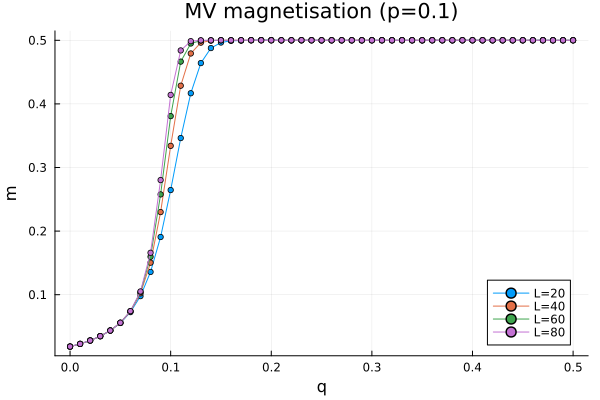

In [5]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.1
qs   = 0.0:0.01:0.5

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][10L] for q in valid_qs]
    plot!(plt, valid_qs, M1s, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="m", title="$algo magnetisation (p=$p)")
plt

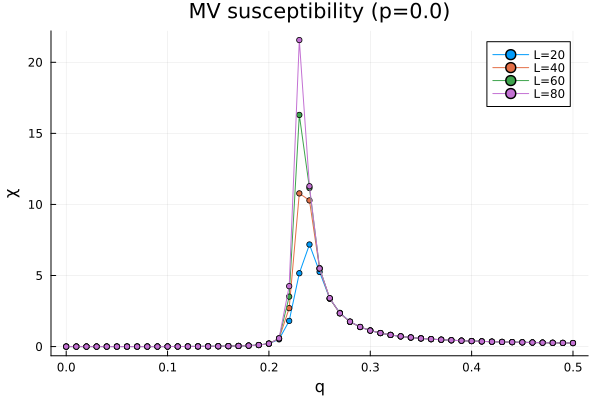

In [6]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qs   = 0.0:0.01:0.5

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][10L] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, NaN)][:M2s][10L] for q in valid_qs]
    plot!(plt, valid_qs, L^2*(M2s - M1s.^2), m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="χ", title="$algo susceptibility (p=$p)")
plt

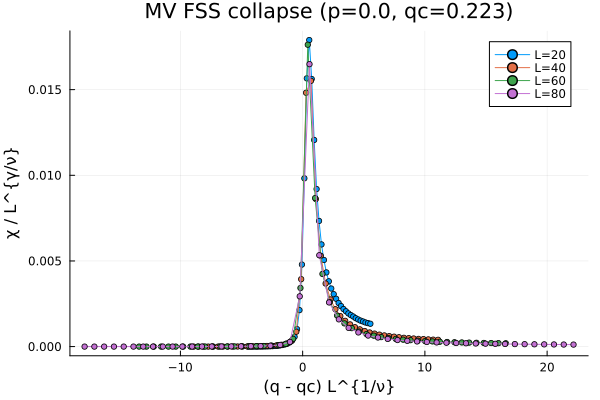

In [7]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qs   = 0.0:0.01:0.5

qc  = 0.223
ν   = 1.0
γ_ν = 7/4
z   = 2.17  # Glauber dynamics, 2D Ising

# t ~ L^z 

t(L) = round(Int, T * (L / maximum(Ls))^z)

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][t(L)] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, NaN)][:M2s][t(L)] for q in valid_qs]
    χ = L^2 .* (M2s .- M1s.^2)
    plot!(plt, (valid_qs .- qc) .* L^(1/ν), χ ./ L^γ_ν, m=3, label="L=$L")
end
plot!(plt, xlabel="(q - qc) L^{1/ν}", ylabel="χ / L^{γ/ν}", title="$algo FSS collapse (p=$p, qc=$(round(qc,digits=3)))")
plt

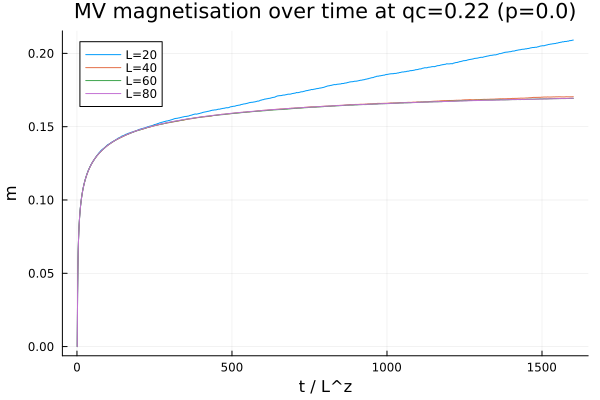

In [8]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qc   = 0.22
z    = 0.0

scaled_ts = [collect(1:length(all_results[(algo, L, T, p, qc, NaN)][:M1s])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, T, p, qc, NaN))]
t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    haskey(all_results, (algo, L, T, p, qc, NaN)) || continue
    M1s = all_results[(algo, L, T, p, qc, NaN)][:M1s]
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], M1s[mask] , label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="m", title="$algo magnetisation over time at qc=$qc (p=$p)")
plt

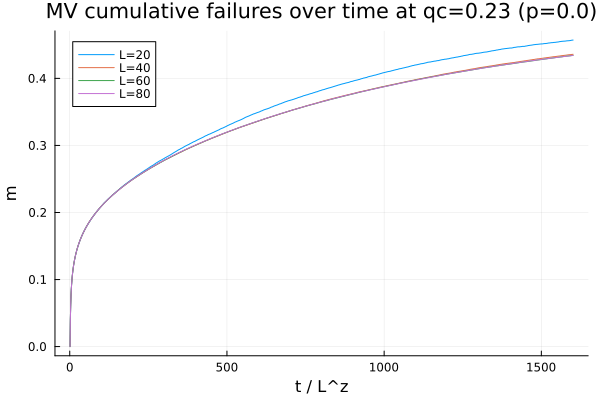

In [9]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qc   = 0.23
z    = 0.0

scaled_ts = [collect(1:length(all_results[(algo, L, T, p, qc, NaN)][:cumulative_failures])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, T, p, qc, NaN))]
t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    haskey(all_results, (algo, L, T, p, qc, NaN)) || continue
    M1s = all_results[(algo, L, T, p, qc, NaN)][:M1s]
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], M1s[mask] , label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="m", title="$algo cumulative failures over time at qc=$qc (p=$p)")
plt

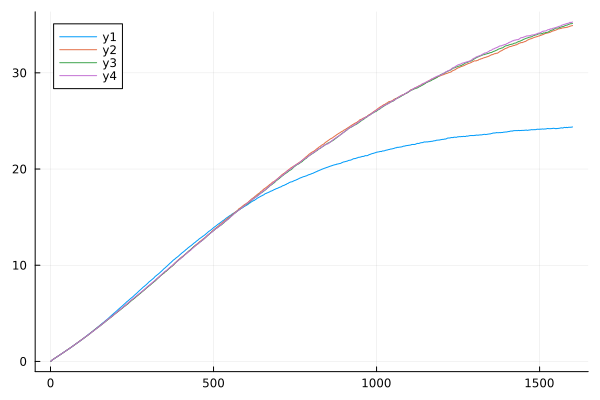

In [10]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qc   = 0.23

plt = plot()

for L in 20:20:80

    M1s = all_results[(algo, L, T, p, qc, NaN)][:M1s]
    M2s = all_results[(algo, L, T, p, qc, NaN)][:M2s]
    χ   = L^2 .* (M2s .- M1s.^2)

    plot!(plt, χ)
end
plt


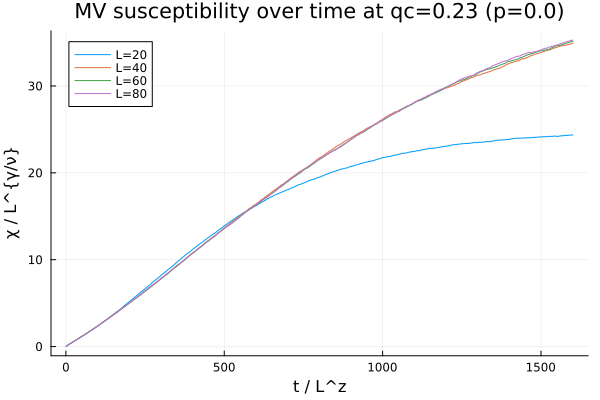

In [11]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qc   = 0.23
z    = 0.0
γ_ν  = 0.0

scaled_ts = [collect(1:length(all_results[(algo, L, T, p, qc, NaN)][:M1s])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, T, p, qc, NaN))]
t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    haskey(all_results, (algo, L, T, p, qc, NaN)) || continue
    M1s = all_results[(algo, L, T, p, qc, NaN)][:M1s]
    M2s = all_results[(algo, L, T, p, qc, NaN)][:M2s]
    χ   = L^2 .* (M2s .- M1s.^2)
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], χ[mask] ./ L^γ_ν, label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo susceptibility over time at qc=$qc (p=$p)")
plt

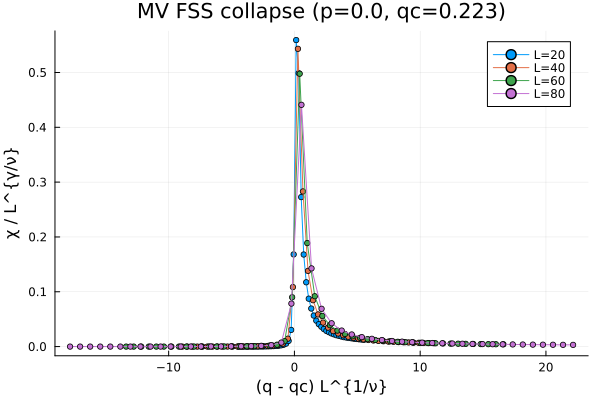

In [12]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qs   = 0.0:0.01:0.5

qc  = 0.223
ν   = 1.0
γ_ν = 1.0
z   = 1  # Glauber dynamics, 2D Ising

t(L) = round(Int, T * (L / maximum(Ls))^z)

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][t(L)] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, NaN)][:M2s][t(L)] for q in valid_qs]
    χ = L^2 .* (M2s .- M1s.^2)
    plot!(plt, (valid_qs .- qc) .* L^(1/ν), χ ./ L^γ_ν, m=3, label="L=$L")
end
plot!(plt, xlabel="(q - qc) L^{1/ν}", ylabel="χ / L^{γ/ν}", title="$algo FSS collapse (p=$p, qc=$(round(qc,digits=3)))")
plt

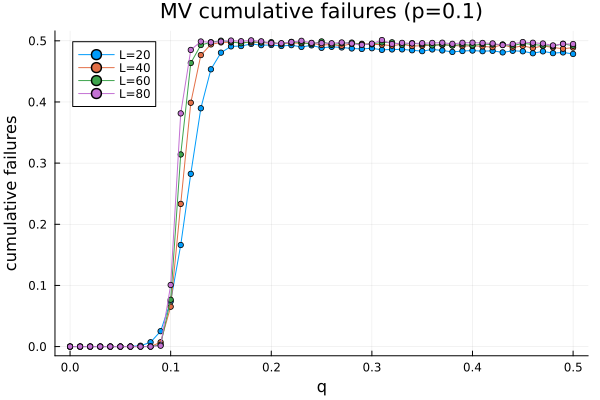

In [13]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.1
qs   = 0.0:0.01:0.5

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    cf = [all_results[(algo, L, T, p, q, NaN)][:instant_failures][10L] for q in valid_qs]
    plot!(plt, valid_qs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="cumulative failures", title="$algo cumulative failures (p=$p)")
plt

# Ising ML

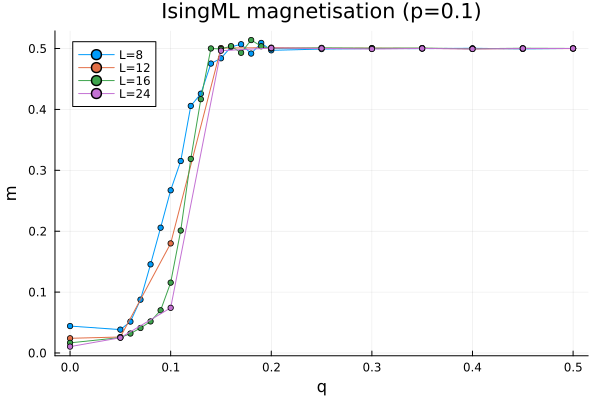

In [14]:
algo = "IsingML"
Ls   = [8, 12, 16, 24]
p    = 0.1
c    = 0.1
qs   = 0.0:0.01:0.5
plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    M1s = [all_results[(algo, L, T, p, q, c)][:M1s][10L] for q in valid_qs]
    plot!(plt, valid_qs, M1s, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="m", title="$algo magnetisation (p=$p)")
plt

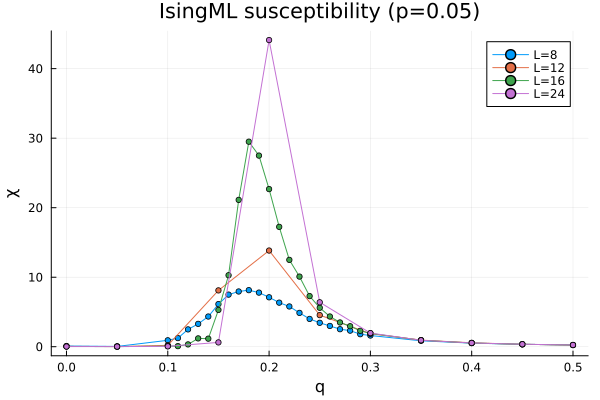

In [15]:
algo = "IsingML"
Ls   = [8, 12, 16, 24]
p    = 0.05
c    = 0.1
qs   = 0.0:0.01:0.5
plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    M1s = [all_results[(algo, L, T, p, q, c)][:M1s][10L] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, c)][:M2s][10L] for q in valid_qs]
    plot!(plt, valid_qs, L^2*(M2s - M1s.^2), m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="χ", title="$algo susceptibility (p=$p)")
plt

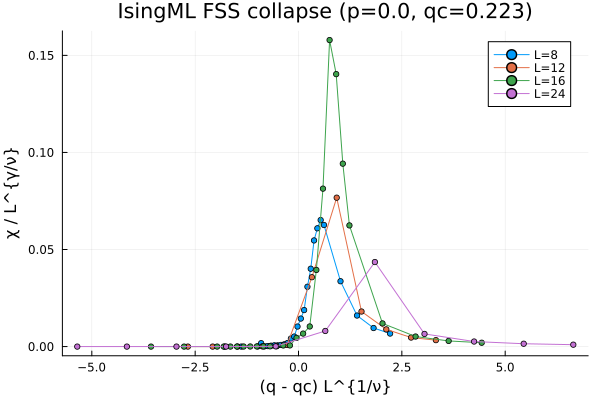

In [16]:
algo = "IsingML"
Ls   = [8, 12, 16, 24]
p    = 0.0
c    = 0.1
qs   = 0.0:0.01:0.5
qc   = 0.223
ν    = 1.0
γ_ν  = 7/4
z    = 2.17
plt = plot()
for L in Ls
    T = 20L
    t = round(Int, T * (L / maximum(Ls))^z)
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    M1s = [all_results[(algo, L, T, p, q, c)][:M1s][t] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, c)][:M2s][t] for q in valid_qs]
    χ = L^2 .* (M2s .- M1s.^2)
    plot!(plt, (valid_qs .- qc) .* L^(1/ν), χ ./ L^γ_ν, m=3, label="L=$L")
end
plot!(plt, xlabel="(q - qc) L^{1/ν}", ylabel="χ / L^{γ/ν}", title="$algo FSS collapse (p=$p, qc=$(round(qc,digits=3)))")
plt

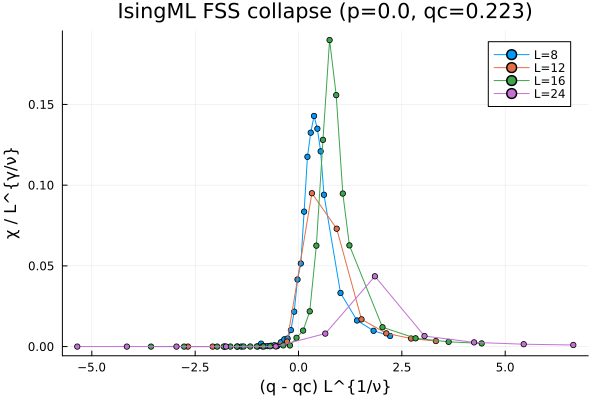

In [17]:
algo = "IsingML"
Ls   = [8, 12, 16, 24]
p    = 0.0
c    = 0.1
qs   = 0.0:0.01:0.5
qc   = 0.223
ν    = 1.0
γ_ν  = 7/4
z    = 1
plt = plot()
for L in Ls
    T = 20L
    t = round(Int, T * (L / maximum(Ls))^z)
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    M1s = [all_results[(algo, L, T, p, q, c)][:M1s][t] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, c)][:M2s][t] for q in valid_qs]
    χ = L^2 .* (M2s .- M1s.^2)
    plot!(plt, (valid_qs .- qc) .* L^(1/ν), χ ./ L^γ_ν, m=3, label="L=$L")
end
plot!(plt, xlabel="(q - qc) L^{1/ν}", ylabel="χ / L^{γ/ν}", title="$algo FSS collapse (p=$p, qc=$(round(qc,digits=3)))")
plt

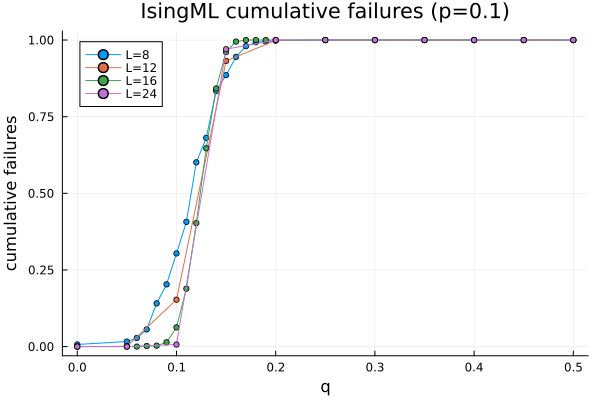

In [18]:
algo = "IsingML"
Ls   = [8, 12, 16, 24]
p    = 0.1
c    = 0.1
qs   = 0.0:0.01:0.5
plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for q in valid_qs]
    plot!(plt, valid_qs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="cumulative failures", title="$algo cumulative failures (p=$p)")
plt

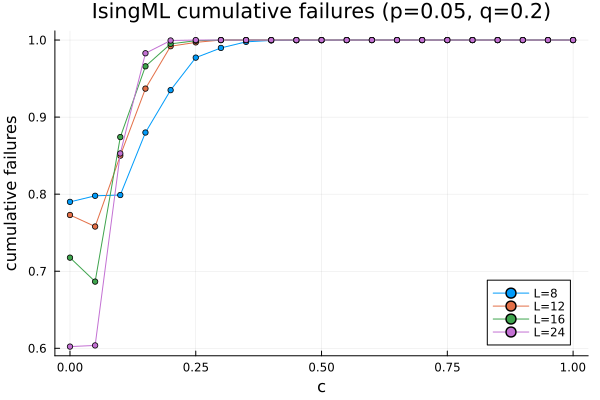

In [19]:
algo = "IsingML"
Ls   = [8, 12, 16, 24]
p    = 0.05
q    = 0.2
cs   = 0.0:0.05:1.0
plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

In [20]:
all_results[("IsingML", 24, 20*24, 0.2, 0.1, 0.6)][:cumulative_failures]

481-element Vector{Float64}:
 0.0
 0.001
 0.008
 0.0135
 0.0245
 0.0325
 0.0405
 0.0475
 0.056
 0.0645
 ⋮
 0.973
 0.973
 0.974
 0.974
 0.974
 0.974
 0.9745
 0.9745
 0.9745

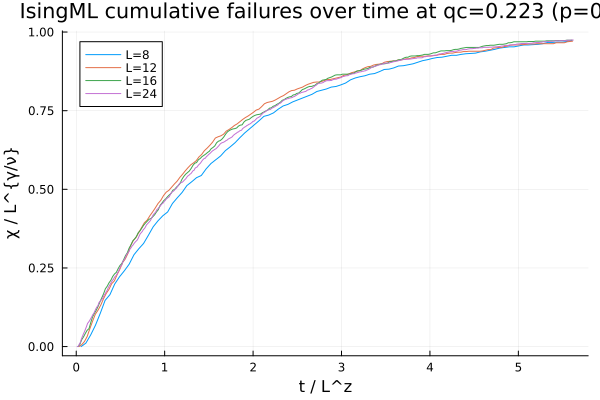

In [21]:
algo = "IsingML"
Ls   = [8,12,16,24]
p    = 0.2
q   = 0.1
c = 0.6

z    = 1.4
γ_ν  = 0

scaled_ts = [collect(1:length(all_results[(algo, L, 20L, p, q, c)][:cumulative_failures])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, 20L, p, q, c))]
t_max = minimum(maximum.(scaled_ts))

# println(t_max)

plt = plot()
for L in Ls
    T = 20L
    haskey(all_results, (algo, L, T, p, q, c)) || continue
    M1s = all_results[(algo, L, T, p, q, c)][:cumulative_failures]
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], M1s[mask], label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo cumulative failures over time at qc=$qc (p=$p)")
plt

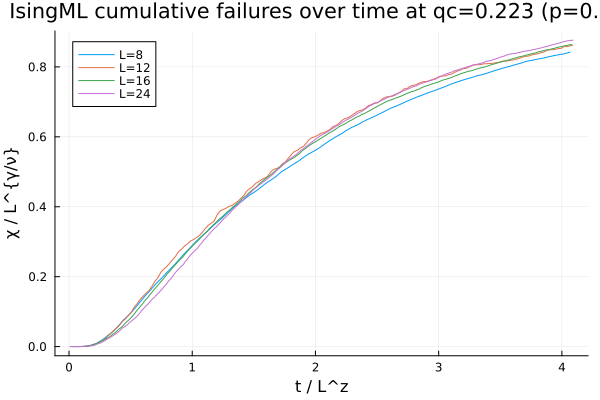

In [22]:
algo = "IsingML"
Ls   = [8,12,16,24]
p    = 0.05
q   = 0.2
c = 0.05

z    = 1.5
γ_ν  = 0

scaled_ts = [collect(1:length(all_results[(algo, L, 20L, p, q, c)][:cumulative_failures])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, 20L, p, q, c))]
t_max = minimum(maximum.(scaled_ts))

# println(t_max)

plt = plot()
for L in Ls
    T = 20L
    haskey(all_results, (algo, L, T, p, q, c)) || continue
    M1s = all_results[(algo, L, T, p, q, c)][:cumulative_failures]
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], M1s[mask], label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo cumulative failures over time at qc=$qc (p=$p)")
plt

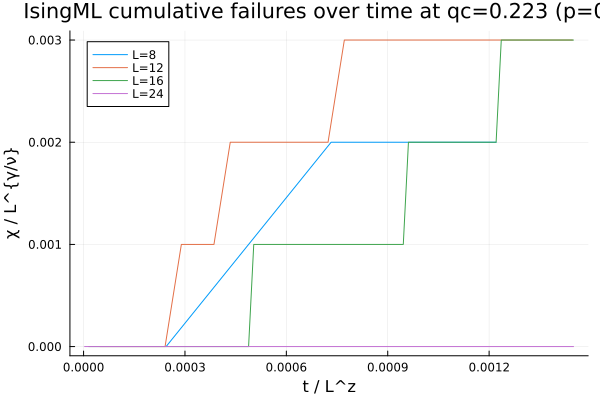

In [23]:
algo = "IsingML"
Ls   = [8,12,16,24]
p    = 0.2
q   = 0.05
c = 0.6

z    = 4
γ_ν  = 0

scaled_ts = [collect(1:length(all_results[(algo, L, 20L, p, q, c)][:cumulative_failures])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, 20L, p, q, c))]
t_max = minimum(maximum.(scaled_ts))

# println(t_max)

plt = plot()
for L in Ls
    T = 20L
    haskey(all_results, (algo, L, T, p, q, c)) || continue
    M1s = all_results[(algo, L, T, p, q, c)][:cumulative_failures]
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], M1s[mask], label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo cumulative failures over time at qc=$qc (p=$p)")
plt

In [24]:
haskey(all_results, ("IsingML", 24, 20*24, 0.3, 0.05, 1.0))

true

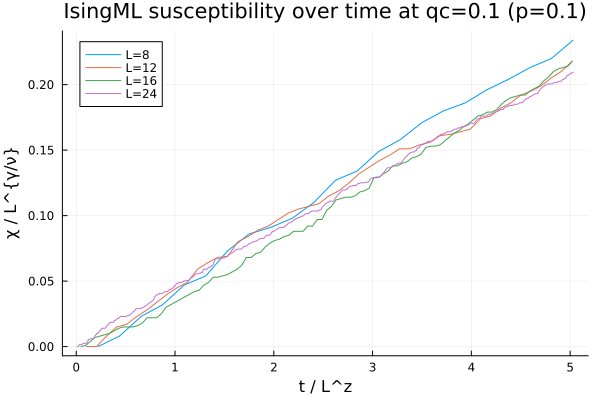

In [25]:
algo = "IsingML"
Ls   = [8,12,16,24]
p    = 0.1
qc   = 0.1
c = 0.6
f(L) = exp(0.19L)
γ_ν  = 0.0

scaled_ts = [collect(1:length(all_results[(algo, L, 20L, p, qc, c)][:M1s])) ./ f(L)
             for L in Ls if haskey(all_results, (algo, L, 20L, p, qc, c))]

t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    T = 20L
    haskey(all_results, (algo, L, T, p, qc, c)) || continue
    failures = all_results[(algo, L, T, p, qc, c)][:cumulative_failures]
    ts  = collect(1:length(failures)) ./ f(L)
    mask = ts .<= t_max
    plot!(plt, ts[mask], failures[mask] ./ L^γ_ν, label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo susceptibility over time at qc=$qc (p=$p)")
plt

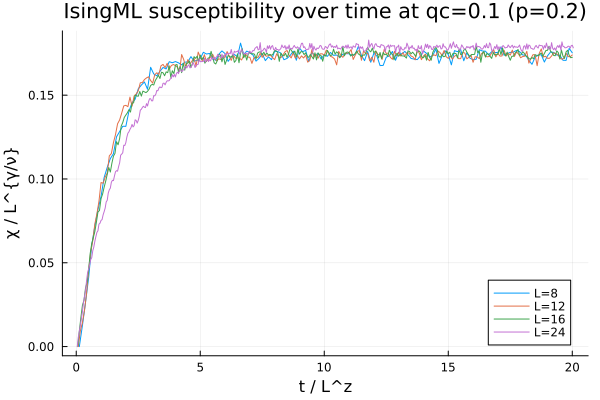

In [26]:
algo = "IsingML"
Ls   = [8,12,16,24]
p    = 0.2
qc   = 0.1
c = 0.6
z    = 1.0
γ_ν  = 2

scaled_ts = [collect(1:length(all_results[(algo, L, 20L, p, qc, c)][:M1s])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, 20L, p, qc, c))]

t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    T = 20L
    haskey(all_results, (algo, L, T, p, qc, c)) || continue
    M1s = all_results[(algo, L, T, p, qc, c)][:M1s]
    M2s = all_results[(algo, L, T, p, qc, c)][:M2s]
    χ   = L^2 .* (M2s .- M1s.^2)
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], χ[mask] ./ L^γ_ν, label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo susceptibility over time at qc=$qc (p=$p)")
plt

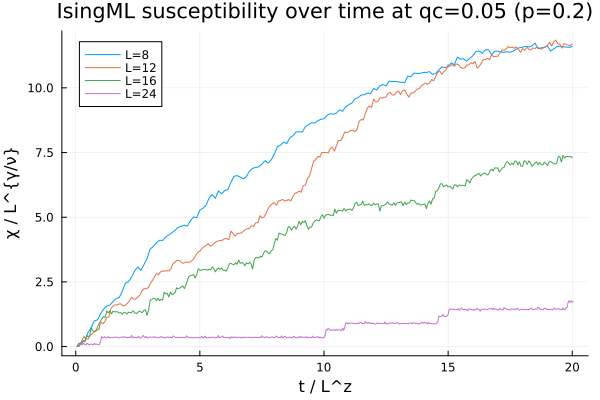

In [27]:
algo = "IsingML"
Ls   = [8,12,16,24]
p    = 0.2
qc   = 0.05
c = 1.0
z    = 1.0
γ_ν  = 0.0

scaled_ts = [collect(1:length(all_results[(algo, L, 20L, p, qc, c)][:M1s])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, 20L, p, qc, c))]

t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    T = 20L
    haskey(all_results, (algo, L, T, p, qc, c)) || continue
    M1s = all_results[(algo, L, T, p, qc, c)][:M1s]
    M2s = all_results[(algo, L, T, p, qc, c)][:M2s]
    χ   = L^2 .* (M2s .- M1s.^2)
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], χ[mask] ./ L^γ_ν, label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo susceptibility over time at qc=$qc (p=$p)")
plt

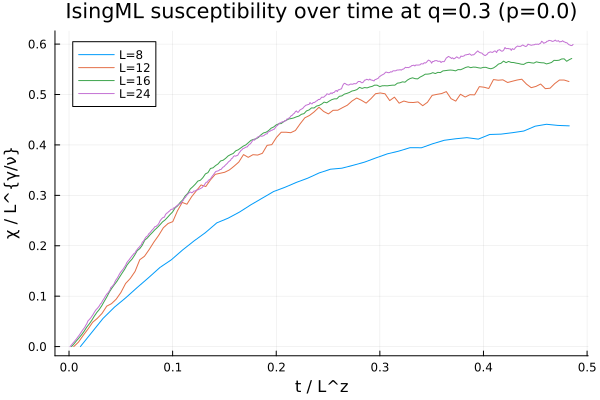

In [28]:
algo = "IsingML"
Ls   = [8,12,16,24]
p    = 0.0
q   = 0.3
c = 0.0
z    = 2.17
γ_ν  = 1.0

scaled_ts = [collect(1:length(all_results[(algo, L, 20L, p, q, c)][:M1s])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, 20L, p, q, c))]
t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    T = 20L
    haskey(all_results, (algo, L, T, p, q, c)) || continue
    M1s = all_results[(algo, L, T, p, q, c)][:M1s]
    M2s = all_results[(algo, L, T, p, q, c)][:M2s]
    χ   = L^2 .* (M2s .- M1s.^2)
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], χ[mask] ./ L^γ_ν, label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo susceptibility over time at q=$q (p=$p)")
plt

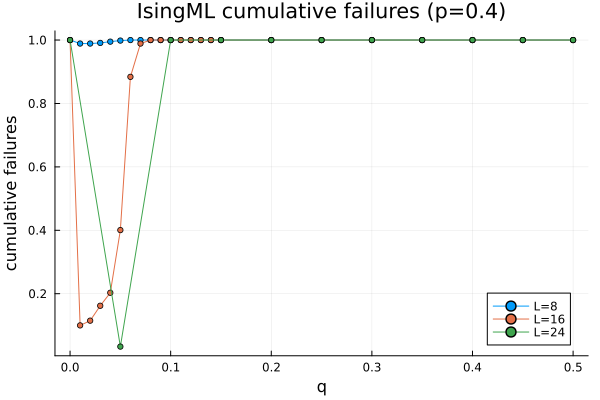

In [30]:
algo = "IsingML"
Ls   = [8, 16, 24]
p    = 0.4
c    = 0.5
qs   = 0.0:0.01:0.5
qc = 0.1
ν = 4/3
plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for q in valid_qs]
    plot!(plt, valid_qs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="cumulative failures", title="$algo cumulative failures (p=$p)")#, xlim=(-0.5,0.5))
plt

In [31]:
4*0.05*0.95

0.19

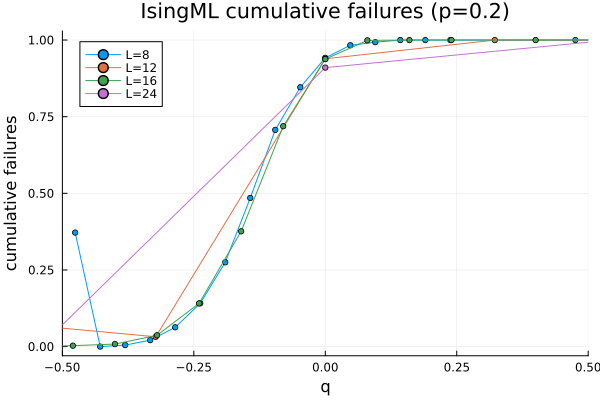

In [32]:
algo = "IsingML"
Ls   = [8, 12, 16, 24]
p    = 0.2
c    = 0.4
qs   = 0.0:0.01:0.5
qc = 0.1
ν = 4/3
plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for q in valid_qs]
    plot!(plt, (valid_qs .- qc) * L^(1/ν), cf, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="cumulative failures", title="$algo cumulative failures (p=$p)", xlim=(-0.5,0.5))
plt

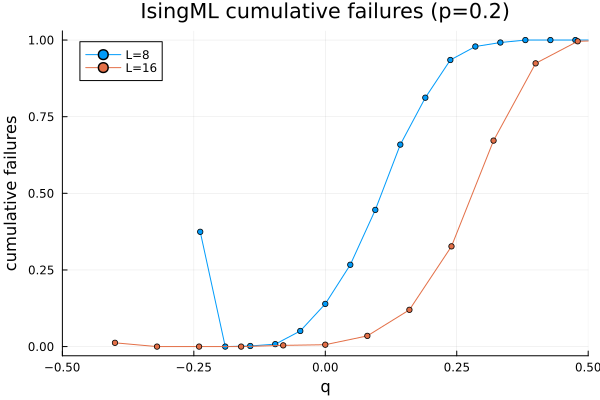

In [33]:
algo = "IsingML"
Ls   = [8, 16]
p    = 0.2
c    = 0.45
qs   = 0.0:0.01:0.5
qc = 0.05
ν = 4/3
plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for q in valid_qs]
    plot!(plt, (valid_qs .- qc) * L^(1/ν), cf, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="cumulative failures", title="$algo cumulative failures (p=$p)", xlim=(-0.5,0.5))
plt

# Phase diagram

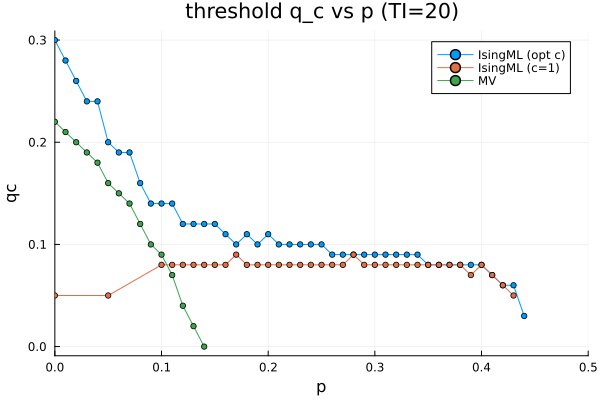

In [43]:
# ── Time index control ────────────────────────────────────────────────────────
const TI = 20   # set to 10 or 20
# ─────────────────────────────────────────────────────────────────────────────

function find_qc_IsingML(algo, p, Ls, cs, qs; cf_threshold=0.95, min_advantage=0.0)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
        valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
        common_cs = intersect(valid_cs_small, valid_cs_large)
        isempty(common_cs) && continue
        cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][TI*L_small] for c in common_cs]
        cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][TI*L_large] for c in common_cs]
        any(cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold) && return q
    end
    return NaN
end

function find_qc_MV(algo, p, Ls, qs, T; cf_threshold=0.95)
    for q in reverse(qs)
        cfs = Float64[]
        for L in Ls
            haskey(all_results, (algo, L, T, p, q, NaN)) || break
            push!(cfs, all_results[(algo, L, T, p, q, NaN)][:cumulative_failures][TI*L])
        end
        length(cfs) < length(Ls) && continue
        issorted(cfs, rev=true) && last(cfs) < cf_threshold && return q
    end
    return NaN
end

function find_qc_IsingML_fixed_c(algo, p, Ls, qs, c; cf_threshold=0.95)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        haskey(all_results, (algo, L_small, T_small, p, q, c)) || continue
        haskey(all_results, (algo, L_large, T_large, p, q, c)) || continue
        cf_small = all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][TI*L_small]
        cf_large = all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][TI*L_large]
        cf_large < cf_small && cf_large < cf_threshold && return q
    end
    return NaN
end

ps_ising = 0.00:0.01:0.5
ps_mv    = 0.0:0.01:0.5
qcs_ising    = [find_qc_IsingML("IsingML", p, 8:8:16, 0.0:0.05:1.0, 0.0:0.01:0.5; cf_threshold=1.0) for p in ps_ising]
qcs_ising_c1 = [find_qc_IsingML_fixed_c("IsingML", p, 8:8:16, 0.0:0.01:0.5, 1.0; cf_threshold=1.0) for p in ps_ising]
qcs_mv       = [find_qc_MV("MV", p, 20:20:80, 0.0:0.01:0.5, 1600) for p in ps_mv]

plt = plot()
valid_ising    = .!isnan.(qcs_ising)
valid_ising_c1 = .!isnan.(qcs_ising_c1)
valid_mv       = .!isnan.(qcs_mv)
plot!(plt, ps_ising[valid_ising],    qcs_ising[valid_ising],       m=3, label="IsingML (opt c)")
plot!(plt, ps_ising[valid_ising_c1], qcs_ising_c1[valid_ising_c1], m=3, label="IsingML (c=1)")
plot!(plt, ps_mv[valid_mv],          qcs_mv[valid_mv],             m=3, label="MV")
plot!(plt, xlabel="p", ylabel="qc", title="threshold q_c vs p (TI=$TI)", xlim=(0,0.5))
plt

In [49]:
# [ps_mv[valid_mv] qcs_mv[valid_mv]]
# [ps_ising[valid_ising_c1] qcs_ising_c1[valid_ising_c1]]
[ps_ising[valid_ising][20:end] qcs_ising[valid_ising][20:end]]

26×2 Matrix{Float64}:
 0.19  0.1
 0.2   0.11
 0.21  0.1
 0.22  0.1
 0.23  0.1
 0.24  0.1
 0.25  0.1
 0.26  0.09
 0.27  0.09
 0.28  0.09
 ⋮     
 0.36  0.08
 0.37  0.08
 0.38  0.08
 0.39  0.08
 0.4   0.08
 0.41  0.07
 0.42  0.06
 0.43  0.06
 0.44  0.03

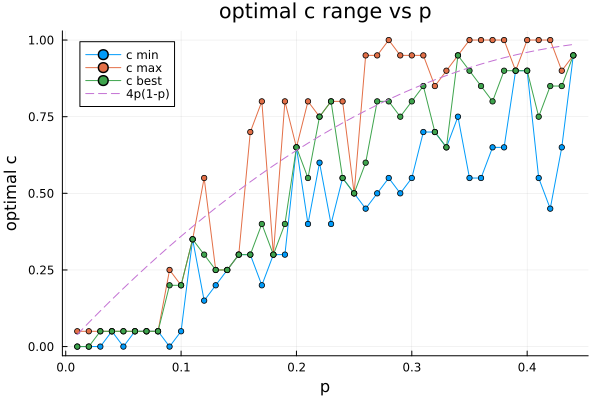

In [35]:
function find_qc_IsingML_with_c(algo, p, Ls, cs, qs; cf_threshold=0.95, min_advantage=0.0)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
        valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
        common_cs = intersect(valid_cs_small, valid_cs_large)
        isempty(common_cs) && continue
        cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][20L_small] for c in common_cs]
        cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][20L_large] for c in common_cs]
        mask = cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold
        if any(mask)
            valid_cs  = common_cs[mask]
            cf_small_v = cf_small[mask]
            cf_large_v = cf_large[mask]
            best_c = valid_cs[argmax(cf_small_v .- cf_large_v)]
            return q, minimum(valid_cs), maximum(valid_cs), best_c
        end
    end
    return NaN, NaN, NaN, NaN
end

ps_ising = 0.01:0.01:0.5
results_ising = [find_qc_IsingML_with_c("IsingML", p, 8:8:16, 0.0:0.05:1.0, 0.0:0.01:0.5; cf_threshold=1.0) for p in ps_ising]
qcs_ising, cs_min, cs_max, cs_best = zip(results_ising...)

valid    = .!isnan.(collect(qcs_ising))
ps_v     = ps_ising[valid]
cs_min_v  = collect(cs_min)[valid]
cs_max_v  = collect(cs_max)[valid]
cs_best_v = collect(cs_best)[valid]

plt_qc = plot()
plt_c  = plot()
plot!(plt_qc, ps_v, collect(qcs_ising)[valid], m=3, label="IsingML (opt c)")
plot!(plt_qc, xlabel="p", ylabel="qc", title="threshold q_c vs p")
plot!(plt_c, ps_v, cs_min_v,  m=3, label="c min")
plot!(plt_c, ps_v, cs_max_v,  m=3, label="c max")
plot!(plt_c, ps_v, cs_best_v, m=3, label="c best")
plot!(plt_c, ps_v, 4 .* ps_v .* (1 .- ps_v), label="4p(1-p)", linestyle=:dash)

k = 0.29
# plot!(plt_c, ps_v, 2*(k .- collect(qcs_ising)[valid]) ./ (1 .- 2*collect(qcs_ising)[valid]), label="4p(1-p)", linestyle=:dash)


# plot!(plt_c, ps_v, (4 .* ps_v .* (1 .- ps_v)) .^ 4, label="4p(1-p)", linestyle=:dash)
plot!(plt_c, xlabel="p", ylabel="optimal c", title="optimal c range vs p")
plot(plt_c)

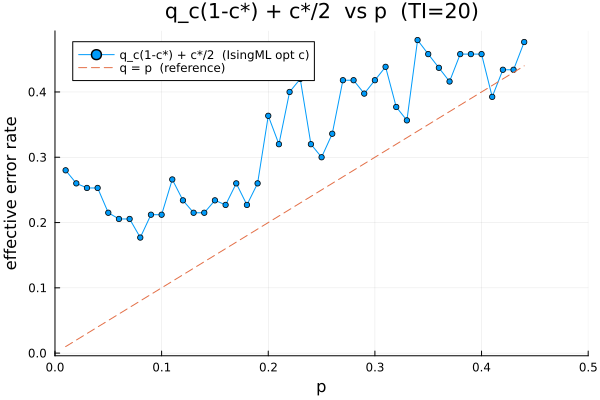

In [36]:
# ── Time index control ────────────────────────────────────────────────────────
const TI = 20   # set to 10 or 20
# ─────────────────────────────────────────────────────────────────────────────

function find_qc_IsingML_with_c(algo, p, Ls, cs, qs; cf_threshold=0.95, min_advantage=0.0)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
        valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
        common_cs = intersect(valid_cs_small, valid_cs_large)
        isempty(common_cs) && continue
        cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][TI*L_small] for c in common_cs]
        cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][TI*L_large] for c in common_cs]
        mask = cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold
        if any(mask)
            valid_cs_m  = common_cs[mask]
            cf_small_v  = cf_small[mask]
            cf_large_v  = cf_large[mask]
            best_c = valid_cs_m[argmax(cf_small_v .- cf_large_v)]
            return q, minimum(valid_cs_m), maximum(valid_cs_m), best_c
        end
    end
    return NaN, NaN, NaN, NaN
end

ps_ising     = 0.01:0.01:0.5
results_ising = [find_qc_IsingML_with_c("IsingML", p, 8:8:16, 0.0:0.05:1.0, 0.0:0.01:0.5; cf_threshold=1.0) for p in ps_ising]
qcs_ising, cs_min, cs_max, cs_best = zip(results_ising...)

valid     = .!isnan.(collect(qcs_ising))
ps_v      = ps_ising[valid]
qcs_v     = collect(qcs_ising)[valid]
cs_best_v = collect(cs_best)[valid]

# ── effective error rate: q*(1-c) + c/2 ──────────────────────────────────────
eff_v = qcs_v .* (1 .- cs_best_v) .+ cs_best_v ./ 2

plt = plot()
plot!(plt, ps_v, eff_v, m=3, label="q_c(1-c*) + c*/2  (IsingML opt c)")
plot!(plt, ps_v, ps_v,  linestyle=:dash, label="q = p  (reference)")
plot!(plt, xlabel="p", ylabel="effective error rate",
      title="q_c(1-c*) + c*/2  vs p  (TI=$TI)",
      xlim=(0, 0.5))
plt


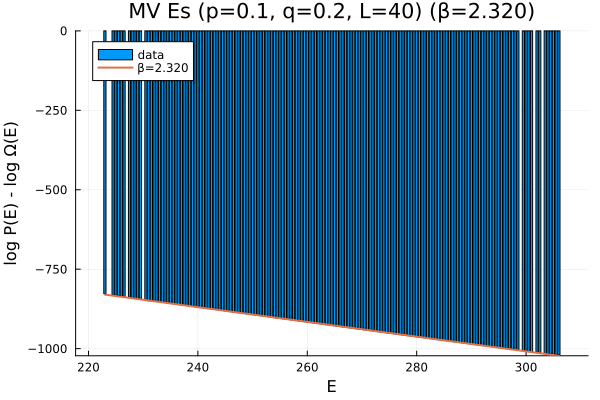

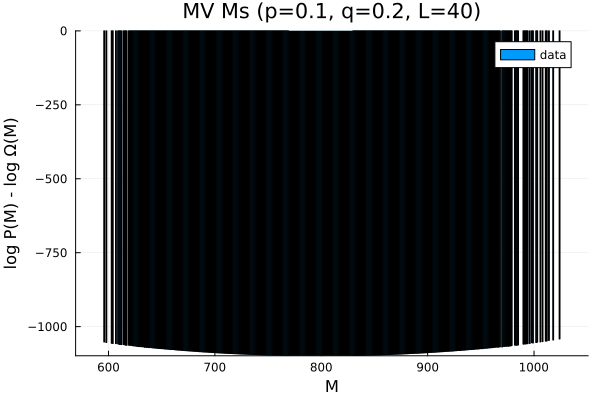

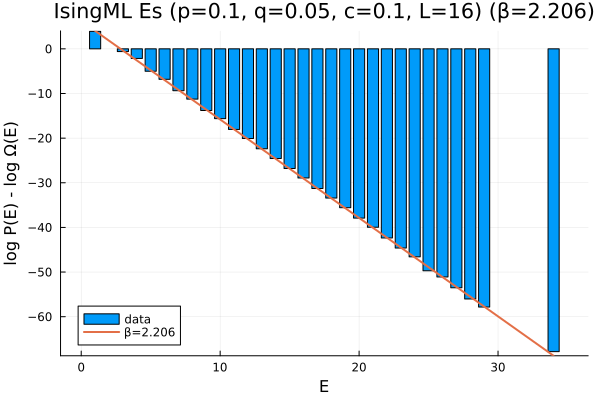

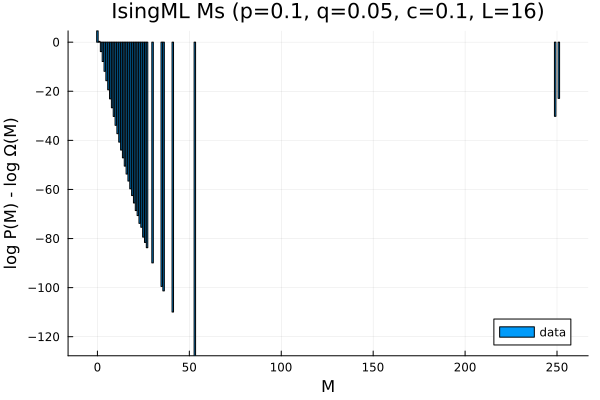

UndefVarError: UndefVarError: `initialstate` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [25]:
using Printf

# ── Shared helpers ────────────────────────────────────────────────────────────
function energy_plot(raw, L; bin_scale=1, title="")
    reversed  = reverse(raw)
    support   = reversed .> 0
    xs        = (bin_scale .* (1:length(reversed)))[support]
    ys        = log.(Float64.(reversed[support])) .- log.(counts[L])[1:length(reversed)][support]
    finite    = isfinite.(ys)
    xs_f, ys_f = xs[finite], ys[finite]
    fit = [ones(length(xs_f)) xs_f] \ ys_f
    β   = @sprintf("%.3f", -fit[2])
    plt = bar(xs, ys, label="data")
    plot!(plt, xs_f, fit[1] .+ fit[2] .* xs_f, lw=2, label="β=$β")
    plot!(plt, xlabel="E", ylabel="log P(E) - log Ω(E)", title="$title (β=$β)")
    plt
end

function magnet_plot(raw, L; title="")
    support  = raw .> 0
    xs       = (0:L^2)[support]
    ys       = log.(Float64.(raw[support])) .- [log_binom(L^2, k) for k in 0:L^2][support]
    plt = bar(xs, ys, label="data")
    plot!(plt, xlabel="M", ylabel="log P(M) - log Ω(M)", title=title)
    plt
end

# ── MV ────────────────────────────────────────────────────────────────────────
let algo="MV", L=40, T=1600, p=0.1, q=0.2, col=20
    res = all_results[(algo, L, T, p, q, NaN)]
    # Es: pair adjacent bins, half-integer bin centres
    h   = res[:Es_hist][:, col]
    raw = h[1:2:end-1] .+ h[2:2:end]
    display(energy_plot(raw, L; bin_scale=0.5, title="MV Es (p=$p, q=$q, L=$L)"))
    # Ms: no reversal
    display(magnet_plot(res[:Ms_hist][:, col], L; title="MV Ms (p=$p, q=$q, L=$L)"))
end

# ── IsingML ───────────────────────────────────────────────────────────────────
let algo="IsingML", L=16, T=20L, p=0.1, q=0.05, c=0.1, col=20
    res = all_results[(algo, L, T, p, q, c)]
    # Es: take every other bin
    display(energy_plot(res[:Es_hist][:, col][1:2:end], L; title="IsingML Es (p=$p, q=$q, c=$c, L=$L)"))
    # Ms: no reversal
    display(magnet_plot(res[:Ms_hist][:, col], L; title="IsingML Ms (p=$p, q=$q, c=$c, L=$L)"))
end

# ── One-shot noise sample ─────────────────────────────────────────────────────
let p=0.45, samples=10000
    for L in [20, 40]
        Ms_hist_s, Es_hist_s = sample_noise(L, p, samples)
        display(energy_plot(Es_hist_s[1:2:end], L; title="Noise Es (p=$p, L=$L)"))
        display(magnet_plot(Ms_hist_s, L;            title="Noise Ms (p=$p, L=$L)"))
    end
end

sample_noise (generic function with 2 methods)

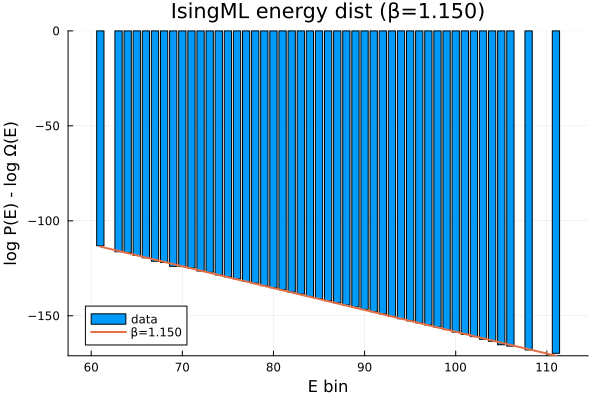

In [664]:


algo = "IsingML"
L    = 16
T    = 20L
p    = 0.1
q    = 0.3
c    = 0.0

raw       = all_results[(algo, L, T, p, q, c)][:Es_hist][:,20][1:2:end]
reversed  = reverse(raw)
support   = reversed .> 0
xs        = Float64.((1:length(reversed))[support])
logEs     = log.(Float64.(reversed[support]))
logcounts = log.(counts[L])[1:length(reversed)][support]
ys        = logEs .- logcounts

finite    = isfinite.(ys)
xs_f, ys_f = xs[finite], ys[finite]

fit = [ones(length(xs_f)) xs_f] \ ys_f
β   = @sprintf("%.3f", -fit[2])

plt = bar(xs, ys, label="data")
plot!(plt, xs_f, fit[1] .+ fit[2] .* xs_f, lw=2, label="β=$β")
plot!(plt, xlabel="E bin", ylabel="log P(E) - log Ω(E)", title="$algo energy dist (β=$β)")
plt

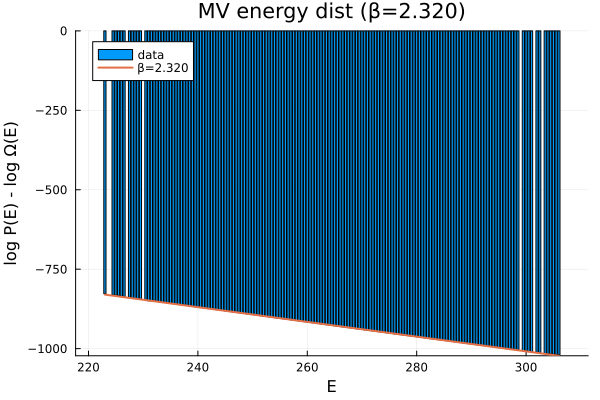

In [512]:
using Printf

algo = "MV"
L    = 40
T    = 1600
p    = 0.1
q    = 0.2

raw       = all_results[(algo, L, T, p, q, NaN)][:Es_hist][:,20][1:2:end-1] .+ all_results[(algo, L, T, p, q, NaN)][:Es_hist][:,20][2:2:end]
reversed  = reverse(raw)
support   = reversed .> 0
xs        = Float64.((1:length(reversed))[support]) ./ 2
logEs     = log.(Float64.(reversed[support]))
logcounts = log.(counts[L])[1:length(reversed)][support]
ys        = logEs .- logcounts

finite    = isfinite.(ys)
xs_f, ys_f = xs[finite], ys[finite]

fit = [ones(length(xs_f)) xs_f] \ ys_f
β   = @sprintf("%.3f", -fit[2])

plt = bar(xs, ys, label="data")
plot!(plt, xs_f, fit[1] .+ fit[2] .* xs_f, lw=2, label="β=$β")
plot!(plt, xlabel="E", ylabel="log P(E) - log Ω(E)", title="$algo energy dist (β=$β)")
plt

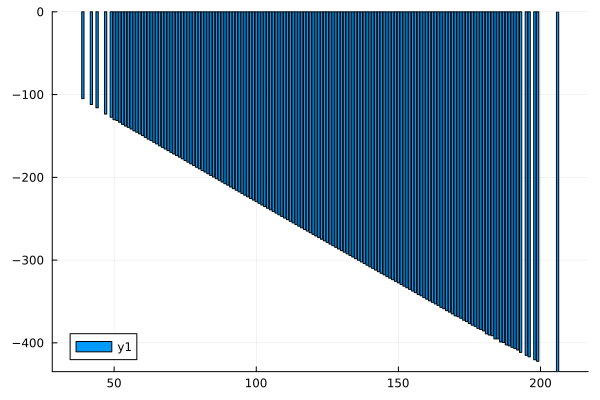

In [201]:
algo = "MV"
L    = 40
T    = 1600
p    = 0.1
q    = 0.05

raw       = all_results[(algo, L, T, p, q, NaN)][:Es_hist][:,20][1:2:end]
reversed  = reverse(raw)
support   = reversed .> 0
xs        = (1:length(reversed))[support]
logEs     = log.(reversed[support])
logcounts = log.(counts[L])[1:length(reversed)][support]

bar(xs, logEs .- logcounts)

In [218]:
p       = 0.1
samples = 10000

L = 20
Ms_hist_s, Es_hist_s = sample_noise(L, p, samples)

(Int32[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0], Int32[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

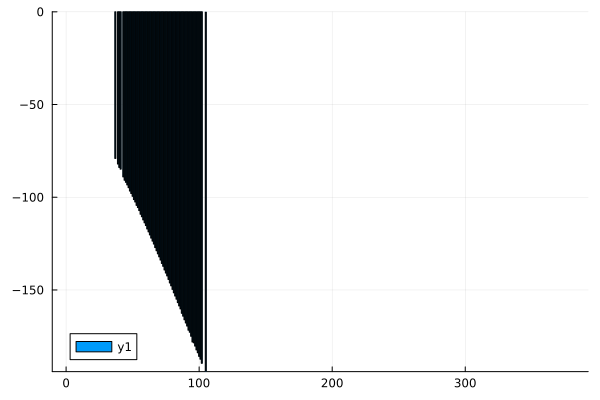

In [225]:
algo = "MV"
L = 20
T = 1600
p = 0.1
q = 0.05

plt = plot()

logEs = log.(reverse(Es_hist_s[1:2:end]))
logcounts = log.(counts[L])[1:length(logEs)]

bar(logEs .- logcounts)

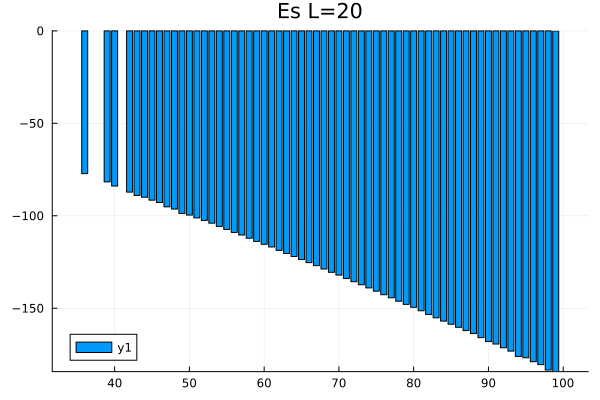

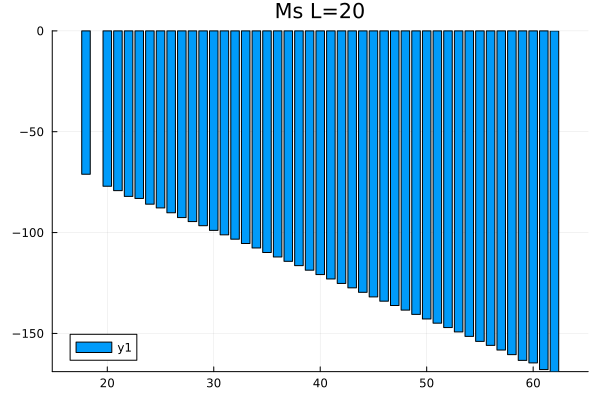

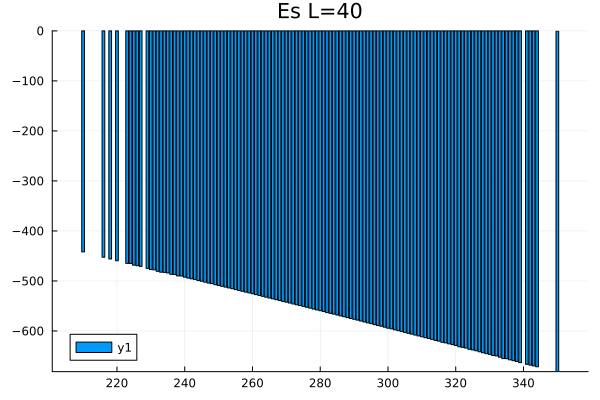

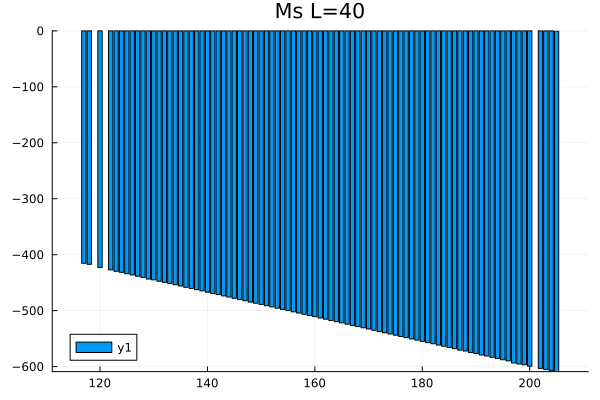

In [230]:
p       = 0.1
samples = 10000

for L in [20, 40]
    Ms_hist_s, Es_hist_s = sample_noise(L, p, samples)

    # Es
    raw      = Es_hist_s[1:2:end]
    reversed = reverse(raw)
    support  = reversed .> 0
    xs       = (1:length(reversed))[support]
    display(bar(xs, log.(Float64.(reversed[support])) .- log.(counts[L])[1:length(reversed)][support], title="Es L=$L"))

    # Ms
    reversed = Ms_hist_s
    support  = reversed .> 0
    xs       = (0:L^2)[support]
    display(bar(xs, log.(Float64.(reversed[support])) .- [log_binom(L^2, k) for k in 0:L^2][support], title="Ms L=$L"))
end

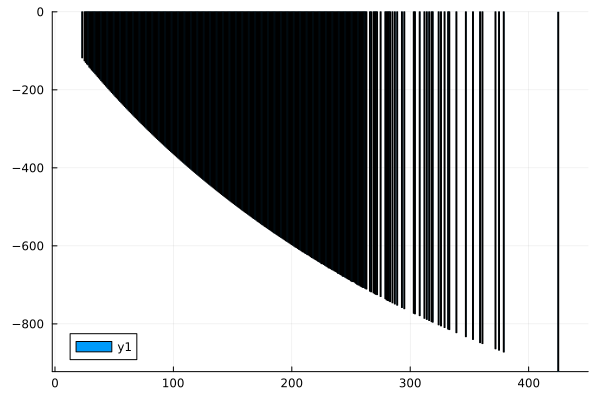

In [231]:
algo = "MV"
L    = 40
T    = 1600
p    = 0.1
q    = 0.05

raw      = all_results[(algo, L, T, p, q, NaN)][:Ms_hist][:,30]
reversed = raw
support  = reversed .> 0
xs       = (0:L^2)[support]
logMs    = log.(reversed[support])
logbinom = [log_binom(L^2, k) for k in 0:L^2][support]

bar(xs, logMs .- logbinom)

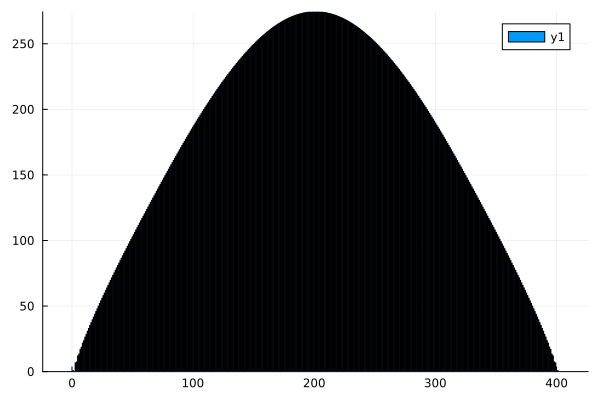

In [155]:
bar(log.(counts[20]))

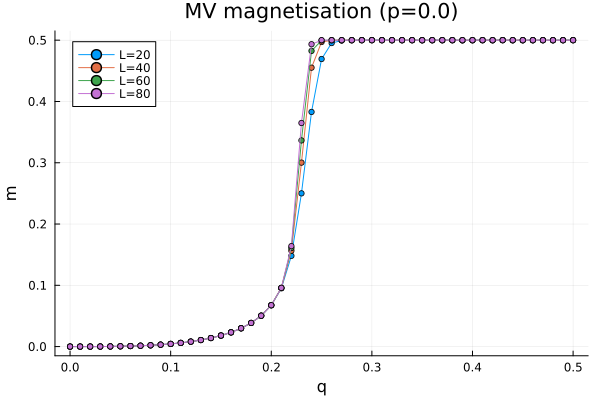

In [143]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qs   = 0.0:0.01:0.5

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][10L] for q in valid_qs]
    plot!(plt, valid_qs, M1s, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="m", title="$algo magnetisation (p=$p)")
plt

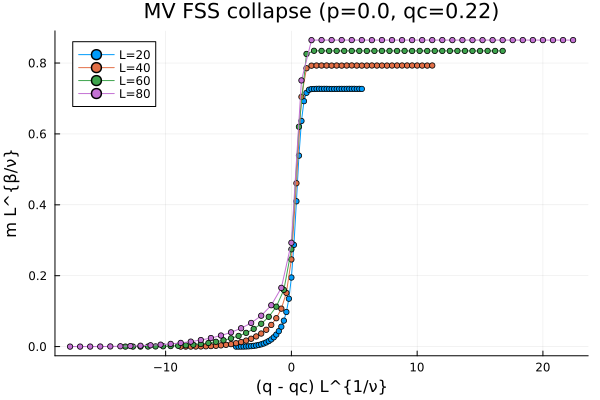

In [144]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qs   = 0.0:0.01:0.5
qc   = 0.22
ν    = 1.0
β_ν  = 1/8   # β/ν for 2D Ising
z    = 2.17
t(L) = round(Int, T * (L / maximum(Ls))^z)

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][t(L)] for q in valid_qs]
    plot!(plt, (valid_qs .- qc) .* L^(1/ν), M1s .* L^β_ν, m=3, label="L=$L")
end
plot!(plt, xlabel="(q - qc) L^{1/ν}", ylabel="m L^{β/ν}", title="$algo FSS collapse (p=$p, qc=$(round(qc,digits=3)))")
plt

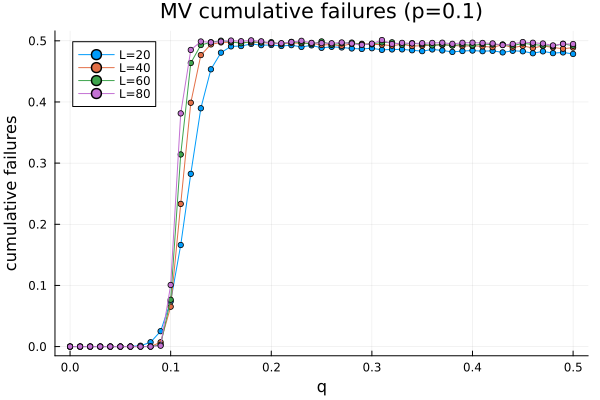

In [378]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.1
qs   = 0.0:0.01:0.5

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    cf = [all_results[(algo, L, T, p, q, NaN)][:instant_failures][10L] for q in valid_qs]
    plot!(plt, valid_qs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="cumulative failures", title="$algo cumulative failures (p=$p)")
plt

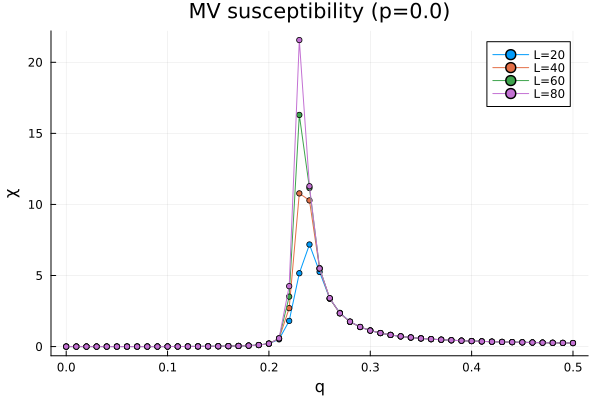

In [127]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qs   = 0.0:0.01:0.5

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][10L] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, NaN)][:M2s][10L] for q in valid_qs]
    plot!(plt, valid_qs, L^2*(M2s - M1s.^2), m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="χ", title="$algo susceptibility (p=$p)")
plt

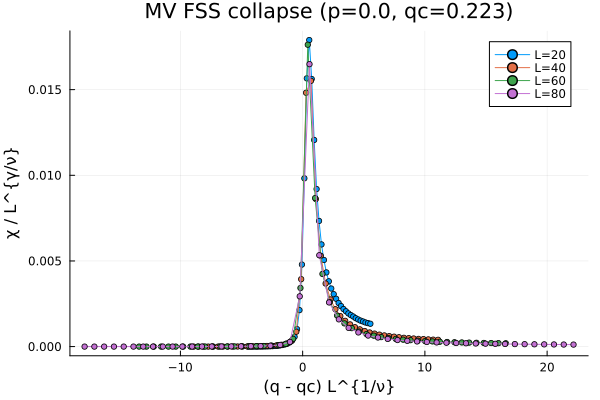

In [430]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qs   = 0.0:0.01:0.5

qc  = 0.223
ν   = 1.0
γ_ν = 7/4
z   = 2.17  # Glauber dynamics, 2D Ising

t(L) = round(Int, T * (L / maximum(Ls))^z)

plt = plot()
for L in Ls
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, NaN)), qs)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][t(L)] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, NaN)][:M2s][t(L)] for q in valid_qs]
    χ = L^2 .* (M2s .- M1s.^2)
    plot!(plt, (valid_qs .- qc) .* L^(1/ν), χ ./ L^γ_ν, m=3, label="L=$L")
end
plot!(plt, xlabel="(q - qc) L^{1/ν}", ylabel="χ / L^{γ/ν}", title="$algo FSS collapse (p=$p, qc=$(round(qc,digits=3)))")
plt

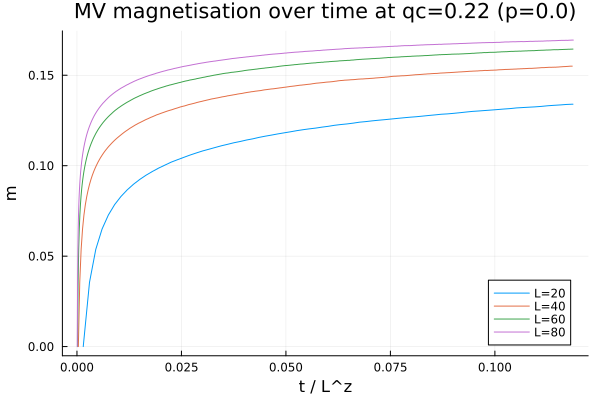

In [442]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qc   = 0.22
z    = 2.17

scaled_ts = [collect(1:length(all_results[(algo, L, T, p, qc, NaN)][:M1s])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, T, p, qc, NaN))]
t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    haskey(all_results, (algo, L, T, p, qc, NaN)) || continue
    M1s = all_results[(algo, L, T, p, qc, NaN)][:M1s]
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], M1s[mask], label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="m", title="$algo magnetisation over time at qc=$qc (p=$p)")
plt

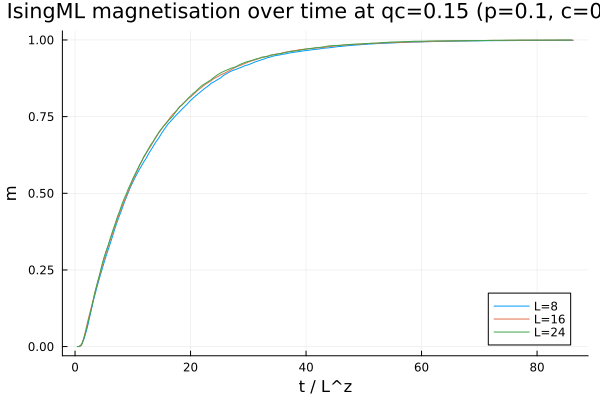

In [479]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.1
qc   = 0.15
c    = 0.35
z    = 0.3

scaled_ts = [collect(1:length(all_results[(algo, L, 20L, p, qc, c)][:cumulative_failures])) ./ L^z
             for L in Ls if haskey(all_results, (algo, L, 20L, p, qc, c))]
t_max = minimum(maximum.(scaled_ts))

plt = plot()
for L in Ls
    haskey(all_results, (algo, L, 20L, p, qc, c)) || continue
    M1s = all_results[(algo, L, 20L, p, qc, c)][:cumulative_failures]
    ts  = collect(1:length(M1s)) ./ L^z
    mask = ts .<= t_max
    plot!(plt, ts[mask], M1s[mask], label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="m", title="$algo magnetisation over time at qc=$qc (p=$p, c=$c)")
plt

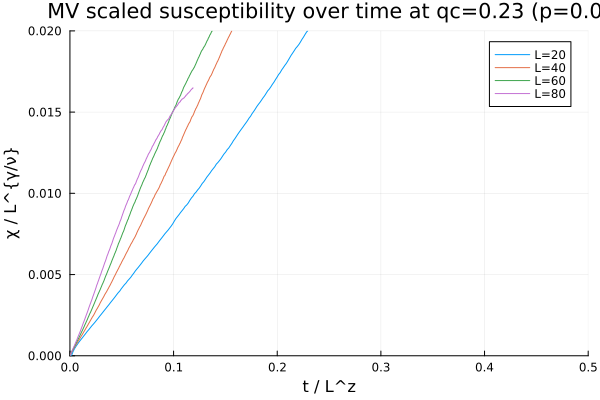

In [434]:
algo = "MV"
T    = 1600
Ls   = 20:20:80
p    = 0.0
qc   = 0.23
γ_ν  = 7/4
z    = 2.17

plt = plot()
for L in Ls
    haskey(all_results, (algo, L, T, p, qc, NaN)) || continue
    M1s = all_results[(algo, L, T, p, qc, NaN)][:M1s]
    M2s = all_results[(algo, L, T, p, qc, NaN)][:M2s]
    χ = L^2 .* (M2s .- M1s.^2)
    ts = collect(1:length(χ))
    plot!(plt, ts ./ L^z, χ ./ L^γ_ν, label="L=$L")
end
plot!(plt, xlabel="t / L^z", ylabel="χ / L^{γ/ν}", title="$algo scaled susceptibility over time at qc=$qc (p=$p)")
plot!(plt, xlim=(0.0,0.5), ylim=(0.0,0.02))

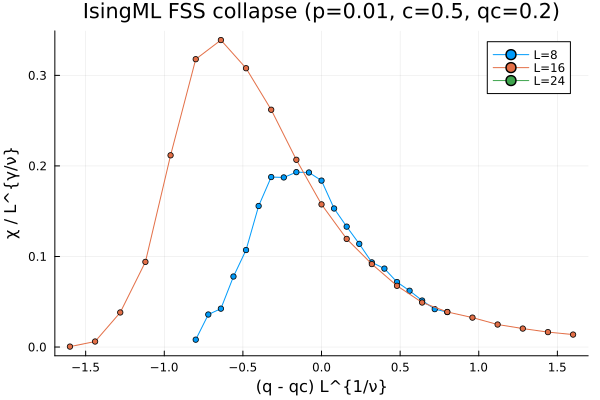

In [514]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.01
qs   = 0.0:0.01:0.5
c    = 0.5
qc   = 0.2
ν    = 1.0
γ_ν  = 7/4
z    = 2.17
t(L) = round(Int, 20L * (L / maximum(Ls))^z)

plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    M1s = [all_results[(algo, L, T, p, q, c)][:M1s][t(L)] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, c)][:M2s][t(L)] for q in valid_qs]
    χ = L^2 .* (M2s .- M1s.^2)
    plot!(plt, (valid_qs .- qc) .* L^(1/ν), χ ./ L^γ_ν, m=3, label="L=$L")
end
plot!(plt, xlabel="(q - qc) L^{1/ν}", ylabel="χ / L^{γ/ν}", title="$algo FSS collapse (p=$p, c=$c, qc=$(round(qc,digits=3)))")
plt

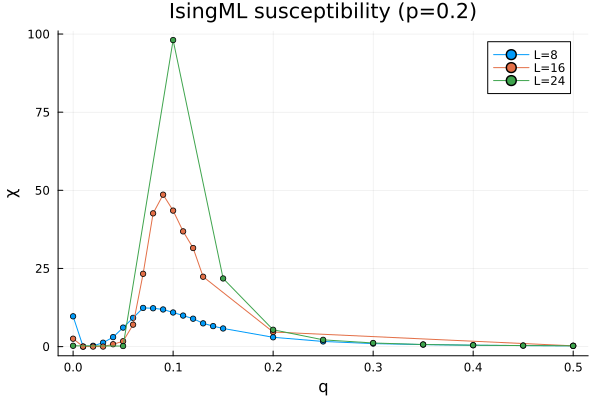

In [539]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.2
qs   = 0.0:0.01:0.5
c    = 0.4

plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    M1s = [all_results[(algo, L, T, p, q, c)][:M1s][10L] for q in valid_qs]
    M2s = [all_results[(algo, L, T, p, q, c)][:M2s][10L] for q in valid_qs]
    plot!(plt, valid_qs, L^2*(M2s - M1s.^2), m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="χ", title="$algo susceptibility (p=$p)")
plt

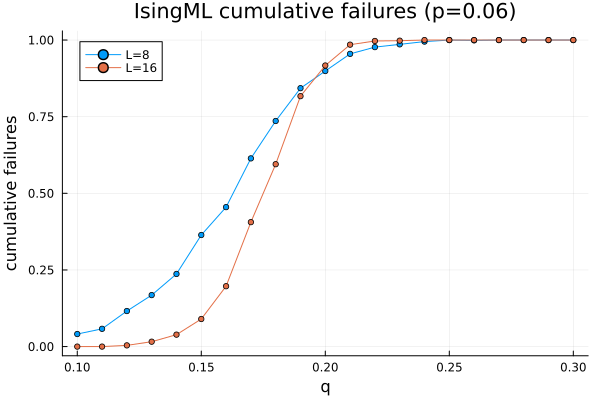

In [328]:
algo = "IsingML"
Ls   = 8:8:16
p    = 0.06
qs   = 0.0:0.01:0.5
c    = 0.05

plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for q in valid_qs]
    plot!(plt, valid_qs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="cumulative failures", title="$algo cumulative failures (p=$p)")
plt

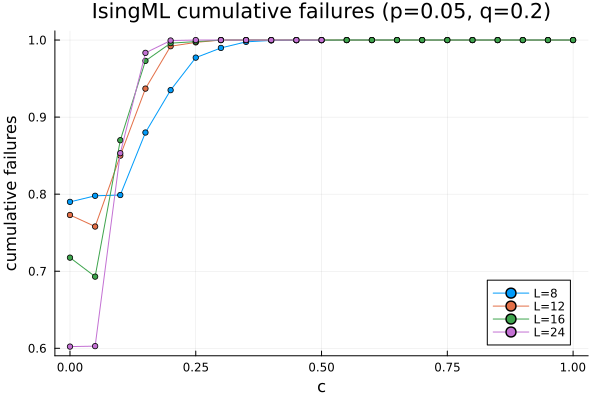

In [559]:
algo = "IsingML"
Ls   = [8,12,16,24]
p    = 0.05
cs   = 0.0:0.05:1.0
q    = 0.2

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

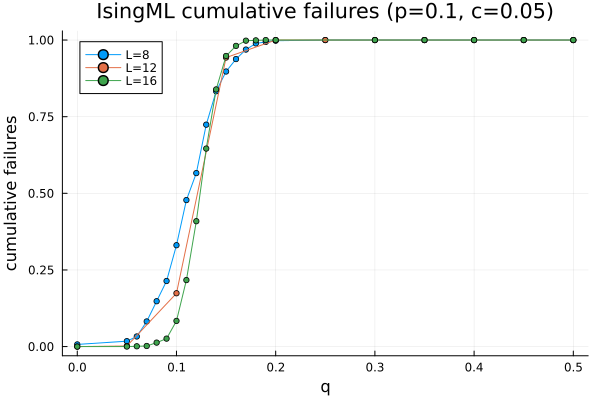

In [553]:
algo = "IsingML"
Ls   = [8,12,16]
p    = 0.1
qs   = 0.0:0.01:0.5
c    = 0.05

plt = plot()
for L in Ls
    T = 20L
    valid_qs = filter(q -> haskey(all_results, (algo, L, T, p, q, c)), qs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for q in valid_qs]
    plot!(plt, valid_qs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="q", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, c=$c)")
plt

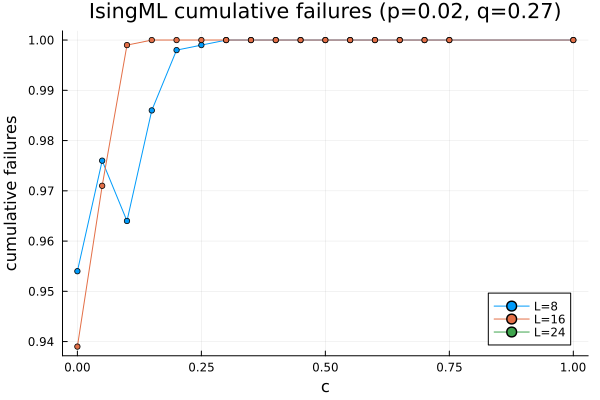

In [351]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.02
cs   = 0.0:0.05:1.0
q    = 0.27

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

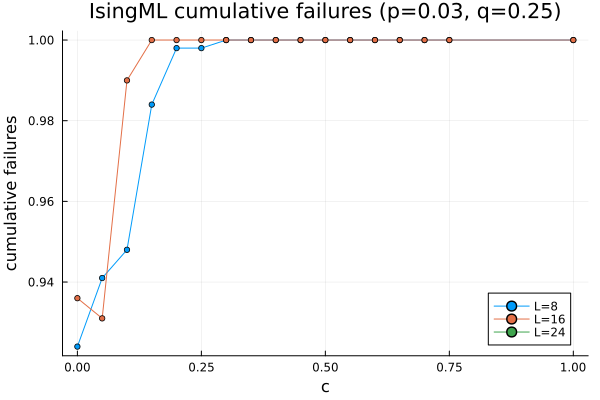

In [312]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.03
cs   = 0.0:0.05:1.0
q    = 0.25

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

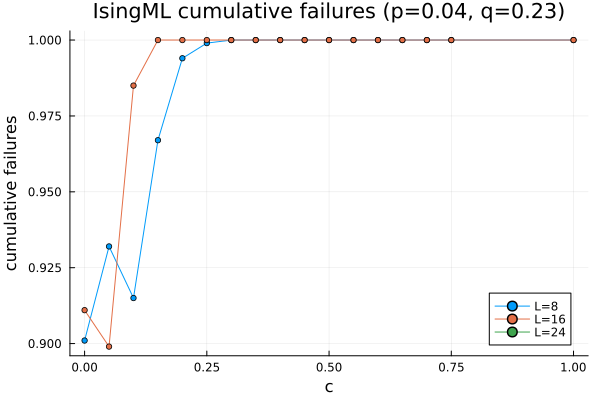

In [321]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.04
cs   = 0.0:0.05:1.0
q    = 0.23

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

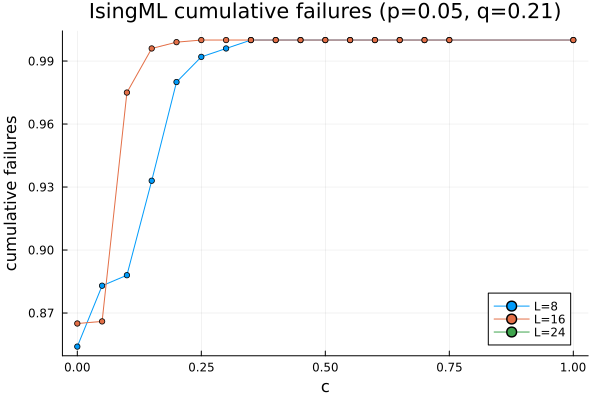

In [324]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.05
cs   = 0.0:0.05:1.0
q    = 0.21

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

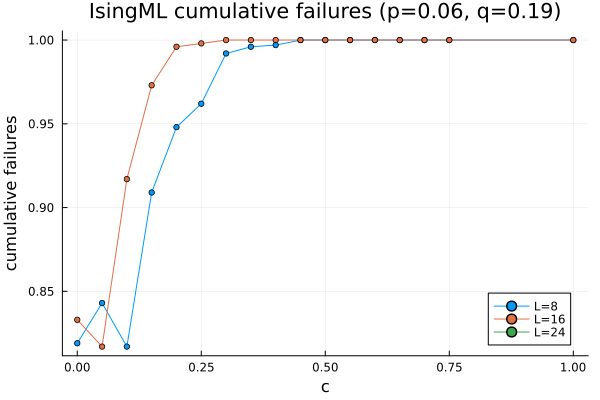

In [327]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.06
cs   = 0.0:0.05:1.0
q    = 0.19

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

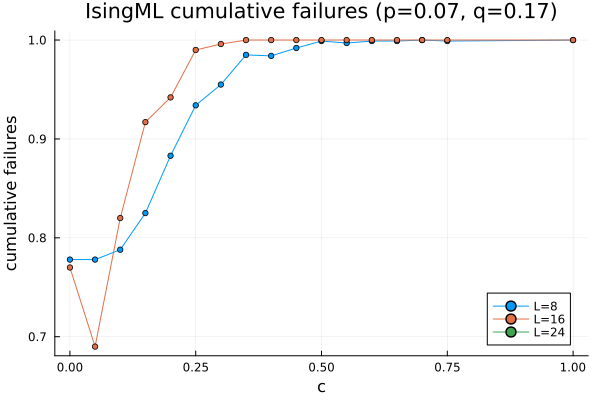

In [331]:
algo = "IsingML"
Ls   = 8:8:24
p    = 0.07
cs   = 0.0:0.05:1.0
q    = 0.17

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

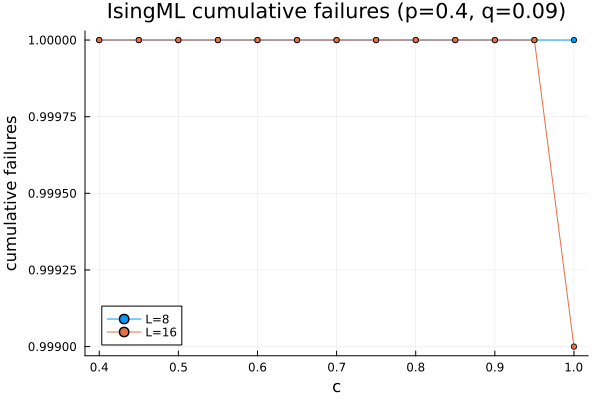

In [407]:
algo = "IsingML"
Ls   = 8:8:16
p    = 0.4
cs   = 0.0:0.05:1.0
q    = 0.09

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

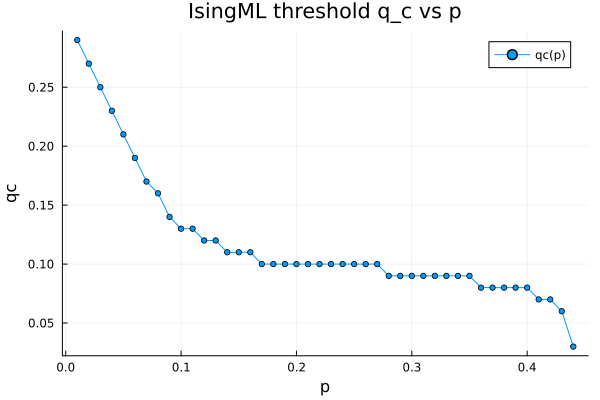

In [377]:
function find_qc(algo, p, Ls, cs, ps_q; cf_threshold=0.95, min_advantage=0.0)
    qc = NaN
    for q in reverse(ps_q)
        for L_small in [minimum(Ls)], L_large in [maximum(Ls)]
            T_small = 20L_small
            T_large = 20L_large
            valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
            valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
            common_cs = intersect(valid_cs_small, valid_cs_large)
            isempty(common_cs) && continue
            cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][10L_small] for c in common_cs]
            cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][10L_large] for c in common_cs]
            # exists a c where large L beats small L and neither is near 1
            if any(cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold)
                qc = q
                break
            end
        end
        !isnan(qc) && break
    end
    return qc
end

algo = "IsingML"
Ls   = 8:8:16
ps   = 0.01:0.01:0.5
qs   = 0.0:0.01:0.5
cs   = 0.0:0.05:1.0

qcs = [find_qc(algo, p, Ls, cs, qs; cf_threshold=0.99, min_advantage=0.0) for p in ps]

plt = plot()
valid = .!isnan.(qcs)
plot!(plt, ps[valid], qcs[valid], m=3, label="qc(p)")
plot!(plt, xlabel="p", ylabel="qc", title="$algo threshold q_c vs p")
plt

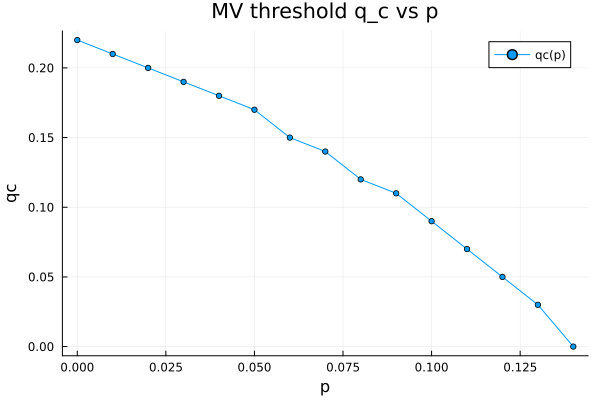

In [380]:
function find_qc_MV(algo, p, Ls, qs, T; cf_threshold=0.95)
    for q in reverse(qs)
        cfs = Float64[]
        for L in Ls
            haskey(all_results, (algo, L, T, p, q, NaN)) || break
            push!(cfs, all_results[(algo, L, T, p, q, NaN)][:cumulative_failures][10L])
        end
        length(cfs) < length(Ls) && continue
        # failure rate decreasing with L and not near 1
        if issorted(cfs, rev=true) && last(cfs) < cf_threshold
            return q
        end
    end
    return NaN
end

algo = "MV"
T    = 1600
Ls   = 20:20:80
ps   = 0.0:0.01:0.3
qs   = 0.0:0.01:0.5

qcs = [find_qc_MV(algo, p, Ls, qs, T) for p in ps]

plt = plot()
valid = .!isnan.(qcs)
plot!(plt, ps[valid], qcs[valid], m=3, label="qc(p)")
plot!(plt, xlabel="p", ylabel="qc", title="$algo threshold q_c vs p")
plt

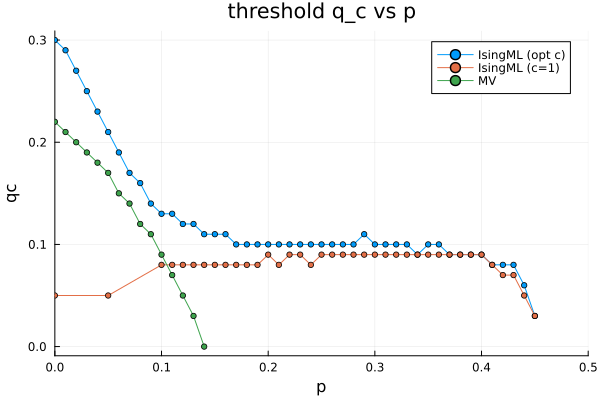

In [411]:
function find_qc_IsingML(algo, p, Ls, cs, qs; cf_threshold=0.95, min_advantage=0.0)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
        valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
        common_cs = intersect(valid_cs_small, valid_cs_large)
        isempty(common_cs) && continue
        cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][10L_small] for c in common_cs]
        cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][10L_large] for c in common_cs]
        any(cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold) && return q
    end
    return NaN
end

function find_qc_MV(algo, p, Ls, qs, T; cf_threshold=0.95)
    for q in reverse(qs)
        cfs = Float64[]
        for L in Ls
            haskey(all_results, (algo, L, T, p, q, NaN)) || break
            push!(cfs, all_results[(algo, L, T, p, q, NaN)][:cumulative_failures][10L])
        end
        length(cfs) < length(Ls) && continue
        issorted(cfs, rev=true) && last(cfs) < cf_threshold && return q
    end
    return NaN
end

function find_qc_IsingML_fixed_c(algo, p, Ls, qs, c; cf_threshold=0.95)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        haskey(all_results, (algo, L_small, T_small, p, q, c)) || continue
        haskey(all_results, (algo, L_large, T_large, p, q, c)) || continue
        cf_small = all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][10L_small]
        cf_large = all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][10L_large]
        cf_large < cf_small && cf_large < cf_threshold && return q
    end
    return NaN
end

ps_ising = 0.00:0.01:0.5
ps_mv    = 0.0:0.01:0.5

qcs_ising    = [find_qc_IsingML("IsingML", p, 8:8:16, 0.0:0.05:1.0, 0.0:0.01:0.5; cf_threshold=1.0) for p in ps_ising]
qcs_ising_c1 = [find_qc_IsingML_fixed_c("IsingML", p, 8:8:16, 0.0:0.01:0.5, 1.0; cf_threshold=1.0) for p in ps_ising]
qcs_mv       = [find_qc_MV("MV", p, 20:20:80, 0.0:0.01:0.5, 1600) for p in ps_mv]

plt = plot()
valid_ising    = .!isnan.(qcs_ising)
valid_ising_c1 = .!isnan.(qcs_ising_c1)
valid_mv       = .!isnan.(qcs_mv)
plot!(plt, ps_ising[valid_ising],    qcs_ising[valid_ising],       m=3, label="IsingML (opt c)")
plot!(plt, ps_ising[valid_ising_c1], qcs_ising_c1[valid_ising_c1], m=3, label="IsingML (c=1)")
plot!(plt, ps_mv[valid_mv],          qcs_mv[valid_mv],             m=3, label="MV")
plot!(plt, xlabel="p", ylabel="qc", title="threshold q_c vs p", xlim=(0,0.5))
plt

In [595]:
function find_qc_IsingML_with_c(algo, p, Ls, cs, qs; cf_threshold=0.95, min_advantage=0.0)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
        valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
        common_cs = intersect(valid_cs_small, valid_cs_large)
        isempty(common_cs) && continue
        cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][10L_small] for c in common_cs]
        cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][10L_large] for c in common_cs]
        mask = cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold
        if any(mask)
            valid_cs  = common_cs[mask]
            cf_small_v = cf_small[mask]
            cf_large_v = cf_large[mask]
            best_c = valid_cs[argmax(cf_small_v .- cf_large_v)]
            return q, minimum(valid_cs), maximum(valid_cs), best_c
        end
    end
    return NaN, NaN, NaN, NaN
end

ps_ising = 0.01:0.01:0.5
results_ising = [find_qc_IsingML_with_c("IsingML", p, 8:8:16, 0.0:0.05:1.0, 0.0:0.01:0.5; cf_threshold=1.0) for p in ps_ising]
qcs_ising, cs_min, cs_max, cs_best = zip(results_ising...)

valid    = .!isnan.(collect(qcs_ising))
ps_v     = ps_ising[valid]
cs_min_v  = collect(cs_min)[valid]
cs_max_v  = collect(cs_max)[valid]
cs_best_v = collect(cs_best)[valid]

plt_qc = plot()
plt_c  = plot()
plot!(plt_qc, ps_v, collect(qcs_ising)[valid], m=3, label="IsingML (opt c)")
plot!(plt_qc, xlabel="p", ylabel="qc", title="threshold q_c vs p")
plot!(plt_c, ps_v, cs_min_v,  m=3, label="c min")
plot!(plt_c, ps_v, cs_max_v,  m=3, label="c max")
plot!(plt_c, ps_v, cs_best_v, m=3, label="c best")
plot!(plt_c, ps_v, 4 .* ps_v .* (1 .- ps_v), label="4p(1-p)", linestyle=:dash)
plot!(plt_c, xlabel="p", ylabel="optimal c", title="optimal c range vs p")
plot!(plt_c .^ 2, xlabel="p", ylabel="optimal c", title="optimal c range vs p")
plot(plt_c)


MethodError: MethodError: no method matching iterate(::Plots.Plot{Plots.GRBackend}, ::Int64)
The function `iterate` exists, but no method is defined for this combination of argument types.

Closest candidates are:
  iterate(!Matched::Compiler.BitSetBoundedMinPrioritySet, ::Any...)
   @ Base ~/.julia/juliaup/julia-1.12.5+0.aarch64.apple.darwin14/Julia-1.12.app/Contents/Resources/julia/share/julia/Compiler/src/inferencestate.jl:68
  iterate(!Matched::Compiler.ForwardToBackedgeIterator, ::Int64)
   @ Base ~/.julia/juliaup/julia-1.12.5+0.aarch64.apple.darwin14/Julia-1.12.app/Contents/Resources/julia/share/julia/Compiler/src/typeinfer.jl:582
  iterate(!Matched::LazyString, ::Integer)
   @ Base strings/lazy.jl:95
  ...


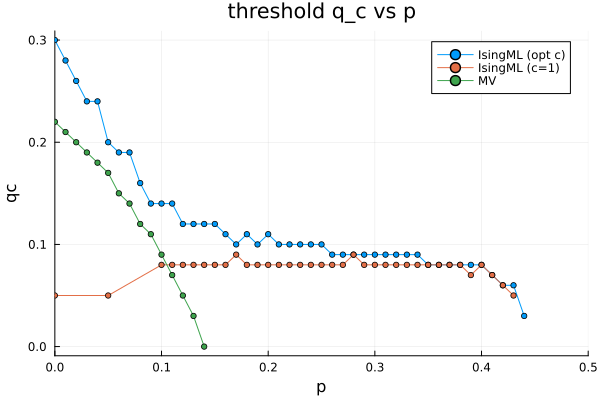

In [415]:
function find_qc_IsingML(algo, p, Ls, cs, qs; cf_threshold=0.95, min_advantage=0.0)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
        valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
        common_cs = intersect(valid_cs_small, valid_cs_large)
        isempty(common_cs) && continue
        cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][20L_small] for c in common_cs]
        cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][20L_large] for c in common_cs]
        any(cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold) && return q
    end
    return NaN
end

function find_qc_MV(algo, p, Ls, qs, T; cf_threshold=0.95)
    for q in reverse(qs)
        cfs = Float64[]
        for L in Ls
            haskey(all_results, (algo, L, T, p, q, NaN)) || break
            push!(cfs, all_results[(algo, L, T, p, q, NaN)][:cumulative_failures][10L])
        end
        length(cfs) < length(Ls) && continue
        issorted(cfs, rev=true) && last(cfs) < cf_threshold && return q
    end
    return NaN
end

function find_qc_IsingML_fixed_c(algo, p, Ls, qs, c; cf_threshold=0.95)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        haskey(all_results, (algo, L_small, T_small, p, q, c)) || continue
        haskey(all_results, (algo, L_large, T_large, p, q, c)) || continue
        cf_small = all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][20L_small]
        cf_large = all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][20L_large]
        cf_large < cf_small && cf_large < cf_threshold && return q
    end
    return NaN
end

ps_ising = 0.00:0.01:0.5
ps_mv    = 0.0:0.01:0.5

qcs_ising    = [find_qc_IsingML("IsingML", p, 8:8:16, 0.0:0.05:1.0, 0.0:0.01:0.5; cf_threshold=1.0) for p in ps_ising]
qcs_ising_c1 = [find_qc_IsingML_fixed_c("IsingML", p, 8:8:16, 0.0:0.01:0.5, 1.0; cf_threshold=1.0) for p in ps_ising]
qcs_mv       = [find_qc_MV("MV", p, 20:20:80, 0.0:0.01:0.5, 1600) for p in ps_mv]

plt = plot()
valid_ising    = .!isnan.(qcs_ising)
valid_ising_c1 = .!isnan.(qcs_ising_c1)
valid_mv       = .!isnan.(qcs_mv)
plot!(plt, ps_ising[valid_ising],    qcs_ising[valid_ising],       m=3, label="IsingML (opt c)")
plot!(plt, ps_ising[valid_ising_c1], qcs_ising_c1[valid_ising_c1], m=3, label="IsingML (c=1)")
plot!(plt, ps_mv[valid_mv],          qcs_mv[valid_mv],             m=3, label="MV")
plot!(plt, xlabel="p", ylabel="qc", title="threshold q_c vs p", xlim=(0,0.5))
plt

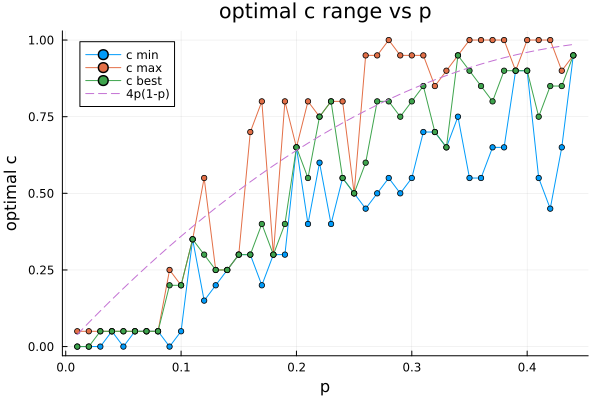

In [46]:
function find_qc_IsingML_with_c(algo, p, Ls, cs, qs; cf_threshold=0.95, min_advantage=0.0)
    L_small, L_large = minimum(Ls), maximum(Ls)
    T_small, T_large = 20L_small, 20L_large
    for q in reverse(qs)
        valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
        valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
        common_cs = intersect(valid_cs_small, valid_cs_large)
        isempty(common_cs) && continue
        cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][20L_small] for c in common_cs]
        cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][20L_large] for c in common_cs]
        mask = cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold
        if any(mask)
            valid_cs  = common_cs[mask]
            cf_small_v = cf_small[mask]
            cf_large_v = cf_large[mask]
            best_c = valid_cs[argmax(cf_small_v .- cf_large_v)]
            return q, minimum(valid_cs), maximum(valid_cs), best_c
        end
    end
    return NaN, NaN, NaN, NaN
end

ps_ising = 0.01:0.01:0.5
results_ising = [find_qc_IsingML_with_c("IsingML", p, 8:8:16, 0.0:0.05:1.0, 0.0:0.01:0.5; cf_threshold=1.0) for p in ps_ising]
qcs_ising, cs_min, cs_max, cs_best = zip(results_ising...)

valid    = .!isnan.(collect(qcs_ising))
ps_v     = ps_ising[valid]
cs_min_v  = collect(cs_min)[valid]
cs_max_v  = collect(cs_max)[valid]
cs_best_v = collect(cs_best)[valid]

plt_qc = plot()
plt_c  = plot()
plot!(plt_qc, ps_v, collect(qcs_ising)[valid], m=3, label="IsingML (opt c)")
plot!(plt_qc, xlabel="p", ylabel="qc", title="threshold q_c vs p")
plot!(plt_c, ps_v, cs_min_v,  m=3, label="c min")
plot!(plt_c, ps_v, cs_max_v,  m=3, label="c max")
plot!(plt_c, ps_v, cs_best_v, m=3, label="c best")
plot!(plt_c, ps_v, 4 .* ps_v .* (1 .- ps_v), label="4p(1-p)", linestyle=:dash)
# plot!(plt_c, ps_v, (4 .* ps_v .* (1 .- ps_v)) .^ 4, label="4p(1-p)", linestyle=:dash)
plot!(plt_c, xlabel="p", ylabel="optimal c", title="optimal c range vs p")
plot(plt_c)

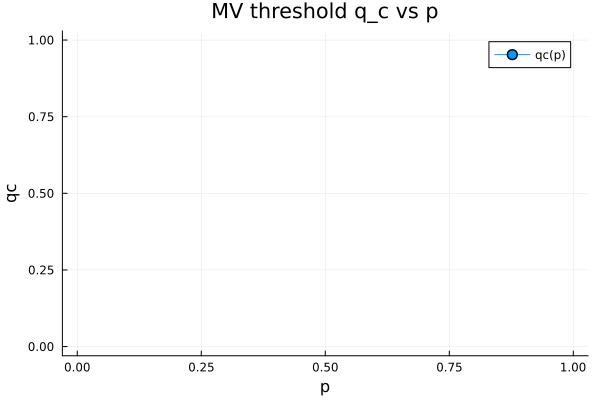

In [379]:
function find_qc(algo, p, Ls, cs, ps_q; cf_threshold=0.95, min_advantage=0.0)
    qc = NaN
    for q in reverse(ps_q)
        for L_small in [minimum(Ls)], L_large in [maximum(Ls)]
            T_small = 20L_small
            T_large = 20L_large
            valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
            valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
            common_cs = intersect(valid_cs_small, valid_cs_large)
            isempty(common_cs) && continue
            cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][10L_small] for c in common_cs]
            cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][10L_large] for c in common_cs]
            # exists a c where large L beats small L and neither is near 1
            if any(cf_large .< cf_small .- min_advantage .&& cf_large .< cf_threshold)
                qc = q
                break
            end
        end
        !isnan(qc) && break
    end
    return qc
end

algo = "MV"
Ls   = 20:20:80
ps   = 0.01:0.01:0.5
qs   = 0.0:0.01:0.5
cs   = 0.0:0.05:1.0

qcs = [find_qc(algo, p, Ls, cs, qs; cf_threshold=0.99, min_advantage=0.0) for p in ps]

plt = plot()
valid = .!isnan.(qcs)
plot!(plt, ps[valid], qcs[valid], m=3, label="qc(p)")
plot!(plt, xlabel="p", ylabel="qc", title="$algo threshold q_c vs p")
plt

In [370]:
find_qc(algo, 0.01, [8,16], cs, [0.29])

[0.967, 0.97, 0.976, 0.994, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0] vs [0.953, 0.982, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


NaN

In [364]:
    p = 0.01
    min_advantage = 0.0
    cf_threshold = 0.95
    q = 0.29
    L_small = minimum(Ls)
    L_large = maximum(Ls)
                T_small = 20L_small
                T_large = 20L_large
                valid_cs_small = filter(c -> haskey(all_results, (algo, L_small, T_small, p, q, c)), cs)
                valid_cs_large = filter(c -> haskey(all_results, (algo, L_large, T_large, p, q, c)), cs)
                common_cs = intersect(valid_cs_small, valid_cs_large)
                cf_small = [all_results[(algo, L_small, T_small, p, q, c)][:cumulative_failures][10L_small] for c in common_cs]
                cf_large = [all_results[(algo, L_large, T_large, p, q, c)][:cumulative_failures][10L_large] for c in common_cs]
                # exists a c where large L beats small L and neither is near 1

[cf_small cf_large]


17×2 Matrix{Float64}:
 0.967  0.953
 0.97   0.982
 0.976  1.0
 0.994  1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0
 1.0    1.0

In [358]:
Ls

8:8:16

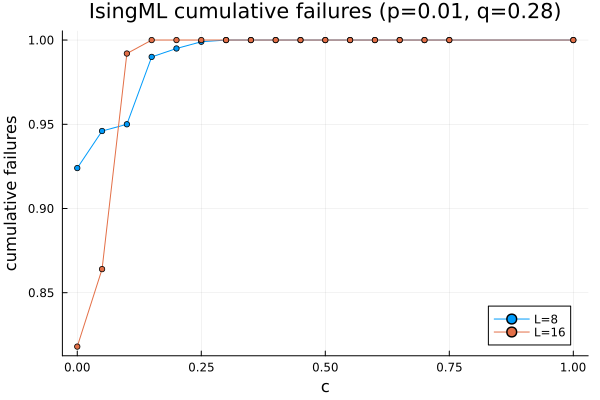

In [350]:
algo = "IsingML"
Ls   = 8:8:16
p    = 0.01
cs   = 0.0:0.05:1.0
q    = 0.28

plt = plot()
for L in Ls
    T = 20L
    valid_cs = filter(c -> haskey(all_results, (algo, L, T, p, q, c)), cs)
    cf = [all_results[(algo, L, T, p, q, c)][:cumulative_failures][10L] for c in valid_cs]
    plot!(plt, valid_cs, cf, m=3, label="L=$L")
end
plot!(plt, xlabel="c", ylabel="cumulative failures", title="$algo cumulative failures (p=$p, q=$q)")
plt

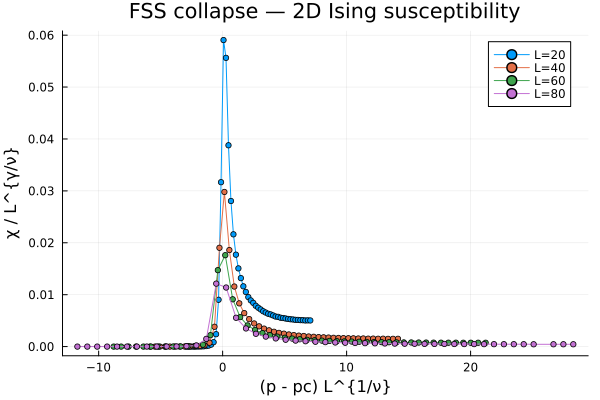

In [ ]:
plt = plot()

# 2D Ising critical exponents
pc    = 
ν     = 1.0
γ_ν   = 7/4   # γ/ν
q = 0.0

for L in 20:20:80
    algo = "MV"
    T = 1600
    ps = 0.0:0.01:0.5
    valid_ps = filter(p -> haskey(all_results, (algo, L, T, p, q, NaN)), ps)
    M1s = [all_results[(algo, L, T, p, q, NaN)][:M1s][10L] for p in valid_ps]
    M2s = [all_results[(algo, L, T, p, q, NaN)][:M2s][10L] for p in valid_ps]

    χ  = L^2 .* (M2s .- M1s .^ 2)
    x  = [(p - pc) * L^(1/ν) for p in valid_ps]   # scaled distance from pc
    y  = χ ./ L^γ_ν                                 # scaled susceptibility

    plot!(plt, x, y, m=3, label="L=$L")
end

xlabel!(plt, "(p - pс) L^{1/ν}")
ylabel!(plt, "χ / L^{γ/ν}")
title!(plt, "FSS collapse — 2D Ising susceptibility")
plt

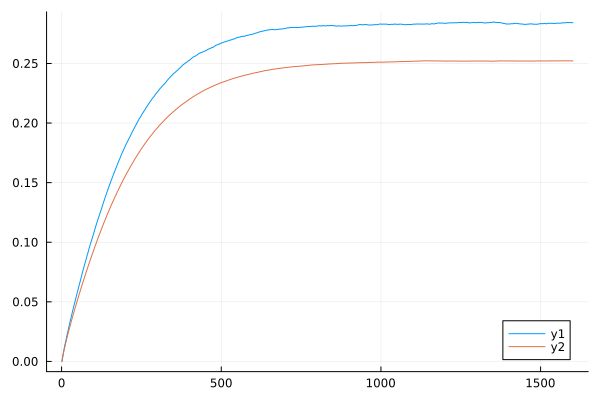

In [98]:
plot(all_results[ ("MV", 20, 1600, 0.13, 0.06, NaN)][:M2s])
plot!(all_results[ ("MV", 80, 1600, 0.13, 0.06, NaN)][:M2s])

In [20]:
[key for key in keys(all_results) if key[1] == "MV"]

10390-element Vector{Tuple{String, Int64, Int64, Float64, Float64, Float64}}:
 ("MV", 20, 1600, 0.29, 0.06, NaN)
 ("MV", 80, 1600, 0.02, 0.16, NaN)
 ("MV", 40, 1600, 0.38, 0.48, NaN)
 ("MV", 60, 1600, 0.31, 0.09, NaN)
 ("MV", 40, 1600, 0.1, 0.35, NaN)
 ("MV", 20, 1600, 0.18, 0.39, NaN)
 ("MV", 60, 1600, 0.27, 0.49, NaN)
 ("MV", 60, 1600, 0.36, 0.21, NaN)
 ("MV", 20, 1600, 0.02, 0.41, NaN)
 ("MV", 80, 1600, 0.07, 0.05, NaN)
 ⋮
 ("MV", 40, 1600, 0.39, 0.47, NaN)
 ("MV", 40, 1600, 0.22, 0.26, NaN)
 ("MV", 40, 1600, 0.23, 0.34, NaN)
 ("MV", 80, 1600, 0.4, 0.34, NaN)
 ("MV", 80, 1600, 0.06, 0.33, NaN)
 ("MV", 80, 1600, 0.23, 0.09, NaN)
 ("MV", 80, 1600, 0.46, 0.3, NaN)
 ("MV", 40, 1600, 0.28, 0.5, NaN)
 ("MV", 40, 1600, 0.16, 0.02, NaN)

In [58]:
load("../output/MV_L20_sweep/sample_algo=MV_L=20_T=1600_p=0p250_q=0p180_samples=100000_20260413_110423_784358435.jld2")["M1s"]

1601-element Vector{Float64}:
 0.0
 0.1926728250000017
 0.30385205000000143
 0.3736428500000053
 0.4184528750000041
 0.44722184999999764
 0.4658940249999996
 0.47798054999999307
 0.4857557249999958
 0.4906581000000037
 ⋮
 0.5001173499999998
 0.5000459250000002
 0.4999346499999988
 0.49987242500000323
 0.4998458749999971
 0.5000566250000033
 0.5000852499999981
 0.5000467750000033
 0.49990375000000037

In [60]:
load("../output/MV_L80_sweep/sample_algo=MV_L=80_T=1600_p=0p250_q=0p180_samples=100000_20260410_030808_602813272.jld2")["M1s"]

1601-element Vector{Float64}:
 0.0
 0.1926677874999984
 0.3037557390625016
 0.3736203500000022
 0.4184373281249994
 0.4472871468750008
 0.46594229999999753
 0.47795395937500085
 0.48577264375000334
 0.49083976562500037
 ⋮
 0.49998338437499895
 0.5000126250000015
 0.4999640984375071
 0.4999618609374892
 0.4999684609375007
 0.4999970750000001
 0.5000218218749979
 0.4999516046874989
 0.49991891406250977

In [61]:
using JLD2, Plots

using ArgParse
using Dates
# using JLD2
using Printf

using StatsBase
using Graphs
using SimpleWeightedGraphs
using GraphsMatching
using SpecialFunctions


In [62]:
const ROOT = normpath(joinpath(@__DIR__, ".."))

include(joinpath(ROOT, "src", "circuits.jl"))
include(joinpath(ROOT, "src", "local.jl"))
include(joinpath(ROOT, "src", "main.jl"))
include(joinpath(ROOT, "src", "mwpm.jl"))

track_domains (generic function with 1 method)

In [82]:
algo = "MV"
L = 8
T = 16
p = 0.05
q = 0.05
samples = 100000

data8 = sample(L, T, p, q, MajorityVote(), samples)

([0.0, 0.0054215625, 0.00651140625, 0.0068215625, 0.0070140625, 0.007083125, 0.0071625, 0.00722515625, 0.007250625, 0.00721203125, 0.007256875, 0.00718875, 0.007250625, 0.00728296875, 0.00723125, 0.0072325, 0.007231875], [0.0, 0.0001381982421875, 0.00018352294921875, 0.00020146484375, 0.0002134130859375, 0.0002153173828125, 0.000221279296875, 0.00022708740234375, 0.000226171875, 0.00022746337890625, 0.0002312939453125, 0.0002273681640625, 0.000232431640625, 0.00023247314453125, 0.0002301953125, 0.00023046875, 0.000229677734375], [112.0, 109.68082, 109.24256, 109.1411, 109.07708, 109.05602, 109.03414, 109.01028, 109.00226, 109.02278, 109.00534, 109.03226, 109.01606, 109.00644, 109.02856, 109.0186, 109.01692], [12544.0, 12049.03436, 11957.70848, 11936.8374, 11923.70224, 11918.95124, 11914.63892, 11910.124, 11907.94748, 11912.35628, 11909.02356, 11914.31724, 11911.19196, 11908.9472, 11913.54776, 11911.60568, 11911.16064], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0

In [83]:
algo = "MV"
L = 16
T = 16
p = 0.05
q = 0.05
samples = 100000

data16 = sample(L, T, p, q, MajorityVote(), samples)

([0.0, 0.00541671875, 0.006516171875, 0.006845546875, 0.007029296875, 0.007063046875, 0.0071171484375, 0.0071687109375, 0.0071960546875, 0.0072112890625, 0.0072259765625, 0.00725015625, 0.007212734375, 0.0072302734375, 0.007236015625, 0.0072177734375, 0.00723640625], [0.0, 5.7049560546875e-5, 7.791656494140625e-5, 8.54888916015625e-5, 8.984527587890624e-5, 9.112274169921875e-5, 9.274429321289063e-5, 9.458023071289062e-5, 9.483352661132813e-5, 9.587997436523438e-5, 9.588760375976562e-5, 9.657073974609375e-5, 9.612335205078126e-5, 9.641769409179688e-5, 9.6396484375e-5, 9.647079467773437e-5, 9.694091796875e-5], [480.0, 470.08018, 468.20568, 467.69872, 467.43008, 467.40824, 467.35346, 467.27364, 467.24528, 467.244, 467.2235, 467.18298, 467.26342, 467.22208, 467.21938, 467.25794, 467.22758], [230400.0, 221063.11716, 219324.16296, 218855.87208, 218607.59016, 218587.57944, 218536.78668, 218464.41664, 218436.66944, 218436.91824, 218416.99092, 218379.48108, 218453.95676, 218416.28344, 218412.99

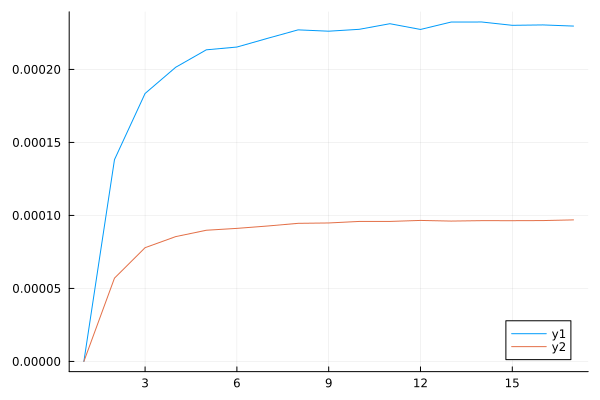

In [87]:
plot(data8[2])
plot!(data16[2])

In [85]:
data8

([0.0, 0.0054215625, 0.00651140625, 0.0068215625, 0.0070140625, 0.007083125, 0.0071625, 0.00722515625, 0.007250625, 0.00721203125, 0.007256875, 0.00718875, 0.007250625, 0.00728296875, 0.00723125, 0.0072325, 0.007231875], [0.0, 0.0001381982421875, 0.00018352294921875, 0.00020146484375, 0.0002134130859375, 0.0002153173828125, 0.000221279296875, 0.00022708740234375, 0.000226171875, 0.00022746337890625, 0.0002312939453125, 0.0002273681640625, 0.000232431640625, 0.00023247314453125, 0.0002301953125, 0.00023046875, 0.000229677734375], [112.0, 109.68082, 109.24256, 109.1411, 109.07708, 109.05602, 109.03414, 109.01028, 109.00226, 109.02278, 109.00534, 109.03226, 109.01606, 109.00644, 109.02856, 109.0186, 109.01692], [12544.0, 12049.03436, 11957.70848, 11936.8374, 11923.70224, 11918.95124, 11914.63892, 11910.124, 11907.94748, 11912.35628, 11909.02356, 11914.31724, 11911.19196, 11908.9472, 11913.54776, 11911.60568, 11911.16064], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0